## 1. Создание предсказательной модели и оценивание её качества.

Считаем данные из скачанной открытой гугл-папки

In [ ]:
import os
import pandas as pd
path = r'C:\Users\User\OneDrive\Документы\mini-course-public' 
data = {}

Data = []
Target = []

i=0
for dir_entry in sorted(os.listdir(path)):
    dir_entry_path = os.path.join(path, dir_entry)
    if os.path.isfile(dir_entry_path):
        i+=1
        with open(dir_entry_path, 'r') as my_file:
            print(dir_entry_path.split("\\")[-1])
            try:
                df = pd.read_csv(my_file, delimiter=';')
                if df.shape[1] == 5:
                    Data.append(df)
                    Target.append(dir_entry_path.split("\\")[-1])
            except UnicodeDecodeError:
                print(dir_entry_path.split("\\")[-1])
                pass

for dir_entry in sorted(os.listdir(path)):
    dir_entry_path = os.path.join(path, dir_entry)
    if os.path.isfile(dir_entry_path):
        i+=1
        with open(dir_entry_path, 'r') as my_file:
            print(dir_entry_path.split("\\")[-1])
            try:
                df = pd.read_csv(my_file, delimiter=',')
                if df.shape[1] == 5:
                    Data.append(df)
                    Target.append(dir_entry_path.split("\\")[-1])
            except UnicodeDecodeError:
                print(dir_entry_path.split("\\")[-1])
                pass

Переведём типы движений в числа

In [122]:
classes = {'тояни' : 0, 'месте' : 0, 'одьб' : 1, 'аг' : 1, 'ег' : 2, 'елоси' : 3, 'естн' : 4, 'одъ' : 4, 
           'втомо' : 5, 'ашин' : 5, 'метро' : 6, 'лектро' : 7, 'амок' : 8}

answers = {'стояние' : 0, 'ходьба' : 1, 'бег' : 2, 'велосипед' : 3, 'лестница' : 4, 
           'автомобиль' : 5, 'метро' : 6, 'электросамокат' : 7, 'самокат' : 8}

# стояние, ходьба, велосипед, лестница, бег, подъем, подъём, автомобиль, электросамокат, машина, метро

In [123]:
def get_action(name):
    for act in classes:
        if name.lower().find(act) != -1:
            return classes[act]
    return -1

Обработаем данные и извлечём признаки для создания модели

In [124]:
def rotation_matrix_from_vectors(vec1, vec2):
    """ Find the rotation matrix that aligns vec1 to vec2
    :param vec1: A 3d "source" vector
    :param vec2: A 3d "destination" vector
    :return mat: A transform matrix (3x3) which when applied to vec1, aligns it with vec2.
    """
    a, b = (vec1 / numpy.linalg.norm(vec1)).reshape(3), (vec2 / numpy.linalg.norm(vec2)).reshape(3)
    v = numpy.cross(a, b)
    if any(v): #if not all zeros then 
        c = numpy.dot(a, b)
        s = numpy.linalg.norm(v)
        kmat = numpy.array([[0, -v[2], v[1]], [v[2], 0, -v[0]], [-v[1], v[0], 0]])
        return numpy.eye(3) + kmat + kmat.dot(kmat) * ((1 - c) / (s ** 2))

    else:
        return numpy.eye(3) #cross of all zeros only occurs on identical directions

In [125]:
def rotate(X, Y, Z, Mat):
    new_x = []
    new_y = []
    new_z = []
    
    for elem in zip(X,Y,Z):
        res = Mat.dot(elem)
        new_x.append(res[0])
        new_y.append(res[1])
        new_z.append(res[2])
        
    return new_x, new_y, new_z

In [126]:
def integrate(lst):
    res = []
    s = 0
    for elem in lst:
        s += elem
        res.append(s)
    return res

Populating the interactive namespace from numpy and matplotlib
Grigory Burmashev - 2021-07-0418.37.42_Бурмашев_стояние.csv
Grigory Burmashev - 2021-07-0418.37.42_Бурмашев_стояние.csv


c:\users\user\appdata\local\programs\python\python39\lib\site-packages\IPython\core\magics\pylab.py:159: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


New means: 4.639762605044991e-17 -8.43593200917271e-17 0.9719961949372941


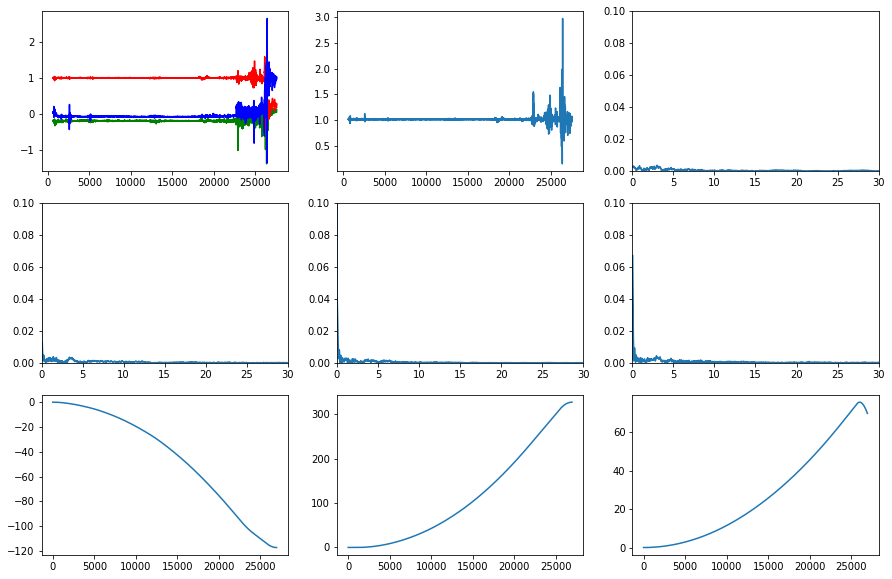

Grigory Burmashev - 2021-07-0418.37.42_Бурмашев_стояние.csv Амплитуда: 2.818181101906656
Grigory Burmashev - 2021-07-0418.37.42_Бурмашев_стояние.csv Среднее: 1.0193883537196637
Grigory Burmashev - 2021-07-0418.42.06_Бурмашев_стояние.csv
Grigory Burmashev - 2021-07-0418.42.06_Бурмашев_стояние.csv
New means: -1.7173886887211154e-17 1.116302647668725e-16 0.9922898165516765


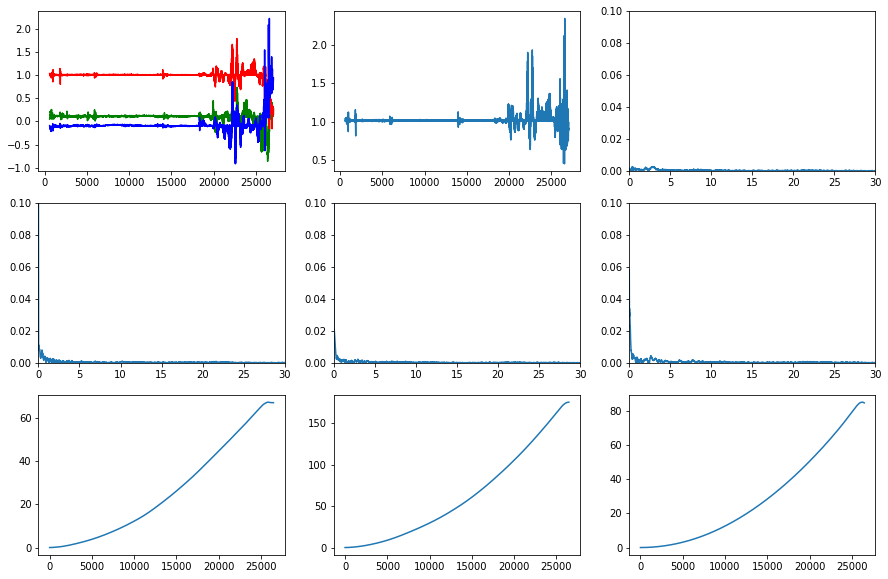

Grigory Burmashev - 2021-07-0418.42.06_Бурмашев_стояние.csv Амплитуда: 1.8902491704382125
Grigory Burmashev - 2021-07-0418.42.06_Бурмашев_стояние.csv Среднее: 1.0183487166407026
Grigory Burmashev - 2021-07-0418.43.28_Бурмашев_стояние.csv
Grigory Burmashev - 2021-07-0418.43.28_Бурмашев_стояние.csv
New means: -2.3222248084323888e-17 -5.1088945785512555e-17 0.9665070716776285


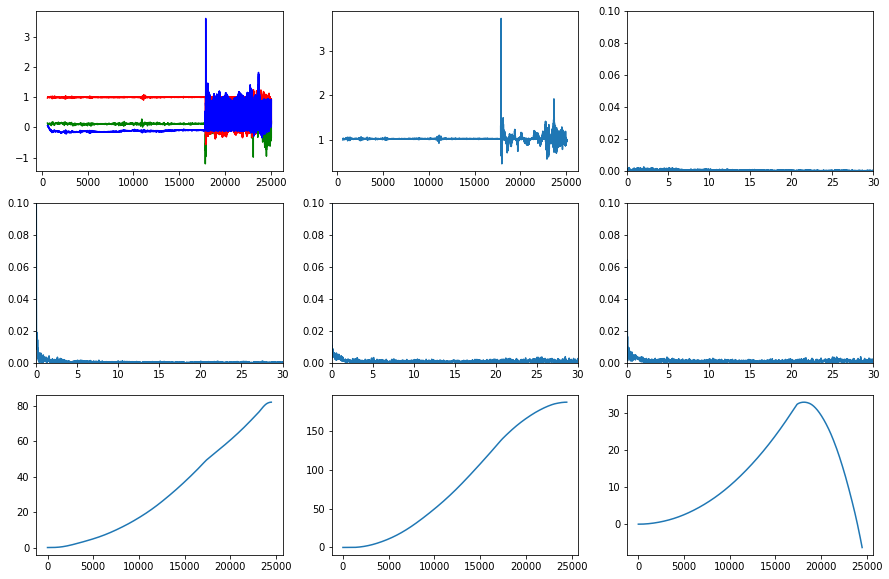

Grigory Burmashev - 2021-07-0418.43.28_Бурмашев_стояние.csv Амплитуда: 3.280368408464594
Grigory Burmashev - 2021-07-0418.43.28_Бурмашев_стояние.csv Среднее: 1.0174165957241406
Grigory Burmashev - 2021-07-0418.50.44_Бурмашев_стояние.csv
Grigory Burmashev - 2021-07-0418.50.44_Бурмашев_стояние.csv
New means: -1.0097376045313553e-17 4.0389504181254213e-17 1.0144506206908188


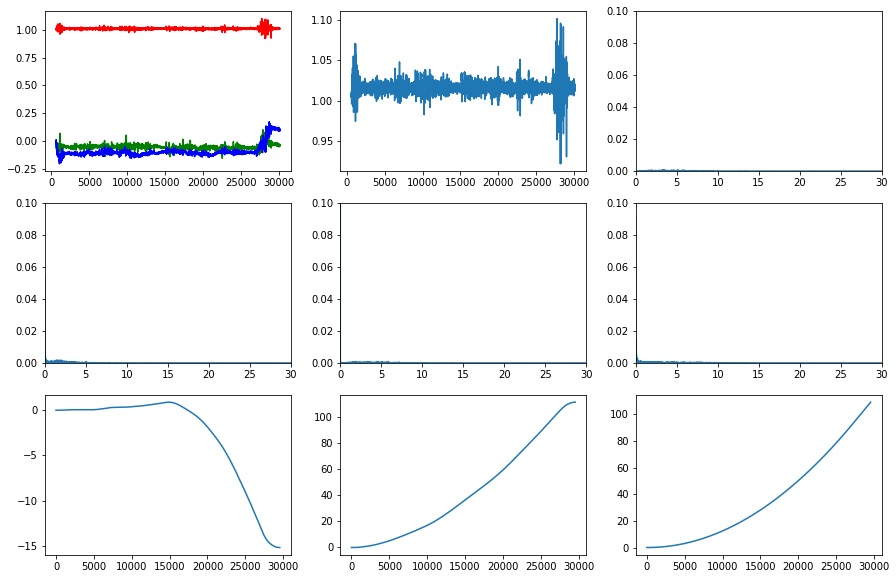

Grigory Burmashev - 2021-07-0418.50.44_Бурмашев_стояние.csv Амплитуда: 0.17933940456643105
Grigory Burmashev - 2021-07-0418.50.44_Бурмашев_стояние.csv Среднее: 1.0162581344444874
Grigory Burmashev - 2021-07-0418.52.08_Бурмашев_стояние.csv
Grigory Burmashev - 2021-07-0418.52.08_Бурмашев_стояние.csv
New means: 4.041610803883965e-17 -1.6993136334512125e-17 1.0100186568789933


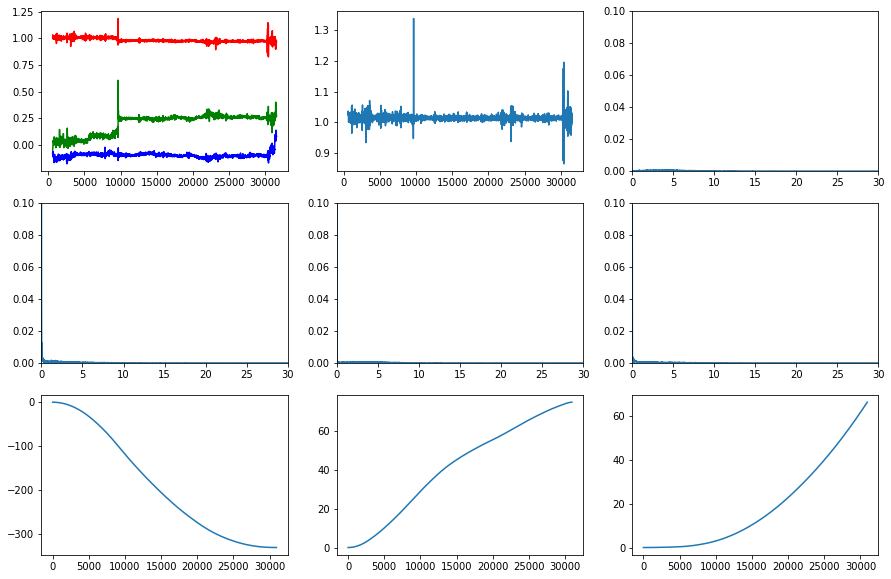

Grigory Burmashev - 2021-07-0418.52.08_Бурмашев_стояние.csv Амплитуда: 0.47175809906545974
Grigory Burmashev - 2021-07-0418.52.08_Бурмашев_стояние.csv Среднее: 1.0147197215690917
Grigory Burmashev - 2021-07-0423.23.18_Бурмашев_ходьба.csv
Grigory Burmashev - 2021-07-0423.23.18_Бурмашев_ходьба.csv
New means: -7.041562027583385e-17 1.282765175567516e-17 0.9979166151977725


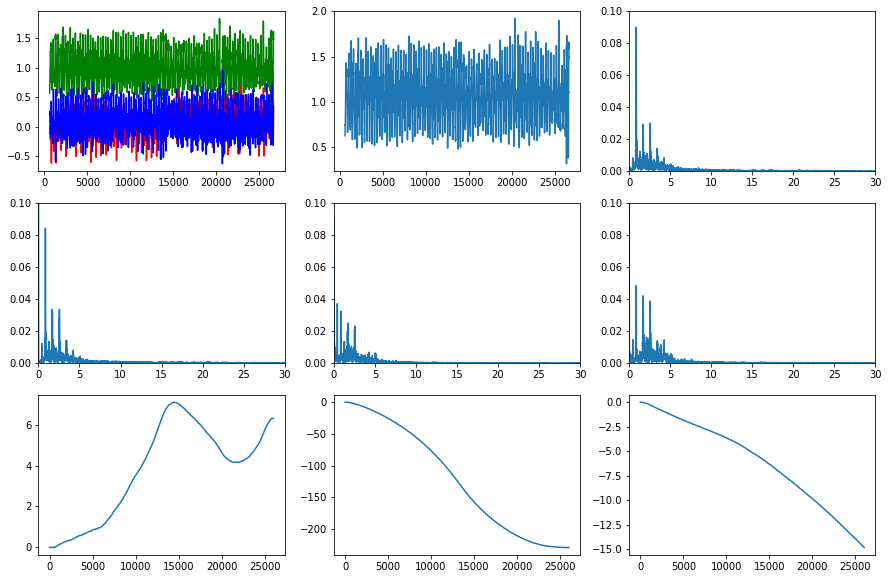

Grigory Burmashev - 2021-07-0423.23.18_Бурмашев_ходьба.csv Амплитуда: 1.6139320421283516
Grigory Burmashev - 2021-07-0423.23.18_Бурмашев_ходьба.csv Среднее: 1.0468343842748378
Grigory Burmashev - 2021-07-0423.24.37_Бурмашев_ходьба.csv
Grigory Burmashev - 2021-07-0423.24.37_Бурмашев_ходьба.csv
New means: 7.169870839551735e-17 7.169870839551735e-17 0.9836525050922854


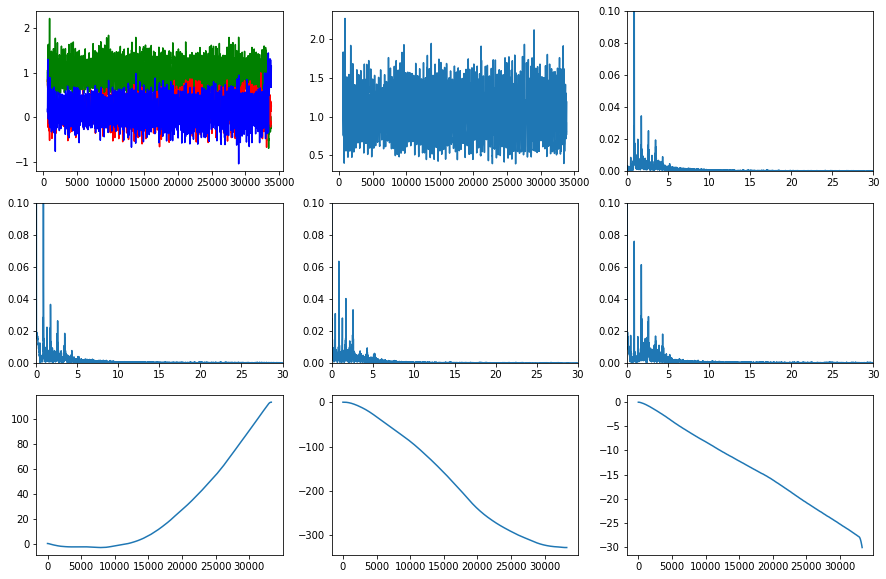

Grigory Burmashev - 2021-07-0423.24.37_Бурмашев_ходьба.csv Амплитуда: 1.8868575258702234
Grigory Burmashev - 2021-07-0423.24.37_Бурмашев_ходьба.csv Среднее: 1.0587126563456046
Grigory Burmashev - 2021-07-0423.26.02_Бурмашев_ходьба.csv
Grigory Burmashev - 2021-07-0423.26.02_Бурмашев_ходьба.csv
New means: 5.0184258129215574e-17 -9.124410568948287e-18 0.9967090799812564


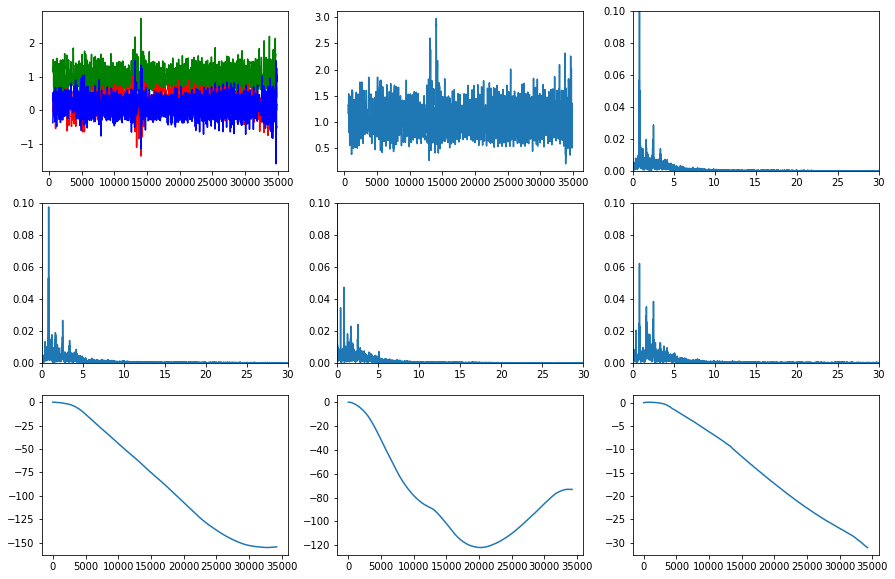

Grigory Burmashev - 2021-07-0423.26.02_Бурмашев_ходьба.csv Амплитуда: 2.766688928637509
Grigory Burmashev - 2021-07-0423.26.02_Бурмашев_ходьба.csv Среднее: 1.0556008136319537
Grigory Burmashev - 2021-07-0423.27.30_Бурмашев_ходьба.csv
Grigory Burmashev - 2021-07-0423.27.30_Бурмашев_ходьба.csv
New means: -1.3207187989382374e-16 -3.9780686715007147e-17 0.9820193482520984


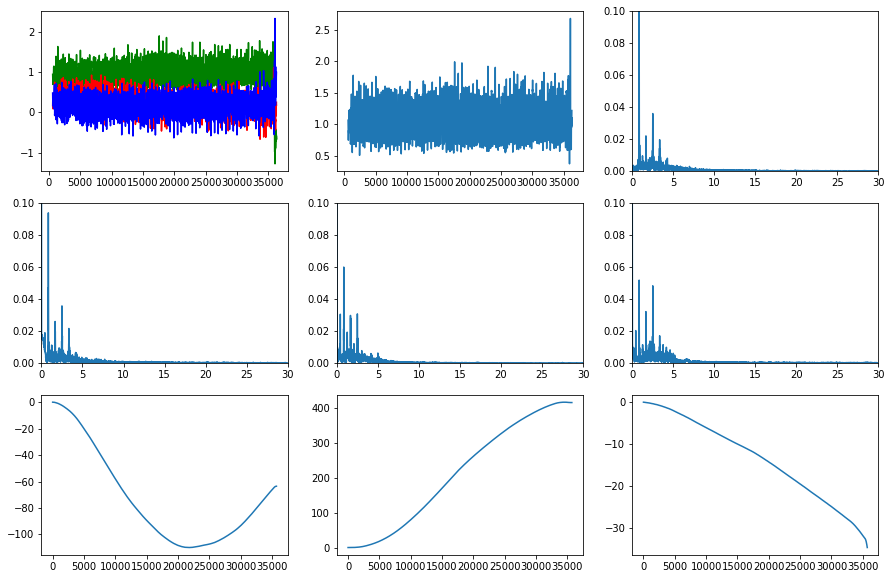

Grigory Burmashev - 2021-07-0423.27.30_Бурмашев_ходьба.csv Амплитуда: 2.3080691474992303
Grigory Burmashev - 2021-07-0423.27.30_Бурмашев_ходьба.csv Среднее: 1.0446297034840468
Kirill Dzhunkowski - 2021-07-0320.56.06_Dzhunkowski_велосипед
Kirill Dzhunkowski - 2021-07-0320.56.06_Dzhunkowski_велосипед
New means: 9.52470155174397e-18 5.9529384698399816e-18 0.9354195876719406


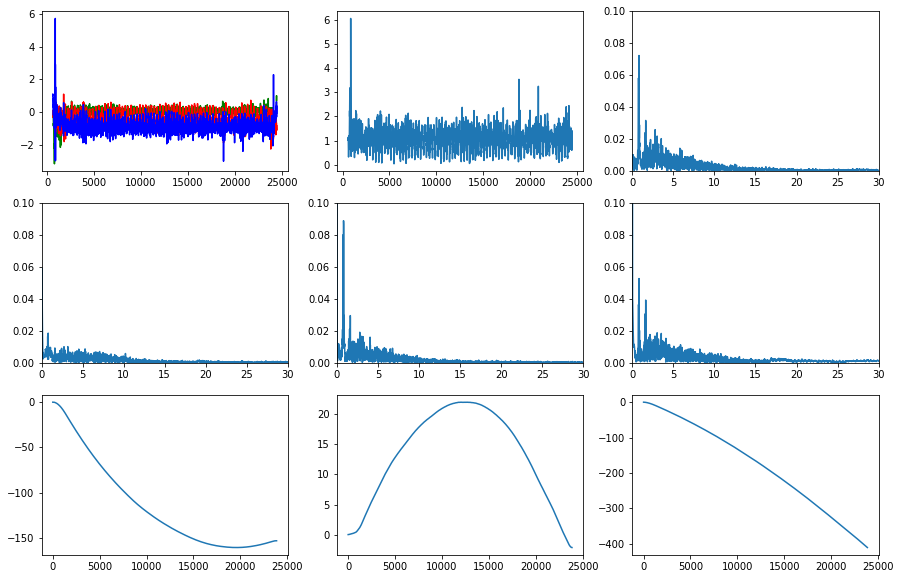

Kirill Dzhunkowski - 2021-07-0320.56.06_Dzhunkowski_велосипед Амплитуда: 6.0167888110518275
Kirill Dzhunkowski - 2021-07-0320.56.06_Dzhunkowski_велосипед Среднее: 1.0478376106576361
Kirill Dzhunkowski - 2021-07-0415.43.34_Dzhunkowski_велосипед
Kirill Dzhunkowski - 2021-07-0415.43.34_Dzhunkowski_велосипед
New means: -6.303328771435796e-18 3.781997262861478e-17 0.7644395738746058


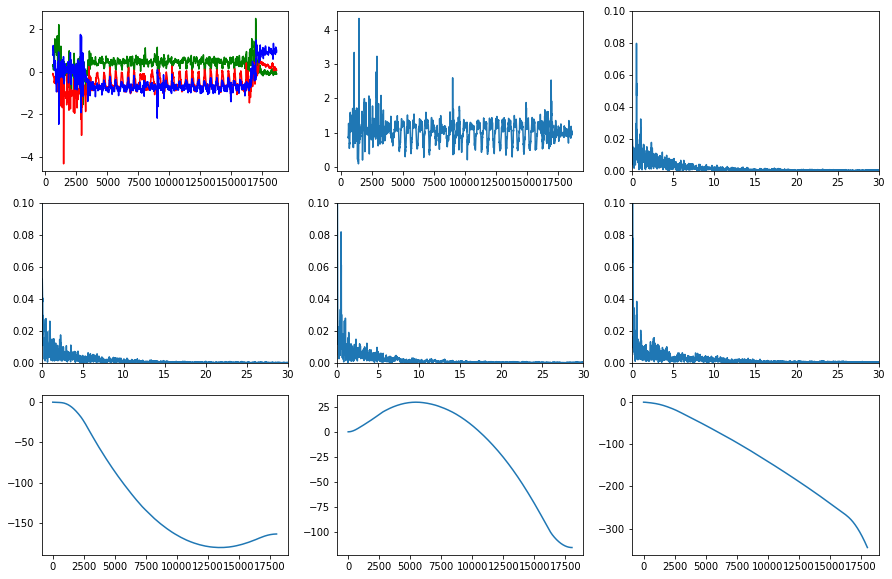

Kirill Dzhunkowski - 2021-07-0415.43.34_Dzhunkowski_велосипед Амплитуда: 4.249916886889521
Kirill Dzhunkowski - 2021-07-0415.43.34_Dzhunkowski_велосипед Среднее: 1.0426535374941457
Kirill Dzhunkowski - 2021-07-0419.48_Dzhunkowski_ходьба.39
Kirill Dzhunkowski - 2021-07-0419.48_Dzhunkowski_ходьба.39
New means: -1.208312606224179e-17 -2.196932011316689e-17 1.0020643813607288


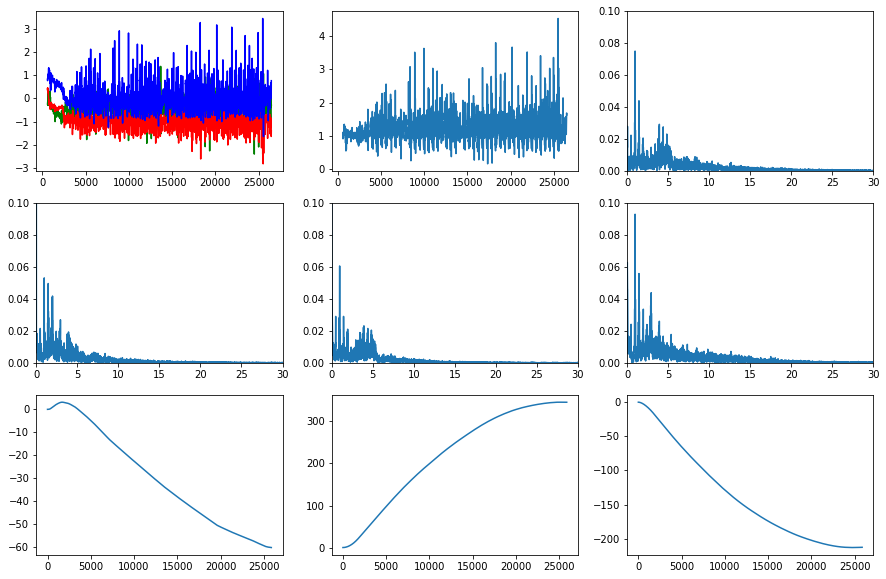

Kirill Dzhunkowski - 2021-07-0419.48_Dzhunkowski_ходьба.39 Амплитуда: 4.387990988305893
Kirill Dzhunkowski - 2021-07-0419.48_Dzhunkowski_ходьба.39 Среднее: 1.1684785431487477
Kirill Dzhunkowski - 2021-07-0419.58.30_Dzhunkowski_ходьба
Kirill Dzhunkowski - 2021-07-0419.58.30_Dzhunkowski_ходьба
New means: -1.6555049761418923e-18 1.568590964894443e-16 1.0337088819477949


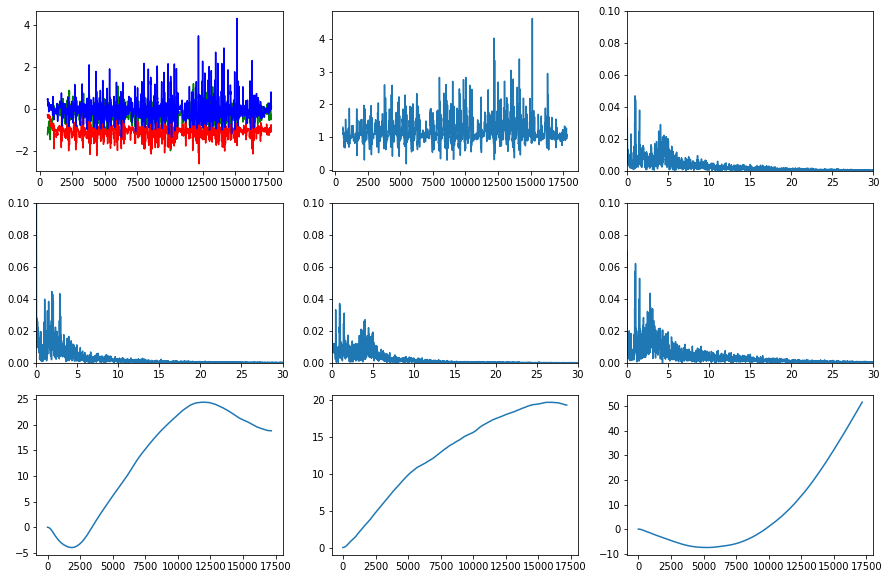

Kirill Dzhunkowski - 2021-07-0419.58.30_Dzhunkowski_ходьба Амплитуда: 4.430338449559846
Kirill Dzhunkowski - 2021-07-0419.58.30_Dzhunkowski_ходьба Среднее: 1.1669639029255288
Kirill Dzhunkowski - 2021-07-0420.04.19_Dzhunkowski_лестница
Kirill Dzhunkowski - 2021-07-0420.04.19_Dzhunkowski_лестница
New means: 3.048582269376738e-17 2.1488787215850664e-16 1.0352331704434008


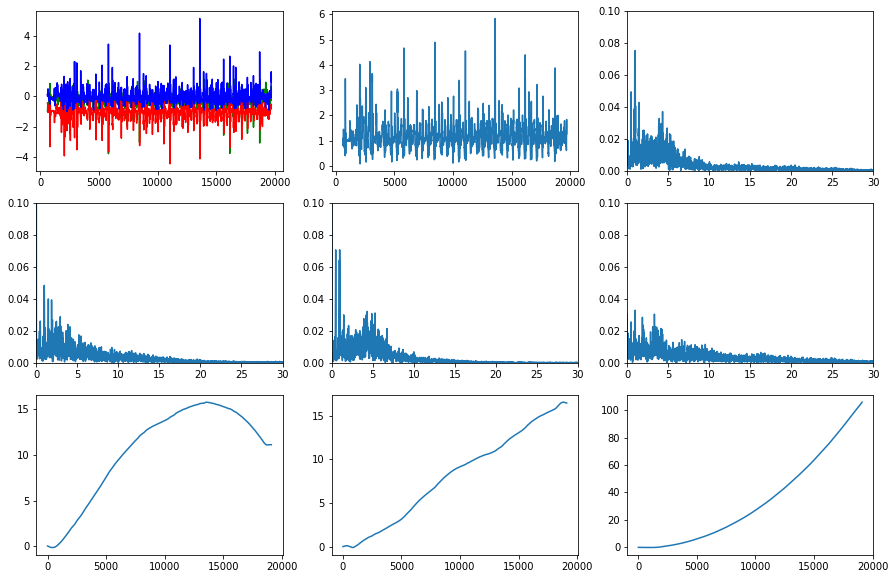

Kirill Dzhunkowski - 2021-07-0420.04.19_Dzhunkowski_лестница Амплитуда: 5.751732840412117
Kirill Dzhunkowski - 2021-07-0420.04.19_Dzhunkowski_лестница Среднее: 1.1461430022367214
Kirill Dzhunkowski - 2021-07-0420.06.54_Dzhunkowski_стояние
Kirill Dzhunkowski - 2021-07-0420.06.54_Dzhunkowski_стояние
New means: 1.2745796246630927e-17 2.8323991659179834e-17 0.9892192768372913


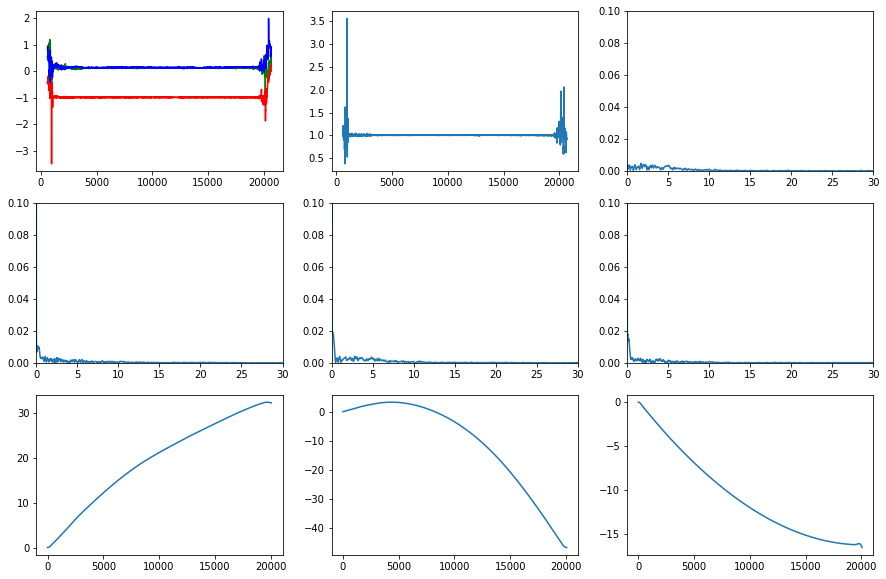

Kirill Dzhunkowski - 2021-07-0420.06.54_Dzhunkowski_стояние Амплитуда: 3.181490481404553
Kirill Dzhunkowski - 2021-07-0420.06.54_Dzhunkowski_стояние Среднее: 1.0087151592989954
Kirill Dzhunkowski - 2021-07-0420.09.21_Dzhunkowski_стояние
Kirill Dzhunkowski - 2021-07-0420.09.21_Dzhunkowski_стояние
New means: -3.1495314694817936e-17 -2.2496653353441383e-17 0.7925919222350134


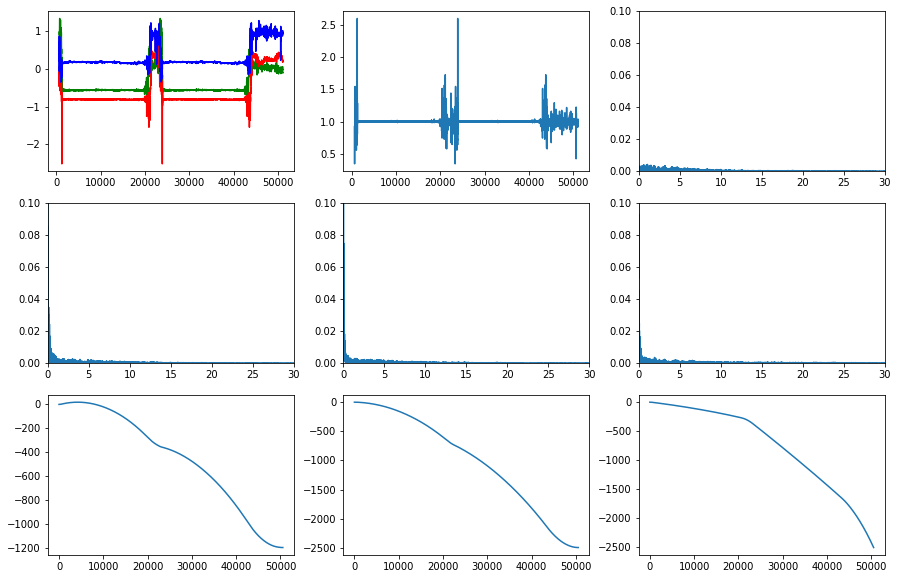

Kirill Dzhunkowski - 2021-07-0420.09.21_Dzhunkowski_стояние Амплитуда: 2.252528332531336
Kirill Dzhunkowski - 2021-07-0420.09.21_Dzhunkowski_стояние Среднее: 1.0049797003335597
Kirill Dzhunkowski - 2021-07-0711.26.25_Dzhunkowski_стояние
Kirill Dzhunkowski - 2021-07-0711.26.25_Dzhunkowski_стояние
New means: -1.570209457417642e-16 1.4765478406593965e-16 0.992273065540558


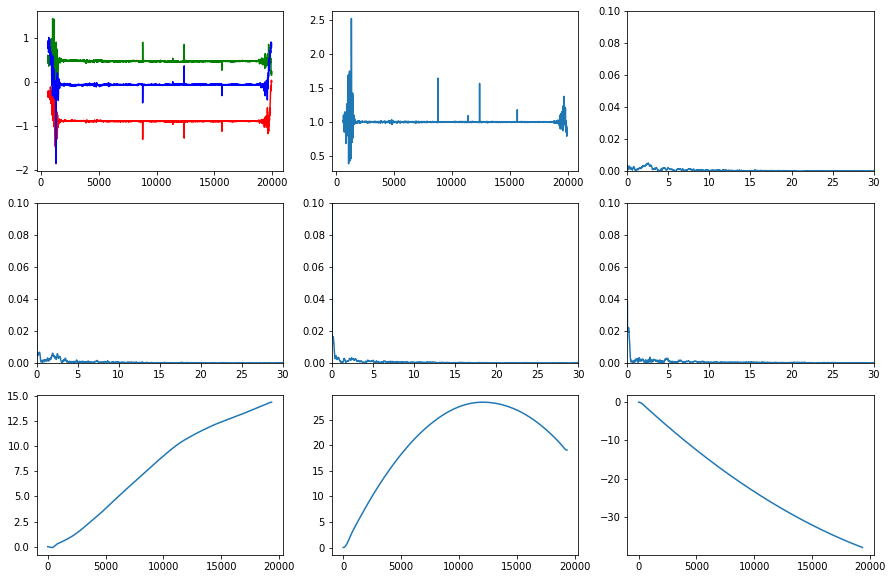

Kirill Dzhunkowski - 2021-07-0711.26.25_Dzhunkowski_стояние Амплитуда: 2.13142662713138
Kirill Dzhunkowski - 2021-07-0711.26.25_Dzhunkowski_стояние Среднее: 1.0093285249563808
Kirill Dzhunkowski - 2021-07-0711.31.02_Dzhunkowski_стояние
Kirill Dzhunkowski - 2021-07-0711.31.02_Dzhunkowski_стояние
New means: 3.789134312675914e-17 -6.048383409905214e-17 0.994022883171624


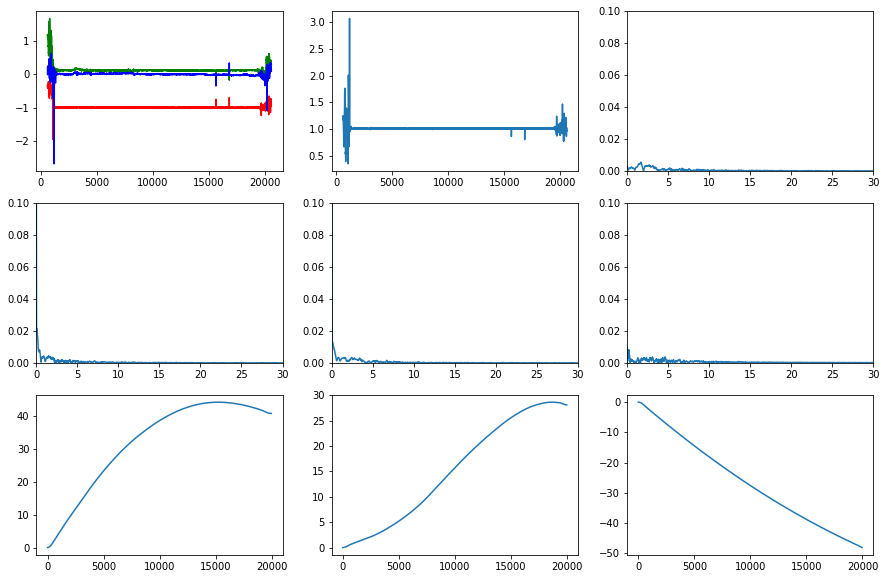

Kirill Dzhunkowski - 2021-07-0711.31.02_Dzhunkowski_стояние Амплитуда: 2.727301195028242
Kirill Dzhunkowski - 2021-07-0711.31.02_Dzhunkowski_стояние Среднее: 1.0081716810746595
Kirill Dzhunkowski - 2021-07-0711.35.15_Dzhunkowski_ходьба
Kirill Dzhunkowski - 2021-07-0711.35.15_Dzhunkowski_ходьба
New means: 1.5871843095104712e-18 4.285397635678272e-17 1.0095728755930549


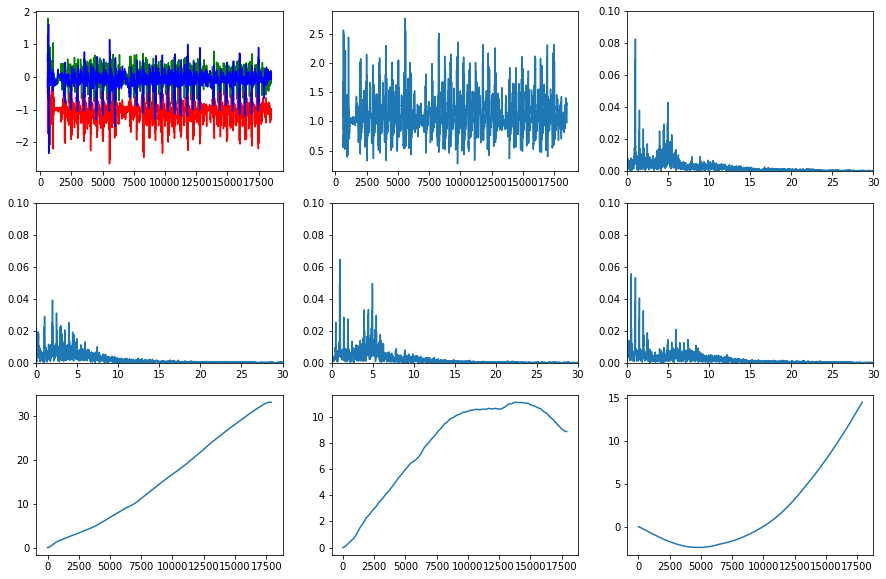

Kirill Dzhunkowski - 2021-07-0711.35.15_Dzhunkowski_ходьба Амплитуда: 2.4916343665297083
Kirill Dzhunkowski - 2021-07-0711.35.15_Dzhunkowski_ходьба Среднее: 1.0759770669124684
Kirill Dzhunkowski - 2021-07-0711.38.36_Dzhunkowski_ходьба
Kirill Dzhunkowski - 2021-07-0711.38.36_Dzhunkowski_ходьба
New means: -1.4932073883789014e-18 -2.837094037919912e-17 0.9889100547471932


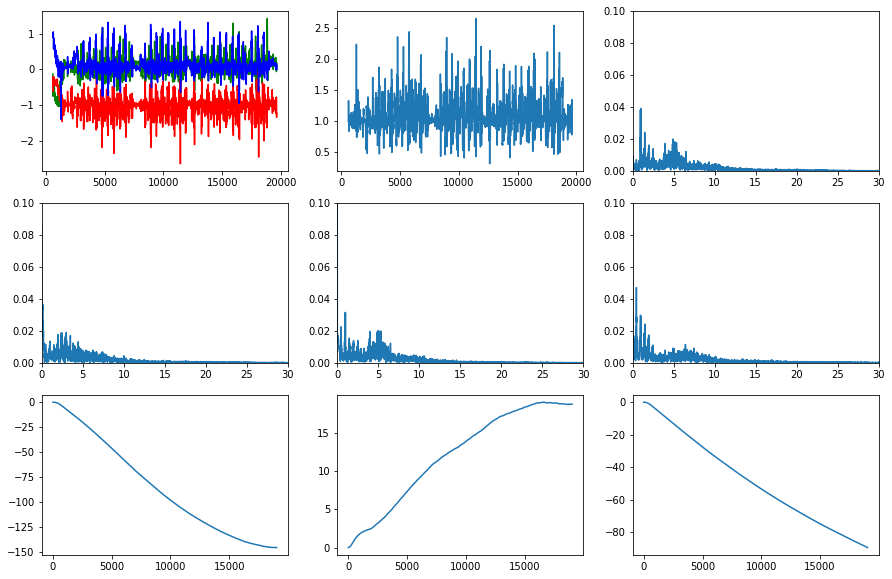

Kirill Dzhunkowski - 2021-07-0711.38.36_Dzhunkowski_ходьба Амплитуда: 2.3438507736885423
Kirill Dzhunkowski - 2021-07-0711.38.36_Dzhunkowski_ходьба Среднее: 1.0542697959131841
Kirill Dzhunkowski - 2021-07-0711.41.20_Dzhunkowki_бег
Kirill Dzhunkowski - 2021-07-0711.41.20_Dzhunkowki_бег
New means: 5.500976018787872e-18 7.518000559010092e-17 1.068247719926277


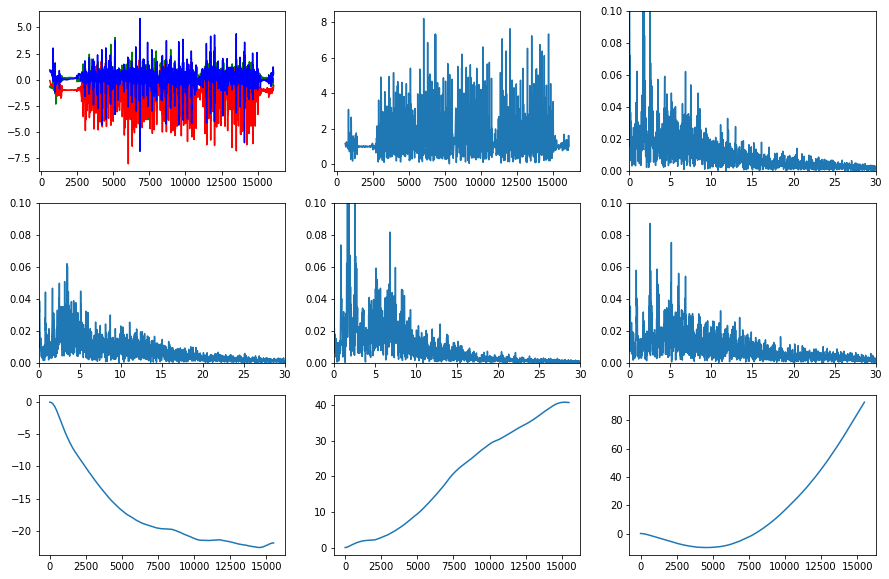

Kirill Dzhunkowski - 2021-07-0711.41.20_Dzhunkowki_бег Амплитуда: 8.186838575172027
Kirill Dzhunkowski - 2021-07-0711.41.20_Dzhunkowki_бег Среднее: 1.5195564778799069
Kirill Dzhunkowski - 2021-07-0711.42.40_Dzhunkowski_бег
Kirill Dzhunkowski - 2021-07-0711.42.40_Dzhunkowski_бег
New means: 5.889289148446748e-18 2.0275981211080948e-16 1.054141457273969


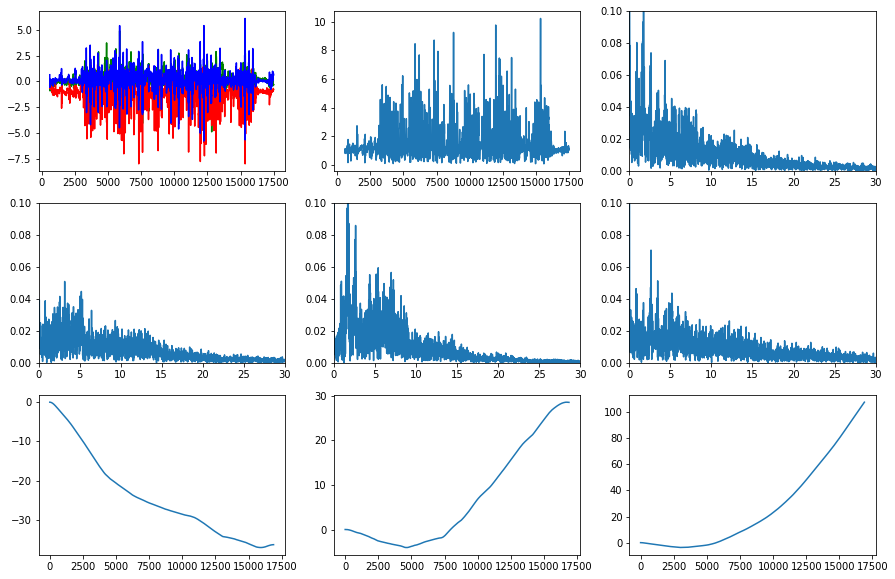

Kirill Dzhunkowski - 2021-07-0711.42.40_Dzhunkowski_бег Амплитуда: 10.170544445764026
Kirill Dzhunkowski - 2021-07-0711.42.40_Dzhunkowski_бег Среднее: 1.4734090938573203
Kirill Dzhunkowski - 2021-07-0711.54.33_Dzhunkowski_бег
Kirill Dzhunkowski - 2021-07-0711.54.33_Dzhunkowski_бег
New means: -6.217831859637718e-18 -1.8653495578913153e-16 0.8804073321892304


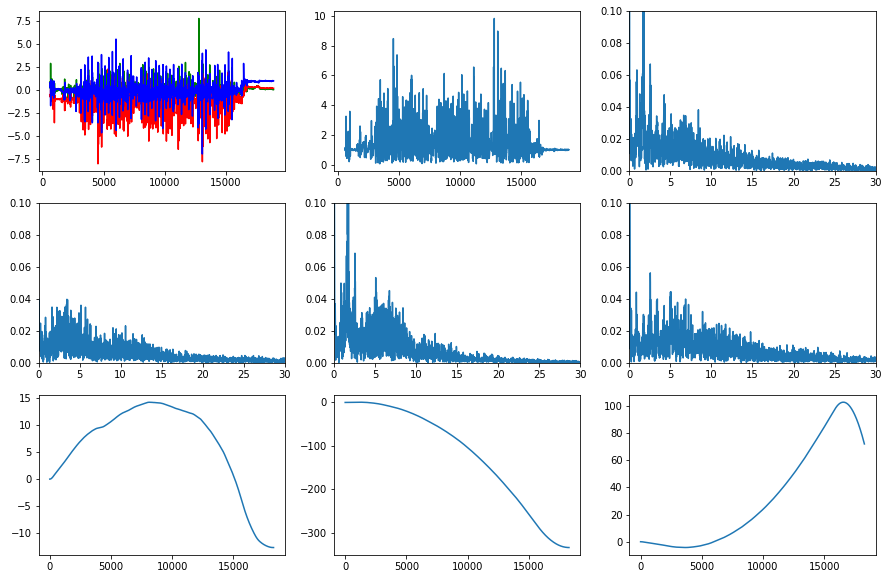

Kirill Dzhunkowski - 2021-07-0711.54.33_Dzhunkowski_бег Амплитуда: 9.754425916784141
Kirill Dzhunkowski - 2021-07-0711.54.33_Dzhunkowski_бег Среднее: 1.4386357020803526
Kirill Dzhunkowski - 2021-07-0711.55.58_Dzhunkowski_бег
Kirill Dzhunkowski - 2021-07-0711.55.58_Dzhunkowski_бег
New means: 1.6556014114524383e-18 2.6489622583239013e-17 1.102897847563218


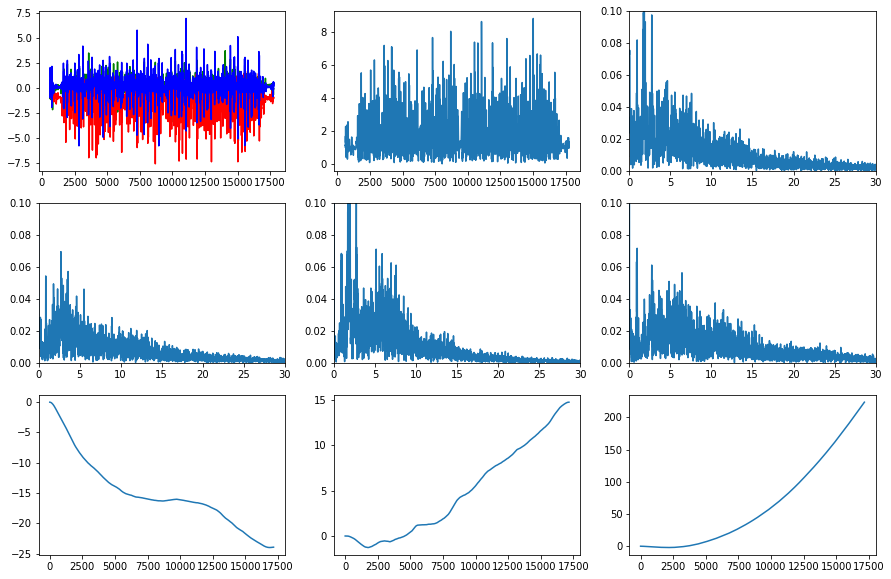

Kirill Dzhunkowski - 2021-07-0711.55.58_Dzhunkowski_бег Амплитуда: 8.788720056868748
Kirill Dzhunkowski - 2021-07-0711.55.58_Dzhunkowski_бег Среднее: 1.6428086810734233
Kirill Dzhunkowski - 2021-07-0719.31.22_Dzhunkowski_лестница.csv
Kirill Dzhunkowski - 2021-07-0719.31.22_Dzhunkowski_лестница.csv
New means: 7.873049703713022e-18 -3.739698609263685e-17 0.9804472546393133


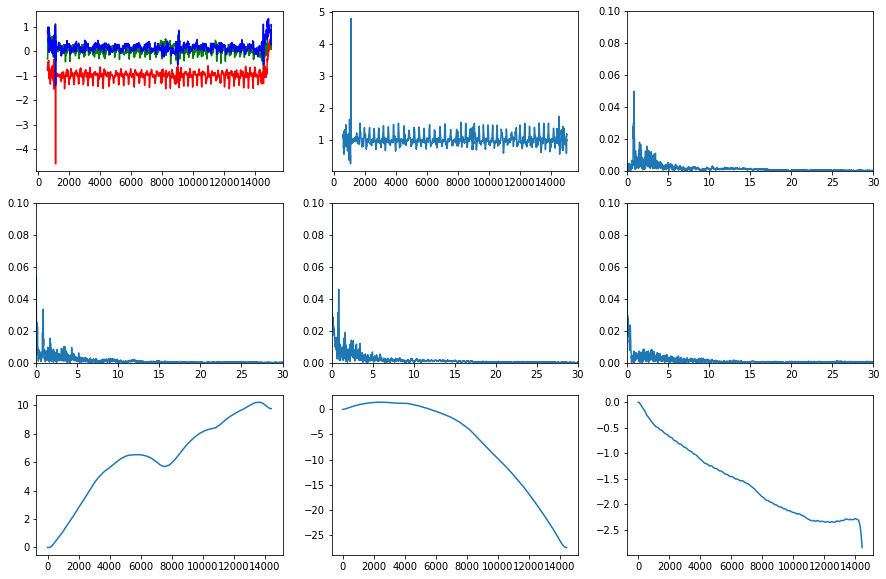

Kirill Dzhunkowski - 2021-07-0719.31.22_Dzhunkowski_лестница.csv Амплитуда: 4.528103922919639
Kirill Dzhunkowski - 2021-07-0719.31.22_Dzhunkowski_лестница.csv Среднее: 1.020777304582945
Kirill Dzhunkowski - 2021-07-0719.33.05_Dzhunkowski_лестница.csv
Kirill Dzhunkowski - 2021-07-0719.33.05_Dzhunkowski_лестница.csv
New means: -5.624348831874144e-18 9.748871308581849e-17 0.9621290605809368


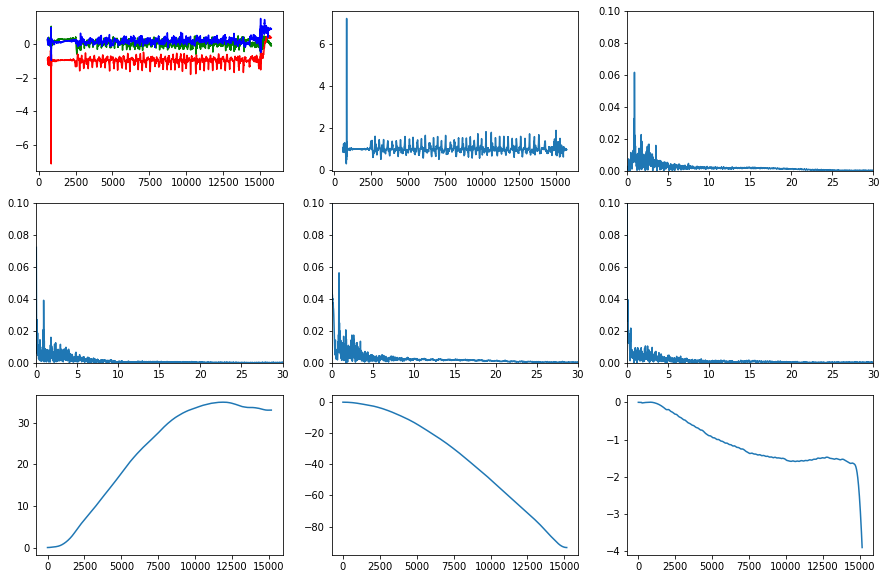

Kirill Dzhunkowski - 2021-07-0719.33.05_Dzhunkowski_лестница.csv Амплитуда: 6.884137229040698
Kirill Dzhunkowski - 2021-07-0719.33.05_Dzhunkowski_лестница.csv Среднее: 1.023918216400938
Kirill Dzhunkowski - 2021-07-0719.34.52_Dzhunkowski_лестница.csv
Kirill Dzhunkowski - 2021-07-0719.34.52_Dzhunkowski_лестница.csv
New means: 7.1999263914893e-18 -1.799981597872325e-18 0.971515296187241


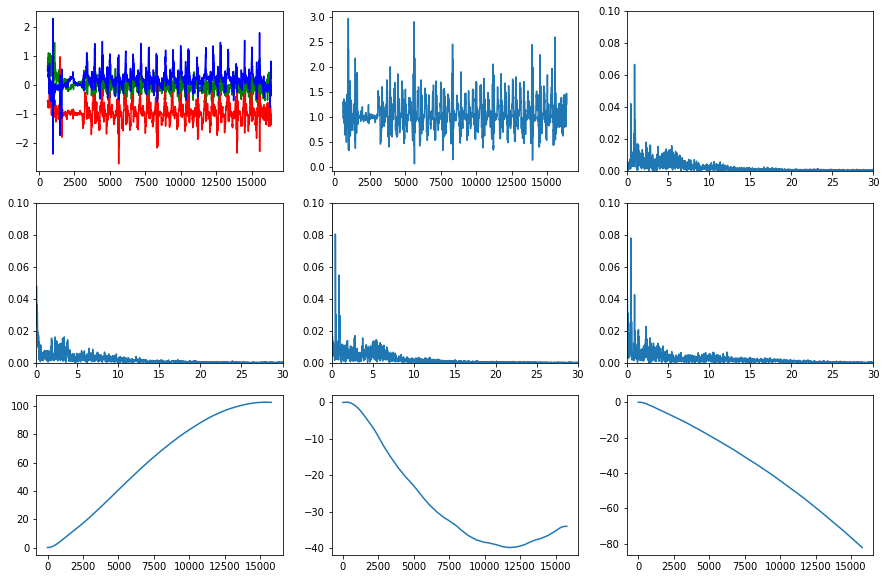

Kirill Dzhunkowski - 2021-07-0719.34.52_Dzhunkowski_лестница.csv Амплитуда: 2.892329958753731
Kirill Dzhunkowski - 2021-07-0719.34.52_Dzhunkowski_лестница.csv Среднее: 1.0466194153984558
Kirill Dzhunkowski - 2021-07-0719.41.00_Dzhunkowski_велосипед.csv
Kirill Dzhunkowski - 2021-07-0719.41.00_Dzhunkowski_велосипед.csv
New means: 0.0 3.834725805766225e-17 0.9858100107258861


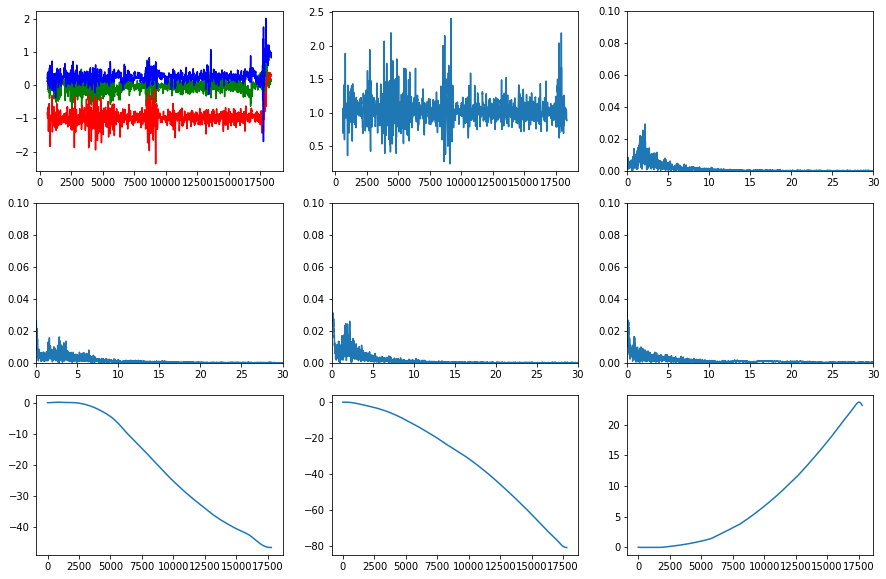

Kirill Dzhunkowski - 2021-07-0719.41.00_Dzhunkowski_велосипед.csv Амплитуда: 2.1636555900942884
Kirill Dzhunkowski - 2021-07-0719.41.00_Dzhunkowski_велосипед.csv Среднее: 1.03279839129707
Kirill Dzhunkowski - 2021-07-0719.42.33_Dzhunkowski_велосипед.csv
Kirill Dzhunkowski - 2021-07-0719.42.33_Dzhunkowski_велосипед.csv
New means: 1.2547523615872858e-17 6.273761807936429e-17 0.9511183018742174


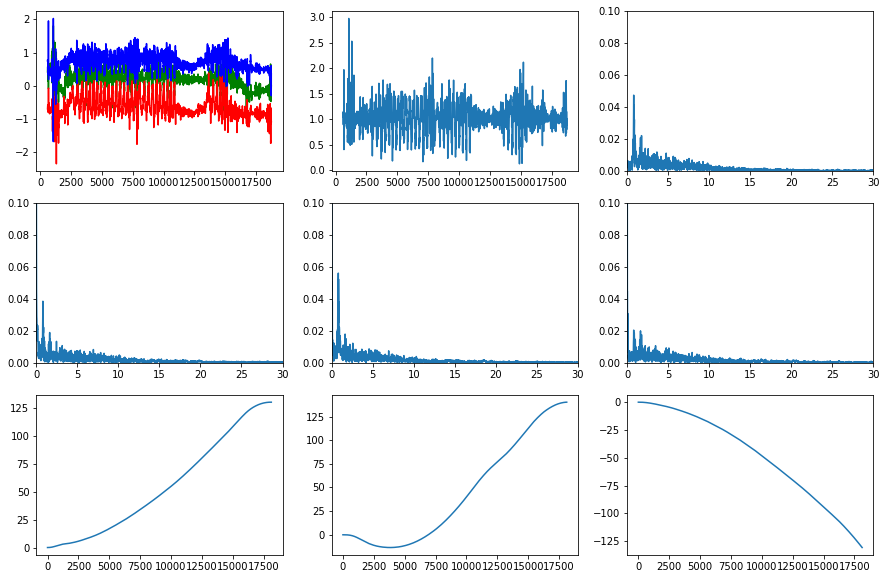

Kirill Dzhunkowski - 2021-07-0719.42.33_Dzhunkowski_велосипед.csv Амплитуда: 2.845967631222139
Kirill Dzhunkowski - 2021-07-0719.42.33_Dzhunkowski_велосипед.csv Среднее: 1.0290128081715106
Kirill Dzhunkowski - 2021-07-0719.46.03_Dzhunkowski_велосипед.csv
Kirill Dzhunkowski - 2021-07-0719.46.03_Dzhunkowski_велосипед.csv
New means: -1.0891630362293163e-17 -2.076217037812134e-17 0.8826260821314266


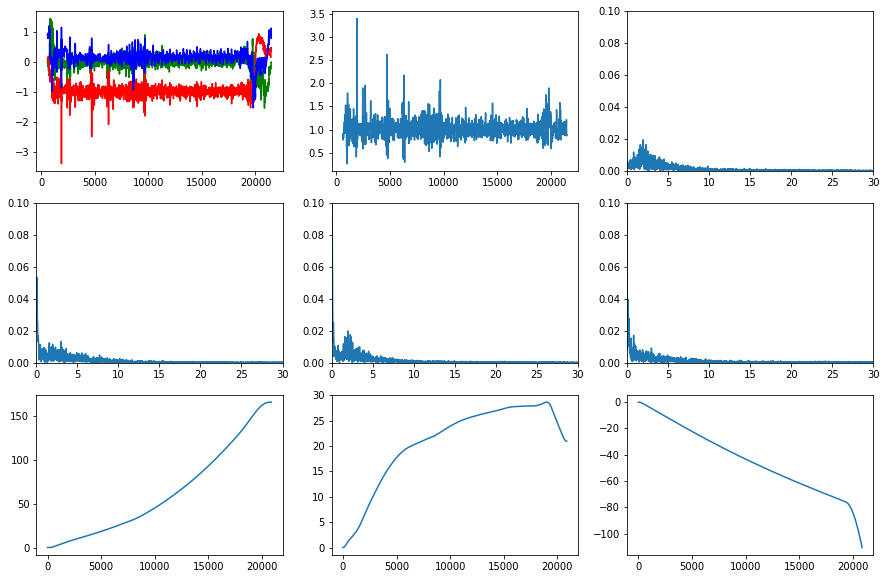

Kirill Dzhunkowski - 2021-07-0719.46.03_Dzhunkowski_велосипед.csv Амплитуда: 3.1274365890856917
Kirill Dzhunkowski - 2021-07-0719.46.03_Dzhunkowski_велосипед.csv Среднее: 1.0269394522882829
Oleg Petrov - 2021-07-0320.00.49 Петров Стояние на месте
Oleg Petrov - 2021-07-0320.00.49 Петров Стояние на месте
New means: 3.768405297820489e-17 6.247619309544496e-17 1.002785231510951


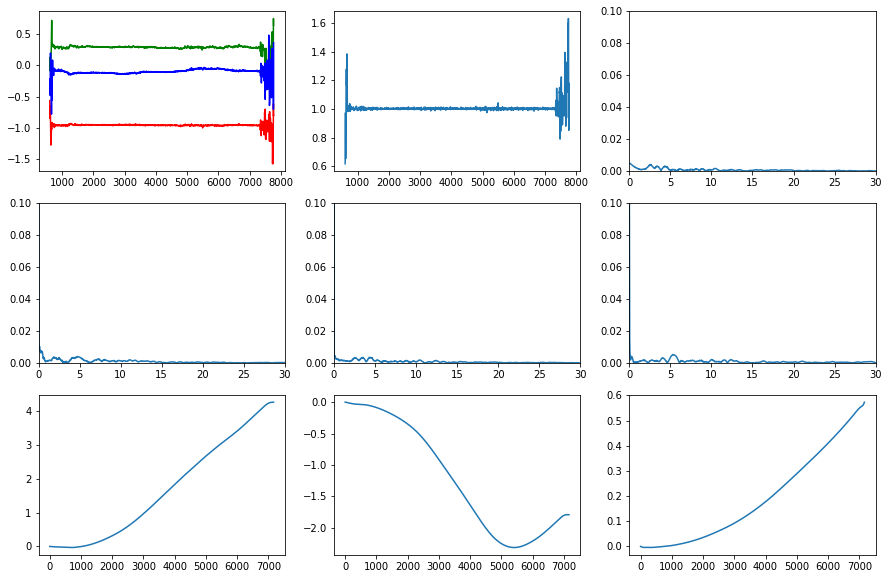

Oleg Petrov - 2021-07-0320.00.49 Петров Стояние на месте Амплитуда: 1.0119464442277548
Oleg Petrov - 2021-07-0320.00.49 Петров Стояние на месте Среднее: 1.006650220572905
Oleg Petrov - 2021-07-0320.01.55 Петров Стояние на месте
Oleg Petrov - 2021-07-0320.01.55 Петров Стояние на месте
New means: 6.082869212807482e-17 -2.1985795259362994e-16 1.003336076741868


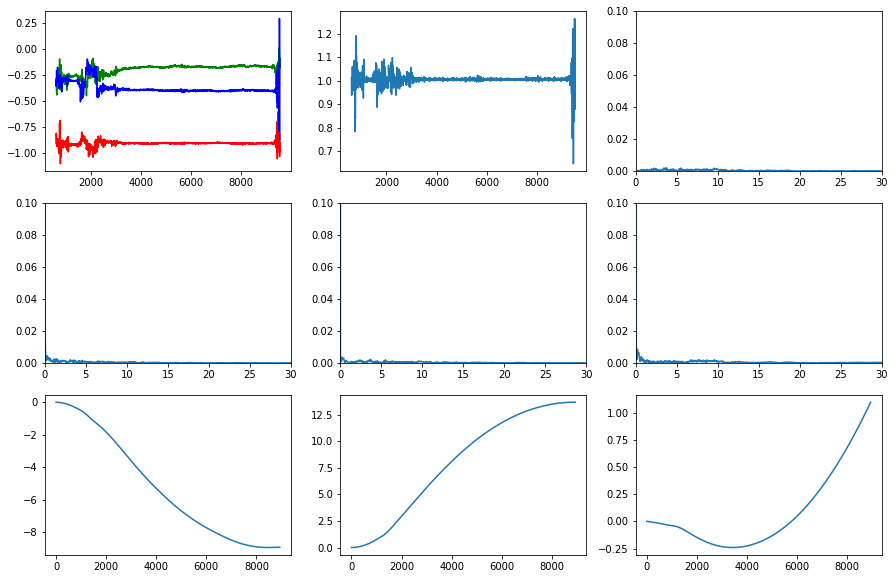

Oleg Petrov - 2021-07-0320.01.55 Петров Стояние на месте Амплитуда: 0.617773906125293
Oleg Petrov - 2021-07-0320.01.55 Петров Стояние на месте Среднее: 1.0062304234174542
Oleg Petrov - 2021-07-0320.04.32 Петров Авто пасс
Oleg Petrov - 2021-07-0320.04.32 Петров Авто пасс
New means: -4.477975331716403e-18 -3.2185447696711645e-18 0.9951591888134326


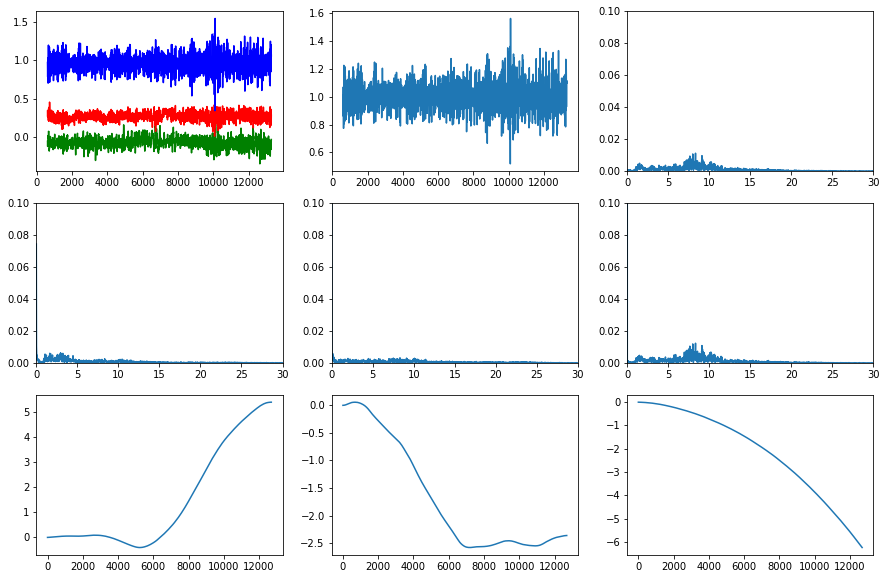

Oleg Petrov - 2021-07-0320.04.32 Петров Авто пасс Амплитуда: 1.043611419802445
Oleg Petrov - 2021-07-0320.04.32 Петров Авто пасс Среднее: 0.9997530812056227
Oleg Petrov - 2021-07-0320.06.46 Петров Авто пасс
Oleg Petrov - 2021-07-0320.06.46 Петров Авто пасс
New means: -4.6229195560188695e-18 2.7737517336113215e-17 0.9948371581317931


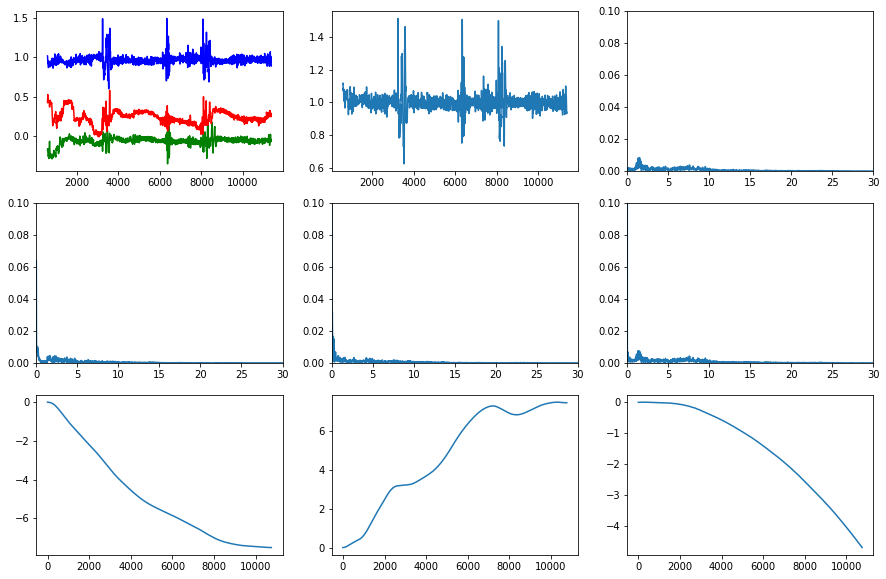

Oleg Petrov - 2021-07-0320.06.46 Петров Авто пасс Амплитуда: 0.8892260849383883
Oleg Petrov - 2021-07-0320.06.46 Петров Авто пасс Среднее: 1.000232775155309
Oleg Petrov - 2021-07-0320.07.54 Петров Авто пасс
Oleg Petrov - 2021-07-0320.07.54 Петров Авто пасс
New means: -1.3789508618524855e-17 4.5198944916275917e-17 0.9975807474567743


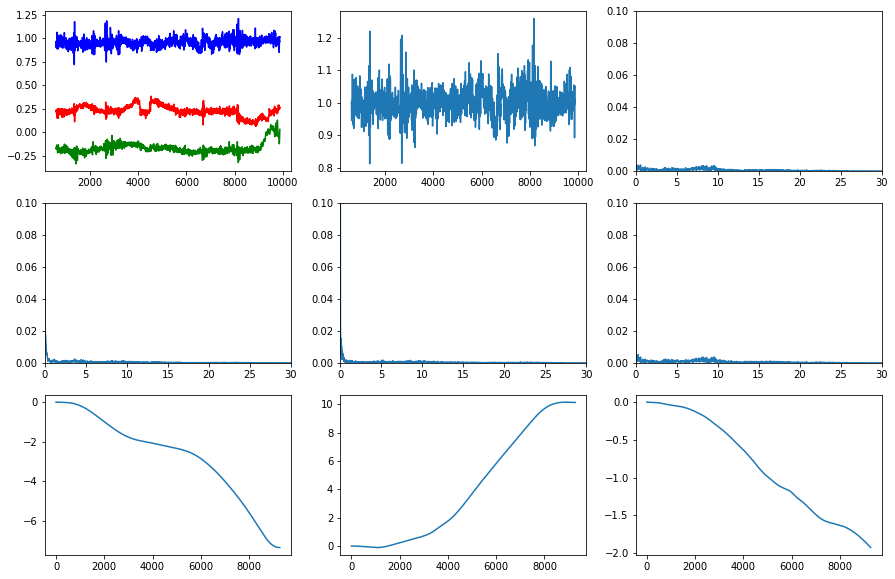

Oleg Petrov - 2021-07-0320.07.54 Петров Авто пасс Амплитуда: 0.44531707136346477
Oleg Petrov - 2021-07-0320.07.54 Петров Авто пасс Среднее: 1.0010322640882876
Oleg Petrov - 2021-07-0320.09.12 Петров Авто пасс
Oleg Petrov - 2021-07-0320.09.12 Петров Авто пасс
New means: -1.487502456189041e-17 6.693761052850685e-18 0.9932205999414225


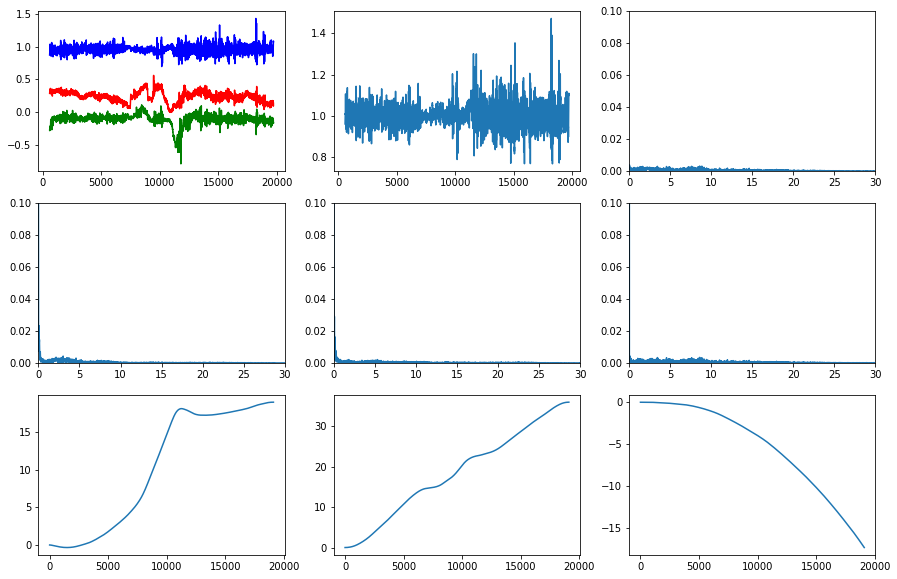

Oleg Petrov - 2021-07-0320.09.12 Петров Авто пасс Амплитуда: 0.7055621128199762
Oleg Petrov - 2021-07-0320.09.12 Петров Авто пасс Среднее: 1.000431664624304
Oleg Petrov - 2021-07-0320.20.29 Петров Авто пасс
Oleg Petrov - 2021-07-0320.20.29 Петров Авто пасс
New means: 1.267441713665922e-17 2.3857726374887945e-18 0.9984301194931177


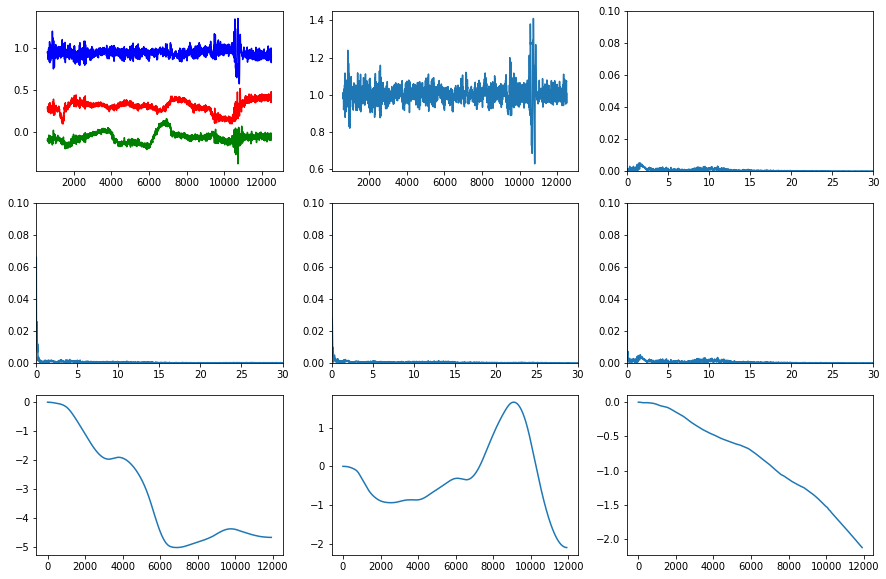

Oleg Petrov - 2021-07-0320.20.29 Петров Авто пасс Амплитуда: 0.7793214161077002
Oleg Petrov - 2021-07-0320.20.29 Петров Авто пасс Среднее: 1.0032609657825564
Oleg Petrov - 2021-07-0320.36.09 Петров Авто пасс
Oleg Petrov - 2021-07-0320.36.09 Петров Авто пасс
New means: -2.943912561153879e-18 5.299042610076982e-18 0.996817729530977


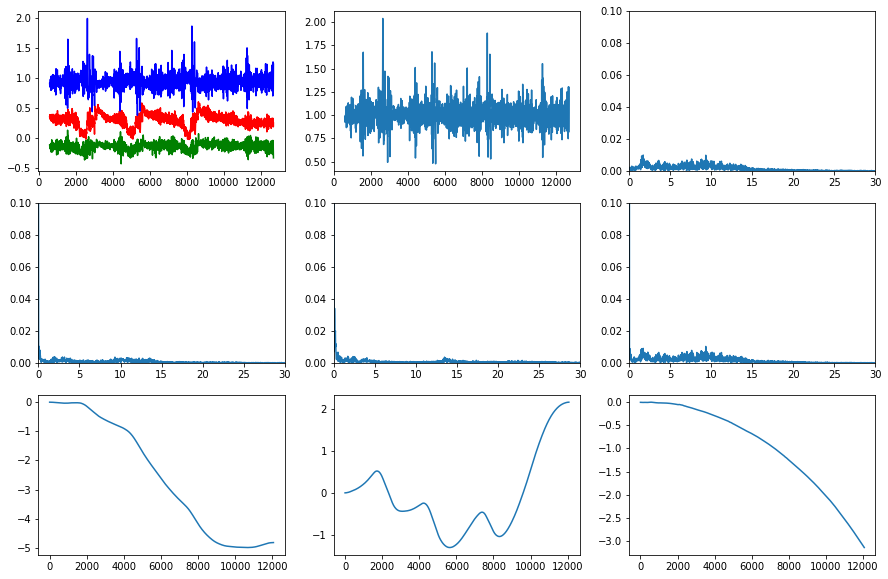

Oleg Petrov - 2021-07-0320.36.09 Петров Авто пасс Амплитуда: 1.5610455684711169
Oleg Petrov - 2021-07-0320.36.09 Петров Авто пасс Среднее: 1.0040582049894213
Oleg Petrov - 2021-07-0321.21.29 Петров Ходьба
Oleg Petrov - 2021-07-0321.21.29 Петров Ходьба
New means: 2.018730693259749e-18 -1.4332987922144219e-16 0.9979063478734688


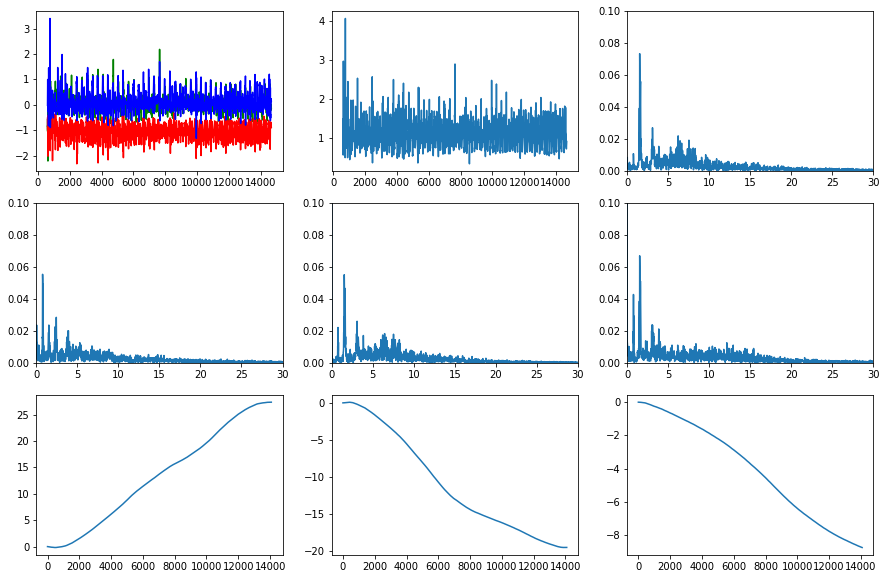

Oleg Petrov - 2021-07-0321.21.29 Петров Ходьба Амплитуда: 3.737197539946941
Oleg Petrov - 2021-07-0321.21.29 Петров Ходьба Среднее: 1.072295239995213
Oleg Petrov - 2021-07-0416.29.02 Петров Авто пасс
Oleg Petrov - 2021-07-0416.29.02 Петров Авто пасс
New means: 0.0 -3.0317088915174943e-17 0.992782635098604


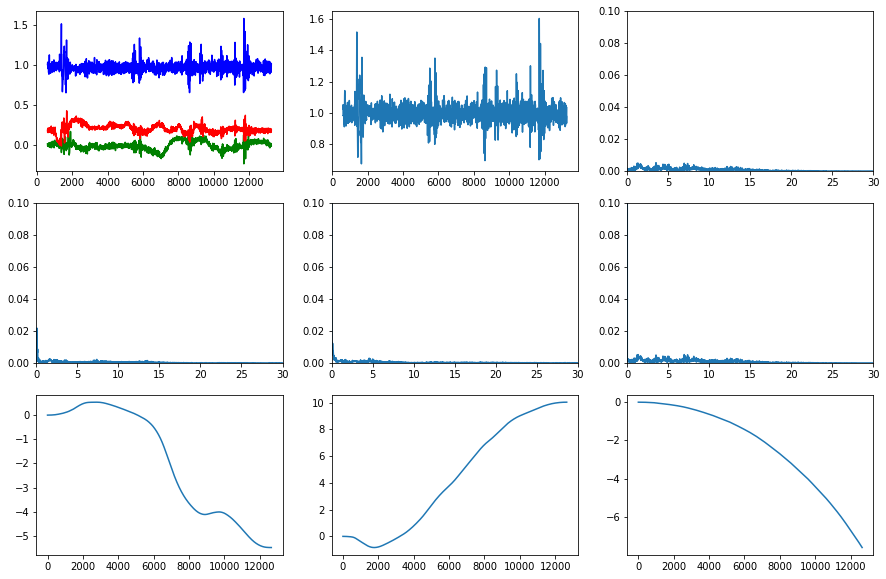

Oleg Petrov - 2021-07-0416.29.02 Петров Авто пасс Амплитуда: 0.9321026179833166
Oleg Petrov - 2021-07-0416.29.02 Петров Авто пасс Среднее: 0.9957645149222949
Oleg Petrov - 2021-07-0419.28.25 Петров Лестница
Oleg Petrov - 2021-07-0419.28.25 Петров Лестница
New means: -2.8848669742594404e-18 -5.3370039023799647e-17 0.997909110284997


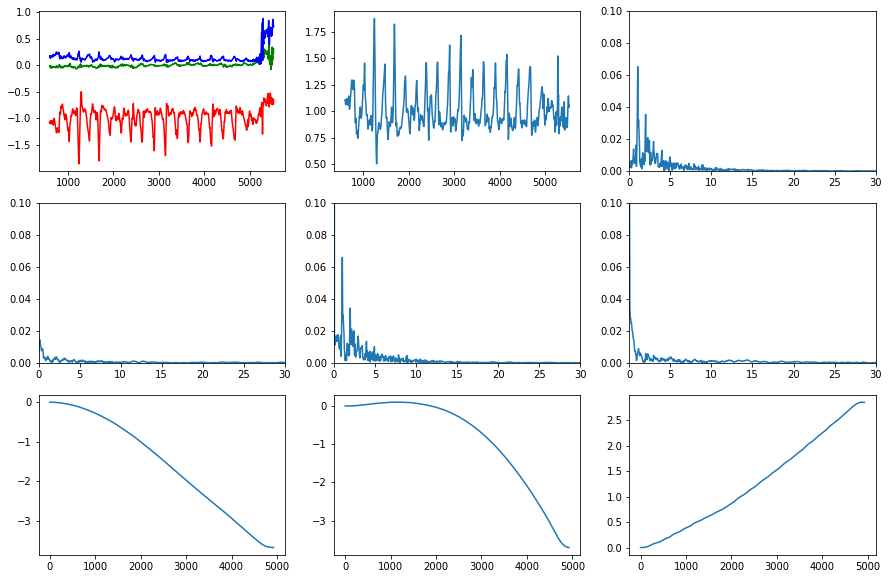

Oleg Petrov - 2021-07-0419.28.25 Петров Лестница Амплитуда: 1.3701706770460014
Oleg Petrov - 2021-07-0419.28.25 Петров Лестница Среднее: 1.009204299048623
Oleg Petrov - 2021-07-0420.07.40 Петров Авто пасс
Oleg Petrov - 2021-07-0420.07.40 Петров Авто пасс
New means: 2.391281526349781e-17 1.5941876842331872e-17 0.9894740244121277


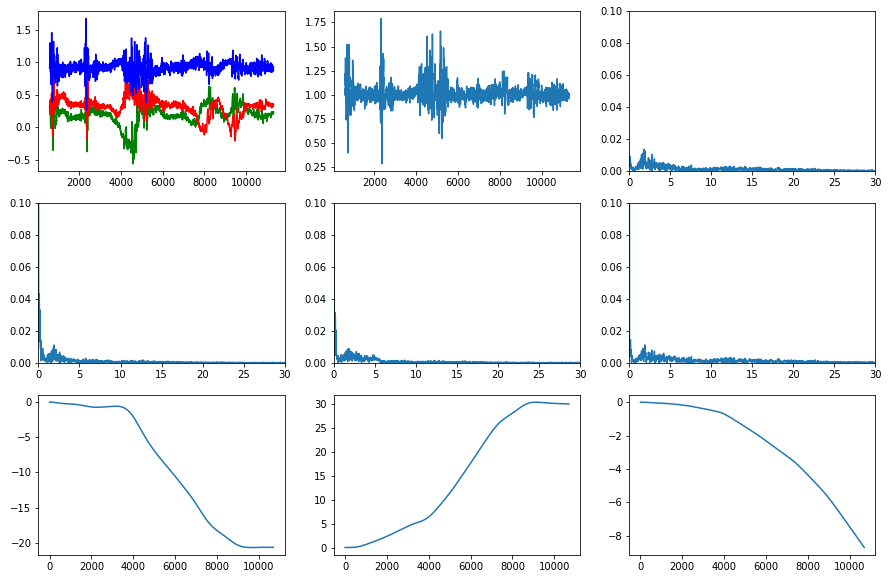

Oleg Petrov - 2021-07-0420.07.40 Петров Авто пасс Амплитуда: 1.5030481516897325
Oleg Petrov - 2021-07-0420.07.40 Петров Авто пасс Среднее: 1.0134628585257939
Oleg Petrov - 2021-07-0519.19.04 Петров Велосипед
Oleg Petrov - 2021-07-0519.19.04 Петров Велосипед
New means: -1.6975278880967572e-18 1.2519268174713586e-16 0.9800578628112697


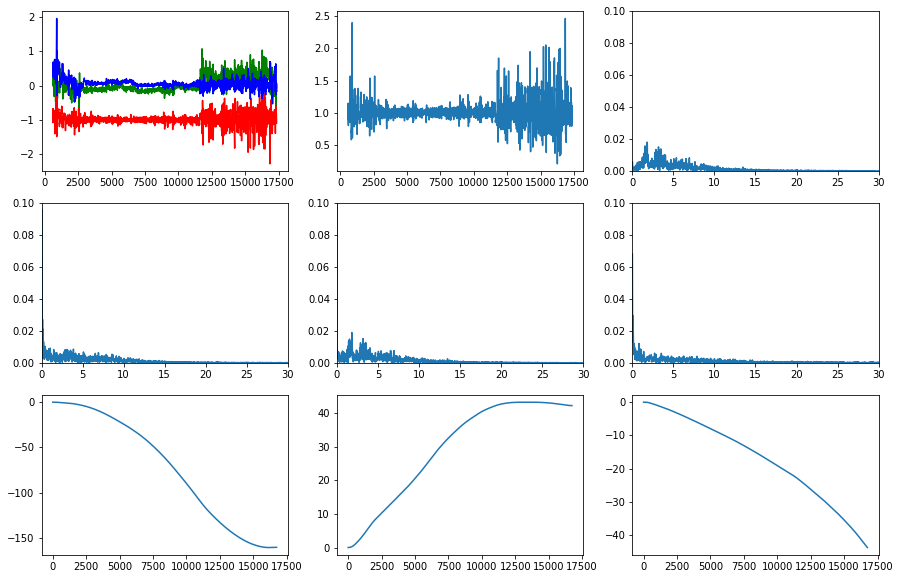

Oleg Petrov - 2021-07-0519.19.04 Петров Велосипед Амплитуда: 2.2545095948071596
Oleg Petrov - 2021-07-0519.19.04 Петров Велосипед Среднее: 1.0124456146523964
Oleg Petrov - 2021-07-0519.47.29 Петров Велосипед
Oleg Petrov - 2021-07-0519.47.29 Петров Велосипед
New means: -1.2721629018252787e-17 9.54122176368959e-17 0.9633326747347989


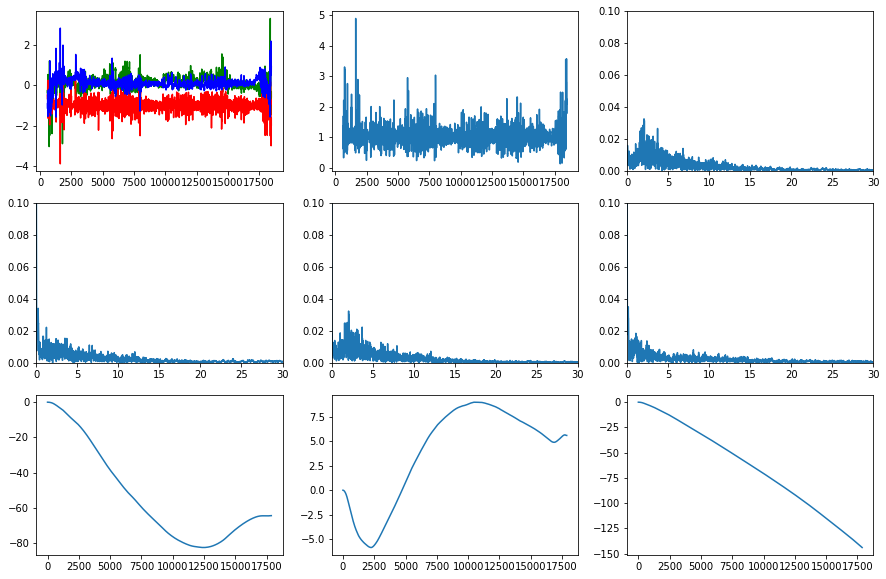

Oleg Petrov - 2021-07-0519.47.29 Петров Велосипед Амплитуда: 4.758386767137484
Oleg Petrov - 2021-07-0519.47.29 Петров Велосипед Среднее: 1.0388147189233798
Oleg Petrov - 2021-07-0520.12.47 Петров Велосипед
Oleg Petrov - 2021-07-0520.12.47 Петров Велосипед
New means: 9.486551879307078e-18 -1.8973103758614157e-18 0.9500084888813142


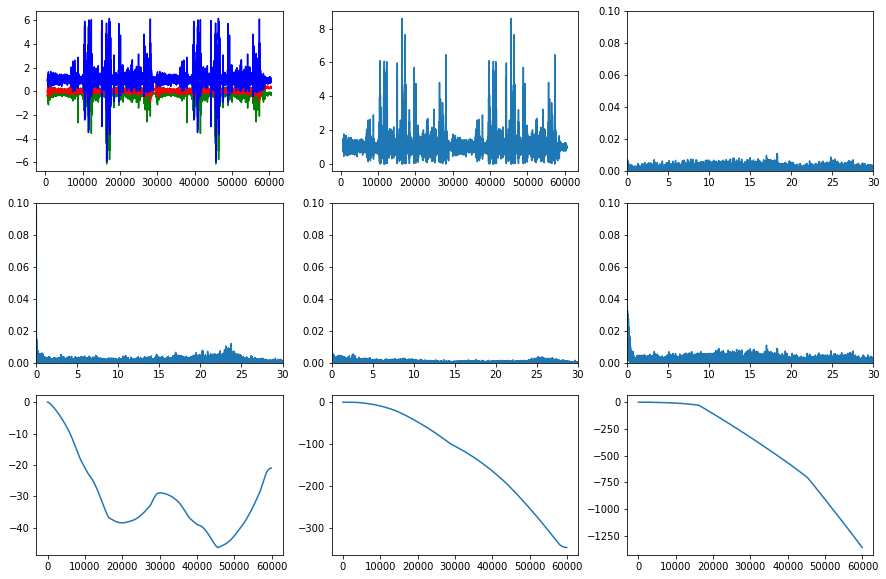

Oleg Petrov - 2021-07-0520.12.47 Петров Велосипед Амплитуда: 8.601454843955032
Oleg Petrov - 2021-07-0520.12.47 Петров Велосипед Среднее: 1.0198405065236824
Oleg Petrov - 2021-07-0520.19.32 Петров Велосипед
Oleg Petrov - 2021-07-0520.19.32 Петров Велосипед
New means: 5.092887844415961e-18 8.488146407359935e-19 0.8252298932535346


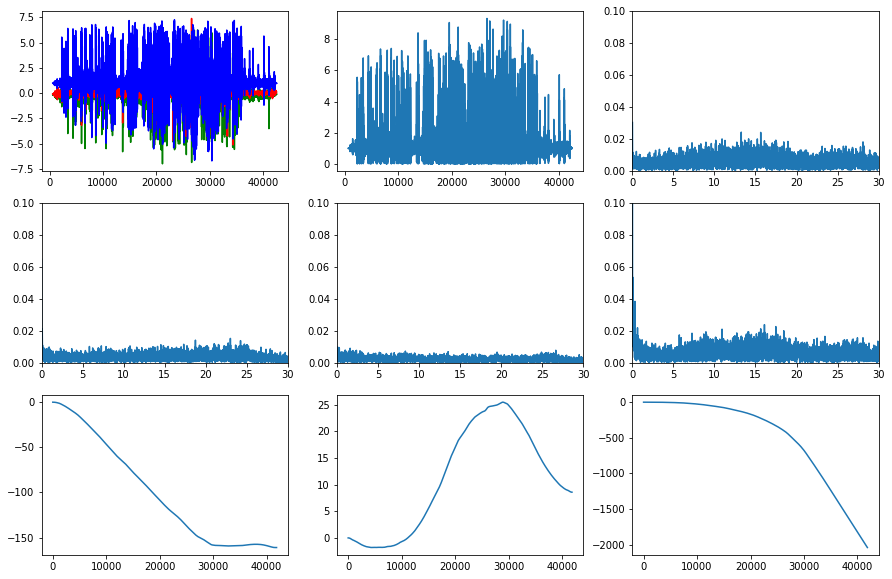

Oleg Petrov - 2021-07-0520.19.32 Петров Велосипед Амплитуда: 9.342162601824318
Oleg Petrov - 2021-07-0520.19.32 Петров Велосипед Среднее: 1.1121166846239898
Oleg Petrov - 2021-07-0520.34.04 Петров Стояние на месте
Oleg Petrov - 2021-07-0520.34.04 Петров Стояние на месте
New means: 1.2738130821045718e-17 1.7392447851812422e-17 0.9986008050699372


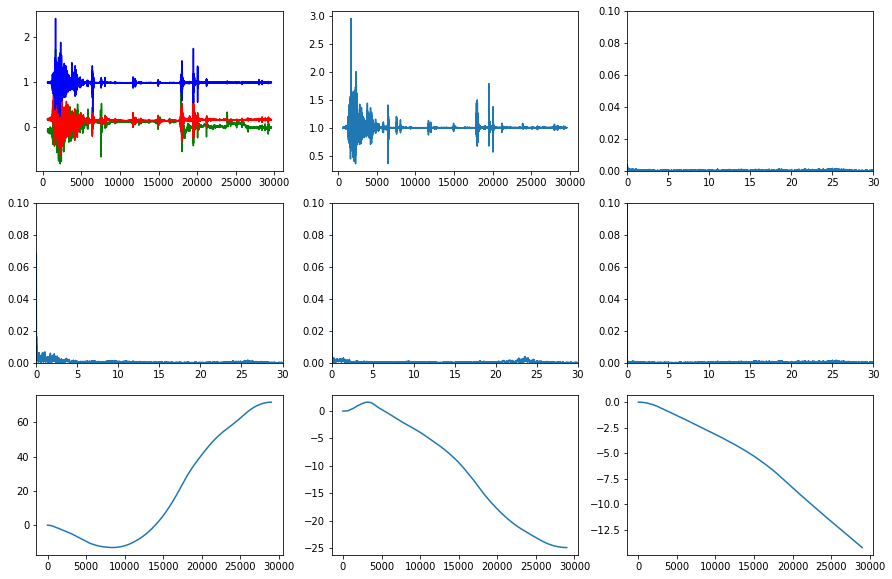

Oleg Petrov - 2021-07-0520.34.04 Петров Стояние на месте Амплитуда: 2.6070640107943164
Oleg Petrov - 2021-07-0520.34.04 Петров Стояние на месте Среднее: 1.0064266028463371
Oleg Petrov - 2021-07-0520.37.07 Петров Велосипед
Oleg Petrov - 2021-07-0520.37.07 Петров Велосипед
New means: -6.6583277336160594e-18 2.833330950474919e-19 0.9599689269564207


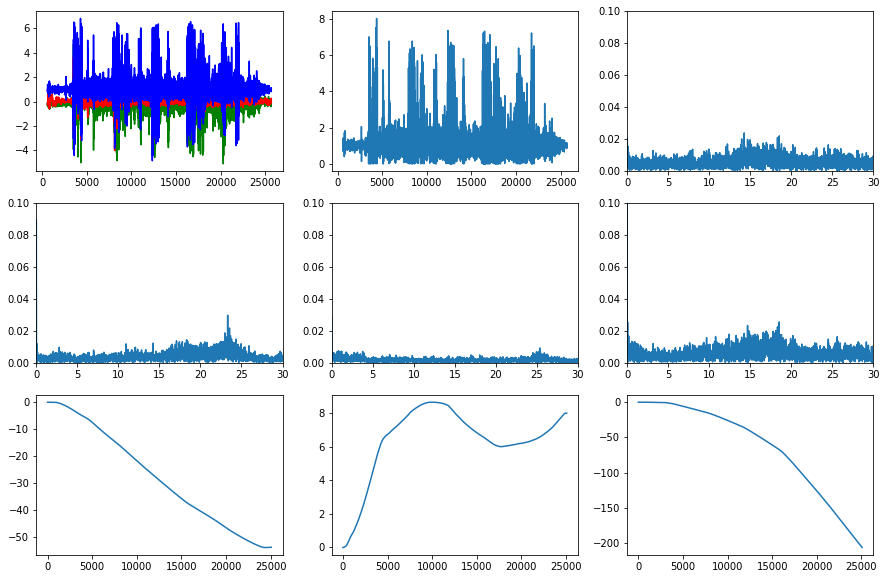

Oleg Petrov - 2021-07-0520.37.07 Петров Велосипед Амплитуда: 8.0204589986997
Oleg Petrov - 2021-07-0520.37.07 Петров Велосипед Среднее: 1.0955221367417414
Oleg Petrov - 2021-07-0720.12.00 Петров Ходьба
Oleg Petrov - 2021-07-0720.12.00 Петров Ходьба
New means: nan nan nan


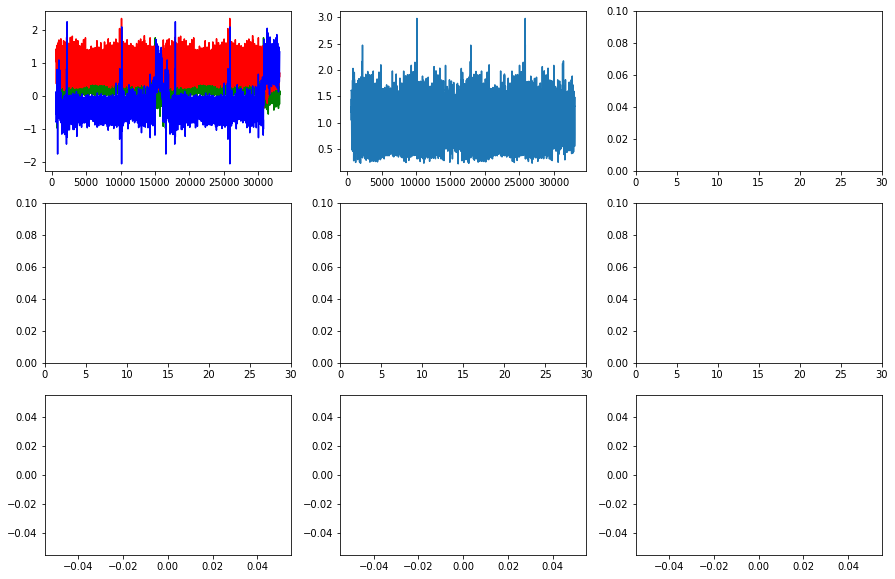

Oleg Petrov - 2021-07-0720.12.00 Петров Ходьба Амплитуда: 2.7624870255900893
Oleg Petrov - 2021-07-0720.12.00 Петров Ходьба Среднее: 1.0593978225180345
Oleg Petrov - 2021-07-0720.13.38 Петров Ходьба
Oleg Petrov - 2021-07-0720.13.38 Петров Ходьба
New means: 0.0 2.5746095923298174e-16 1.017173546558581


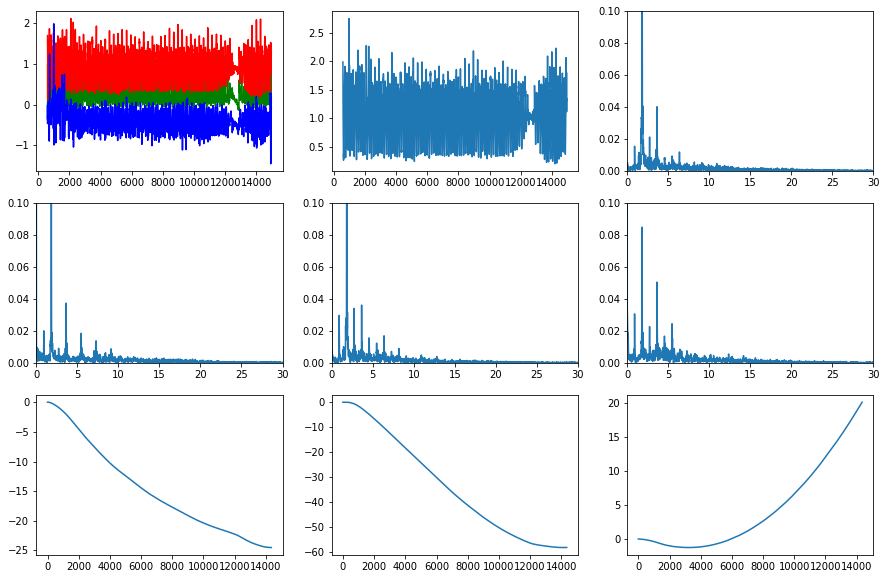

Oleg Petrov - 2021-07-0720.13.38 Петров Ходьба Амплитуда: 2.5506951154862425
Oleg Petrov - 2021-07-0720.13.38 Петров Ходьба Среднее: 1.0532699642539487
Oleg Petrov - 2021-07-0720.15.04 Петров Ходьба
Oleg Petrov - 2021-07-0720.15.04 Петров Ходьба
New means: -2.1335789079961827e-17 -3.962360829135768e-16 1.0135493871615628


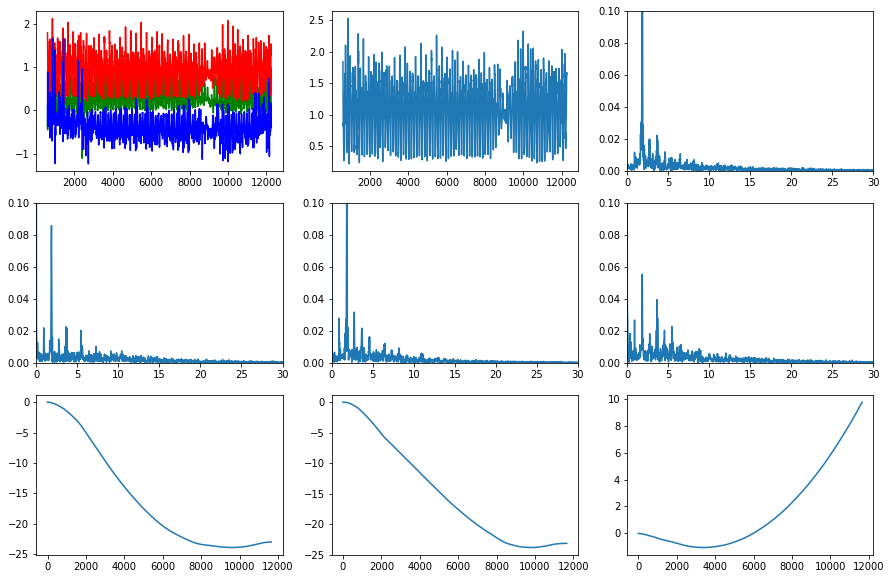

Oleg Petrov - 2021-07-0720.15.04 Петров Ходьба Амплитуда: 2.303386476412098
Oleg Petrov - 2021-07-0720.15.04 Петров Ходьба Среднее: 1.0575431370018034
Oleg Petrov - 2021-07-0720.16.15 Петров Ходьба
Oleg Petrov - 2021-07-0720.16.15 Петров Ходьба
New means: -7.580133199200963e-18 -1.0422683148901323e-16 1.0238348233899905


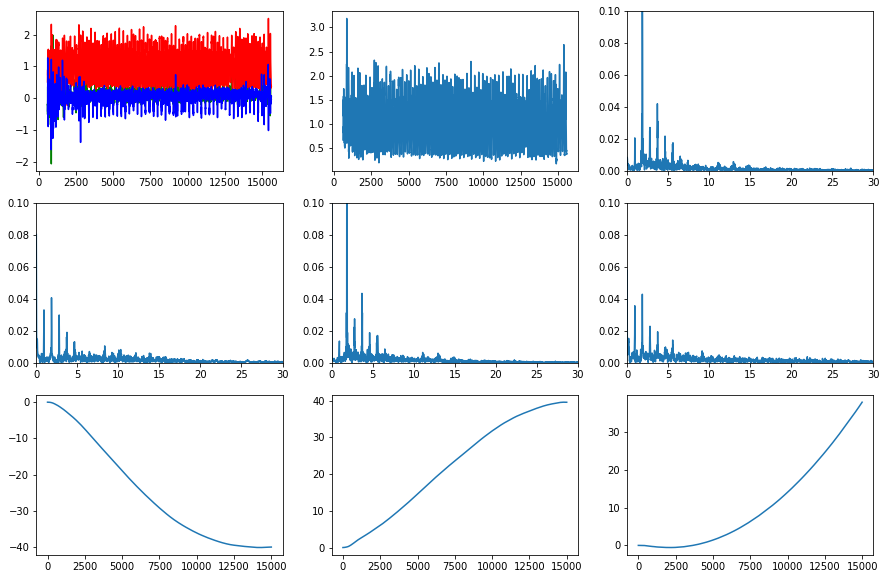

Oleg Petrov - 2021-07-0720.16.15 Петров Ходьба Амплитуда: 3.002752561724967
Oleg Petrov - 2021-07-0720.16.15 Петров Ходьба Среднее: 1.0589682186733542
Oleg Petrov - 2021-07-0722.13.36 Петров Бег
Oleg Petrov - 2021-07-0722.13.36 Петров Бег
New means: 6.148336334814827e-18 -2.6642790784197584e-16 1.0025979663846176


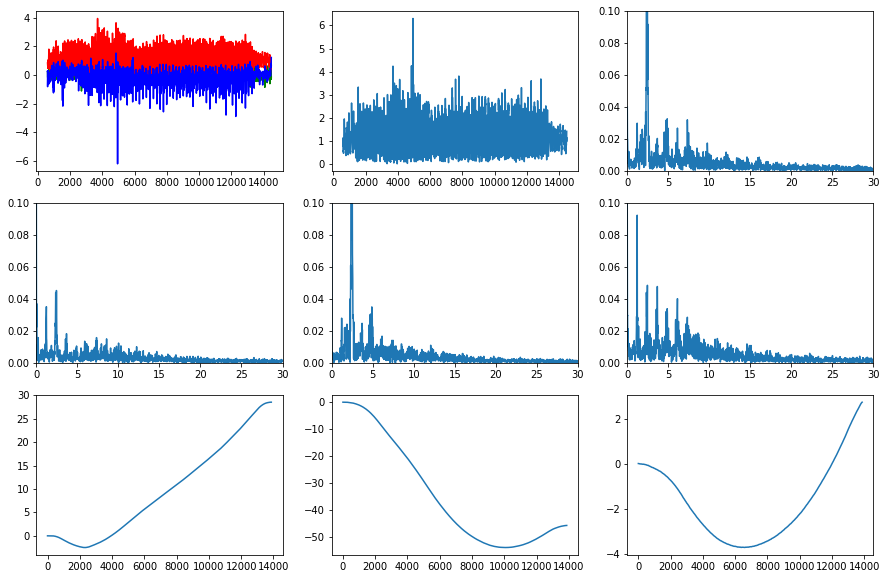

Oleg Petrov - 2021-07-0722.13.36 Петров Бег Амплитуда: 6.294071758371258
Oleg Petrov - 2021-07-0722.13.36 Петров Бег Среднее: 1.2047383104967915
Александр Крупецков - 2021-07-0221.33.49 Крупецков ходьба
Александр Крупецков - 2021-07-0221.33.49 Крупецков ходьба
New means: 7.885124101004696e-17 -4.652712978853703e-18 1.002223347175555


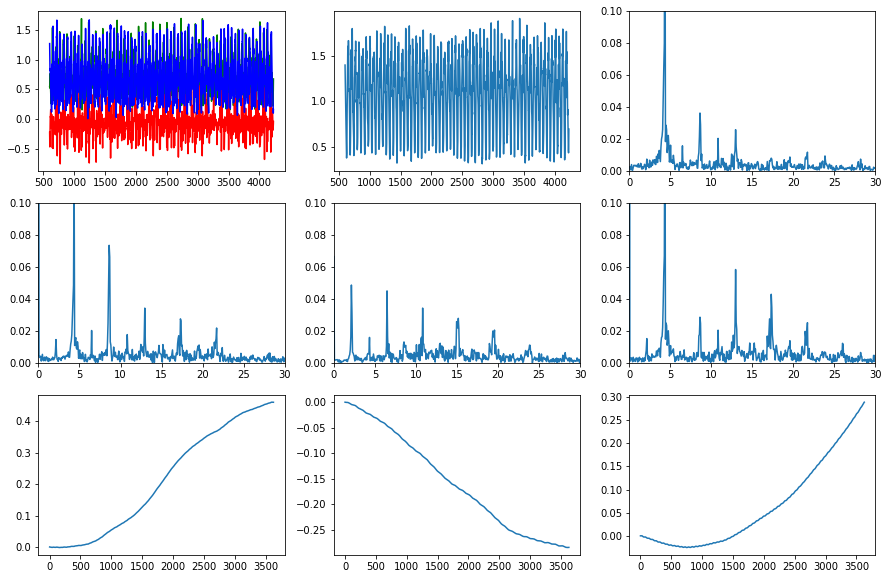

Александр Крупецков - 2021-07-0221.33.49 Крупецков ходьба Амплитуда: 1.6036375086044719
Александр Крупецков - 2021-07-0221.33.49 Крупецков ходьба Среднее: 1.0690925645872693
Александр Крупецков - 2021-07-0317.42.28 Крупецков велосипед
Александр Крупецков - 2021-07-0317.42.28 Крупецков велосипед
New means: -6.8826788423398224e-18 -6.851393938511005e-17 0.9523541764827262


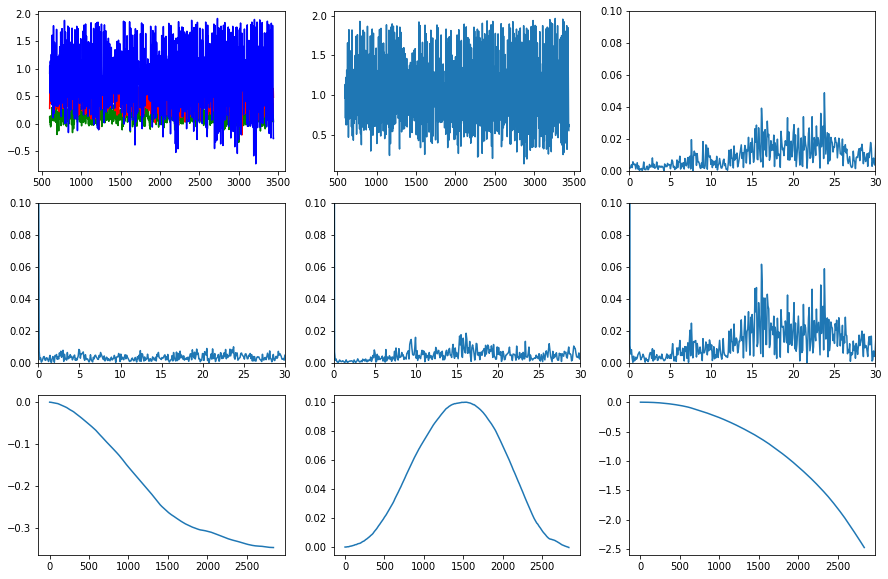

Александр Крупецков - 2021-07-0317.42.28 Крупецков велосипед Амплитуда: 1.8356599423488467
Александр Крупецков - 2021-07-0317.42.28 Крупецков велосипед Среднее: 1.0201697009431456
Александр Крупецков - 2021-07-0717.00.14 Крупецков стояние
Александр Крупецков - 2021-07-0717.00.14 Крупецков стояние
New means: -1.0486455806453977e-17 -5.3651634358601747e-17 0.9836341564378877


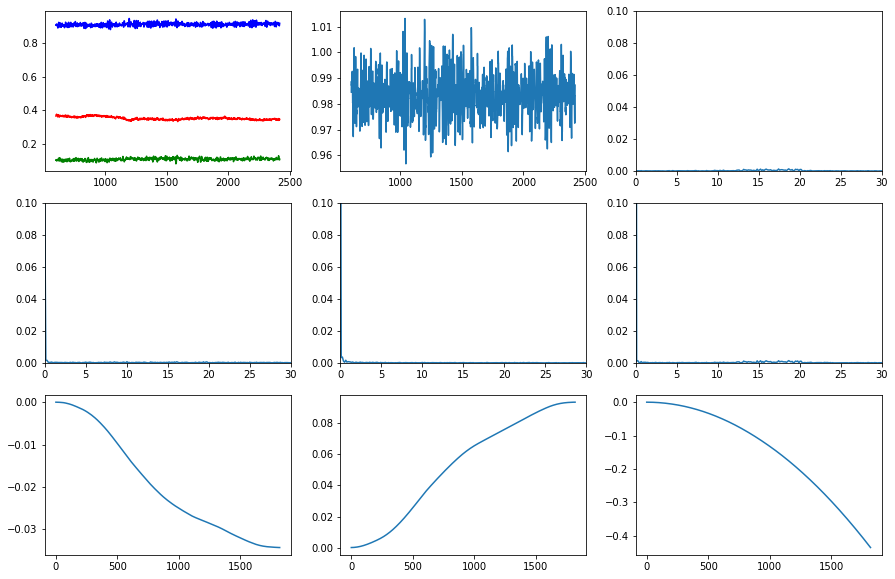

Александр Крупецков - 2021-07-0717.00.14 Крупецков стояние Амплитуда: 0.056443553595240226
Александр Крупецков - 2021-07-0717.00.14 Крупецков стояние Среднее: 0.9837105383275456
Александр Крупецков - 2021-07-0717.11.49 Крупецков бег
Александр Крупецков - 2021-07-0717.11.49 Крупецков бег
New means: 6.4051328343759035e-18 -6.832141690000964e-17 0.9532511884779334


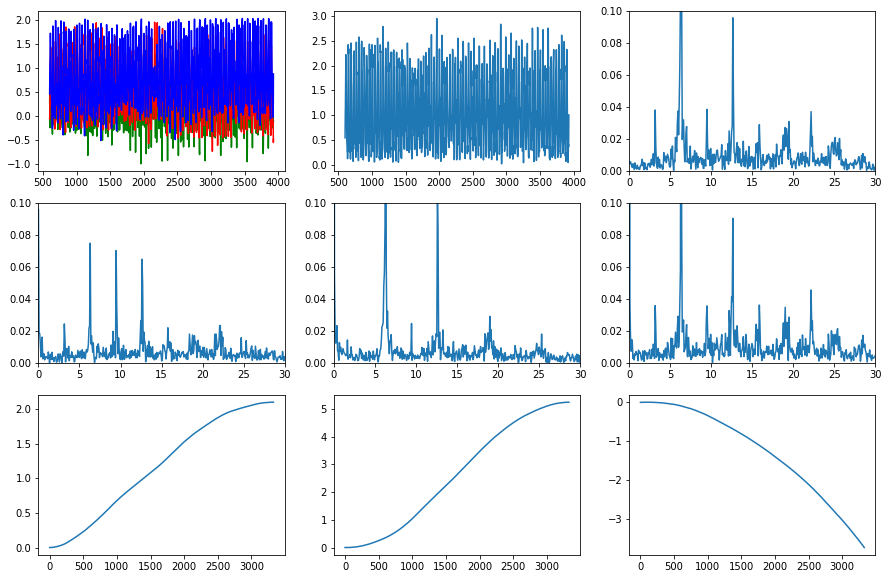

Александр Крупецков - 2021-07-0717.11.49 Крупецков бег Амплитуда: 2.9281453313951404
Александр Крупецков - 2021-07-0717.11.49 Крупецков бег Среднее: 1.0757871743952803
Александр Крупецков - 2021-07-0717.14.42 Крупецков лестница
Александр Крупецков - 2021-07-0717.14.42 Крупецков лестница
New means: -9.947598300641403e-17 -1.0658141036401503e-17 0.9793406692322266


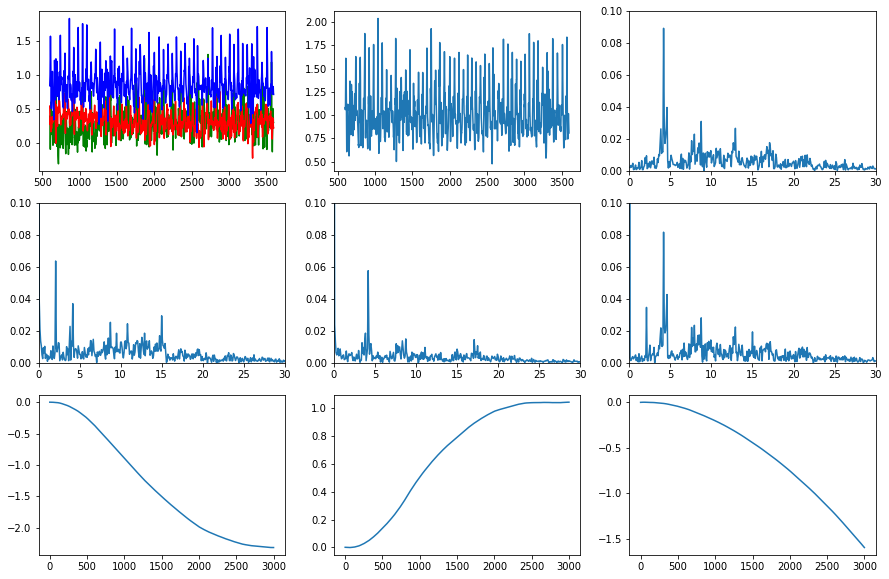

Александр Крупецков - 2021-07-0717.14.42 Крупецков лестница Амплитуда: 1.5643390164136104
Александр Крупецков - 2021-07-0717.14.42 Крупецков лестница Среднее: 1.0143978583894548
Александр Лишуди - Лишуди_автобус_1.csv
Александр Лишуди - Лишуди_автобус_1.csv
New means: 4.633218947520079e-18 -5.0965408422720876e-17 0.9962085334460902


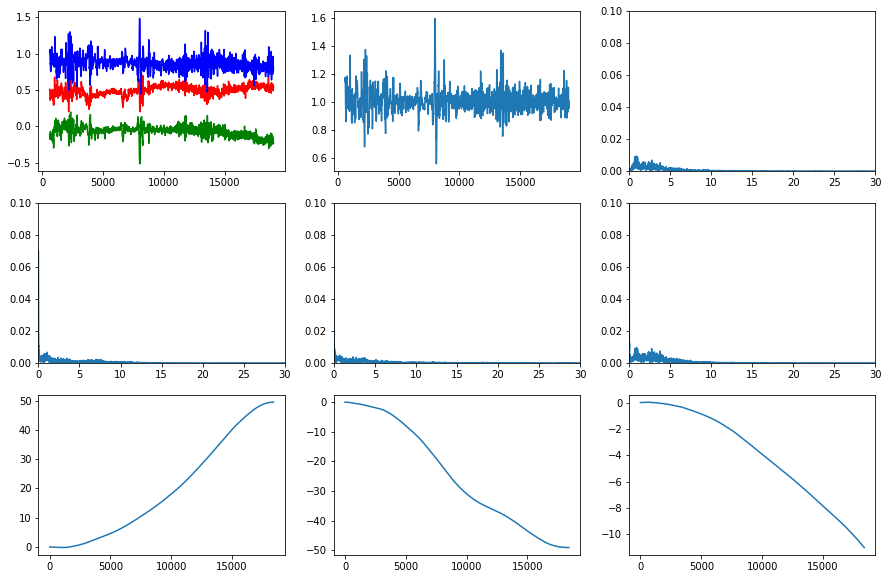

Александр Лишуди - Лишуди_автобус_1.csv Амплитуда: 1.0398597123538444
Александр Лишуди - Лишуди_автобус_1.csv Среднее: 1.0029752338018125
Александр Лишуди - Лишуди_автобус_2.csv
Александр Лишуди - Лишуди_автобус_2.csv
New means: 1.506922071027579e-17 -5.795854119336843e-18 0.9990747949048918


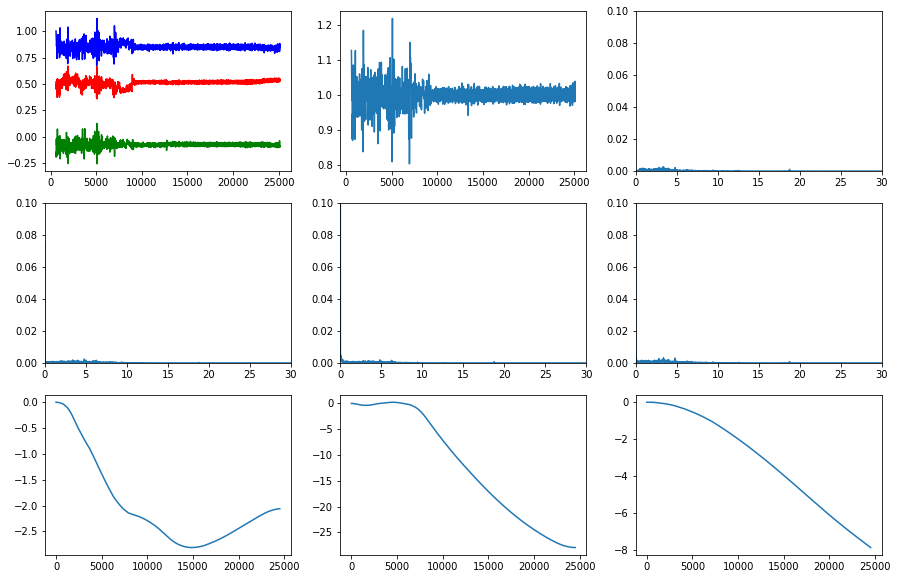

Александр Лишуди - Лишуди_автобус_2.csv Амплитуда: 0.4172454209351968
Александр Лишуди - Лишуди_автобус_2.csv Среднее: 0.9999732619228735
Александр Лишуди - Лишуди_автобус_3.csv
Александр Лишуди - Лишуди_автобус_3.csv
New means: 9.264256451183806e-18 3.8086387632644536e-17 0.9996841455547557


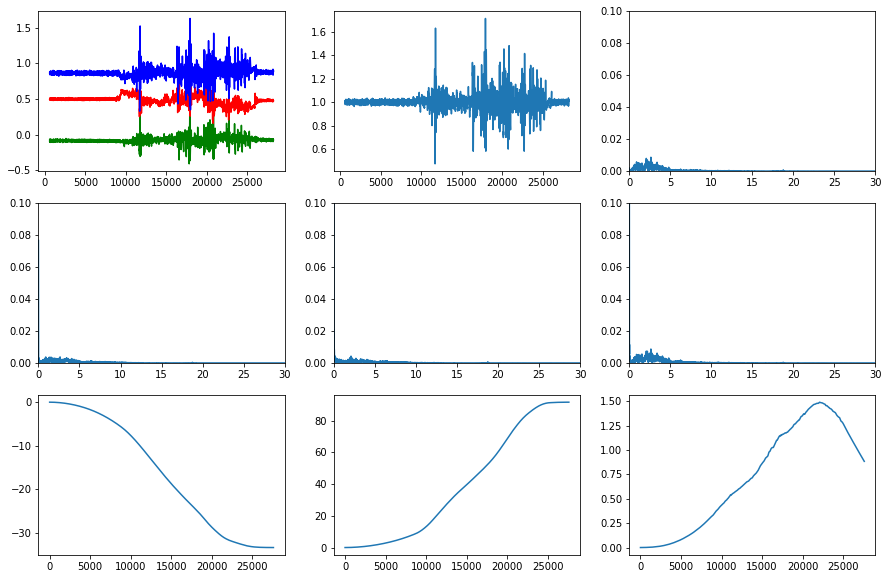

Александр Лишуди - Лишуди_автобус_3.csv Амплитуда: 1.2338388963006581
Александр Лишуди - Лишуди_автобус_3.csv Среднее: 1.0041735939415672
Александр Лишуди - Лишуди_автобус_4.csv
Александр Лишуди - Лишуди_автобус_4.csv
New means: -1.5203403948137333e-17 7.457436097188533e-17 0.9992573873286991


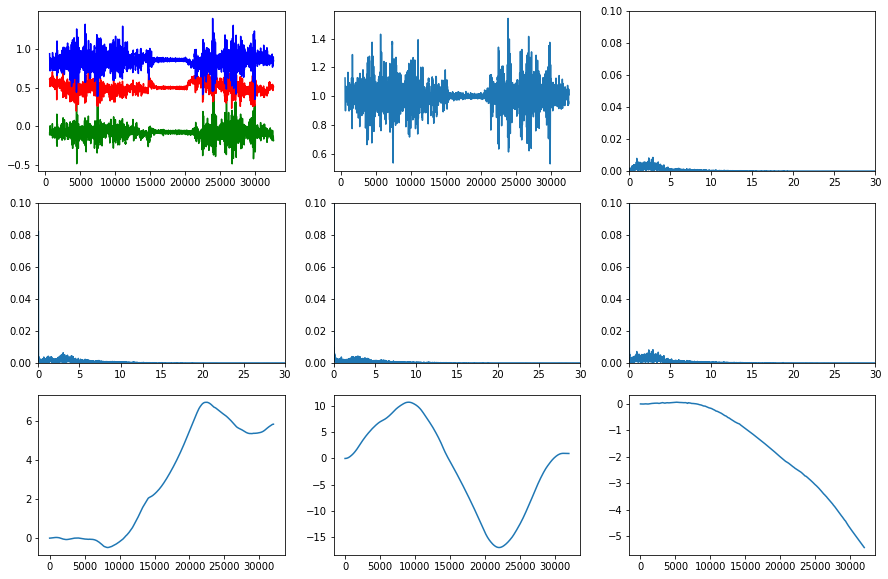

Александр Лишуди - Лишуди_автобус_4.csv Амплитуда: 1.0091019031274517
Александр Лишуди - Лишуди_автобус_4.csv Среднее: 1.0052996777423038
Александр Лишуди - Лишуди_стояние_1.csv
Александр Лишуди - Лишуди_стояние_1.csv
New means: 1.0316878054504835e-17 9.801034151779593e-17 0.9417847409958633


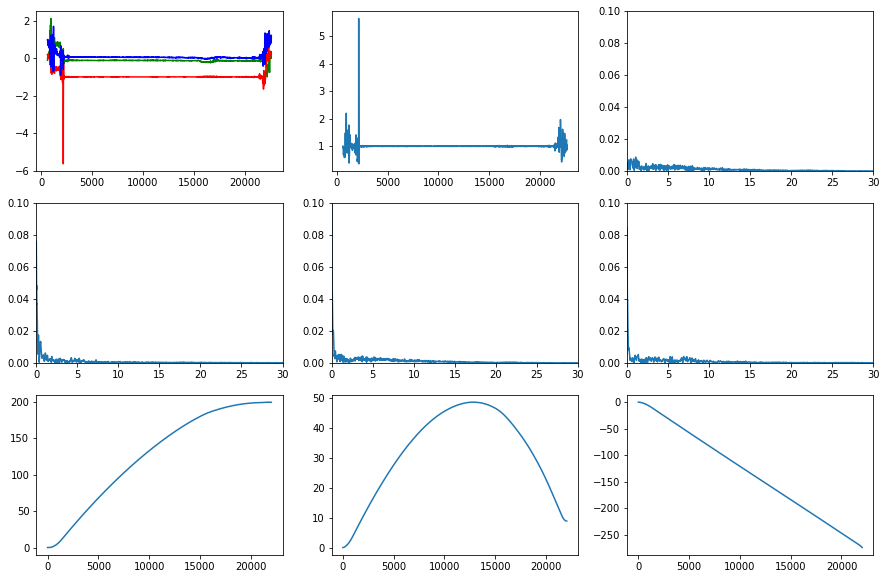

Александр Лишуди - Лишуди_стояние_1.csv Амплитуда: 5.270792312361508
Александр Лишуди - Лишуди_стояние_1.csv Среднее: 1.0092416371521304
Александр Лишуди - Лишуди_стояние_2.csv
Александр Лишуди - Лишуди_стояние_2.csv
New means: -6.62919750726306e-17 2.729669561814201e-17 0.9231005884586329


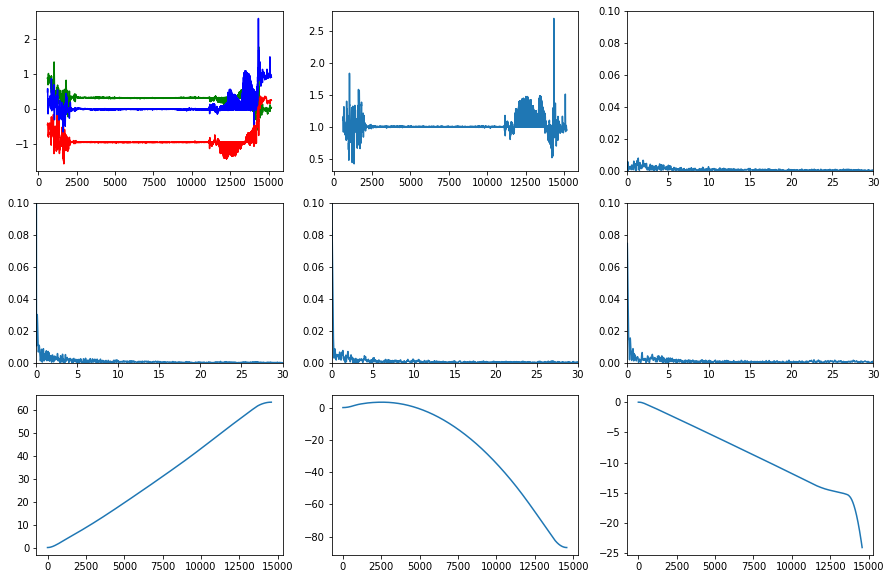

Александр Лишуди - Лишуди_стояние_2.csv Амплитуда: 2.275255034339257
Александр Лишуди - Лишуди_стояние_2.csv Среднее: 1.0103511115718653
Александр Лишуди - Лишуди_стояние_3.csv
Александр Лишуди - Лишуди_стояние_3.csv
New means: -1.7162004386094103e-17 -2.753071536935929e-17 0.9938549923647385


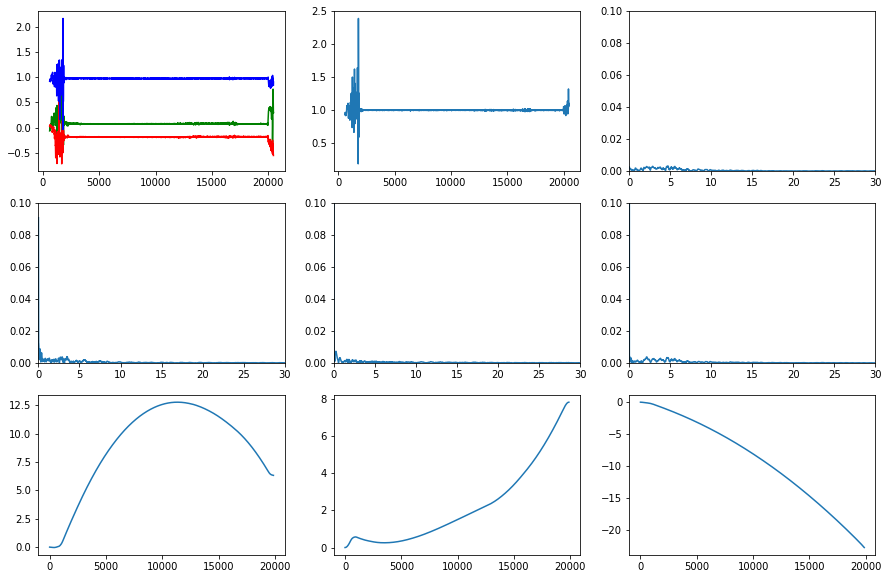

Александр Лишуди - Лишуди_стояние_3.csv Амплитуда: 2.2123933524011954
Александр Лишуди - Лишуди_стояние_3.csv Среднее: 0.9986216792175737
Александр Лишуди - Лишуди_стояние_4.csv
Александр Лишуди - Лишуди_стояние_4.csv
New means: -8.864736626565549e-17 2.098162515163444e-18 0.975418512033946


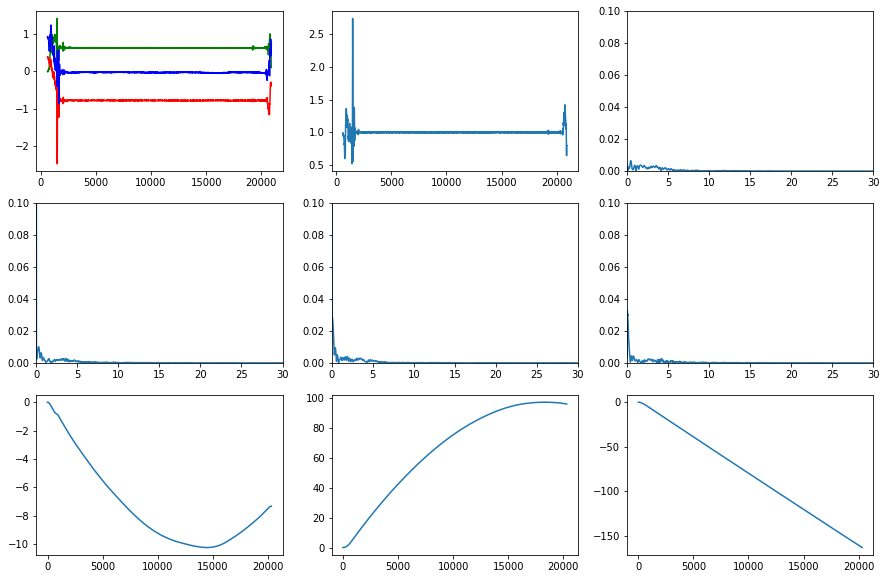

Александр Лишуди - Лишуди_стояние_4.csv Амплитуда: 2.2248244856296555
Александр Лишуди - Лишуди_стояние_4.csv Среднее: 1.0047289069252687
Александр Лишуди - Лишуди_ходьба_1.csv
Александр Лишуди - Лишуди_ходьба_1.csv
New means: -2.7623393362235404e-18 4.419742937957665e-17 0.9287577275332257


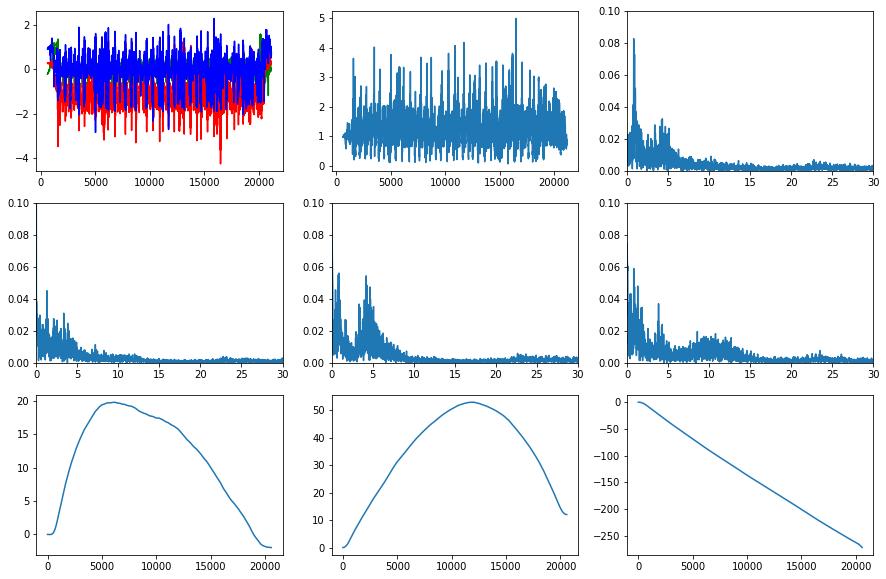

Александр Лишуди - Лишуди_ходьба_1.csv Амплитуда: 4.910559261985718
Александр Лишуди - Лишуди_ходьба_1.csv Среднее: 1.227174113156103
Александр Лишуди - Лишуди_ходьба_2.csv
Александр Лишуди - Лишуди_ходьба_2.csv
New means: -1.5278261383376184e-17 1.6573029297221623e-16 0.9459887065302623


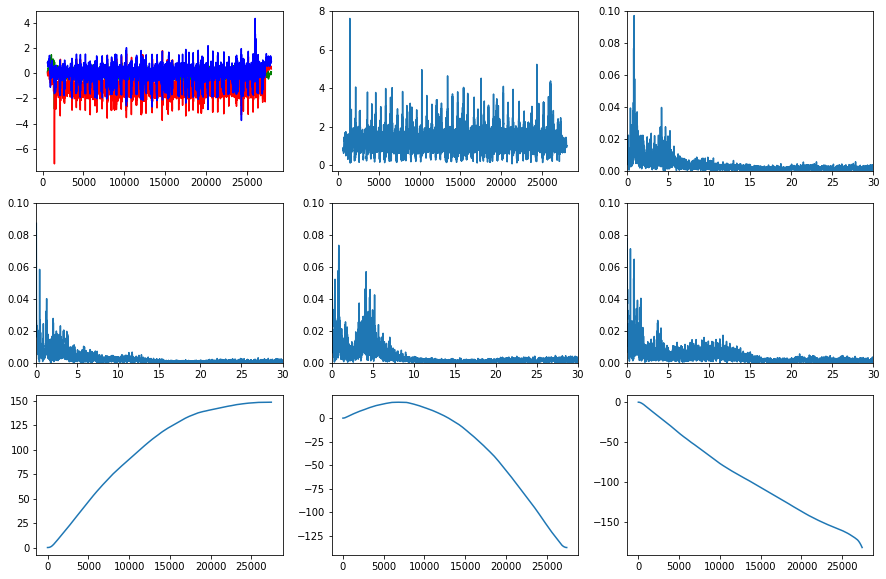

Александр Лишуди - Лишуди_ходьба_2.csv Амплитуда: 7.554956632660712
Александр Лишуди - Лишуди_ходьба_2.csv Среднее: 1.2277272651079192
Александр Лишуди - Лишуди_ходьба_3.csv
Александр Лишуди - Лишуди_ходьба_3.csv
New means: 1.8985368736910108e-17 1.1513707492061613e-16 0.9504769764653201


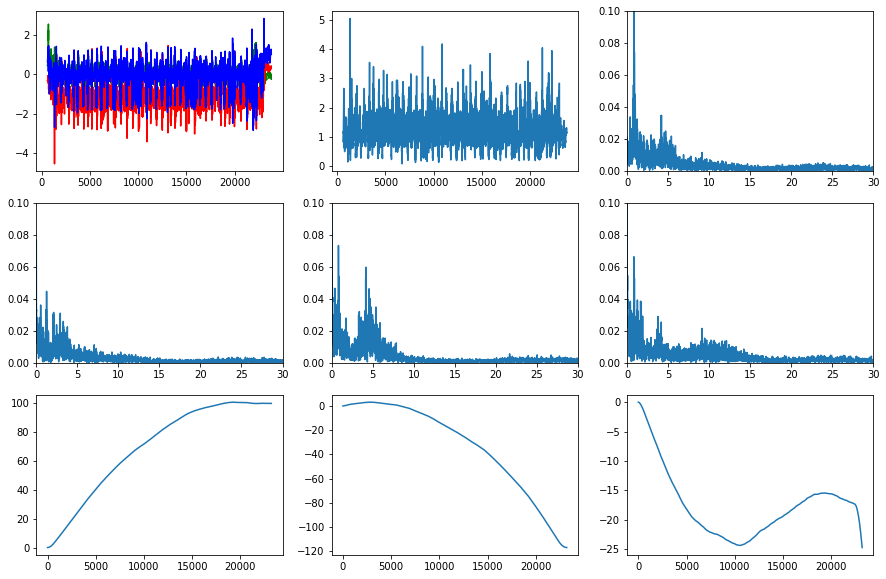

Александр Лишуди - Лишуди_ходьба_3.csv Амплитуда: 4.967362371614219
Александр Лишуди - Лишуди_ходьба_3.csv Среднее: 1.2239629527348588
Александр Лишуди - Лишуди_ходьба_4.csv
Александр Лишуди - Лишуди_ходьба_4.csv
New means: -1.0588746927075844e-17 -1.5126781324394063e-17 0.9497080597447637


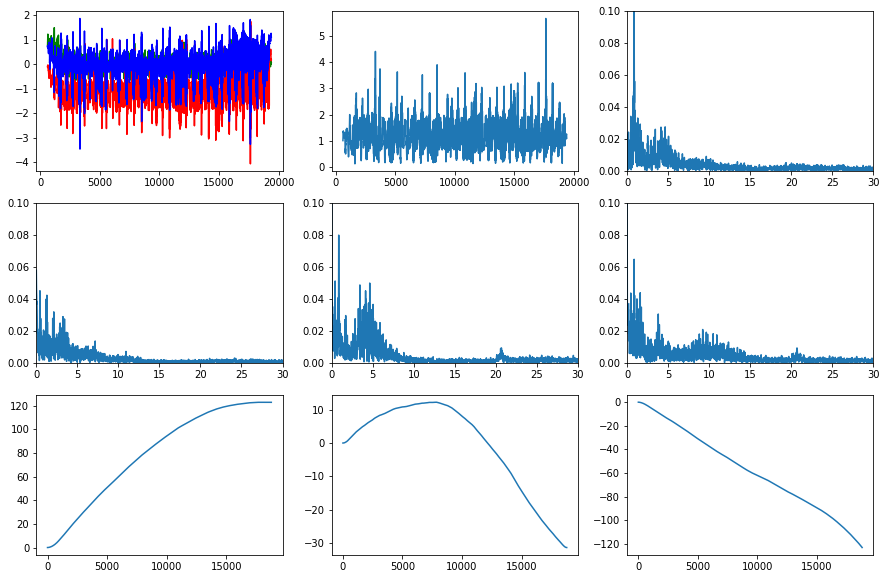

Александр Лишуди - Лишуди_ходьба_4.csv Амплитуда: 5.5216663650689535
Александр Лишуди - Лишуди_ходьба_4.csv Среднее: 1.2002531117339934
Анастасия Митченко - 2021-07-0313.30.53_Митченко_стояние.csv
Анастасия Митченко - 2021-07-0313.30.53_Митченко_стояние.csv
New means: 1.667261776714709e-16 6.124635098135665e-17 1.0257955718749352


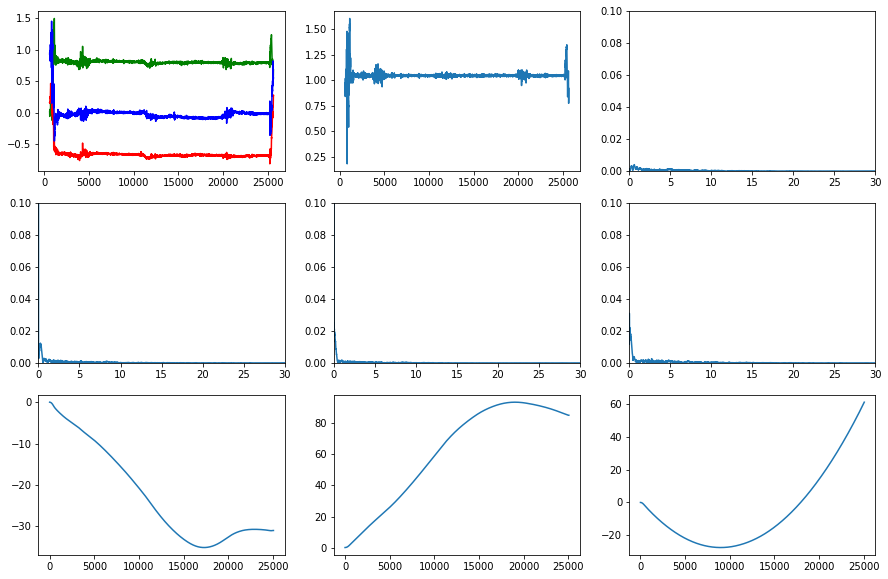

Анастасия Митченко - 2021-07-0313.30.53_Митченко_стояние.csv Амплитуда: 1.4238131442171436
Анастасия Митченко - 2021-07-0313.30.53_Митченко_стояние.csv Среднее: 1.0461012833389245
Анастасия Митченко - 2021-07-0313.33.44_Митченко_стояние.csv
Анастасия Митченко - 2021-07-0313.33.44_Митченко_стояние.csv
New means: -1.6227623801217287e-17 -9.347111309501158e-17 1.0066899343802247


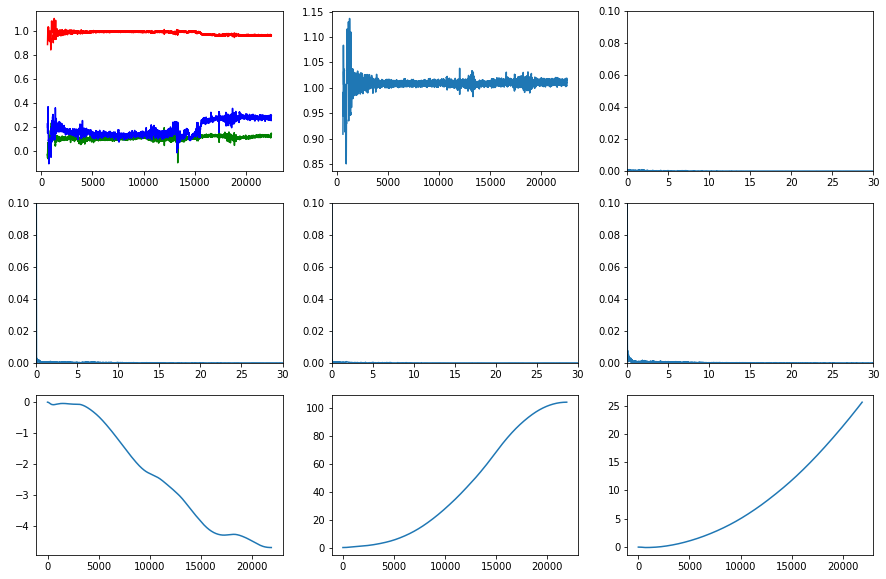

Анастасия Митченко - 2021-07-0313.33.44_Митченко_стояние.csv Амплитуда: 0.28589482619879714
Анастасия Митченко - 2021-07-0313.33.44_Митченко_стояние.csv Среднее: 1.0090712779942168
Анастасия Митченко - 2021-07-0313.35.30_Митченко_стояние.csv
Анастасия Митченко - 2021-07-0313.35.30_Митченко_стояние.csv
New means: 1.6451482055552326e-17 -1.0322498544660283e-17 1.0055887275393924


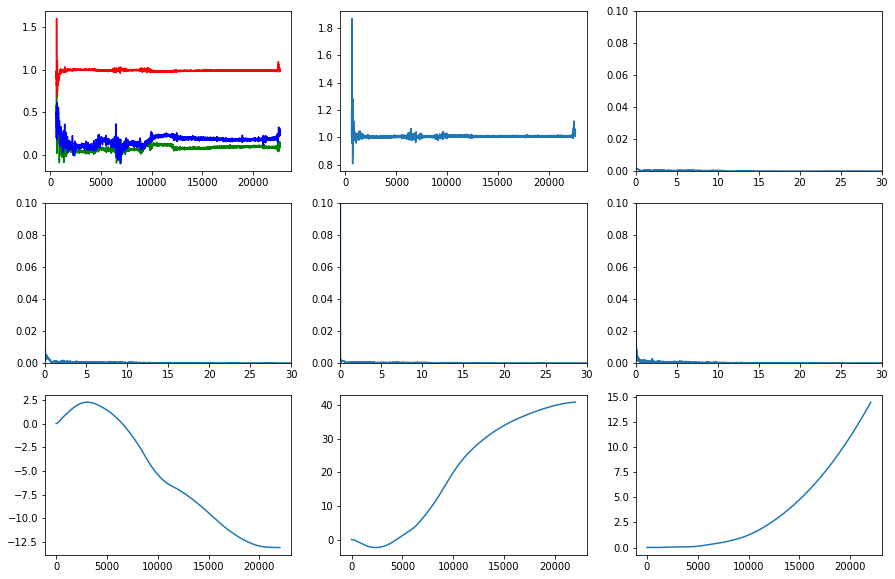

Анастасия Митченко - 2021-07-0313.35.30_Митченко_стояние.csv Амплитуда: 1.0642078594876652
Анастасия Митченко - 2021-07-0313.35.30_Митченко_стояние.csv Среднее: 1.0082394872234017
Анастасия Митченко - 2021-07-0313.37.30_Митченко_стояние.csv
Анастасия Митченко - 2021-07-0313.37.30_Митченко_стояние.csv
New means: 8.662891492329011e-18 1.0519225383542369e-16 1.000264040543117


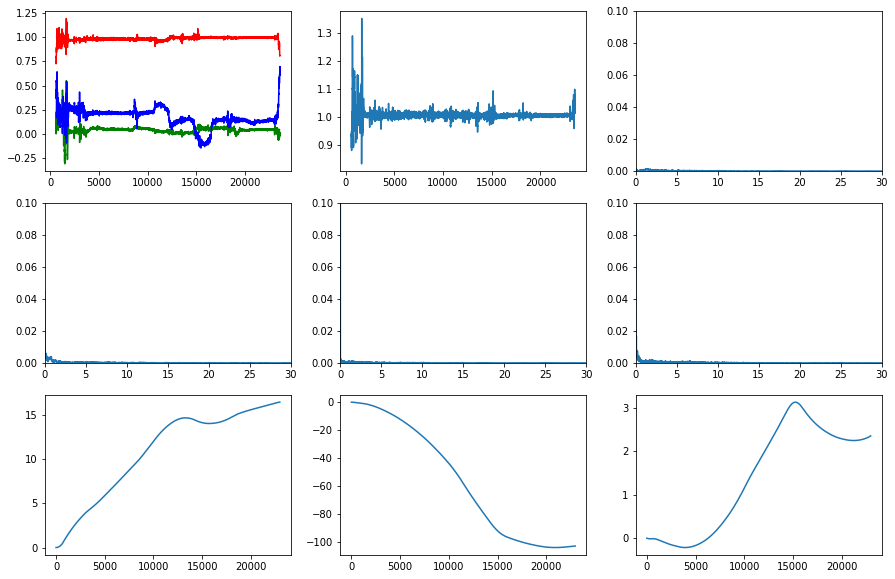

Анастасия Митченко - 2021-07-0313.37.30_Митченко_стояние.csv Амплитуда: 0.518851171606359
Анастасия Митченко - 2021-07-0313.37.30_Митченко_стояние.csv Среднее: 1.0058375921262357
Анастасия Митченко - 2021-07-0413.06.01_Митченко_ходьба.csv
Анастасия Митченко - 2021-07-0413.06.01_Митченко_ходьба.csv
New means: 3.578118318864439e-18 -1.2594976482402823e-16 0.858659004399854


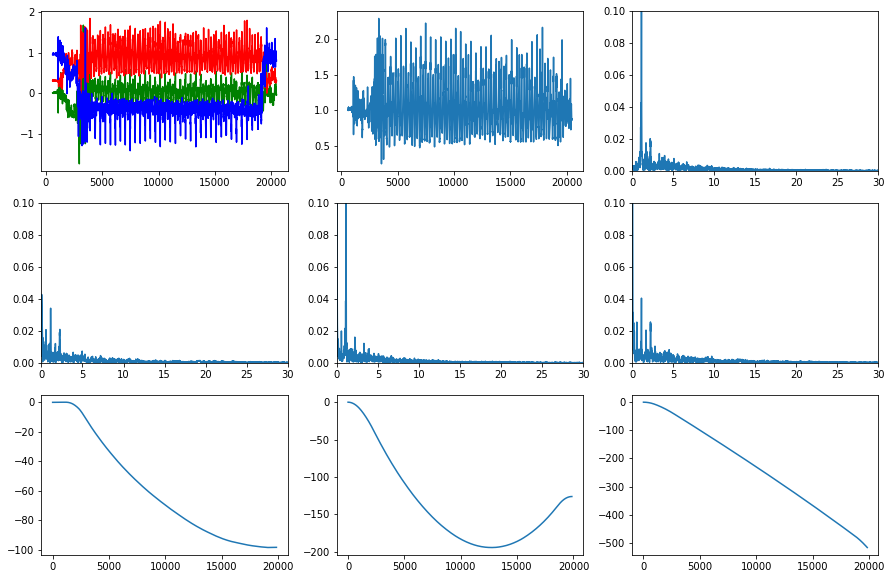

Анастасия Митченко - 2021-07-0413.06.01_Митченко_ходьба.csv Амплитуда: 2.041924499394278
Анастасия Митченко - 2021-07-0413.06.01_Митченко_ходьба.csv Среднее: 1.0234844348031438
Анастасия Митченко - 2021-07-0413.12.24_Митченко_ходьба.csv
Анастасия Митченко - 2021-07-0413.12.24_Митченко_ходьба.csv
New means: -3.489129541595494e-17 3.839042246340028e-17 0.9593498457564922


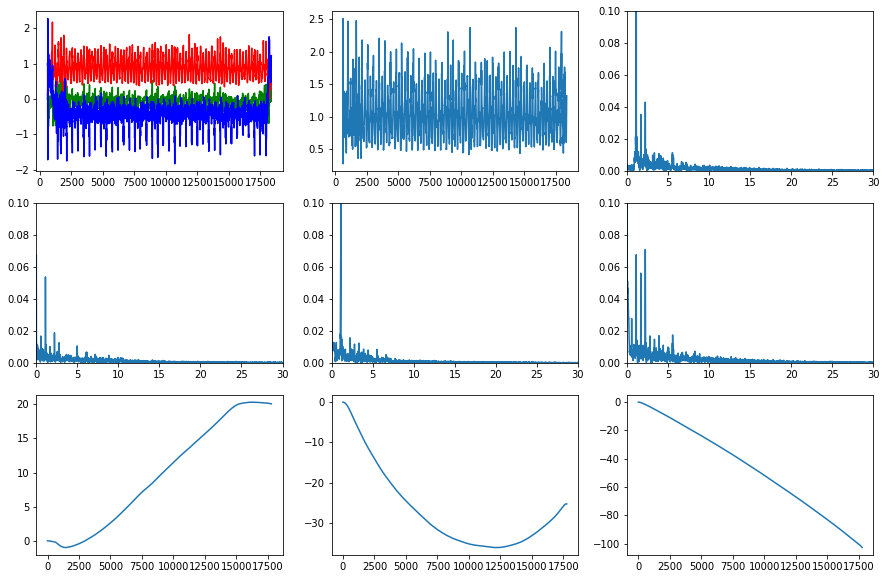

Анастасия Митченко - 2021-07-0413.12.24_Митченко_ходьба.csv Амплитуда: 2.232545478965632
Анастасия Митченко - 2021-07-0413.12.24_Митченко_ходьба.csv Среднее: 1.022222560935475
Анастасия Митченко - 2021-07-0413.14.05_Митченко_ходьба.csv
Анастасия Митченко - 2021-07-0413.14.05_Митченко_ходьба.csv
New means: 3.0854833438714028e-18 5.955472612932739e-17 0.9278435287756372


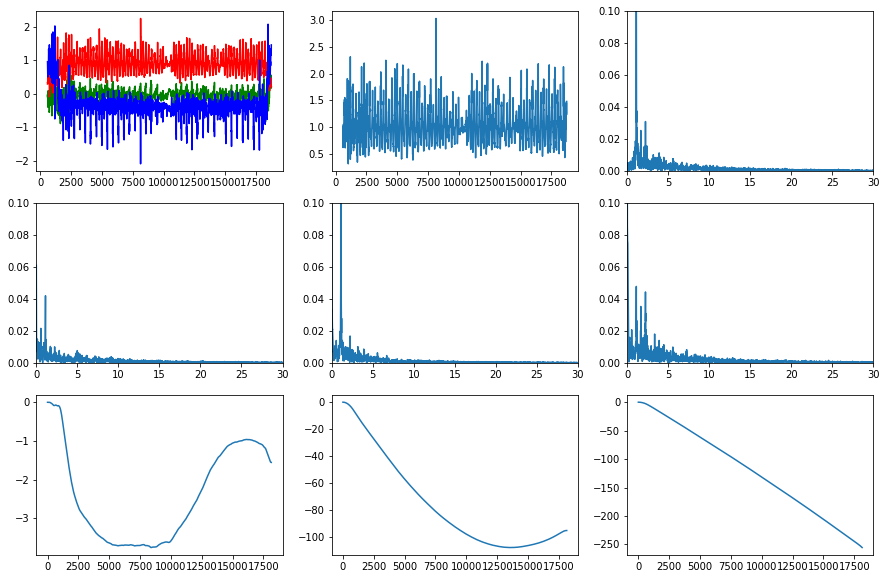

Анастасия Митченко - 2021-07-0413.14.05_Митченко_ходьба.csv Амплитуда: 2.7058381914948924
Анастасия Митченко - 2021-07-0413.14.05_Митченко_ходьба.csv Среднее: 1.0236505047748916
Анастасия Митченко - 2021-07-0413.15.39_Митченко_ходьба.csv
Анастасия Митченко - 2021-07-0413.15.39_Митченко_ходьба.csv
New means: 2.1097326040383887e-17 0.0 0.9071275561663149


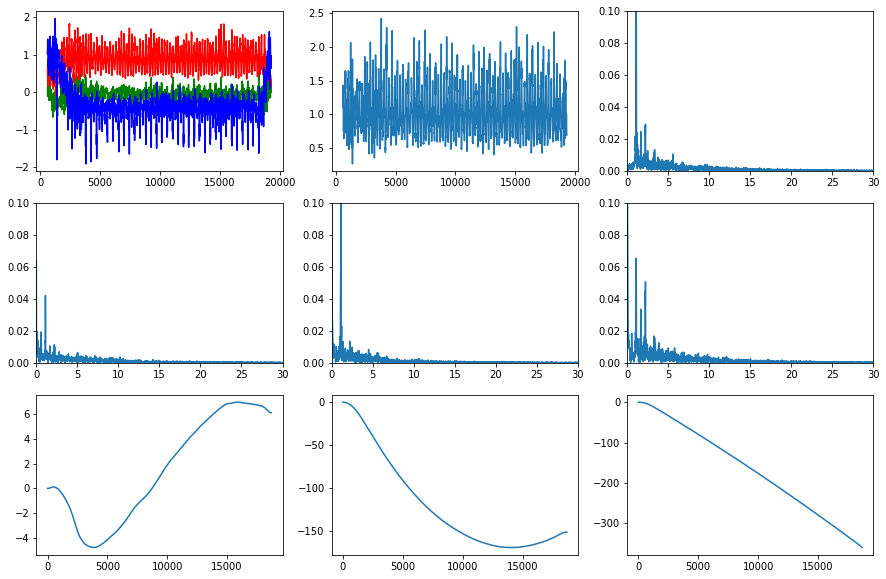

Анастасия Митченко - 2021-07-0413.15.39_Митченко_ходьба.csv Амплитуда: 2.156041610178825
Анастасия Митченко - 2021-07-0413.15.39_Митченко_ходьба.csv Среднее: 1.0223690367873934
Анастасия Митченко - 2021-07-0413.38.31_Митченко_велосипед.csv
Анастасия Митченко - 2021-07-0413.38.31_Митченко_велосипед.csv
New means: -6.951804883610502e-17 -1.9862299667458578e-17 0.8636529396334154


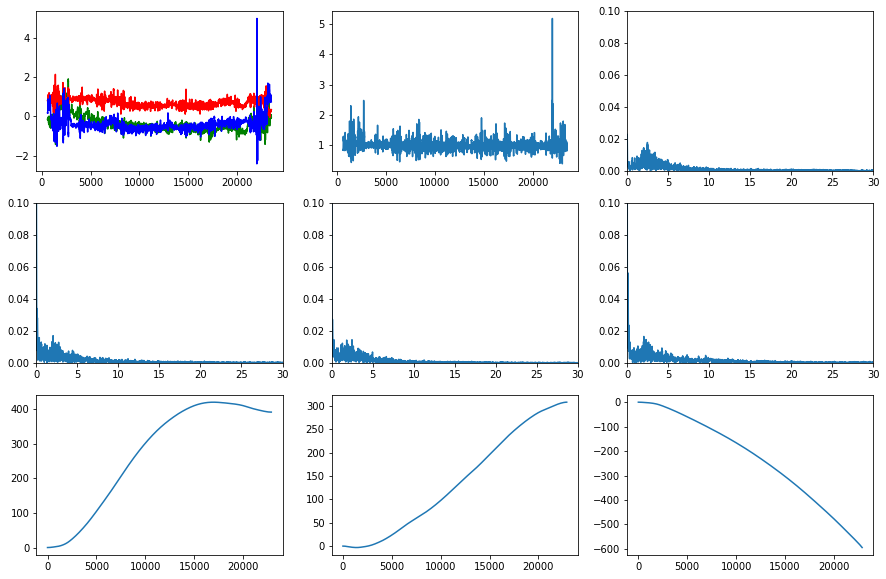

Анастасия Митченко - 2021-07-0413.38.31_Митченко_велосипед.csv Амплитуда: 4.789280950927073
Анастасия Митченко - 2021-07-0413.38.31_Митченко_велосипед.csv Среднее: 0.9965877103559376
Анастасия Митченко - 2021-07-0413.40.06_Митченко_велосипед.csv
Анастасия Митченко - 2021-07-0413.40.06_Митченко_велосипед.csv
New means: -1.3944802561076208e-16 -9.78582635864997e-18 0.8432584979459956


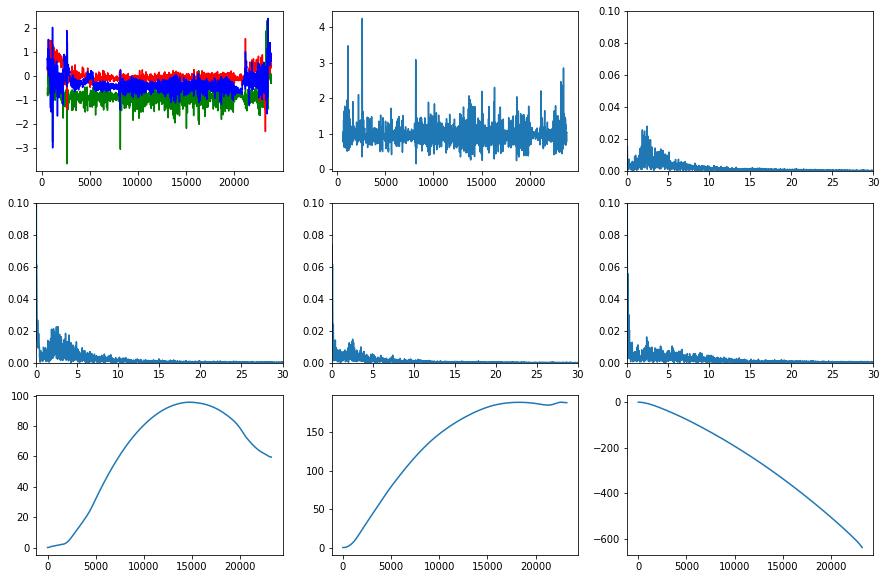

Анастасия Митченко - 2021-07-0413.40.06_Митченко_велосипед.csv Амплитуда: 4.083700574260776
Анастасия Митченко - 2021-07-0413.40.06_Митченко_велосипед.csv Среднее: 0.9804455213272817
Анастасия Митченко - 2021-07-0413.41.35_Митченко_велосипед.csv
Анастасия Митченко - 2021-07-0413.41.35_Митченко_велосипед.csv
New means: 1.2826259953248797e-17 4.104403185039615e-17 0.996256531783138


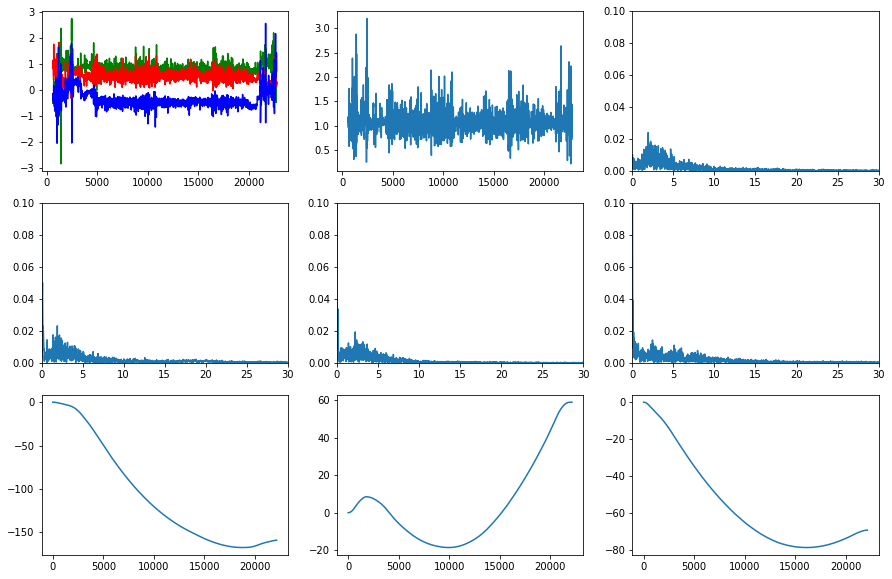

Анастасия Митченко - 2021-07-0413.41.35_Митченко_велосипед.csv Амплитуда: 2.970894084443863
Анастасия Митченко - 2021-07-0413.41.35_Митченко_велосипед.csv Среднее: 1.0738549179829497
Анастасия Митченко - 2021-07-0413.43.00_Митченко_велосипед.csv
Анастасия Митченко - 2021-07-0413.43.00_Митченко_велосипед.csv
New means: 1.6571284077042095e-16 2.4791684839669275e-17 1.0133204180158637


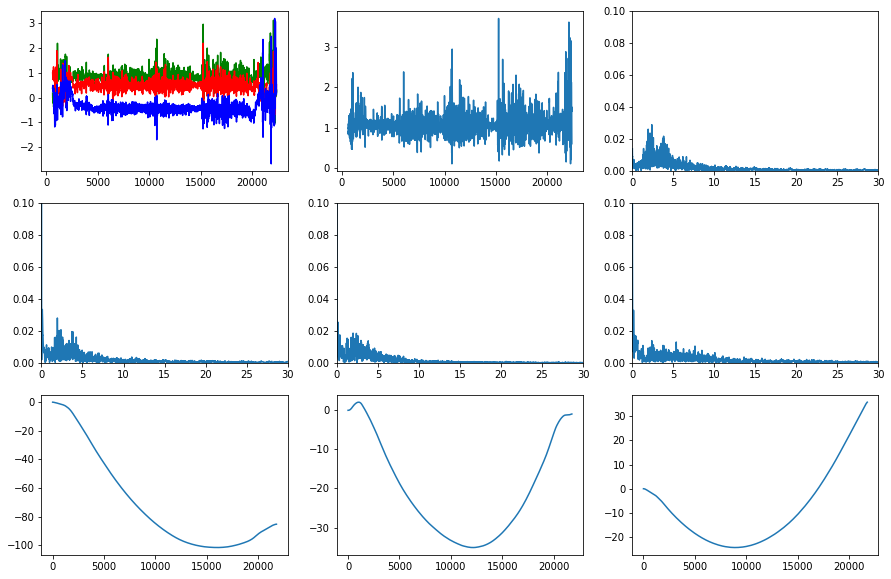

Анастасия Митченко - 2021-07-0413.43.00_Митченко_велосипед.csv Амплитуда: 3.6001313503195433
Анастасия Митченко - 2021-07-0413.43.00_Митченко_велосипед.csv Среднее: 1.0825128903203327
Анастасия Митченко - 2021-07-0616.17.18_Митченко_лестница.csv
Анастасия Митченко - 2021-07-0616.17.18_Митченко_лестница.csv
New means: -5.608388284738909e-18 1.1537255900034328e-16 0.9666941581219333


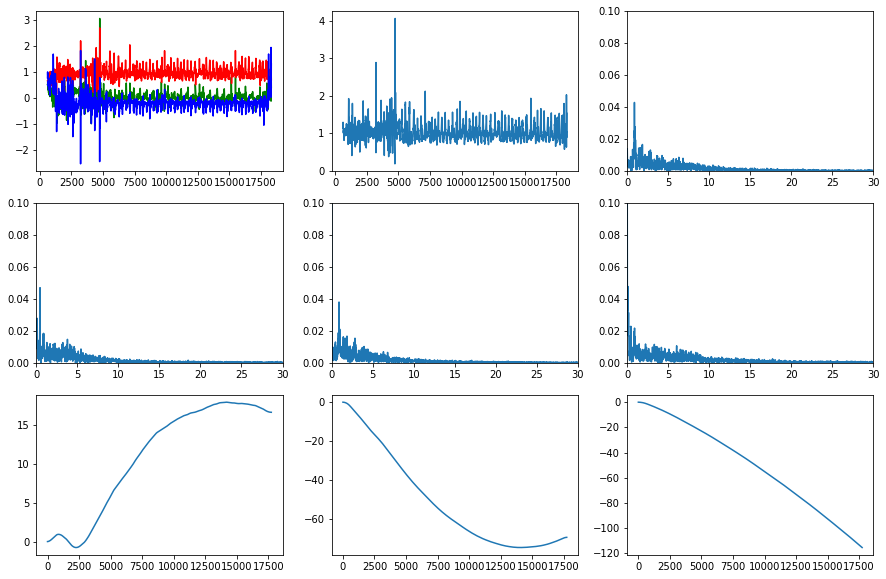

Анастасия Митченко - 2021-07-0616.17.18_Митченко_лестница.csv Амплитуда: 3.881317628351139
Анастасия Митченко - 2021-07-0616.17.18_Митченко_лестница.csv Среднее: 1.0268110440205651
Анастасия Митченко - 2021-07-0616.19.34_Митченко_лестница.csv
Анастасия Митченко - 2021-07-0616.19.34_Митченко_лестница.csv
New means: -1.0870612090905566e-16 -3.2941248760319896e-18 0.9147209757466491


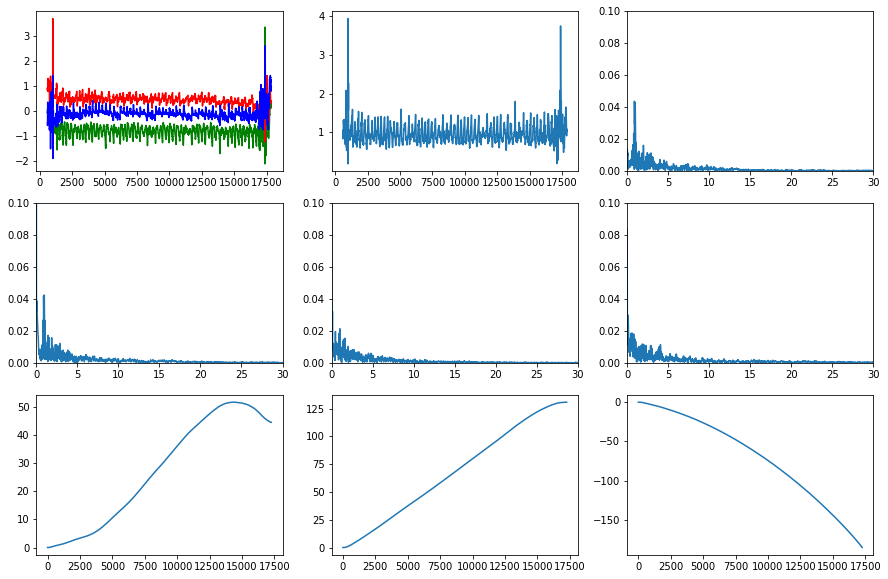

Анастасия Митченко - 2021-07-0616.19.34_Митченко_лестница.csv Амплитуда: 3.7562790003921522
Анастасия Митченко - 2021-07-0616.19.34_Митченко_лестница.csv Среднее: 0.9747276300438681
Анастасия Митченко - 2021-07-0616.21.32_Митченко_лестница.csv
Анастасия Митченко - 2021-07-0616.21.32_Митченко_лестница.csv
New means: -1.2766534151526026e-17 -3.319298879396767e-17 1.016976978339182


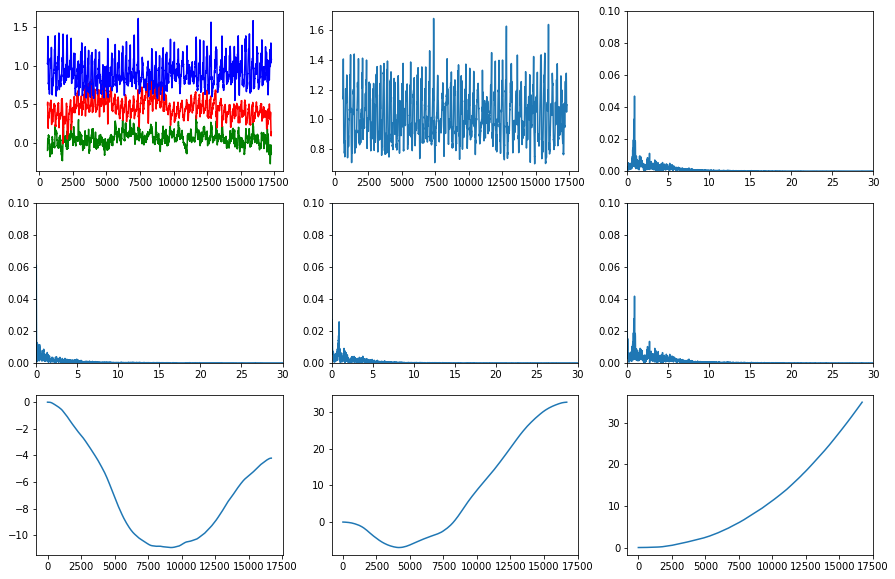

Анастасия Митченко - 2021-07-0616.21.32_Митченко_лестница.csv Амплитуда: 0.9773547639075321
Анастасия Митченко - 2021-07-0616.21.32_Митченко_лестница.csv Среднее: 1.0279934064275518
Анастасия Митченко - 2021-07-0616.38.20_Митченко_лестница.csv
Анастасия Митченко - 2021-07-0616.38.20_Митченко_лестница.csv
New means: -1.0577790512317552e-17 2.847866676393187e-18 1.022775366522514


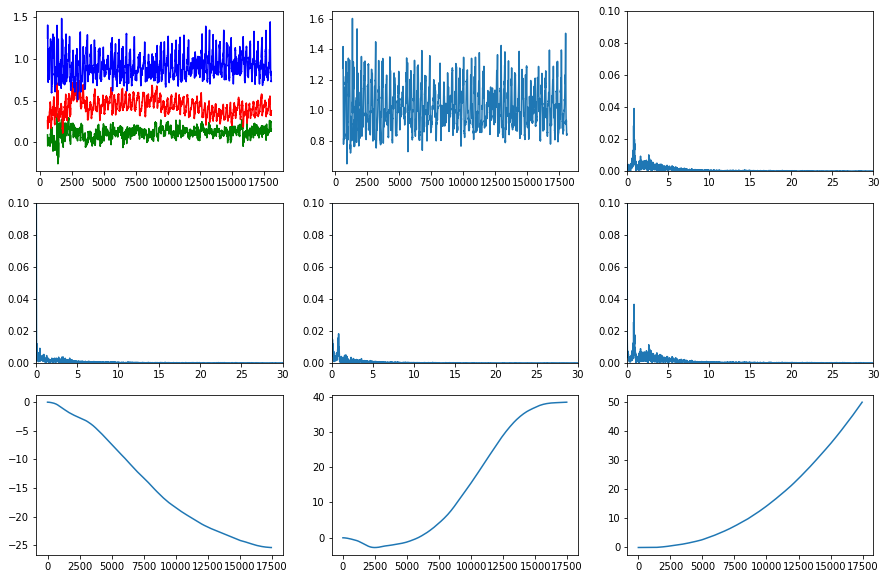

Анастасия Митченко - 2021-07-0616.38.20_Митченко_лестница.csv Амплитуда: 0.9543137309741913
Анастасия Митченко - 2021-07-0616.38.20_Митченко_лестница.csv Среднее: 1.0296926450514208
Анастасия Митченко - 2021-07-0619.30.03_Митченко_бег.csv
Анастасия Митченко - 2021-07-0619.30.03_Митченко_бег.csv
New means: 1.4033338974330134e-16 0.0 1.0141604230229697


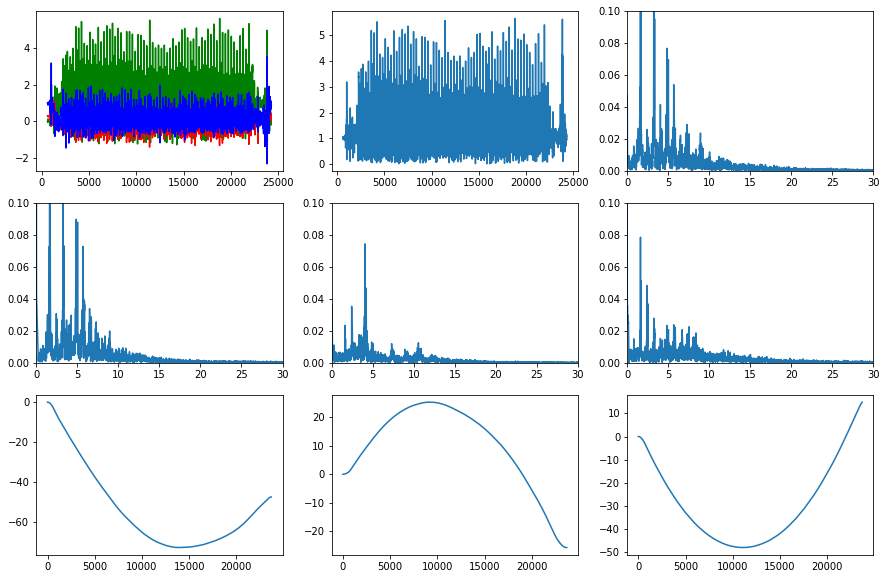

Анастасия Митченко - 2021-07-0619.30.03_Митченко_бег.csv Амплитуда: 5.60987925898751
Анастасия Митченко - 2021-07-0619.30.03_Митченко_бег.csv Среднее: 1.3169572693415064
Анастасия Митченко - 2021-07-0619.31.33_Митченко_бег.csv
Анастасия Митченко - 2021-07-0619.31.33_Митченко_бег.csv
New means: -1.8898310711263648e-16 2.699758673037664e-18 1.0122325733249098


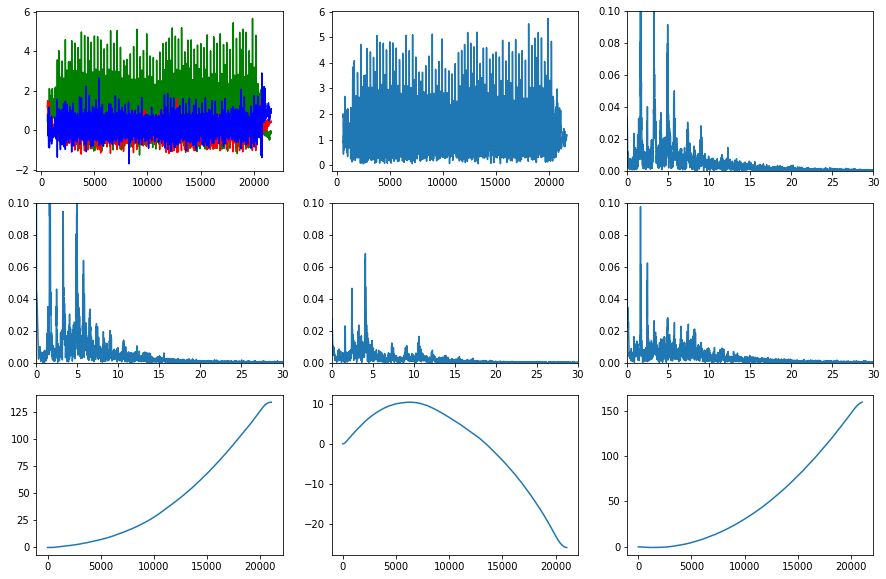

Анастасия Митченко - 2021-07-0619.31.33_Митченко_бег.csv Амплитуда: 5.690848038252908
Анастасия Митченко - 2021-07-0619.31.33_Митченко_бег.csv Среднее: 1.3310142800932083
Анастасия Митченко - 2021-07-0619.32.55_Митченко_бег.csv
Анастасия Митченко - 2021-07-0619.32.55_Митченко_бег.csv
New means: -1.389963842080448e-16 -6.7803114247826726e-18 1.0425950531766621


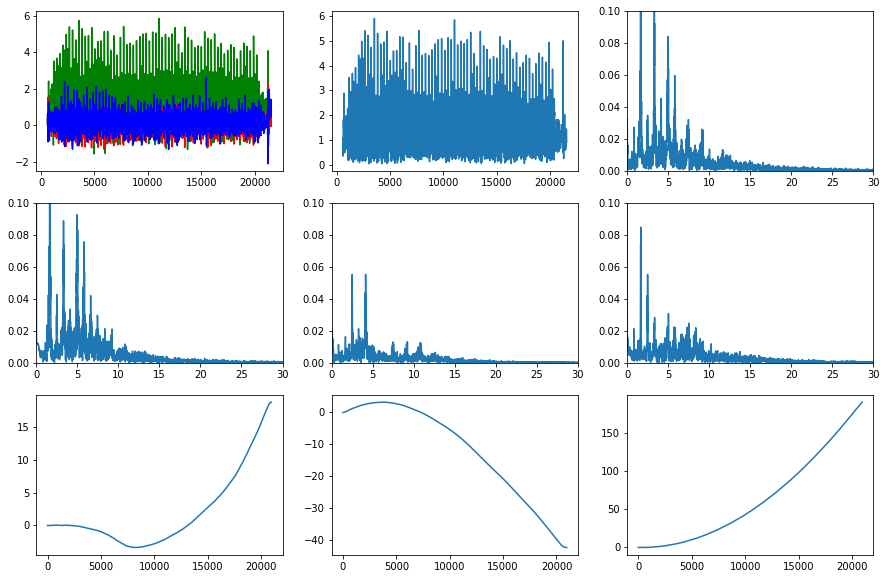

Анастасия Митченко - 2021-07-0619.32.55_Митченко_бег.csv Амплитуда: 5.883807542449248
Анастасия Митченко - 2021-07-0619.32.55_Митченко_бег.csv Среднее: 1.3383493970012146
Анастасия Митченко - 2021-07-0619.34.12_Митченко_бег.csv
Анастасия Митченко - 2021-07-0619.34.12_Митченко_бег.csv
New means: -7.160855130486013e-17 1.0328156438200981e-17 1.0475619406329295


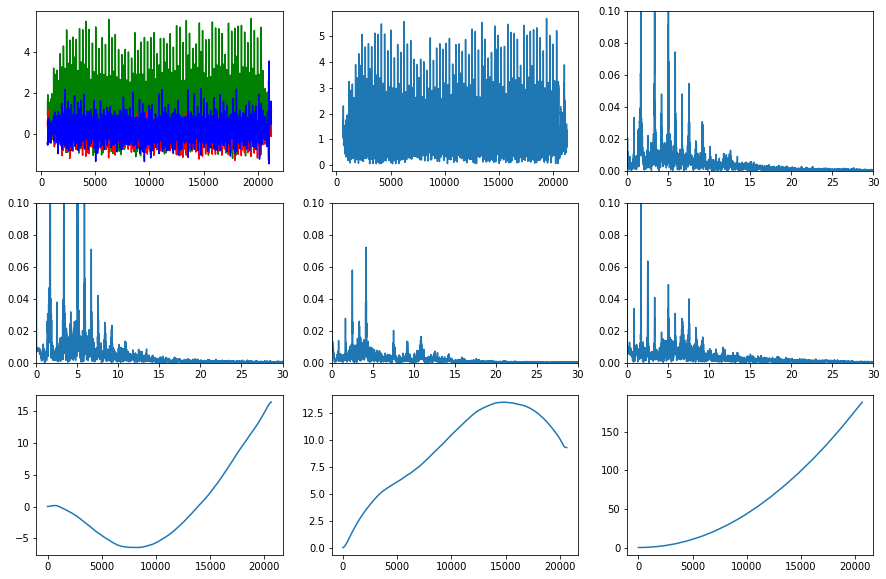

Анастасия Митченко - 2021-07-0619.34.12_Митченко_бег.csv Амплитуда: 5.651776091858696
Анастасия Митченко - 2021-07-0619.34.12_Митченко_бег.csv Среднее: 1.3432144289548982
Анатолий Самарский - Самарский_бег_1.csv
Анатолий Самарский - Самарский_бег_1.csv
New means: 0.0 1.303661470915294e-16 1.1659328935315754


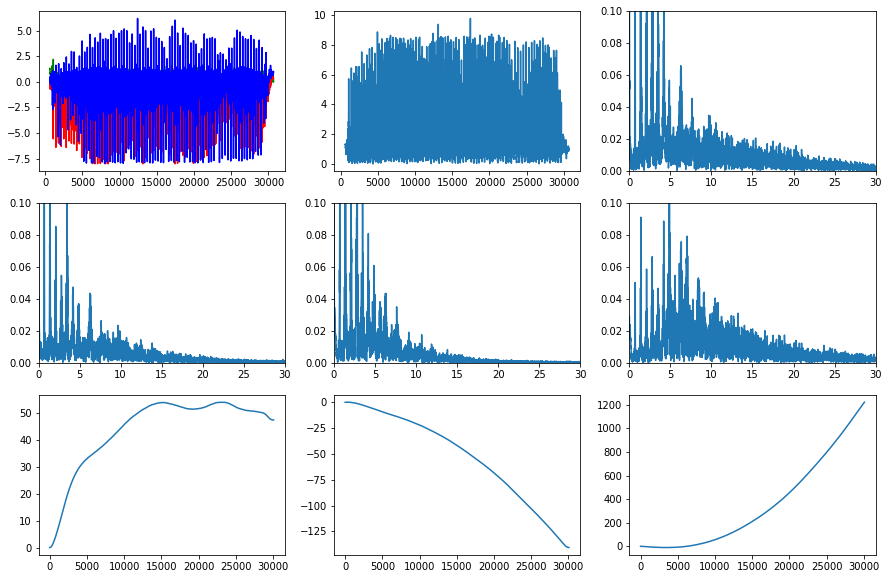

Анатолий Самарский - Самарский_бег_1.csv Амплитуда: 9.736080946471649
Анатолий Самарский - Самарский_бег_1.csv Среднее: 1.7763039286704845
Анатолий Самарский - Самарский_бег_3.csv
Анатолий Самарский - Самарский_бег_3.csv
New means: 2.2329847821579383e-17 -1.214185475298379e-16 1.1944012779055617


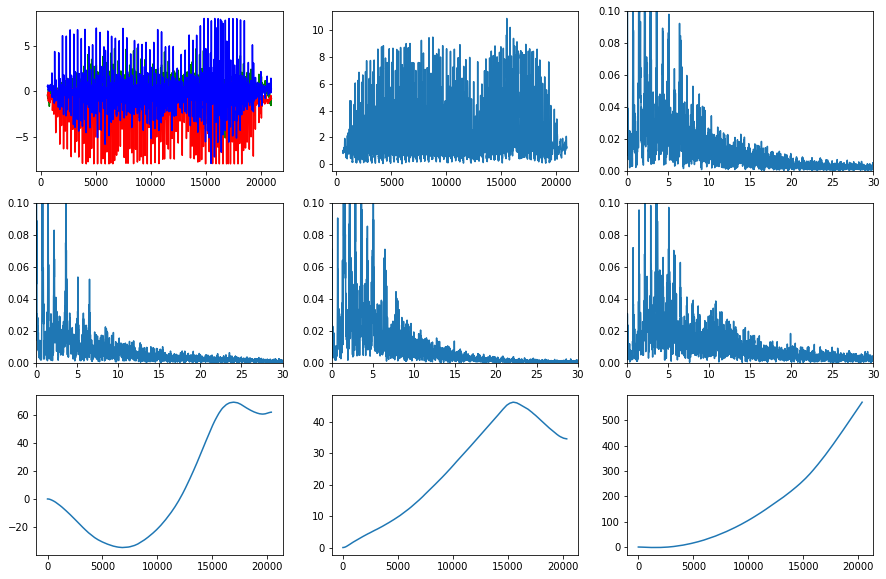

Анатолий Самарский - Самарский_бег_3.csv Амплитуда: 10.837278933096472
Анатолий Самарский - Самарский_бег_3.csv Среднее: 1.8938248093341377
Анатолий Самарский - Самарский_лестница_1.csv
Анатолий Самарский - Самарский_лестница_1.csv
New means: -1.182631057257878e-16 -1.9924762377714253e-17 0.9940174612716427


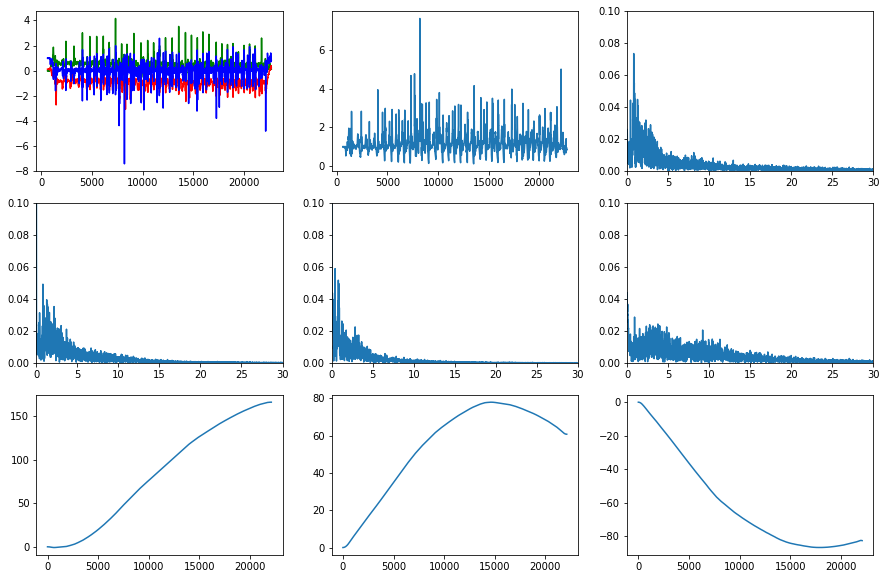

Анатолий Самарский - Самарский_лестница_1.csv Амплитуда: 7.478111092748063
Анатолий Самарский - Самарский_лестница_1.csv Среднее: 1.1411277559851165
Анатолий Самарский - Самарский_лестница_3.csv
Анатолий Самарский - Самарский_лестница_3.csv
New means: 7.126807780943833e-18 3.9197442795191084e-17 0.9848245356627888


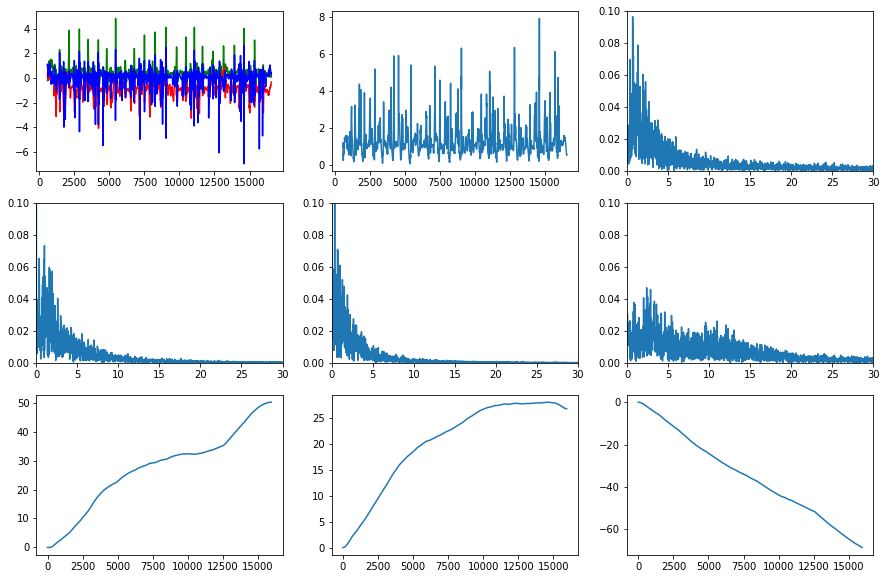

Анатолий Самарский - Самарский_лестница_3.csv Амплитуда: 7.8920827850102215
Анатолий Самарский - Самарский_лестница_3.csv Среднее: 1.2431673995621535
Анатолий Самарский - Самарский_лестница_4.csv
Анатолий Самарский - Самарский_лестница_4.csv
New means: -8.048723924434512e-17 2.220337634326762e-17 1.0306277073285433


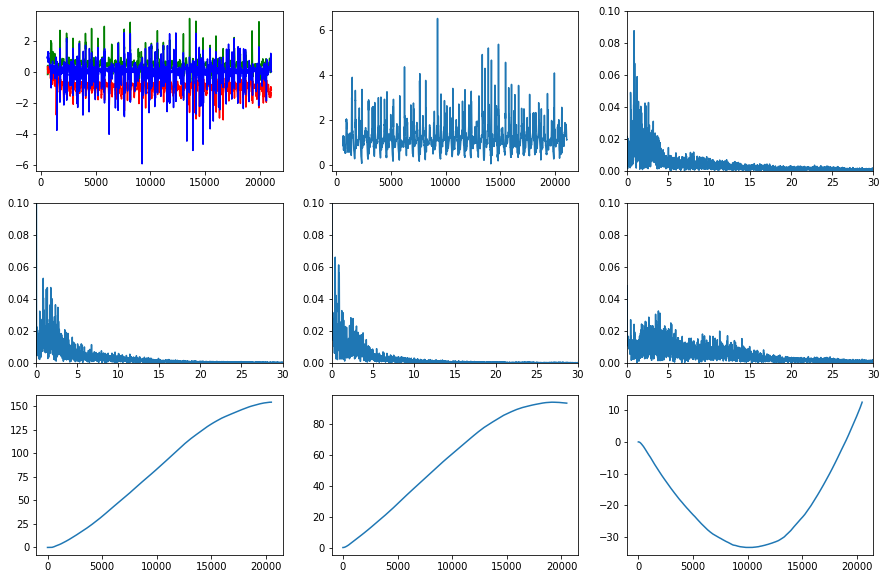

Анатолий Самарский - Самарский_лестница_4.csv Амплитуда: 6.432398076731767
Анатолий Самарский - Самарский_лестница_4.csv Среднее: 1.182303294029645
Анатолий Самарский - Самарский_лестница_5.csv
Анатолий Самарский - Самарский_лестница_5.csv
New means: 4.323632859129155e-17 -1.8221024192044294e-16 1.0185690798019453


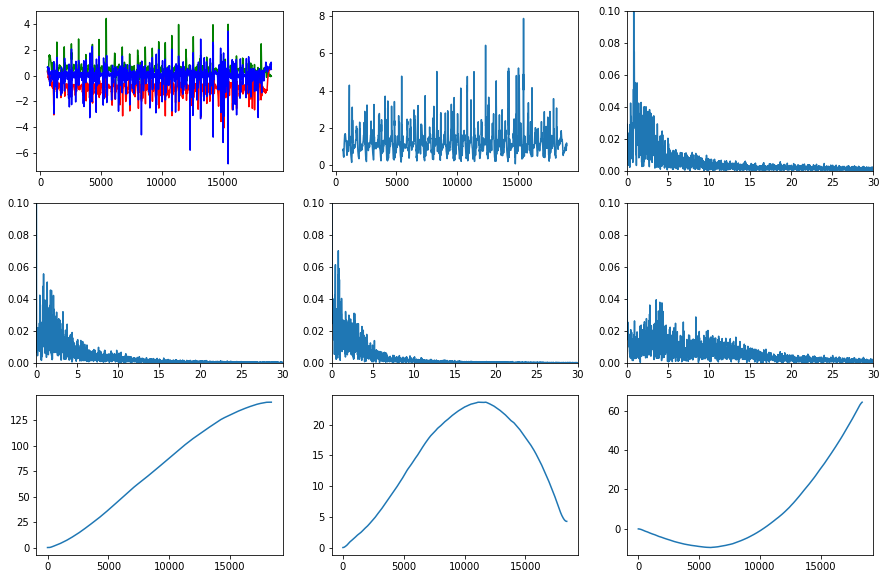

Анатолий Самарский - Самарский_лестница_5.csv Амплитуда: 7.807886697895157
Анатолий Самарский - Самарский_лестница_5.csv Среднее: 1.2092402402240119
Анатолий Самарский - Самарский_стояние_1.csv
Анатолий Самарский - Самарский_стояние_1.csv
New means: -2.2370491483985837e-17 1.249019107855876e-16 0.9841832090074274


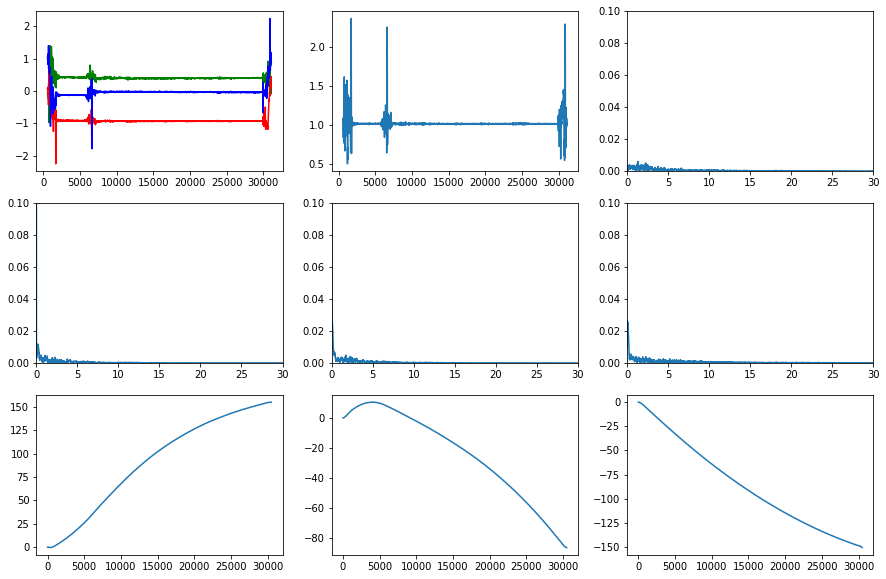

Анатолий Самарский - Самарский_стояние_1.csv Амплитуда: 1.8679164190213644
Анатолий Самарский - Самарский_стояние_1.csv Среднее: 1.0143542653141446
Анатолий Самарский - Самарский_стояние_3.csv
Анатолий Самарский - Самарский_стояние_3.csv
New means: 8.297978343592746e-17 -9.703646806168567e-17 1.0018422411592711


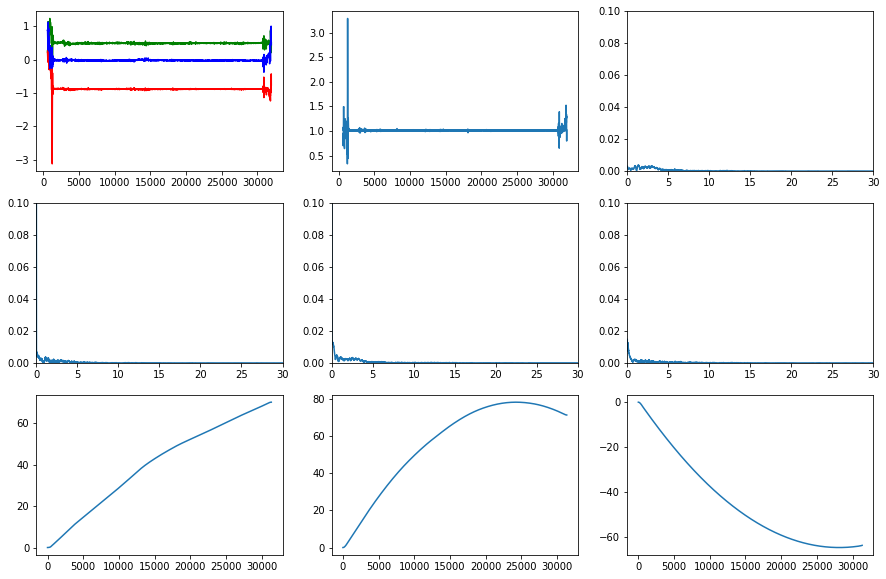

Анатолий Самарский - Самарский_стояние_3.csv Амплитуда: 2.953512201924806
Анатолий Самарский - Самарский_стояние_3.csv Среднее: 1.0137528941428429
Анатолий Самарский - Самарский_стояние_4.csv
Анатолий Самарский - Самарский_стояние_4.csv
New means: 1.2486260538159312e-16 4.290035266275352e-18 0.9981862447759633


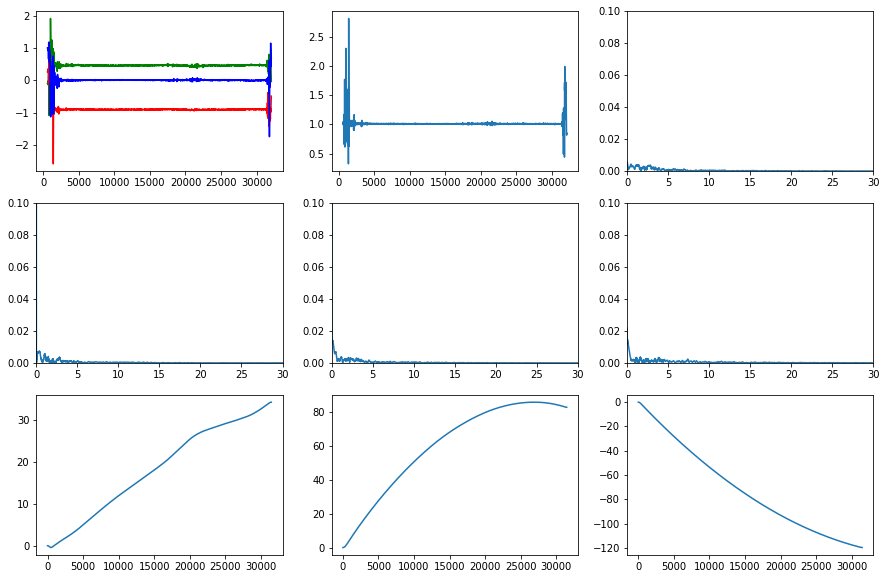

Анатолий Самарский - Самарский_стояние_4.csv Амплитуда: 2.4822574119658594
Анатолий Самарский - Самарский_стояние_4.csv Среднее: 1.015144161321655
Анатолий Самарский - Самарский_стояние_5.csv
Анатолий Самарский - Самарский_стояние_5.csv
New means: 4.1999377872677705e-17 -1.4608479260061812e-17 0.9588106385202736


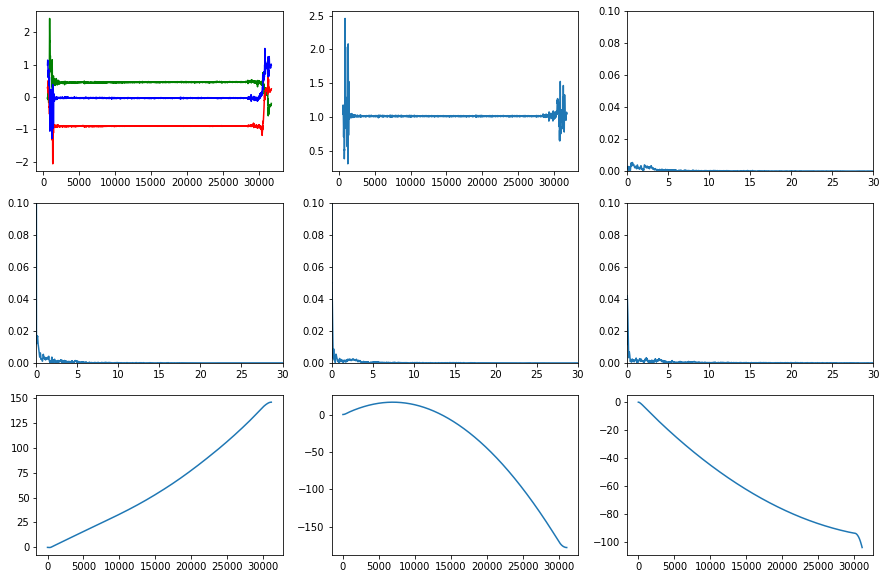

Анатолий Самарский - Самарский_стояние_5.csv Амплитуда: 2.1538673941811597
Анатолий Самарский - Самарский_стояние_5.csv Среднее: 1.0126040124150393
Анатолий Самарский - Самарский_ходьба_3.csv
Анатолий Самарский - Самарский_ходьба_3.csv
New means: -1.902586110171226e-17 1.5659747214486244e-16 0.9746508691990162


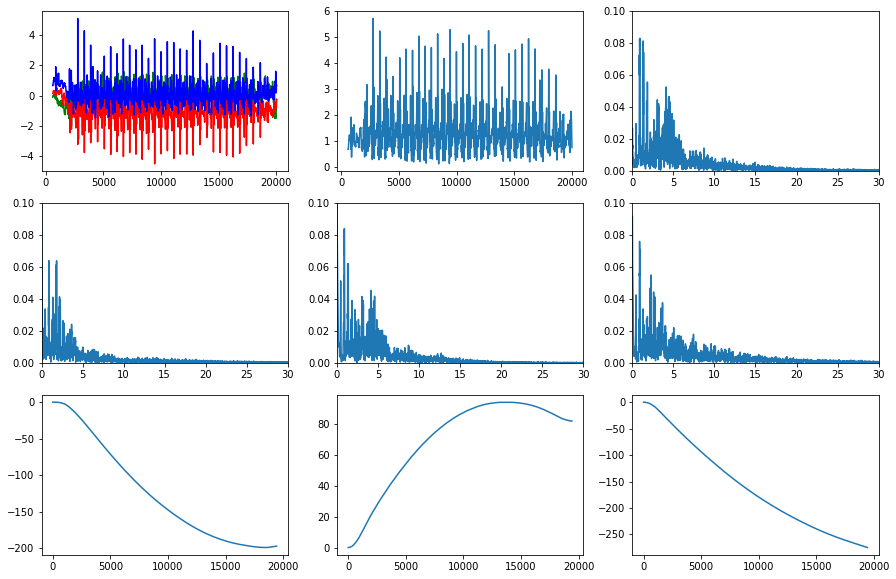

Анатолий Самарский - Самарский_ходьба_3.csv Амплитуда: 5.5950801302266076
Анатолий Самарский - Самарский_ходьба_3.csv Среднее: 1.2127909865509379
Анатолий Самарский - Самарский_ходьба_4.csv
Анатолий Самарский - Самарский_ходьба_4.csv
New means: 1.6262217264412952e-17 8.828060800681317e-17 1.0332320867360363


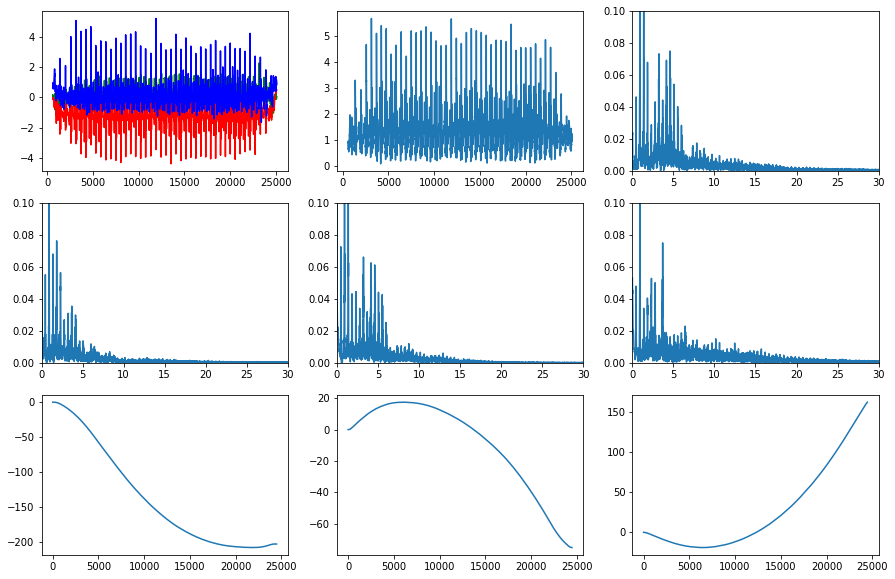

Анатолий Самарский - Самарский_ходьба_4.csv Амплитуда: 5.5543733288394
Анатолий Самарский - Самарский_ходьба_4.csv Среднее: 1.243869407687805
Анатолий Самарский - Самарский_ходьба_5.csv
Анатолий Самарский - Самарский_ходьба_5.csv
New means: 7.016406697624887e-18 -9.82296937667484e-17 0.9281822567296111


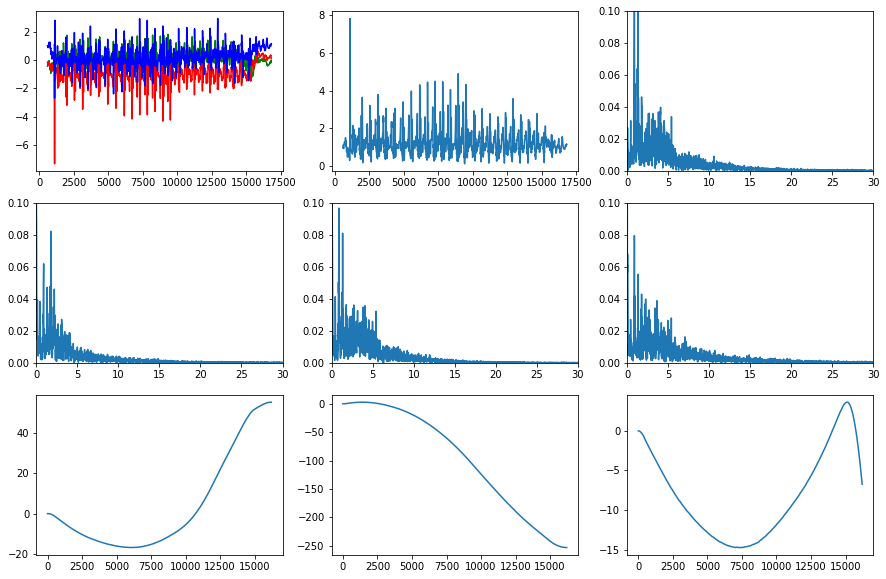

Анатолий Самарский - Самарский_ходьба_5.csv Амплитуда: 7.6825002958440125
Анатолий Самарский - Самарский_ходьба_5.csv Среднее: 1.1959386919967867
Анна Лисицына - 2021-07-0213.17.38_Лисицына_ходьба.csv
Анна Лисицына - 2021-07-0213.17.38_Лисицына_ходьба.csv
New means: -1.703939414292806e-17 4.827828340496284e-17 1.0043388685926808


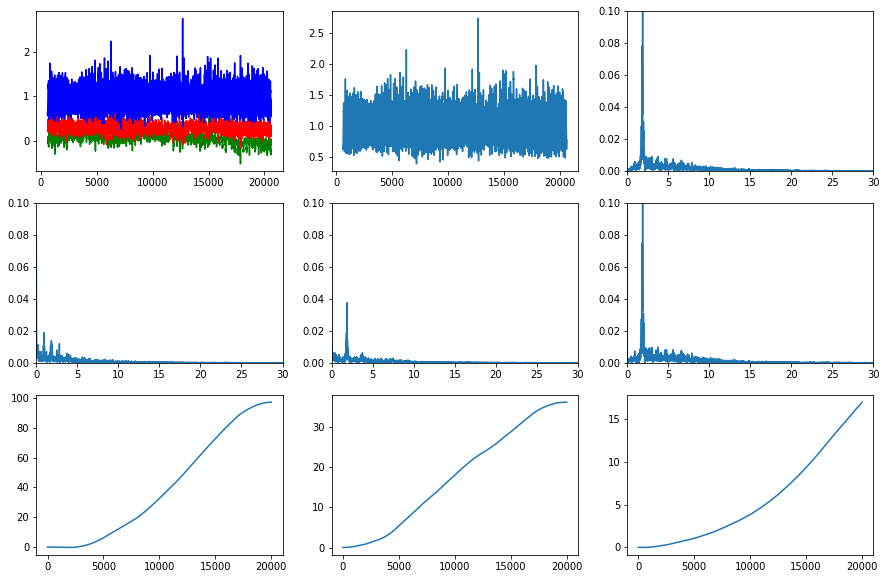

Анна Лисицына - 2021-07-0213.17.38_Лисицына_ходьба.csv Амплитуда: 2.3570850480333747
Анна Лисицына - 2021-07-0213.17.38_Лисицына_ходьба.csv Среднее: 1.0203744537197974
Анна Лисицына - 2021-07-0213.26.29_Лисицына_ходьба.csv
Анна Лисицына - 2021-07-0213.26.29_Лисицына_ходьба.csv
New means: 9.9461063846837e-18 -3.83635531980657e-17 1.006333186494378


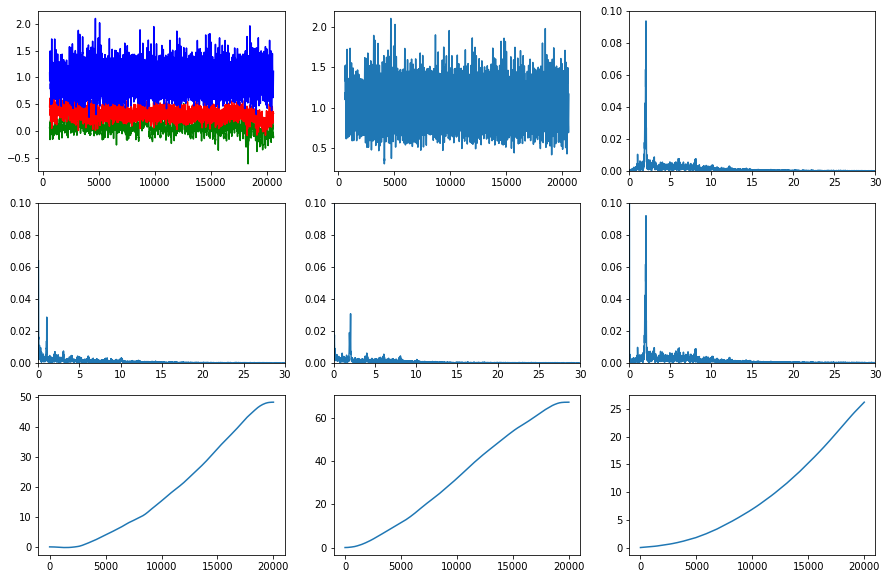

Анна Лисицына - 2021-07-0213.26.29_Лисицына_ходьба.csv Амплитуда: 1.815145606703863
Анна Лисицына - 2021-07-0213.26.29_Лисицына_ходьба.csv Среднее: 1.0200967303510888
Анна Лисицына - 2021-07-0213.28.29_Лисицына_ходьба.csv
Анна Лисицына - 2021-07-0213.28.29_Лисицына_ходьба.csv
New means: -6.050966778468873e-18 4.4267599063535445e-17 1.0068253065335624


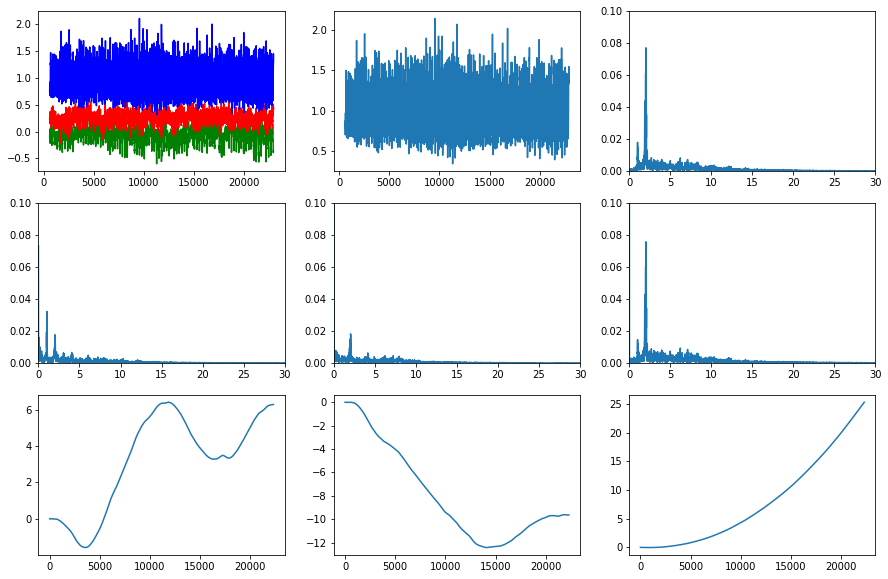

Анна Лисицына - 2021-07-0213.28.29_Лисицына_ходьба.csv Амплитуда: 1.8010806512491266
Анна Лисицына - 2021-07-0213.28.29_Лисицына_ходьба.csv Среднее: 1.0214165011828018
Анна Лисицына - 2021-07-0213.36.11_Лисицына_ходьба.csv
Анна Лисицына - 2021-07-0213.36.11_Лисицына_ходьба.csv
New means: -7.733698274573497e-18 4.087811945131705e-17 1.0040323727468954


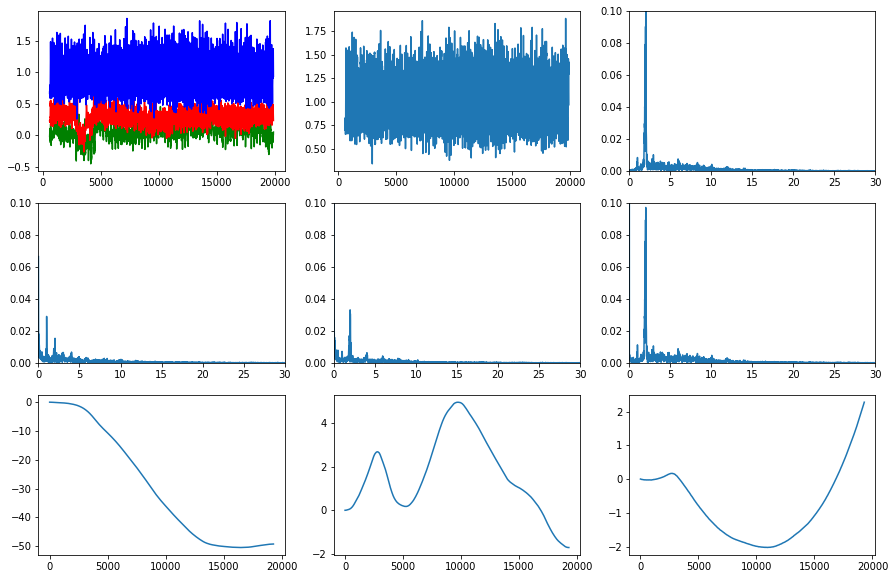

Анна Лисицына - 2021-07-0213.36.11_Лисицына_ходьба.csv Амплитуда: 1.5501743820033322
Анна Лисицына - 2021-07-0213.36.11_Лисицына_ходьба.csv Среднее: 1.020987668541911
Анна Лисицына - 2021-07-0213.41.41_Лисицына_лестница.csv
Анна Лисицына - 2021-07-0213.41.41_Лисицына_лестница.csv
New means: -4.697182096649039e-19 1.878872838659616e-17 1.0070257713953403


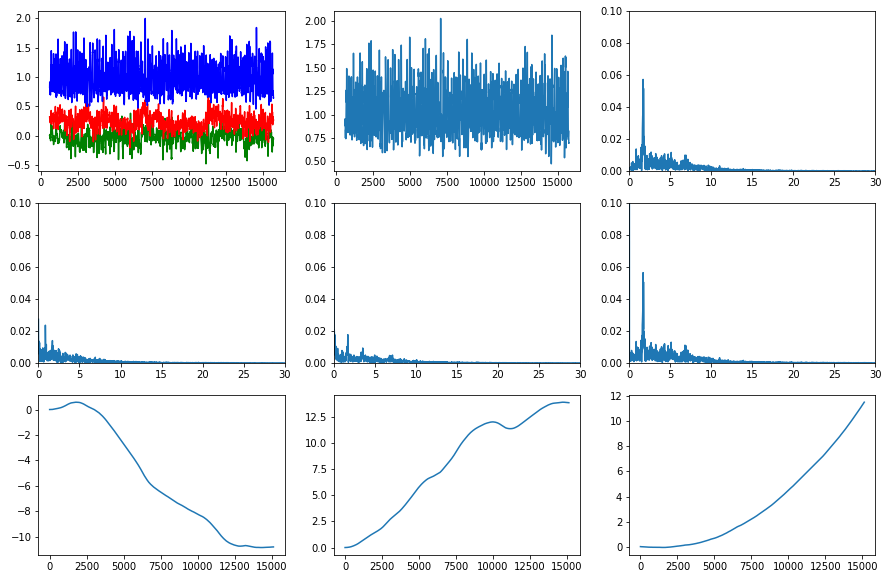

Анна Лисицына - 2021-07-0213.41.41_Лисицына_лестница.csv Амплитуда: 1.5531295559741283
Анна Лисицына - 2021-07-0213.41.41_Лисицына_лестница.csv Среднее: 1.0213244134711223
Анна Лисицына - 2021-07-0213.57.58_Лисицына_стояние.csv
Анна Лисицына - 2021-07-0213.57.58_Лисицына_стояние.csv
New means: -3.8049259105880515e-18 -3.0619609521153073e-18 1.0057937404920974


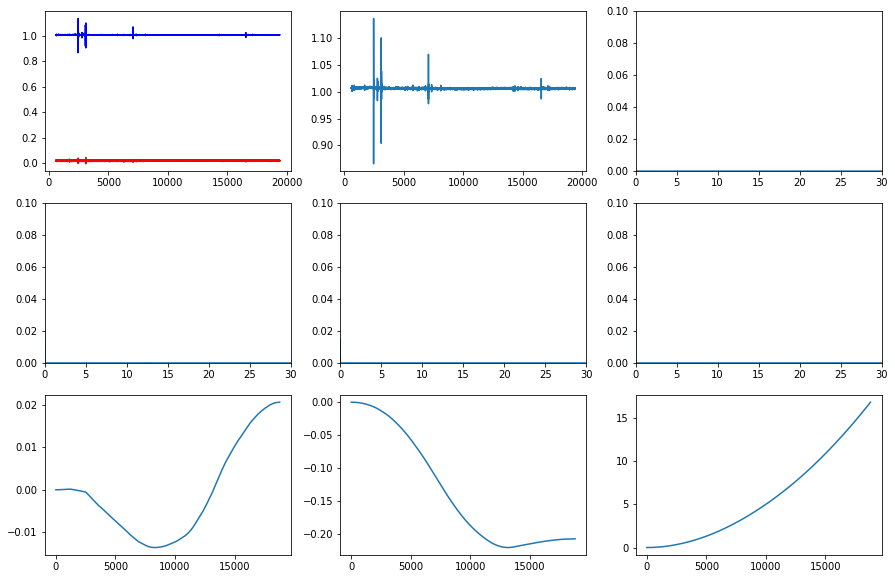

Анна Лисицына - 2021-07-0213.57.58_Лисицына_стояние.csv Амплитуда: 0.2693908677715614
Анна Лисицына - 2021-07-0213.57.58_Лисицына_стояние.csv Среднее: 1.005794788698353
Анна Лисицына - 2021-07-0214.15.22_Лисицына_стояние.csv
Анна Лисицына - 2021-07-0214.15.22_Лисицына_стояние.csv
New means: 1.3789418551078637e-18 -1.7546701337472126e-18 1.0056405317218908


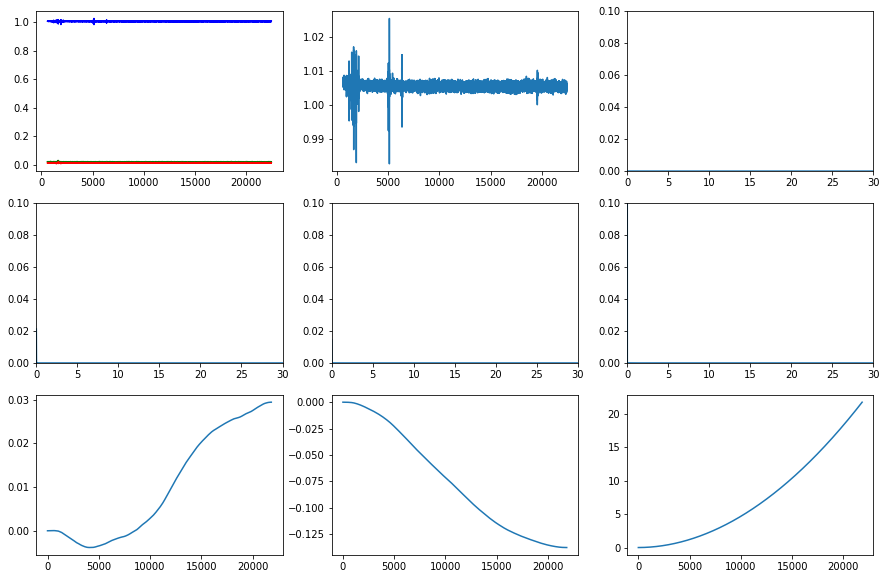

Анна Лисицына - 2021-07-0214.15.22_Лисицына_стояние.csv Амплитуда: 0.042733988483578456
Анна Лисицына - 2021-07-0214.15.22_Лисицына_стояние.csv Среднее: 1.0056411092682498
Анна Лисицына - 2021-07-0214.20.50_Лисицына_стояние.csv
Анна Лисицына - 2021-07-0214.20.50_Лисицына_стояние.csv
New means: 7.092381535403912e-18 2.7977558407847926e-18 1.005501797061228


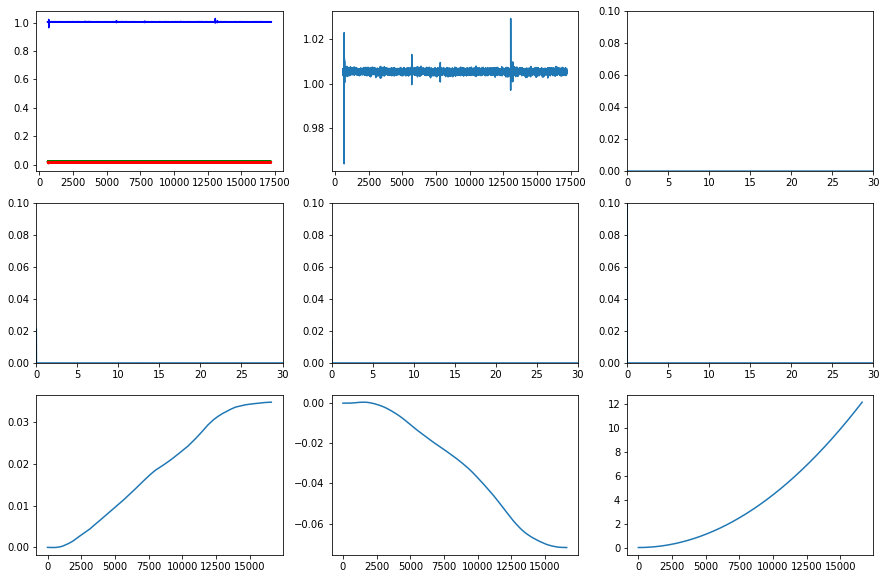

Анна Лисицына - 2021-07-0214.20.50_Лисицына_стояние.csv Амплитуда: 0.06554624139082654
Анна Лисицына - 2021-07-0214.20.50_Лисицына_стояние.csv Среднее: 1.0055023565165633
Анна Лисицына - 2021-07-0214.24.14_Лисицына_стояние.csv
Анна Лисицына - 2021-07-0214.24.14_Лисицына_стояние.csv
New means: -2.107372444940047e-18 -5.459008142124217e-19 1.0055403982704512


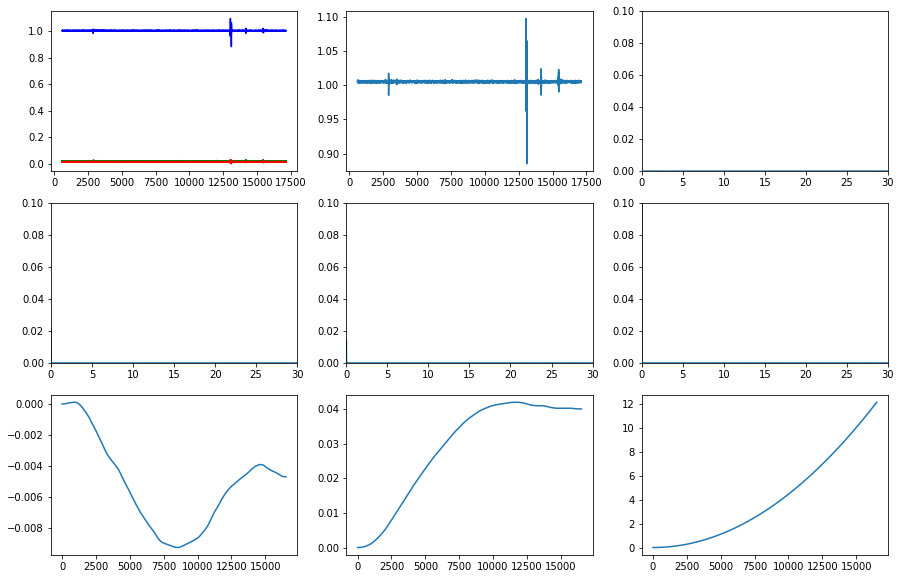

Анна Лисицына - 2021-07-0214.24.14_Лисицына_стояние.csv Амплитуда: 0.21335147298769186
Анна Лисицына - 2021-07-0214.24.14_Лисицына_стояние.csv Среднее: 1.005541080532291
Анна Лисицына - 2021-07-0412.31.02_Лисицына_бег.csv
Анна Лисицына - 2021-07-0412.31.02_Лисицына_бег.csv
New means: 3.4388495492799e-17 6.037091430958046e-17 1.0415567407729416


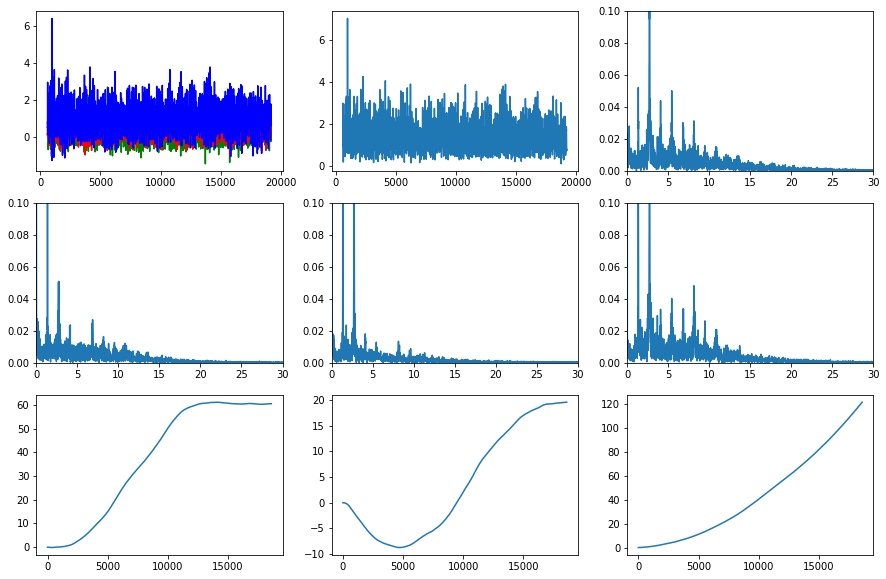

Анна Лисицына - 2021-07-0412.31.02_Лисицына_бег.csv Амплитуда: 6.915318818935273
Анна Лисицына - 2021-07-0412.31.02_Лисицына_бег.csv Среднее: 1.3013690768921147
Анна Лисицына - 2021-07-0412.33.06_Лисицына_бег.csv
Анна Лисицына - 2021-07-0412.33.06_Лисицына_бег.csv
New means: -2.960451299615746e-17 -6.333988827084852e-17 1.0212243884804808


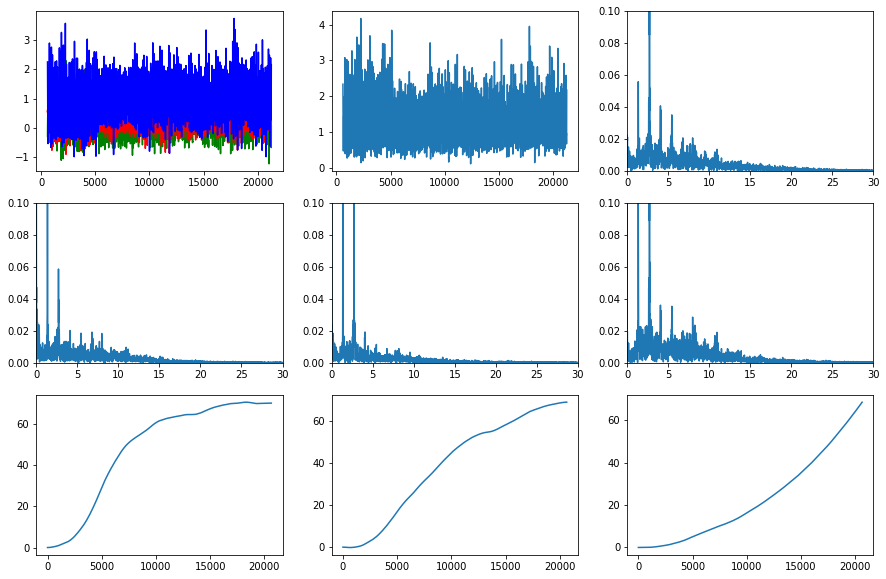

Анна Лисицына - 2021-07-0412.33.06_Лисицына_бег.csv Амплитуда: 4.059655024232354
Анна Лисицына - 2021-07-0412.33.06_Лисицына_бег.csv Среднее: 1.2394424728972608
Анна Лисицына - 2021-07-0412.37.51_Лисицына_бег.csv
Анна Лисицына - 2021-07-0412.37.51_Лисицына_бег.csv
New means: 7.592151950464969e-17 -6.464604631088983e-17 1.0299964377655377


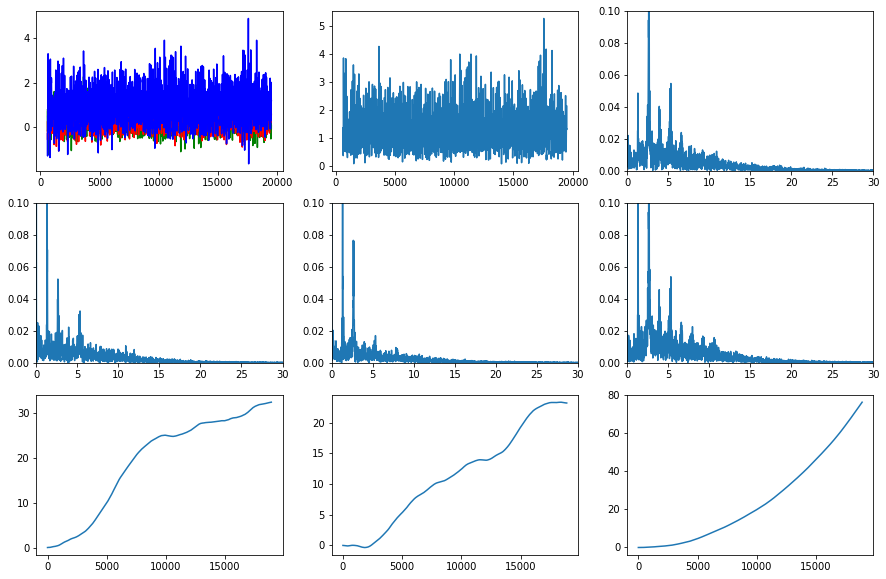

Анна Лисицына - 2021-07-0412.37.51_Лисицына_бег.csv Амплитуда: 5.194690889883821
Анна Лисицына - 2021-07-0412.37.51_Лисицына_бег.csv Среднее: 1.2500769571735868
Анна Лисицына - 2021-07-0412.39.57_Лисицына_бег.csv
Анна Лисицына - 2021-07-0412.39.57_Лисицына_бег.csv
New means: -6.868447923993074e-17 -3.092599588813635e-17 1.050052371898608


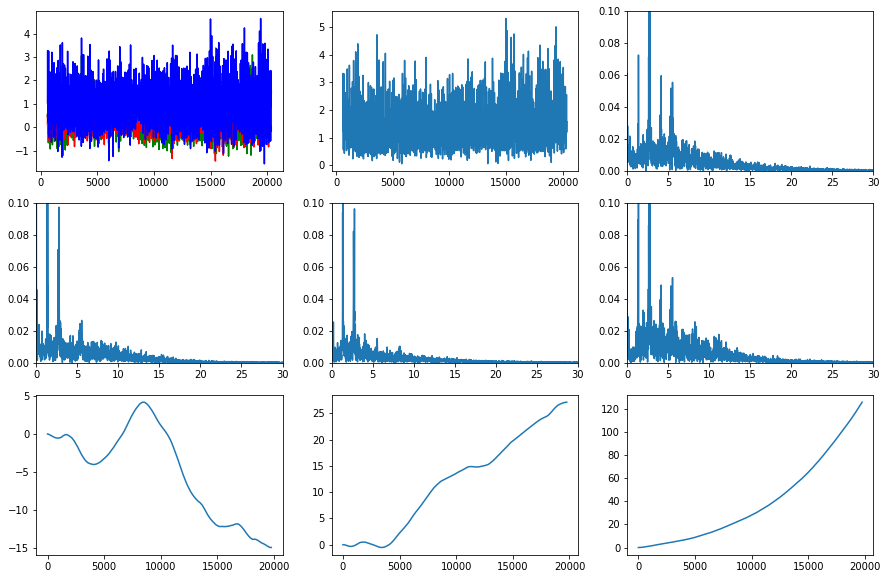

Анна Лисицына - 2021-07-0412.39.57_Лисицына_бег.csv Амплитуда: 5.256061308817652
Анна Лисицына - 2021-07-0412.39.57_Лисицына_бег.csv Среднее: 1.350776470773093
Анна Лисицына - 2021-07-0412.55.16_Лисицына_лестница.csv
Анна Лисицына - 2021-07-0412.55.16_Лисицына_лестница.csv
New means: 2.8255004901485246e-18 0.0 1.002254106339554


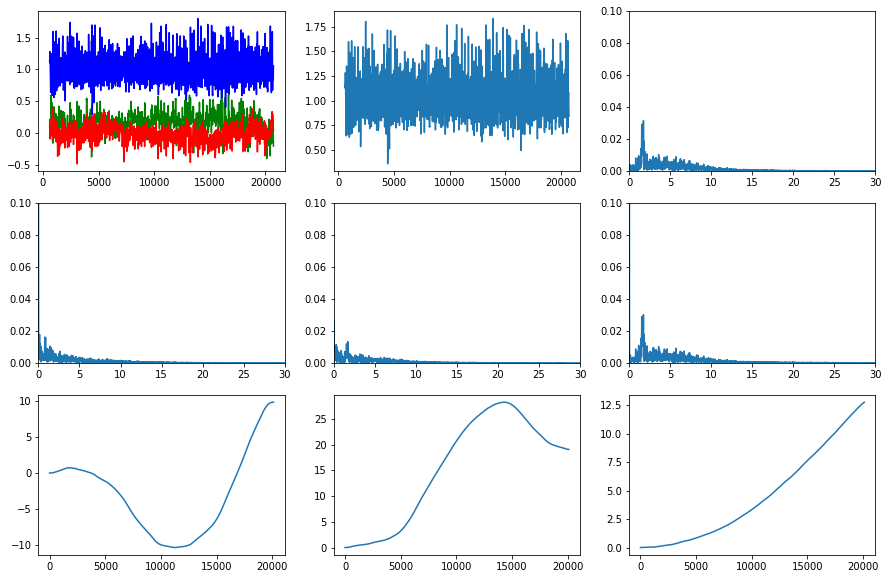

Анна Лисицына - 2021-07-0412.55.16_Лисицына_лестница.csv Амплитуда: 1.476462986966591
Анна Лисицына - 2021-07-0412.55.16_Лисицына_лестница.csv Среднее: 1.0186363273111472
Анна Лисицына - 2021-07-0412.57.07_Лисицына_лестница.csv
Анна Лисицына - 2021-07-0412.57.07_Лисицына_лестница.csv
New means: -1.5678825280803282e-18 6.974374004219391e-18 0.9562730402496982


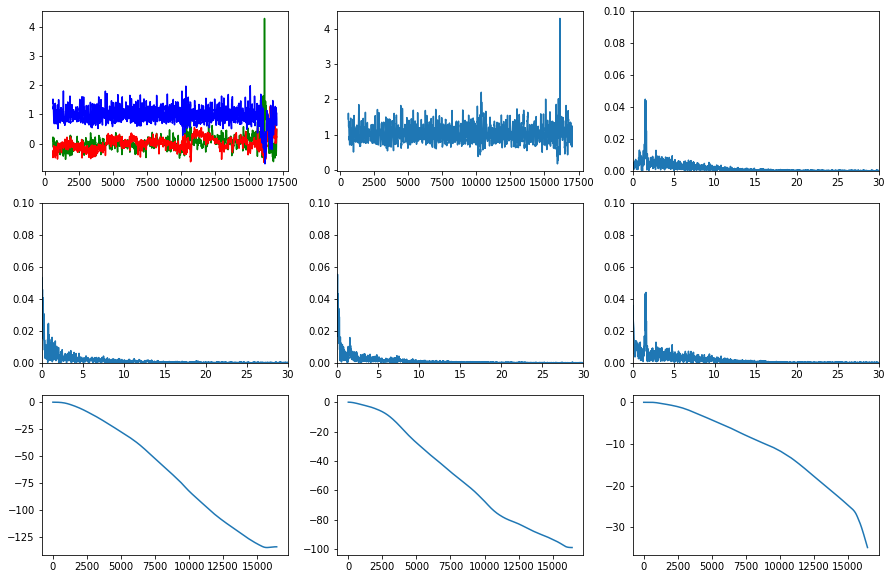

Анна Лисицына - 2021-07-0412.57.07_Лисицына_лестница.csv Амплитуда: 4.1066991152620025
Анна Лисицына - 2021-07-0412.57.07_Лисицына_лестница.csv Среднее: 1.0231639825254986
Анна Лисицына - 2021-07-0413.06.39_Лисицына_лестница.csv
Анна Лисицына - 2021-07-0413.06.39_Лисицына_лестница.csv
New means: -3.1118092111900155e-17 0.0 1.0000048472221539


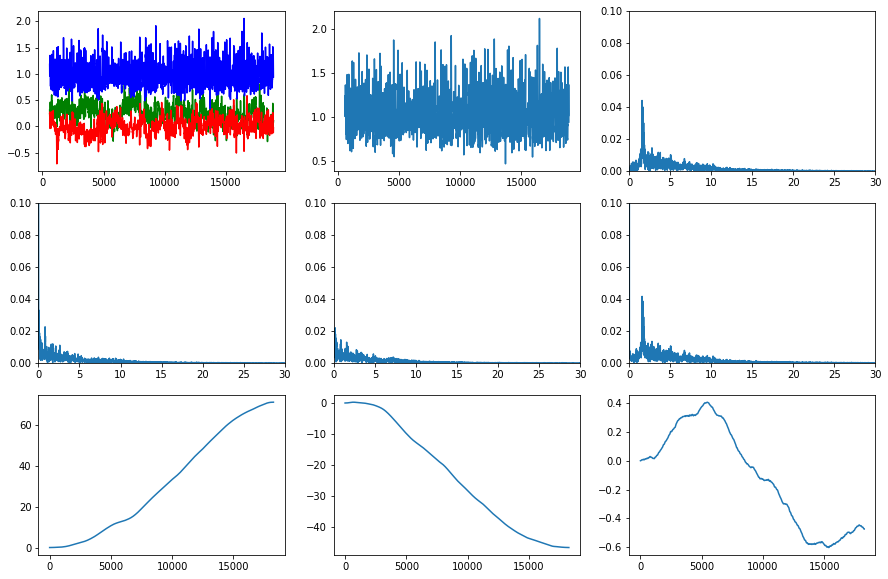

Анна Лисицына - 2021-07-0413.06.39_Лисицына_лестница.csv Амплитуда: 1.6510328764746793
Анна Лисицына - 2021-07-0413.06.39_Лисицына_лестница.csv Среднее: 1.0238502291738094
Арслан Разин - Разин Арслан 2021-07-05 00.51.18 - стояние на месте 1
Арслан Разин - Разин Арслан 2021-07-05 00.51.18 - стояние на месте 1
New means: 1.299712335005108e-17 -6.898473162719419e-17 0.9949688033574906


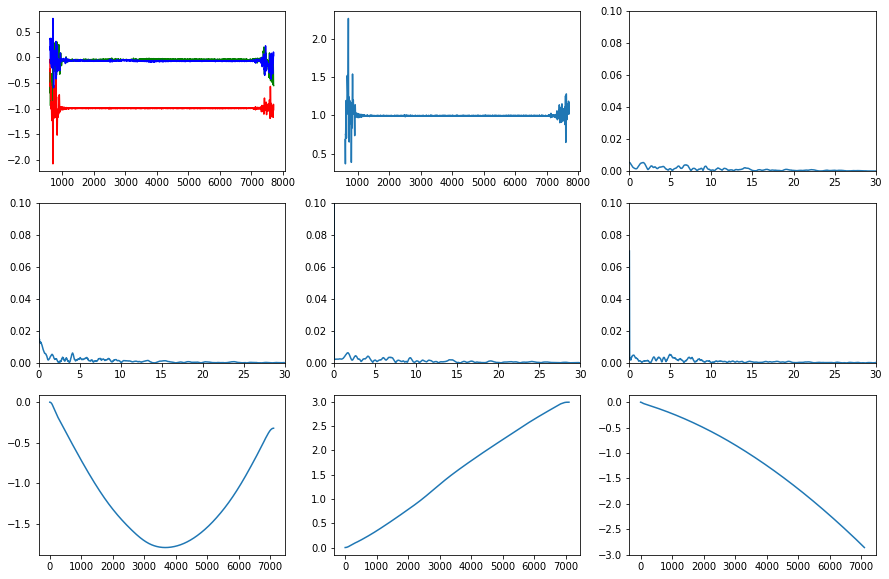

Арслан Разин - Разин Арслан 2021-07-05 00.51.18 - стояние на месте 1 Амплитуда: 1.8881756807448056
Арслан Разин - Разин Арслан 2021-07-05 00.51.18 - стояние на месте 1 Среднее: 1.001813487774119
Арслан Разин - Разин Арслан 2021-07-05 00.53.14 - стояние на месте 2
Арслан Разин - Разин Арслан 2021-07-05 00.53.14 - стояние на месте 2
New means: -5.546060120411865e-18 2.1329222879750634e-16 0.9982759197807768


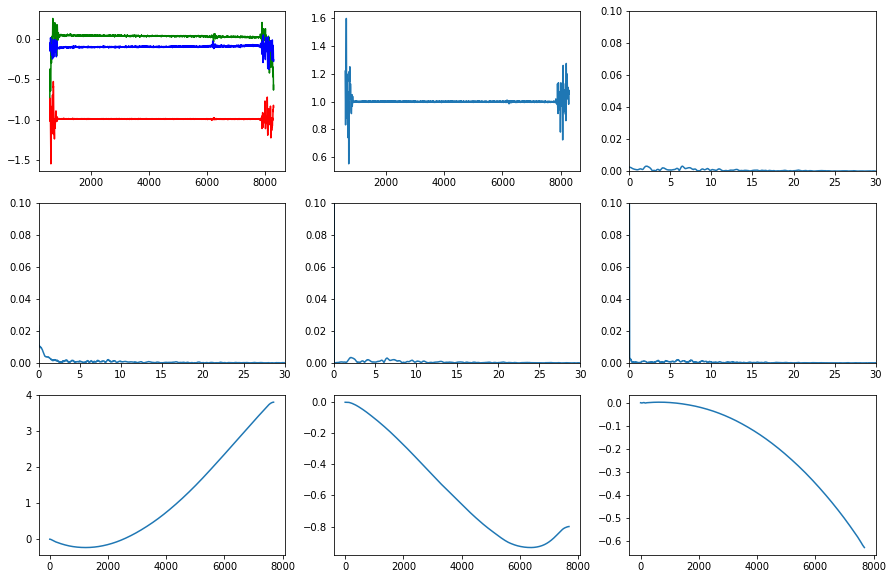

Арслан Разин - Разин Арслан 2021-07-05 00.53.14 - стояние на месте 2 Амплитуда: 1.0444522558848734
Арслан Разин - Разин Арслан 2021-07-05 00.53.14 - стояние на месте 2 Среднее: 1.000925530629486
Арслан Разин - Разин Арслан 2021-07-05 00.54.15 - стояние на месте 3
Арслан Разин - Разин Арслан 2021-07-05 00.54.15 - стояние на месте 3
New means: 9.220642820660527e-18 -8.37349626151234e-17 0.9927234985295094


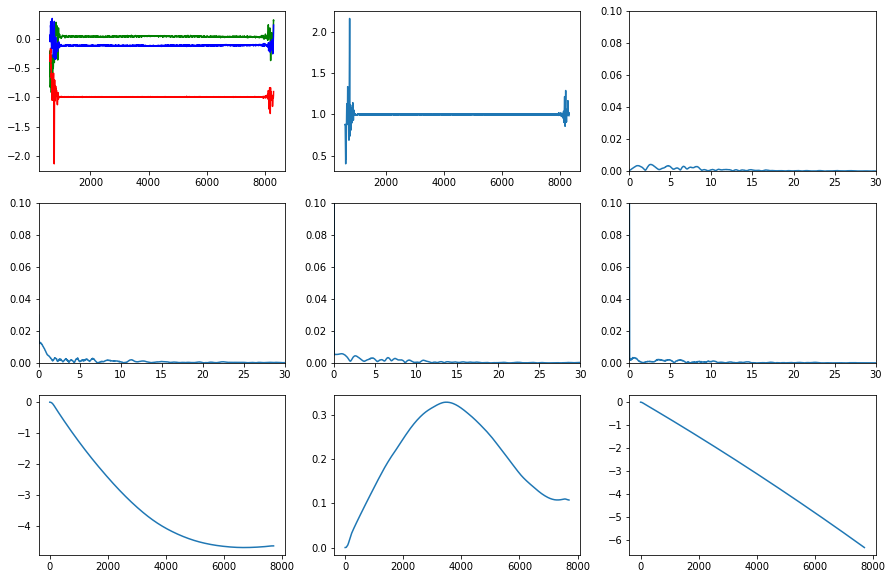

Арслан Разин - Разин Арслан 2021-07-05 00.54.15 - стояние на месте 3 Амплитуда: 1.7551886115535407
Арслан Разин - Разин Арслан 2021-07-05 00.54.15 - стояние на месте 3 Среднее: 0.9992418509527287
Арслан Разин - Разин Арслан 2021-07-05 00.55.27 - стояние на месте 4
Арслан Разин - Разин Арслан 2021-07-05 00.55.27 - стояние на месте 4
New means: -3.3421577411105372e-18 6.35009970811002e-17 0.9695885314986284


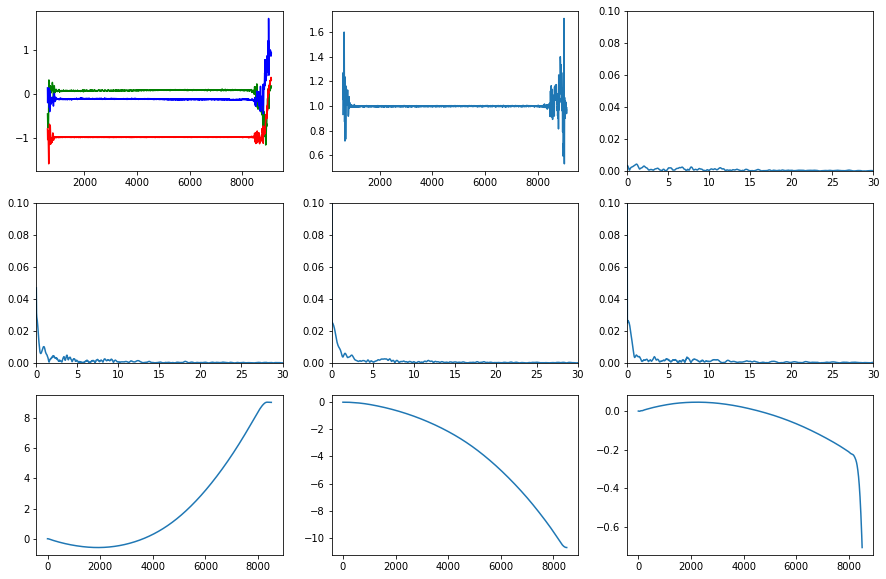

Арслан Разин - Разин Арслан 2021-07-05 00.55.27 - стояние на месте 4 Амплитуда: 1.180644527637737
Арслан Разин - Разин Арслан 2021-07-05 00.55.27 - стояние на месте 4 Среднее: 1.0032456419123879
Арслан Разин - Разин Арслан 2021-07-05 01.02.56 - подъём 1
Арслан Разин - Разин Арслан 2021-07-05 01.02.56 - подъём 1
New means: 2.5353888876363968e-17 -4.6097979775207215e-18 0.9571897719267596


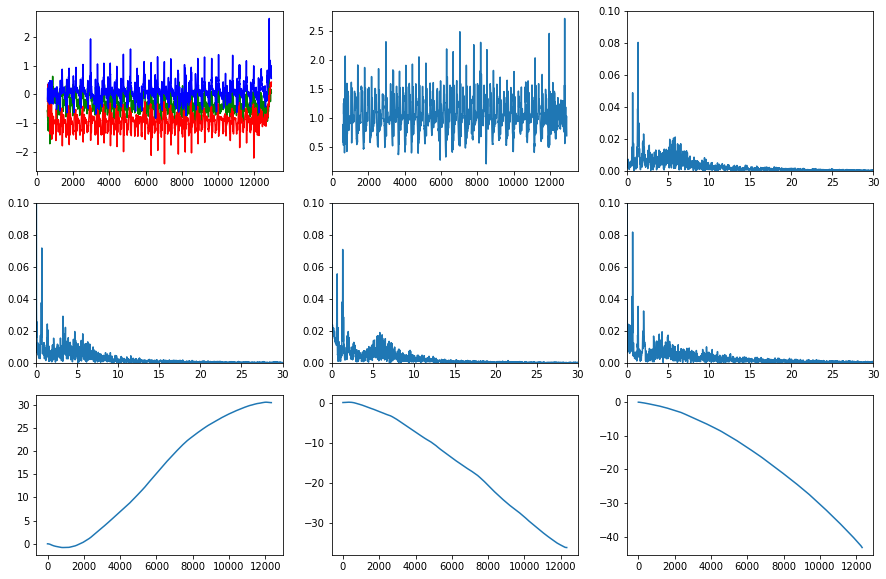

Арслан Разин - Разин Арслан 2021-07-05 01.02.56 - подъём 1 Амплитуда: 2.4867041947607356
Арслан Разин - Разин Арслан 2021-07-05 01.02.56 - подъём 1 Среднее: 1.0417134662244678
Арслан Разин - Разин Арслан 2021-07-05 01.06.22 - подъём 2
Арслан Разин - Разин Арслан 2021-07-05 01.06.22 - подъём 2
New means: 1.3656012022023717e-16 1.2983964186294204e-16 0.9618347100031029


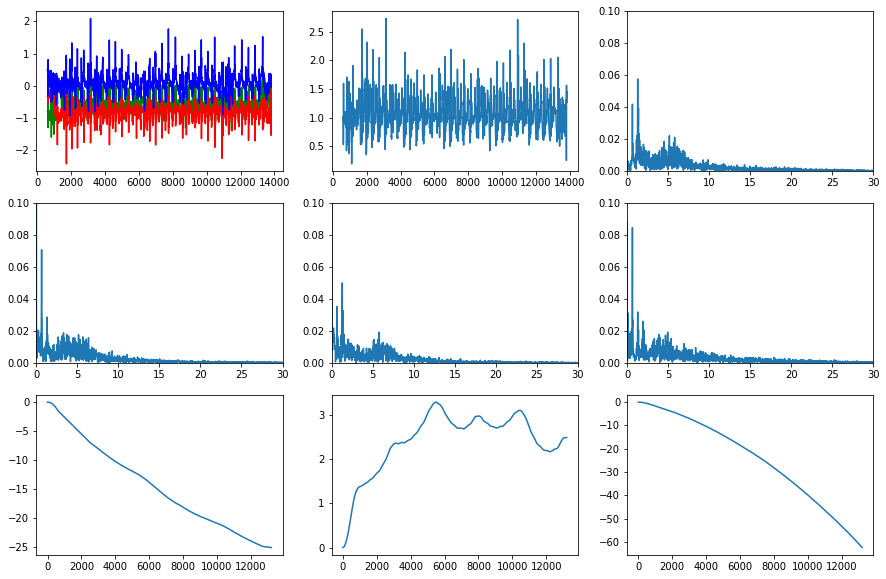

Арслан Разин - Разин Арслан 2021-07-05 01.06.22 - подъём 2 Амплитуда: 2.5309810966354136
Арслан Разин - Разин Арслан 2021-07-05 01.06.22 - подъём 2 Среднее: 1.0404410358251612
Арслан Разин - Разин Арслан 2021-07-05 01.09.07 - подъём 3
Арслан Разин - Разин Арслан 2021-07-05 01.09.07 - подъём 3
New means: -1.499854029281782e-16 6.450421174883189e-17 0.9622582827788161


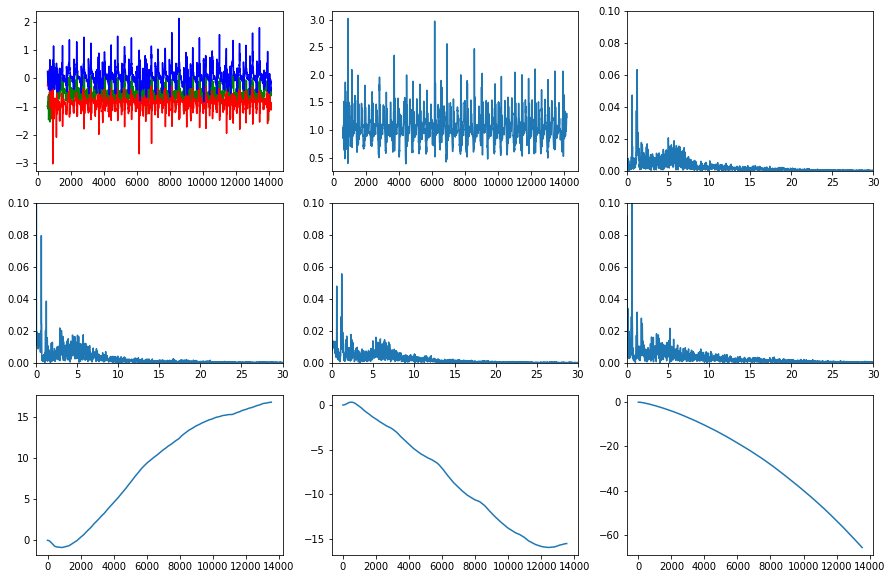

Арслан Разин - Разин Арслан 2021-07-05 01.09.07 - подъём 3 Амплитуда: 2.636549502084323
Арслан Разин - Разин Арслан 2021-07-05 01.09.07 - подъём 3 Среднее: 1.0395409760500407
Арслан Разин - Разин Арслан 2021-07-05 01.11.58 - подъём 4
Арслан Разин - Разин Арслан 2021-07-05 01.11.58 - подъём 4
New means: 0.0 3.787650370713688e-17 0.9794931422838766


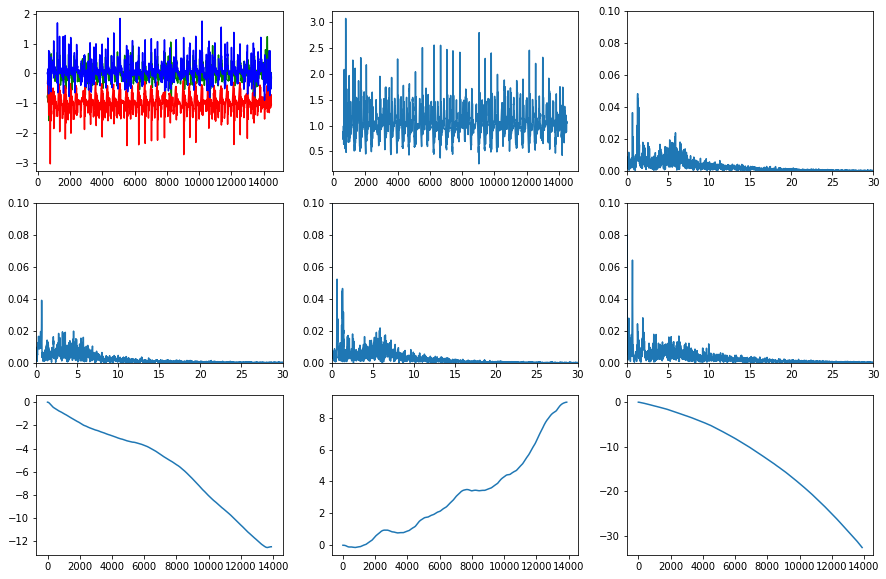

Арслан Разин - Разин Арслан 2021-07-05 01.11.58 - подъём 4 Амплитуда: 2.8059283533611015
Арслан Разин - Разин Арслан 2021-07-05 01.11.58 - подъём 4 Среднее: 1.0501108785710875
Арслан Разин - Разин Арслан 2021-07-05 21.16.45 - ходьба 1
Арслан Разин - Разин Арслан 2021-07-05 21.16.45 - ходьба 1
New means: 1.3246723613911246e-17 -9.215112079242606e-17 1.0428926819550244


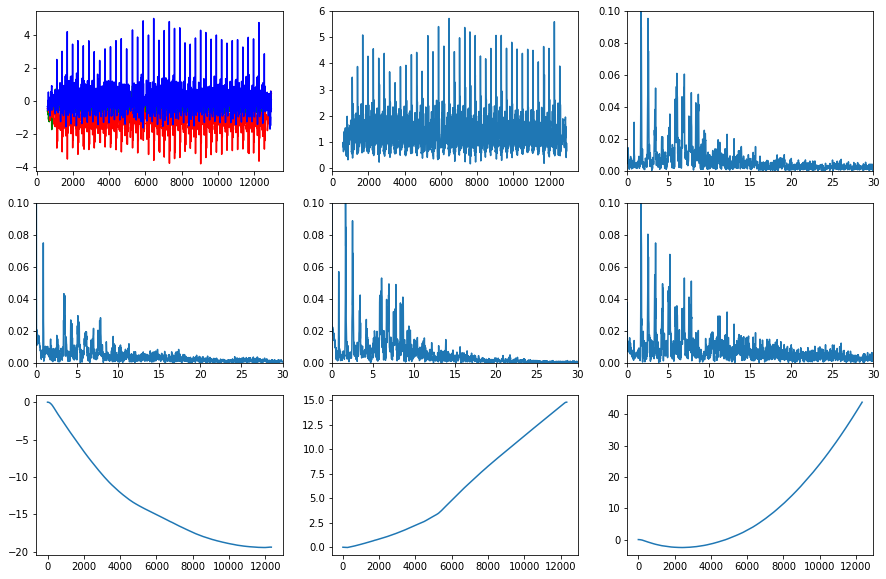

Арслан Разин - Разин Арслан 2021-07-05 21.16.45 - ходьба 1 Амплитуда: 5.5655459870235555
Арслан Разин - Разин Арслан 2021-07-05 21.16.45 - ходьба 1 Среднее: 1.2714477627672007
Арслан Разин - Разин Арслан 2021-07-05 21.18.08 - ходьба 2
Арслан Разин - Разин Арслан 2021-07-05 21.18.08 - ходьба 2
New means: 5.920403222539674e-17 8.019669703838603e-17 1.032089907632366


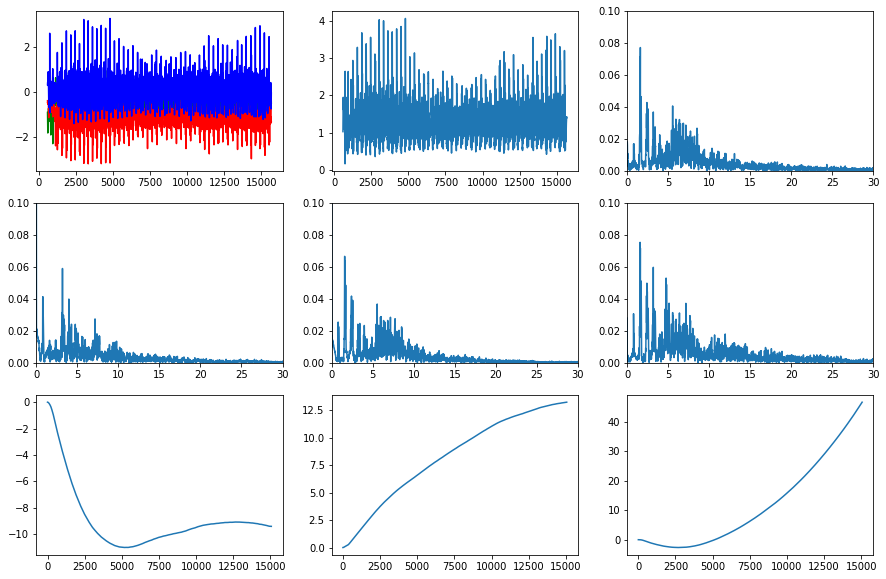

Арслан Разин - Разин Арслан 2021-07-05 21.18.08 - ходьба 2 Амплитуда: 3.923611781368534
Арслан Разин - Разин Арслан 2021-07-05 21.18.08 - ходьба 2 Среднее: 1.2108610383008178
Арслан Разин - Разин Арслан 2021-07-05 21.19.54 - ходьба 3
Арслан Разин - Разин Арслан 2021-07-05 21.19.54 - ходьба 3
New means: -6.907095056687545e-17 -7.647140955618353e-17 1.0423759717244863


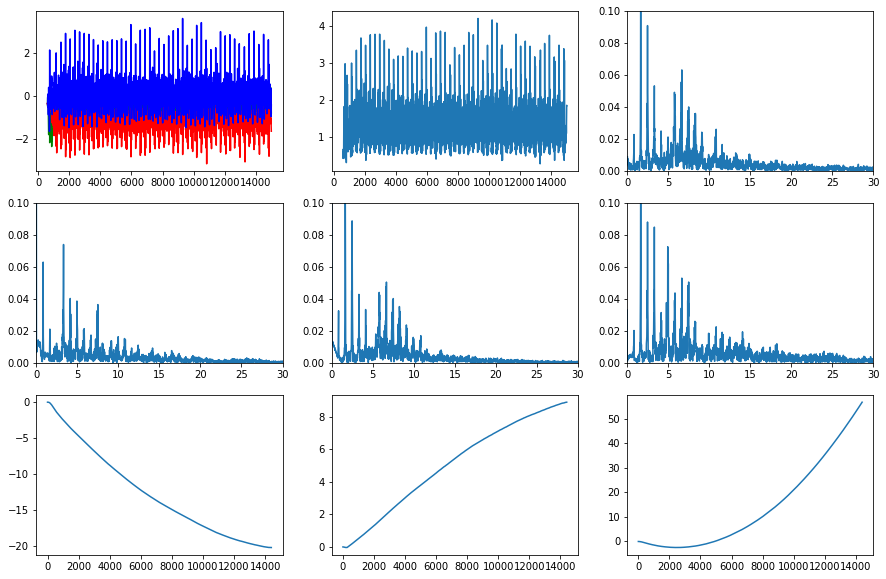

Арслан Разин - Разин Арслан 2021-07-05 21.19.54 - ходьба 3 Амплитуда: 3.934661841563937
Арслан Разин - Разин Арслан 2021-07-05 21.19.54 - ходьба 3 Среднее: 1.2352872812182853
Арслан Разин - Разин Арслан 2021-07-05 21.21.26 - ходьба 4
Арслан Разин - Разин Арслан 2021-07-05 21.21.26 - ходьба 4
New means: -3.687854122636592e-17 1.7954026649678143e-17 1.038276721008887


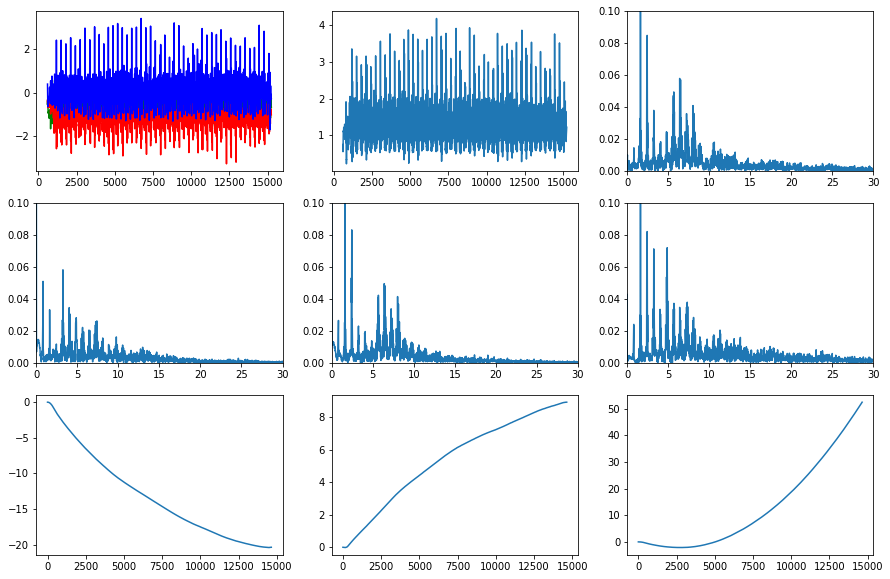

Арслан Разин - Разин Арслан 2021-07-05 21.21.26 - ходьба 4 Амплитуда: 3.9360175858947555
Арслан Разин - Разин Арслан 2021-07-05 21.21.26 - ходьба 4 Среднее: 1.2069646108176375
Арслан Разин - Разин Арслан 2021-07-05 21.34.49 - бег 1
Арслан Разин - Разин Арслан 2021-07-05 21.34.49 - бег 1
New means: -7.569109834049046e-17 -3.337560241785406e-17 1.2468455386941104


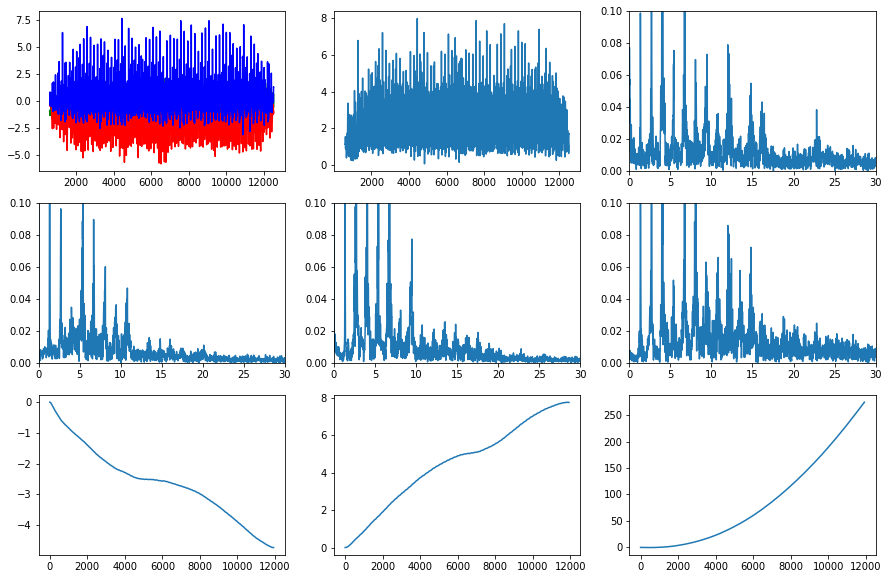

Арслан Разин - Разин Арслан 2021-07-05 21.34.49 - бег 1 Амплитуда: 7.9377776657050845
Арслан Разин - Разин Арслан 2021-07-05 21.34.49 - бег 1 Среднее: 2.0311248028293503
Арслан Разин - Разин Арслан 2021-07-05 21.36.33 - бег 2
Арслан Разин - Разин Арслан 2021-07-05 21.36.33 - бег 2
New means: -1.2602930794651101e-17 2.2580251007083223e-17 1.2502746032409655


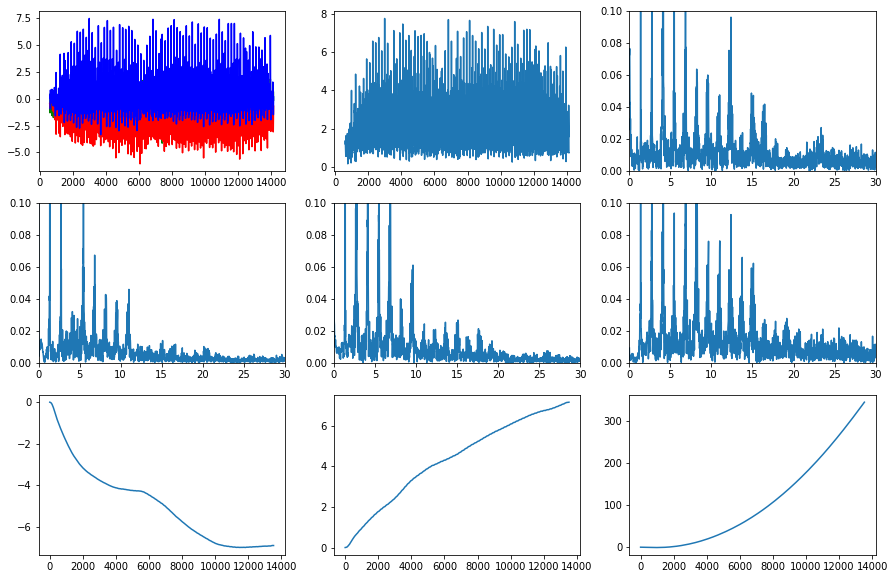

Арслан Разин - Разин Арслан 2021-07-05 21.36.33 - бег 2 Амплитуда: 7.628551765666191
Арслан Разин - Разин Арслан 2021-07-05 21.36.33 - бег 2 Среднее: 2.0462848592374145
Арслан Разин - Разин Арслан 2021-07-05 21.38.05 - бег 3
Арслан Разин - Разин Арслан 2021-07-05 21.38.05 - бег 3
New means: -7.944609633452434e-17 -8.94426250123784e-18 1.2804748251294682


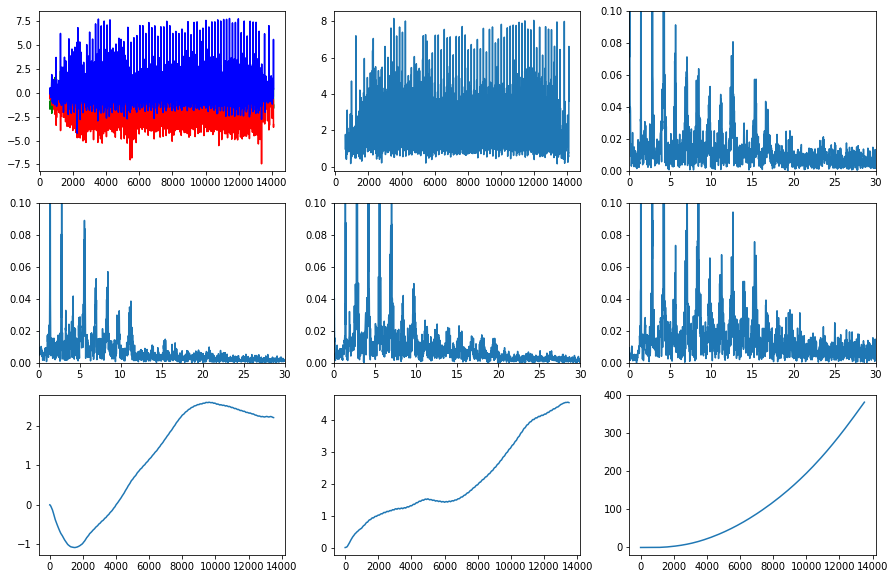

Арслан Разин - Разин Арслан 2021-07-05 21.38.05 - бег 3 Амплитуда: 7.980123432881462
Арслан Разин - Разин Арслан 2021-07-05 21.38.05 - бег 3 Среднее: 2.0938233231736123
Арслан Разин - Разин Арслан 2021-07-05 21.39.29 - бег 4
Арслан Разин - Разин Арслан 2021-07-05 21.39.29 - бег 4
New means: 1.2733177344373478e-16 1.87853665759584e-16 1.2808908701017865


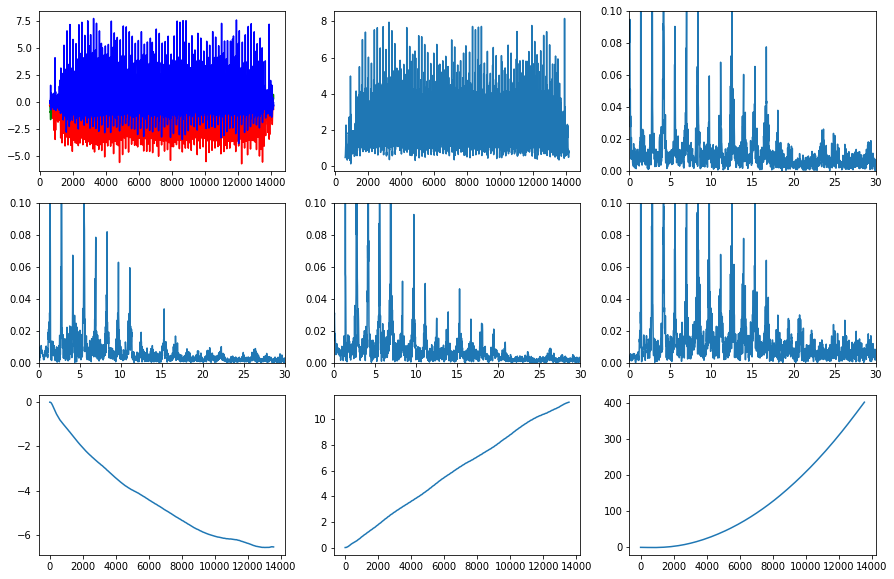

Арслан Разин - Разин Арслан 2021-07-05 21.39.29 - бег 4 Амплитуда: 8.0225521560212
Арслан Разин - Разин Арслан 2021-07-05 21.39.29 - бег 4 Среднее: 2.1367871578041595
Арслан Разин - Разин Арслан 2021-07-07 21.06.32 - электросамокат 1
Арслан Разин - Разин Арслан 2021-07-07 21.06.32 - электросамокат 1
New means: -6.612962075747953e-17 -1.4077593509736174e-16 0.9761660711257788


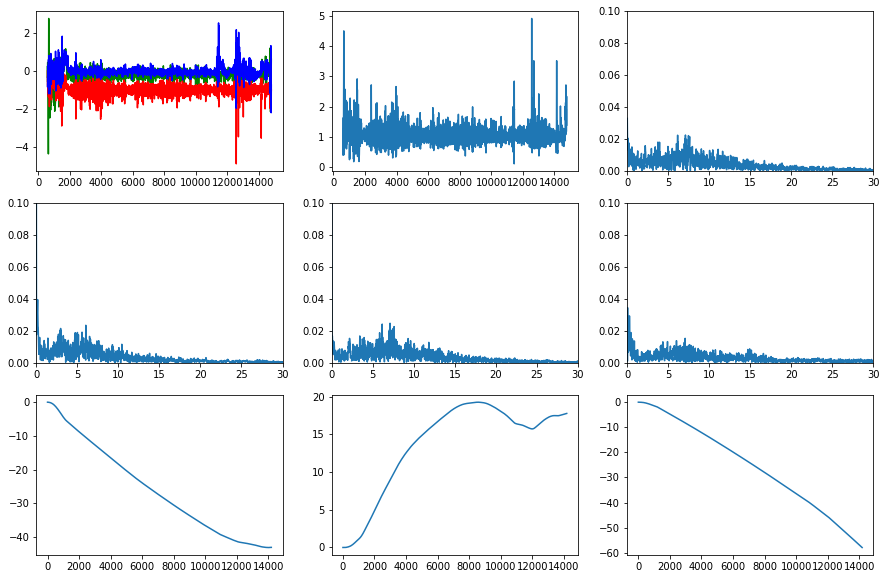

Арслан Разин - Разин Арслан 2021-07-07 21.06.32 - электросамокат 1 Амплитуда: 4.826057105048199
Арслан Разин - Разин Арслан 2021-07-07 21.06.32 - электросамокат 1 Среднее: 1.059982605686556
Арслан Разин - Разин Арслан 2021-07-07 21.07.56 - электросамокат 2
Арслан Разин - Разин Арслан 2021-07-07 21.07.56 - электросамокат 2
New means: 3.302867717583312e-17 -1.2785294390645078e-17 0.9793888908723448


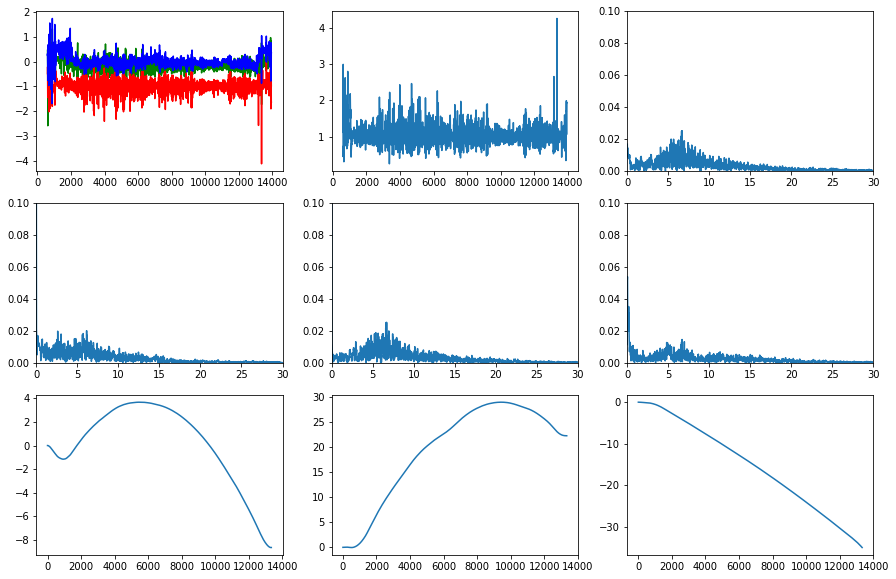

Арслан Разин - Разин Арслан 2021-07-07 21.07.56 - электросамокат 2 Амплитуда: 4.015189396608818
Арслан Разин - Разин Арслан 2021-07-07 21.07.56 - электросамокат 2 Среднее: 1.0408628609281856
Арслан Разин - Разин Арслан 2021-07-07 21.09.13 - электросамокат 3
Арслан Разин - Разин Арслан 2021-07-07 21.09.13 - электросамокат 3
New means: 6.277572486008616e-17 1.824419503746254e-16 0.9878563518056525


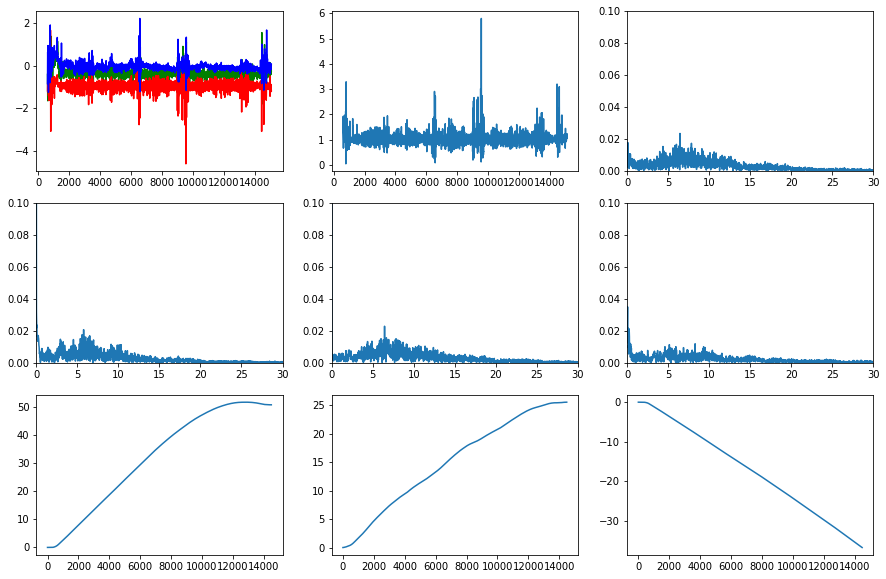

Арслан Разин - Разин Арслан 2021-07-07 21.09.13 - электросамокат 3 Амплитуда: 5.756474764451432
Арслан Разин - Разин Арслан 2021-07-07 21.09.13 - электросамокат 3 Среднее: 1.039843558398532
Арслан Разин - Разин Арслан 2021-07-07 21.10.35 - электросамокат 4
Арслан Разин - Разин Арслан 2021-07-07 21.10.35 - электросамокат 4
New means: -6.11805384948361e-17 -4.689019373691818e-17 0.9913745095299928


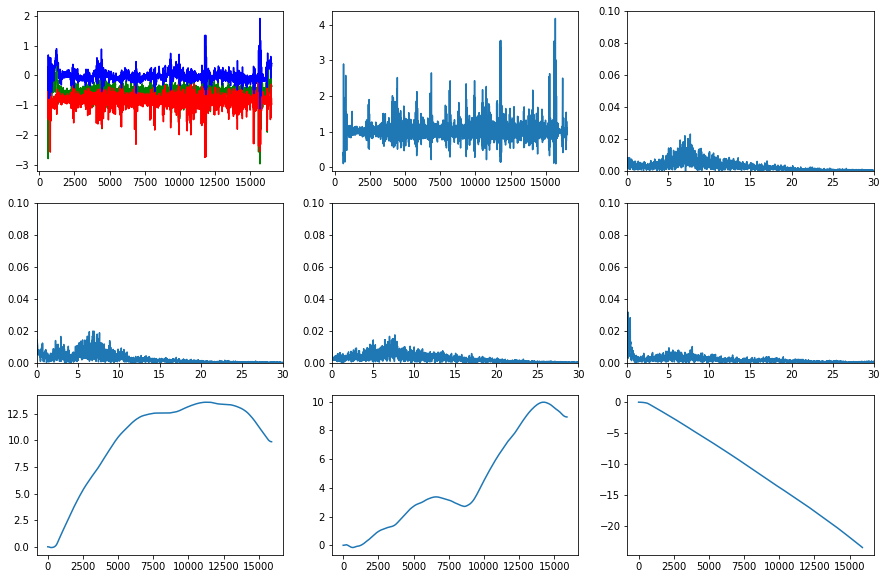

Арслан Разин - Разин Арслан 2021-07-07 21.10.35 - электросамокат 4 Амплитуда: 4.082408318640019
Арслан Разин - Разин Арслан 2021-07-07 21.10.35 - электросамокат 4 Среднее: 1.0285680703299511
Артём - Прохоров бег 1
Артём - Прохоров бег 1
New means: -1.4572433214332632e-17 -1.3297345308078527e-16 1.1054182478826142


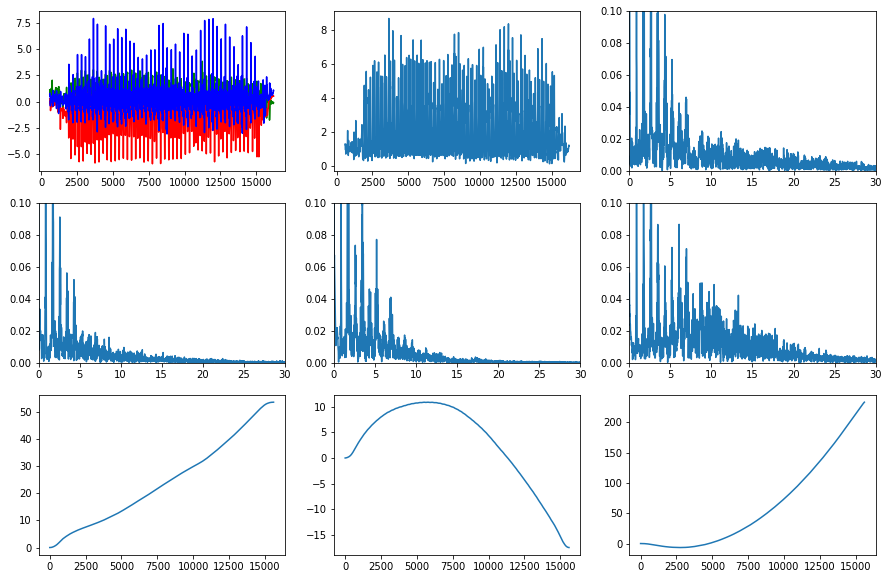

Артём - Прохоров бег 1 Амплитуда: 8.569267071173995
Артём - Прохоров бег 1 Среднее: 1.7947421739657263
Артём - Прохоров бег 2
Артём - Прохоров бег 2
New means: 4.25389783931411e-17 -1.5881218600106011e-16 1.1039350284036515


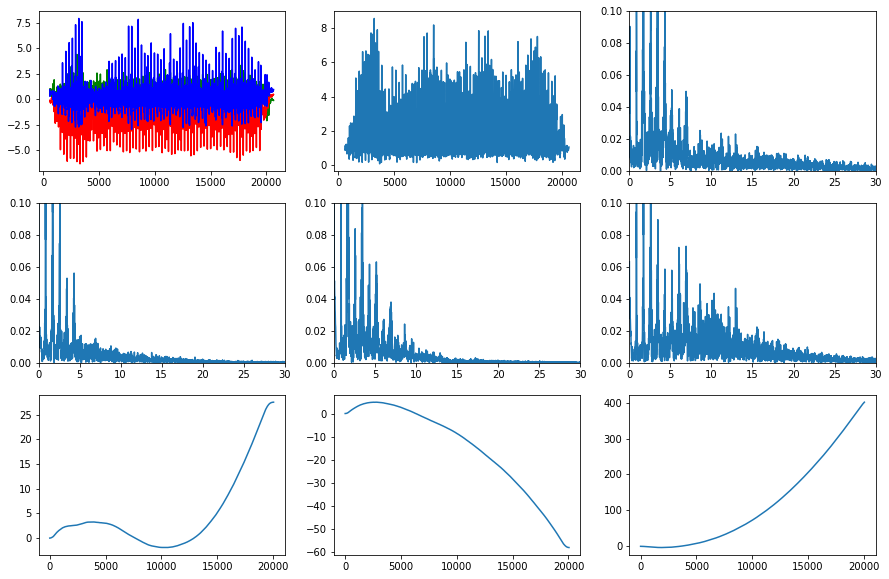

Артём - Прохоров бег 2 Амплитуда: 8.468451551965419
Артём - Прохоров бег 2 Среднее: 1.7405307427865229
Артём - Прохоров бег 3
Артём - Прохоров бег 3
New means: -8.745141363201233e-17 1.41050667148407e-17 1.0818757972506399


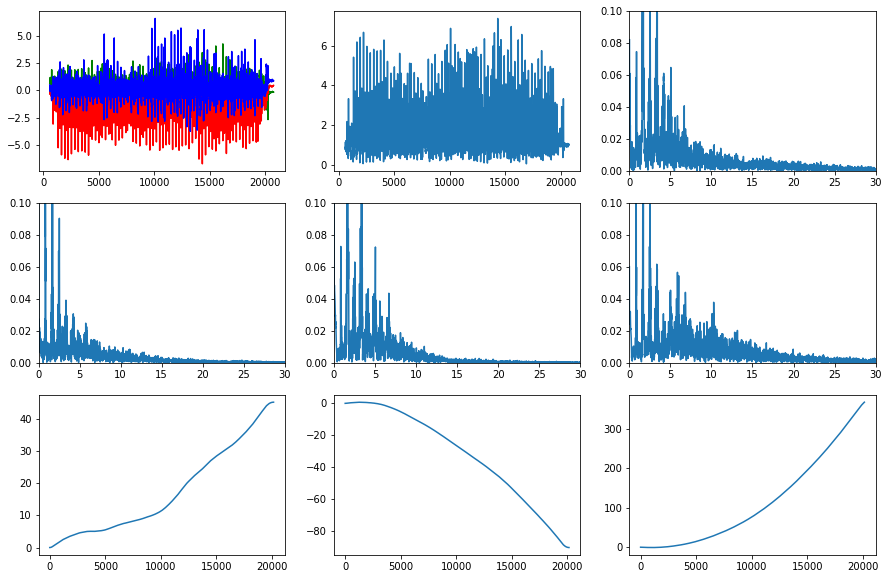

Артём - Прохоров бег 3 Амплитуда: 7.3542514036338975
Артём - Прохоров бег 3 Среднее: 1.6204546885148792
Артём - Прохоров бег 4
Артём - Прохоров бег 4
New means: 4.268805862181437e-17 5.805575972566754e-17 1.0296804622527211


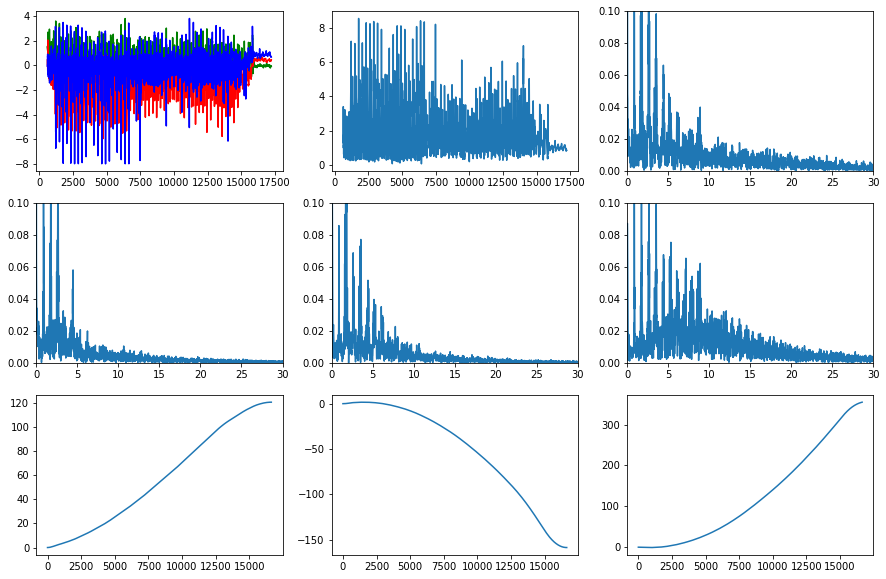

Артём - Прохоров бег 4 Амплитуда: 8.521923613123398
Артём - Прохоров бег 4 Среднее: 1.7123522553783095
Артём - Прохоров бег 5
Артём - Прохоров бег 5
New means: -3.2338385418165693e-17 2.3631897036351852e-17 1.1487732752117432


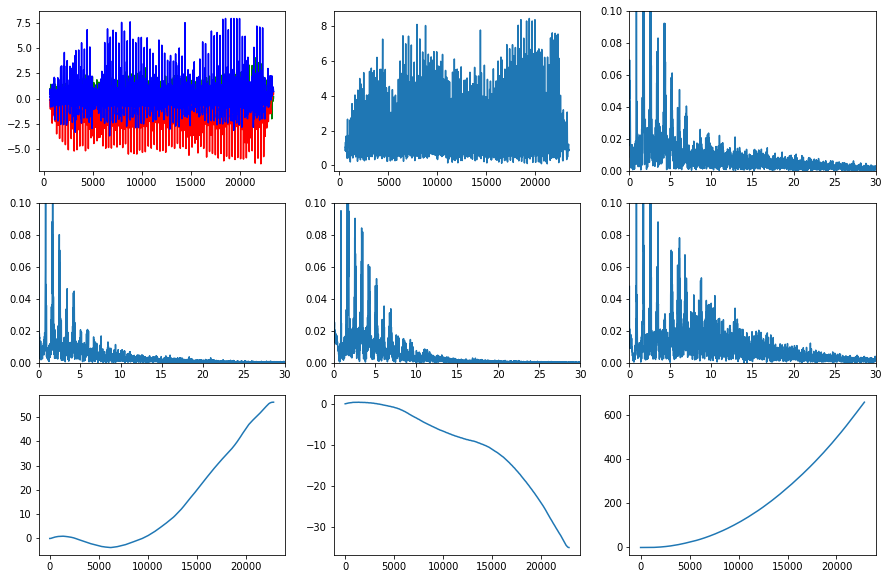

Артём - Прохоров бег 5 Амплитуда: 8.342834731039337
Артём - Прохоров бег 5 Среднее: 1.791105703846653
Артём - Прохоров стояние 1
Артём - Прохоров стояние 1
New means: -1.9241790665097654e-18 -6.338472219090992e-17 0.9963892598027165


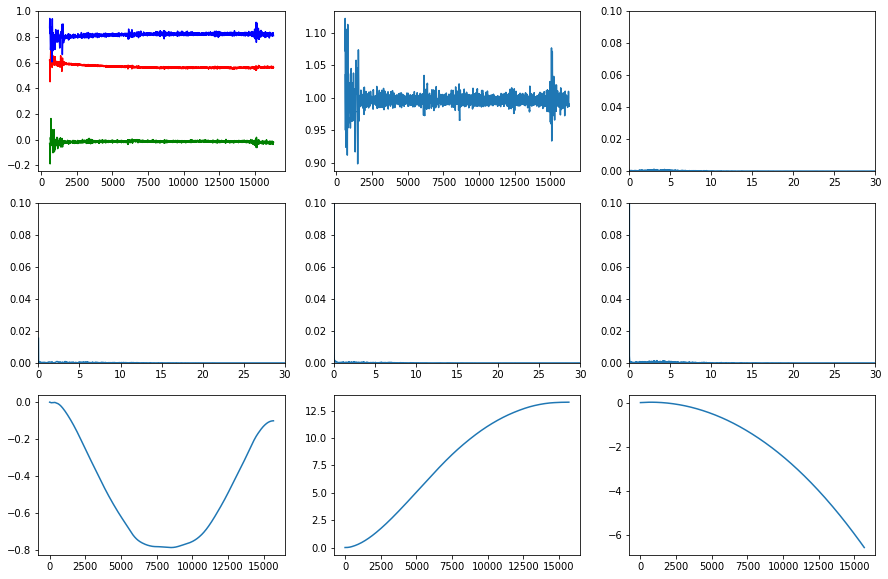

Артём - Прохоров стояние 1 Амплитуда: 0.22425792312439696
Артём - Прохоров стояние 1 Среднее: 0.9966586362466645
Артём - Прохоров стояние 2
Артём - Прохоров стояние 2
New means: 1.3464164121867263e-17 -6.891826381023583e-17 1.001373769349518


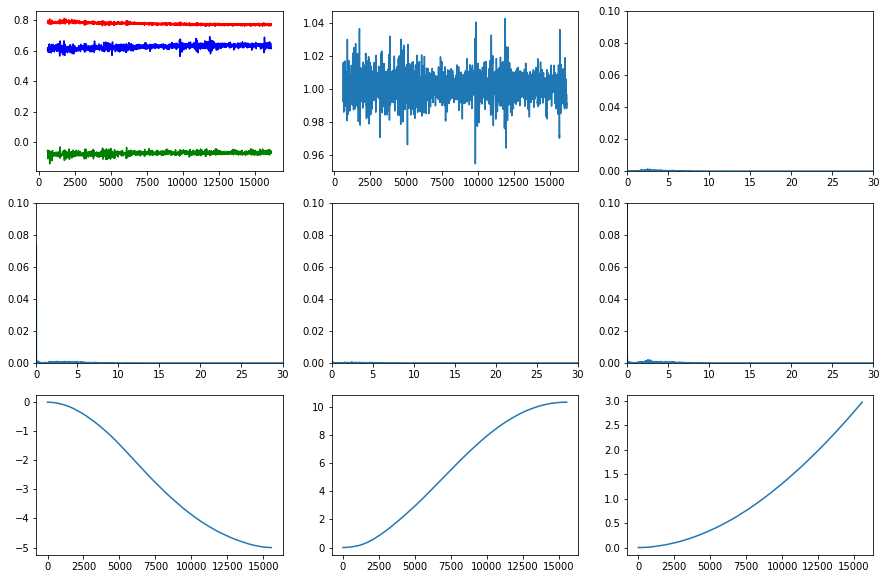

Артём - Прохоров стояние 2 Амплитуда: 0.0882415842665022
Артём - Прохоров стояние 2 Среднее: 1.0015440556916555
Артём - Прохоров стояние 3
Артём - Прохоров стояние 3
New means: -4.358612174792803e-17 -5.292600497962689e-17 1.003909163671891


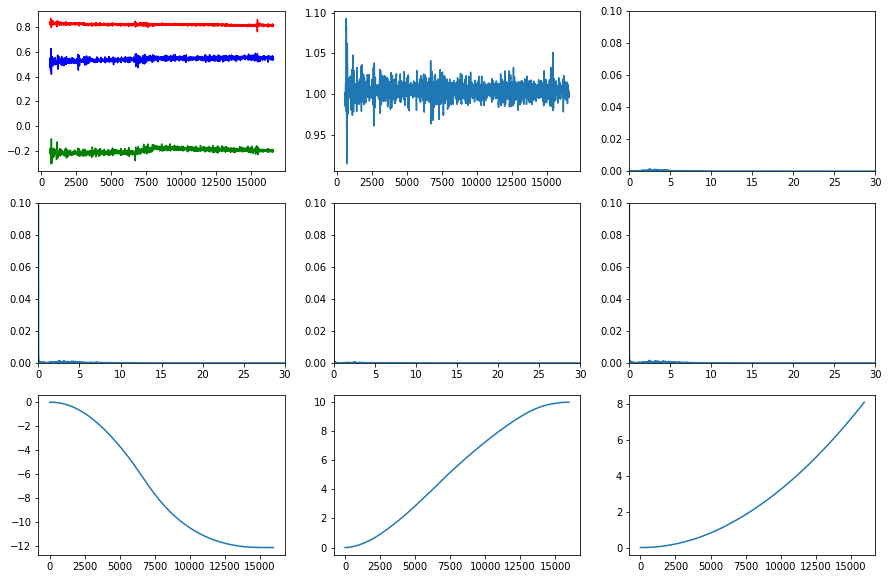

Артём - Прохоров стояние 3 Амплитуда: 0.17866651136694234
Артём - Прохоров стояние 3 Среднее: 1.0042016072677247
Артём - Прохоров стояние 4
Артём - Прохоров стояние 4
New means: -1.6685002181552168e-18 6.960029481447476e-17 1.0023345095332623


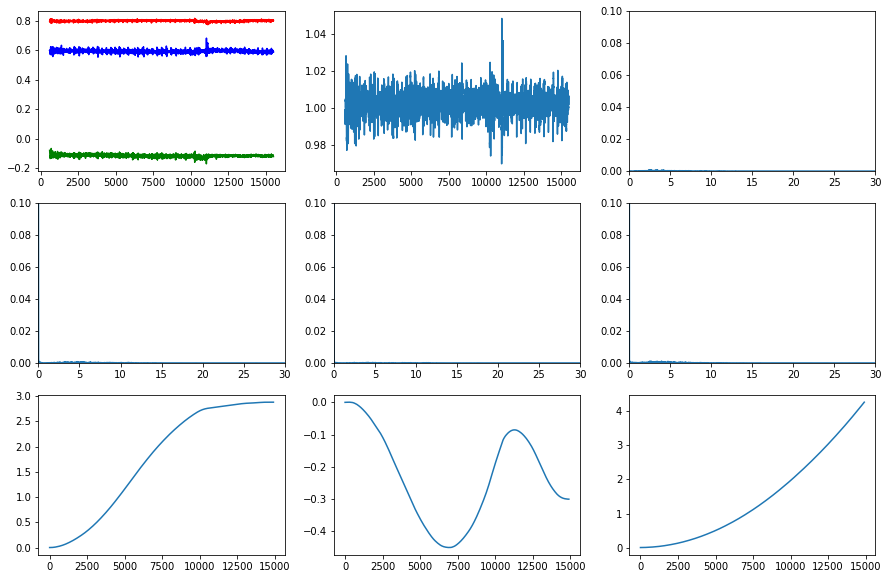

Артём - Прохоров стояние 4 Амплитуда: 0.07836765623364905
Артём - Прохоров стояние 4 Среднее: 1.0024227723029995
Артём - Прохоров стояние 5
Артём - Прохоров стояние 5
New means: -9.617177719989806e-20 2.885153315996942e-17 0.9911922569188044


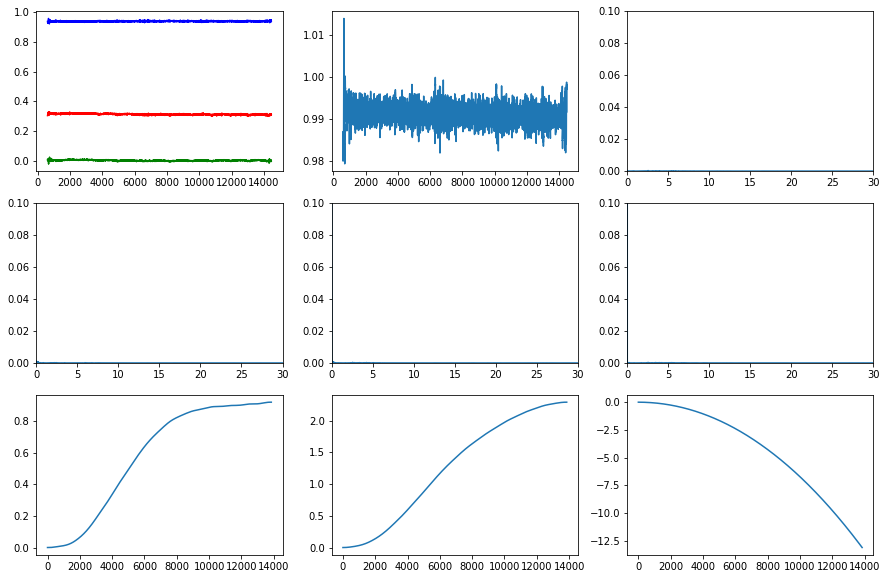

Артём - Прохоров стояние 5 Амплитуда: 0.03468260214982899
Артём - Прохоров стояние 5 Среднее: 0.9912061181431634
Артём - Прохоров шаг 1
Артём - Прохоров шаг 1
New means: 2.649301773900448e-18 -3.7620085189386366e-17 0.9923507043078922


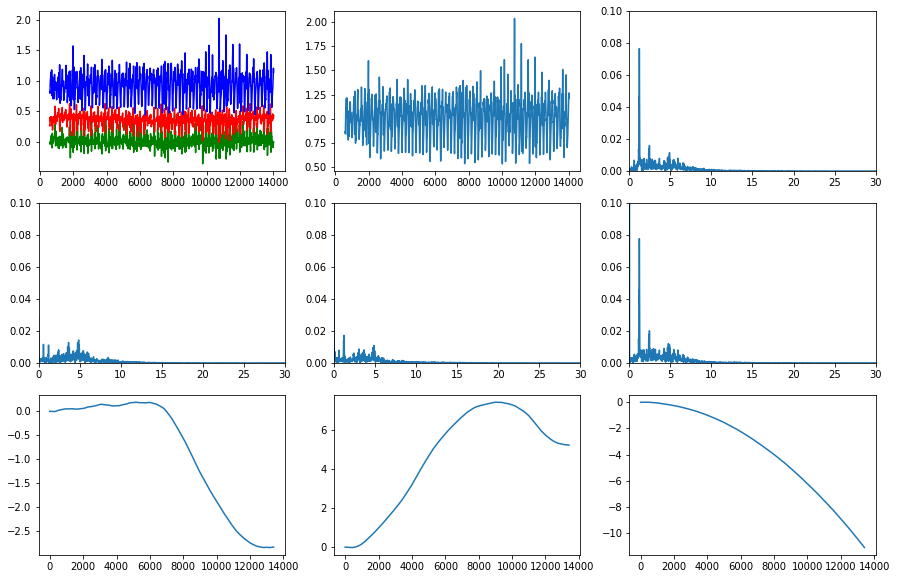

Артём - Прохоров шаг 1 Амплитуда: 1.4973519122069947
Артём - Прохоров шаг 1 Среднее: 1.0044926059590422
Артём - Прохоров шаг 2
Артём - Прохоров шаг 2
New means: 7.352905136184586e-18 8.245757902721286e-18 0.9911784236026111


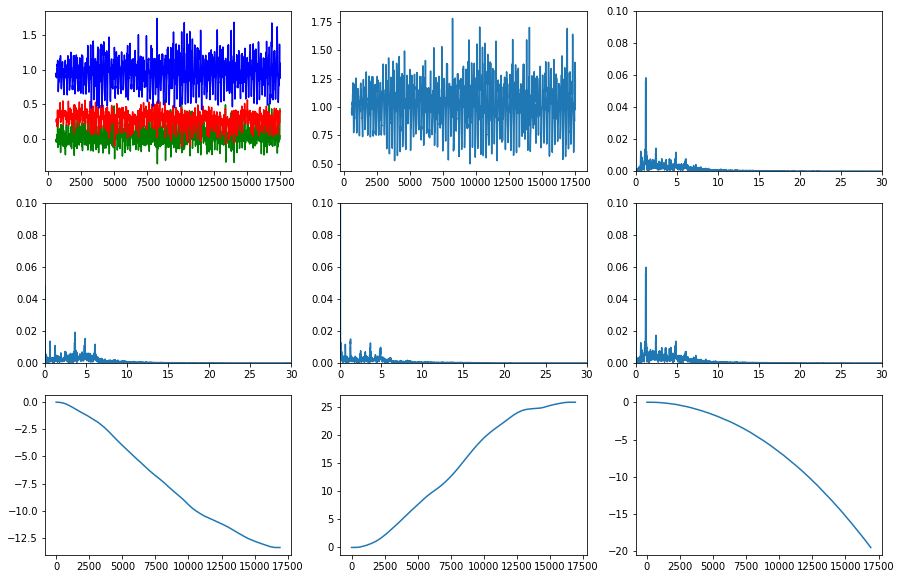

Артём - Прохоров шаг 2 Амплитуда: 1.2824427466829396
Артём - Прохоров шаг 2 Среднее: 1.0054820119274848
Артём - Прохоров шаг 3
Артём - Прохоров шаг 3
New means: -2.5434662648915383e-18 -2.848682216678523e-17 0.9928737541189169


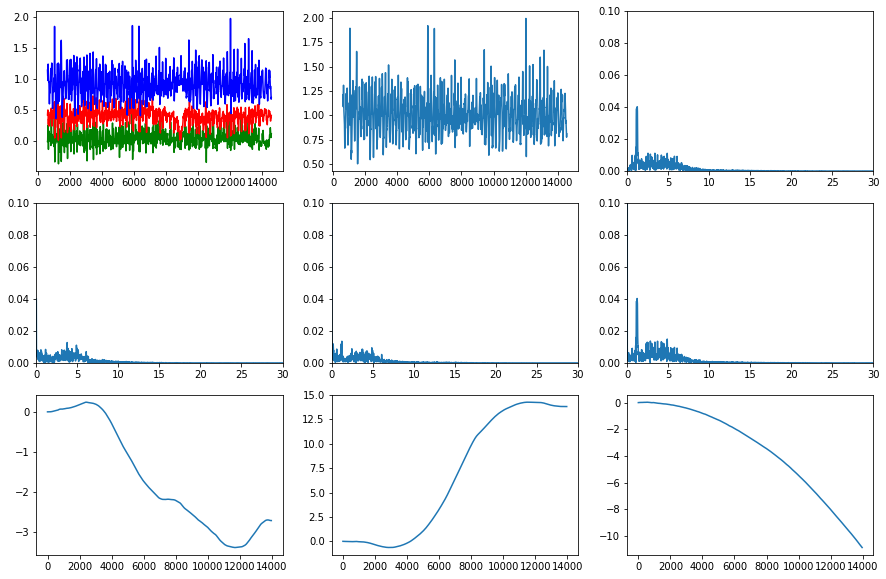

Артём - Прохоров шаг 3 Амплитуда: 1.4912904054675895
Артём - Прохоров шаг 3 Среднее: 1.008422179131254
Артём - Прохоров шаг 4
Артём - Прохоров шаг 4
New means: -1.054502171257569e-17 -2.109004342515138e-17 0.9855090523282007


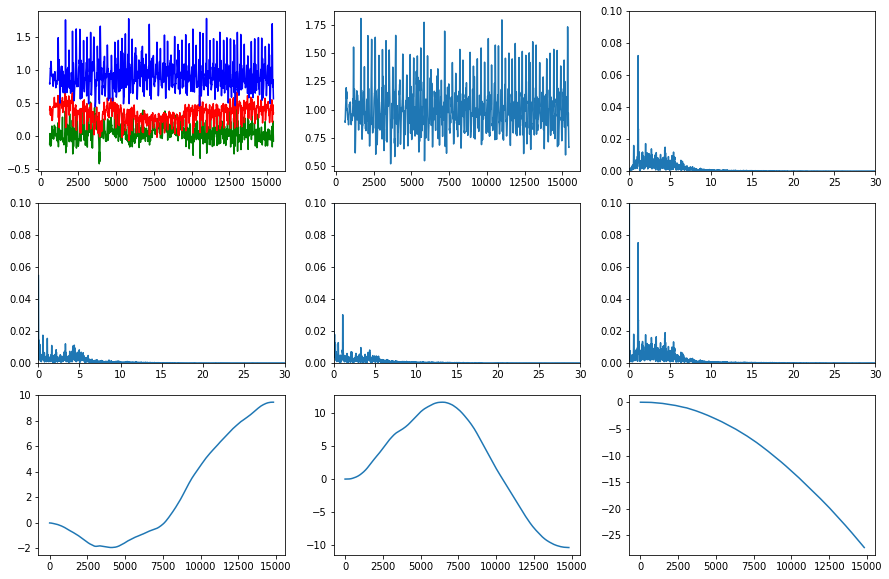

Артём - Прохоров шаг 4 Амплитуда: 1.2925103523385386
Артём - Прохоров шаг 4 Среднее: 1.003929737317572
Артём - Прохоров шаг 5
Артём - Прохоров шаг 5
New means: 0.0 4.1875808464076624e-17 0.9882876980097245


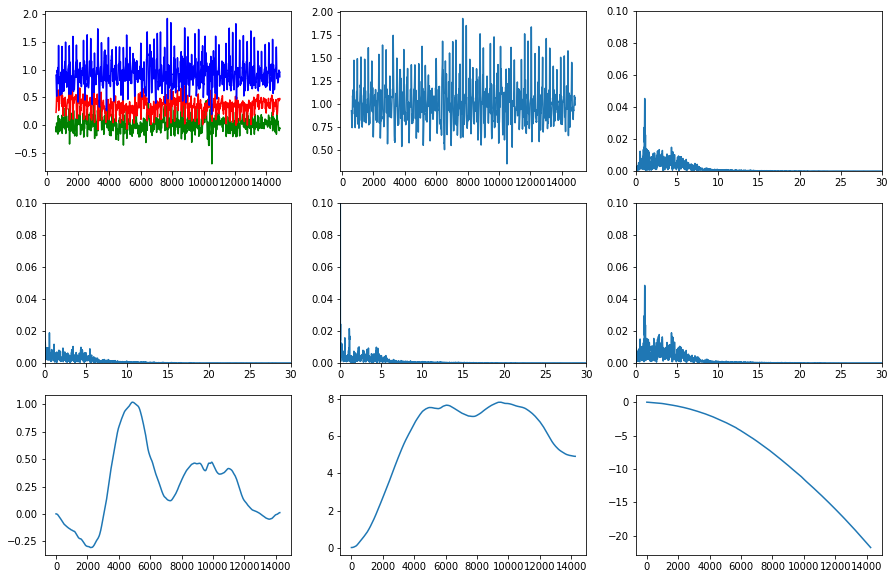

Артём - Прохоров шаг 5 Амплитуда: 1.58003445751662
Артём - Прохоров шаг 5 Среднее: 1.0093135207347437
Ваня Беляев - 2021-07-0319.07.57_Беляев_лестница.csv
Ваня Беляев - 2021-07-0319.07.57_Беляев_лестница.csv
New means: 0.0 7.247442010767457e-17 0.9865836336494193


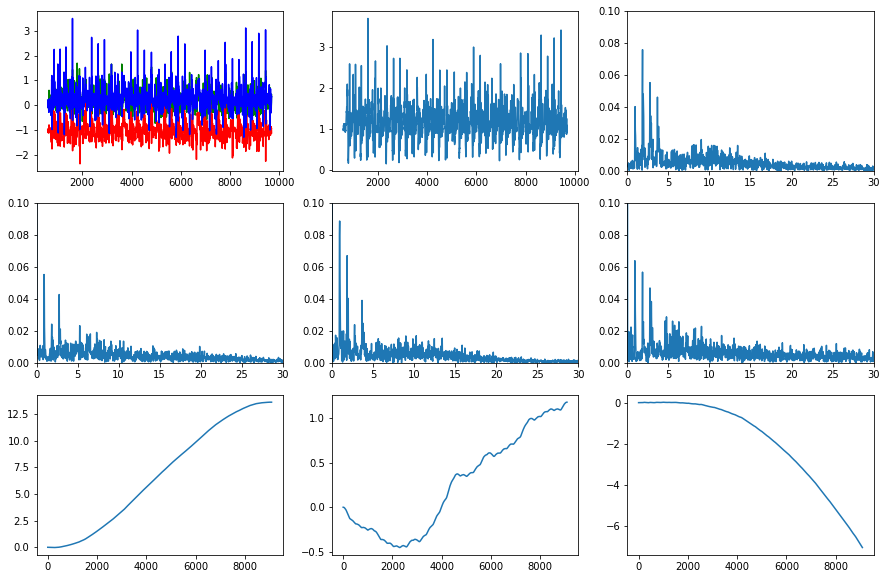

Ваня Беляев - 2021-07-0319.07.57_Беляев_лестница.csv Амплитуда: 3.537266726576554
Ваня Беляев - 2021-07-0319.07.57_Беляев_лестница.csv Среднее: 1.1019658599430147
Ваня Беляев - 2021-07-0319.14.18_Беляев_лестница.csv
Ваня Беляев - 2021-07-0319.14.18_Беляев_лестница.csv
New means: 6.831484816460919e-18 -3.34742756006585e-17 0.9723072658730973


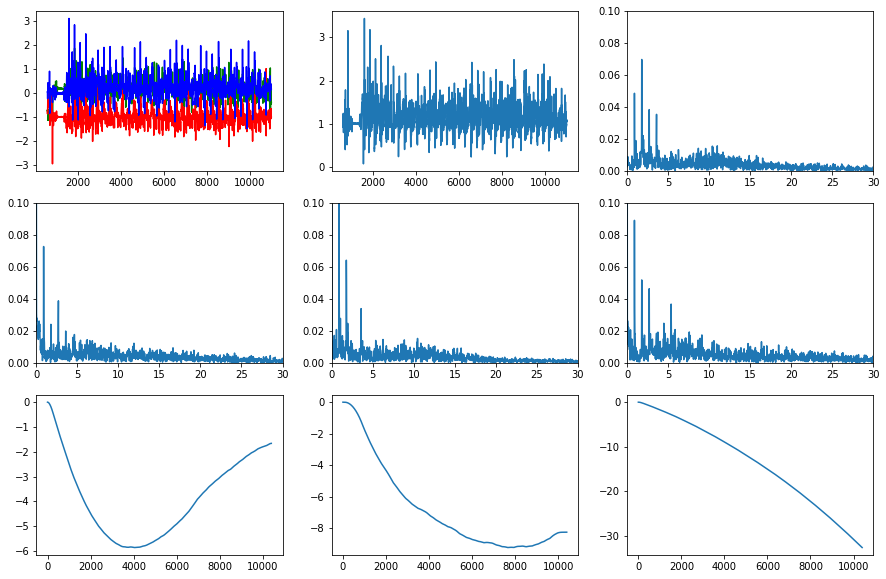

Ваня Беляев - 2021-07-0319.14.18_Беляев_лестница.csv Амплитуда: 3.36224762884661
Ваня Беляев - 2021-07-0319.14.18_Беляев_лестница.csv Среднее: 1.088022996612543
Ваня Беляев - 2021-07-0319.17.03_Беляев_лестница.csv
Ваня Беляев - 2021-07-0319.17.03_Беляев_лестница.csv
New means: 5.914412533639373e-17 -6.284063316991834e-17 0.9977891009231891


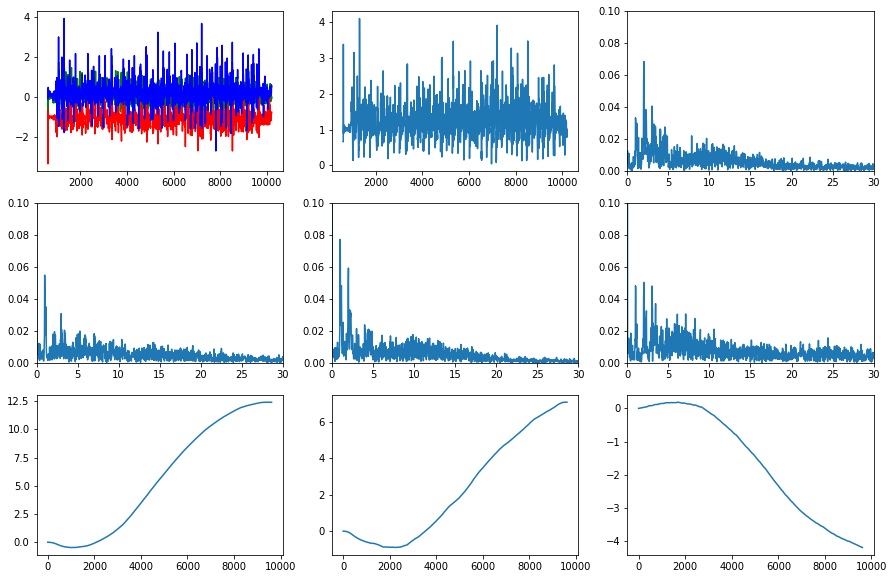

Ваня Беляев - 2021-07-0319.17.03_Беляев_лестница.csv Амплитуда: 4.065559956133192
Ваня Беляев - 2021-07-0319.17.03_Беляев_лестница.csv Среднее: 1.1402562956224755
Ваня Беляев - 2021-07-0319.20.22_Беляев_лестница.csv
Ваня Беляев - 2021-07-0319.20.22_Беляев_лестница.csv
New means: 2.322794167244525e-18 -9.871875210789231e-17 1.0044042268976359


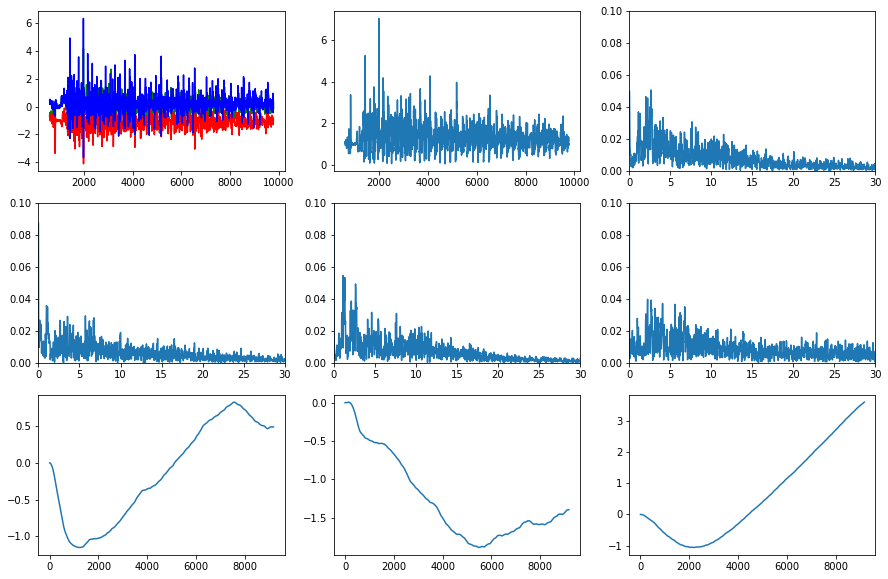

Ваня Беляев - 2021-07-0319.20.22_Беляев_лестница.csv Амплитуда: 6.9608583906899275
Ваня Беляев - 2021-07-0319.20.22_Беляев_лестница.csv Среднее: 1.1839409593185892
Ваня Беляев - 2021-07-0319.25.44_Беляев_ходьба.csv
Ваня Беляев - 2021-07-0319.25.44_Беляев_ходьба.csv
New means: 1.3407798172054726e-17 -1.6477478279867256e-16 1.0208392189768198


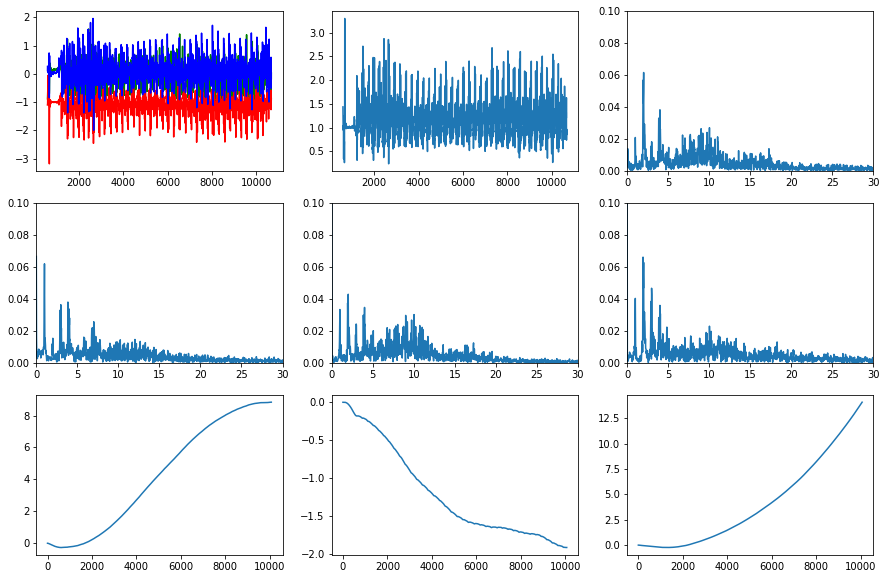

Ваня Беляев - 2021-07-0319.25.44_Беляев_ходьба.csv Амплитуда: 3.0610316018722097
Ваня Беляев - 2021-07-0319.25.44_Беляев_ходьба.csv Среднее: 1.1402613966582125
Ваня Беляев - 2021-07-0319.27.24_Беляев_ходьба.csv
Ваня Беляев - 2021-07-0319.27.24_Беляев_ходьба.csv
New means: -5.534971456378014e-19 5.46117183695964e-17 1.028425575068763


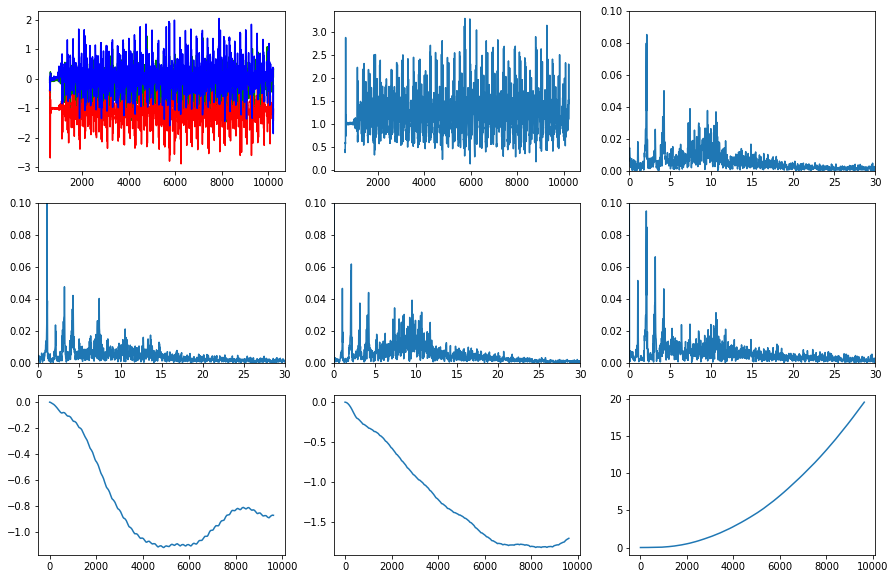

Ваня Беляев - 2021-07-0319.27.24_Беляев_ходьба.csv Амплитуда: 3.165562540089324
Ваня Беляев - 2021-07-0319.27.24_Беляев_ходьба.csv Среднее: 1.1632990447361833
Ваня Беляев - 2021-07-0319.29.16_Беляев_ходьба.csv
Ваня Беляев - 2021-07-0319.29.16_Беляев_ходьба.csv
New means: 3.6535517058828683e-19 1.0704906498236804e-16 1.016654708237005


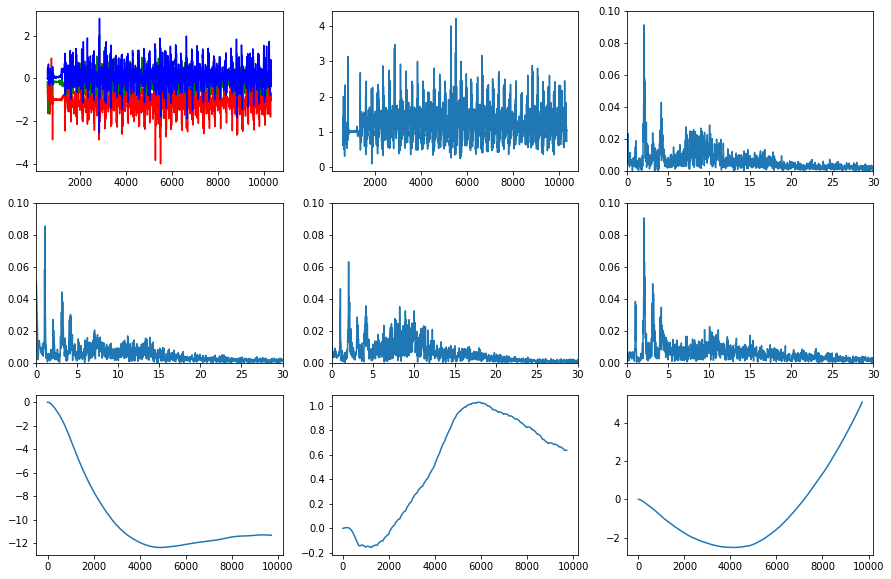

Ваня Беляев - 2021-07-0319.29.16_Беляев_ходьба.csv Амплитуда: 4.112322797160363
Ваня Беляев - 2021-07-0319.29.16_Беляев_ходьба.csv Среднее: 1.1675920847186496
Ваня Беляев - 2021-07-0319.32.22_Беляев_ходьба.csv
Ваня Беляев - 2021-07-0319.32.22_Беляев_ходьба.csv
New means: -7.825360525992294e-18 -7.46669816855098e-17 0.9926033198238968


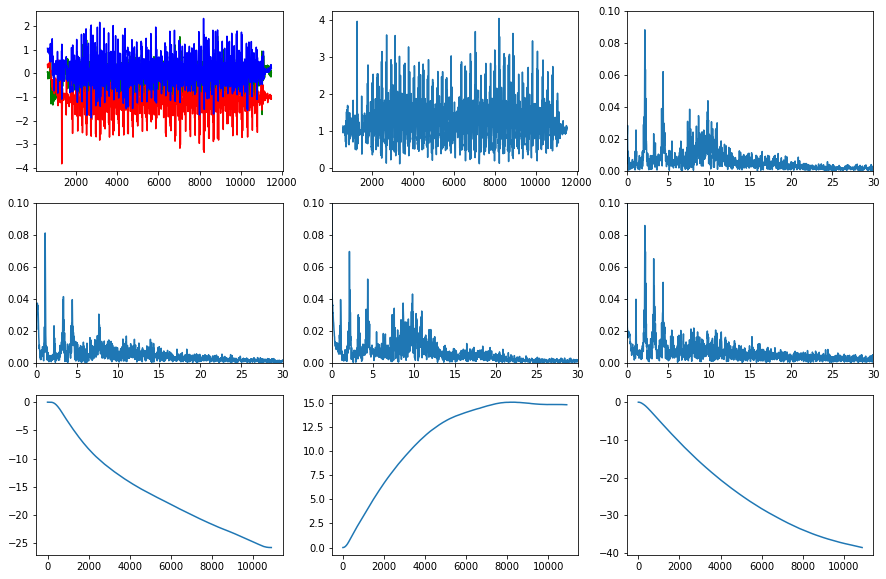

Ваня Беляев - 2021-07-0319.32.22_Беляев_ходьба.csv Амплитуда: 3.930980320072668
Ваня Беляев - 2021-07-0319.32.22_Беляев_ходьба.csv Среднее: 1.1779428054312313
Ваня Беляев - 2021-07-0319.41.49_Беляев_бег.csv
Ваня Беляев - 2021-07-0319.41.49_Беляев_бег.csv
New means: -4.527552278837755e-17 -1.5032888425828485e-16 1.2797779782921905


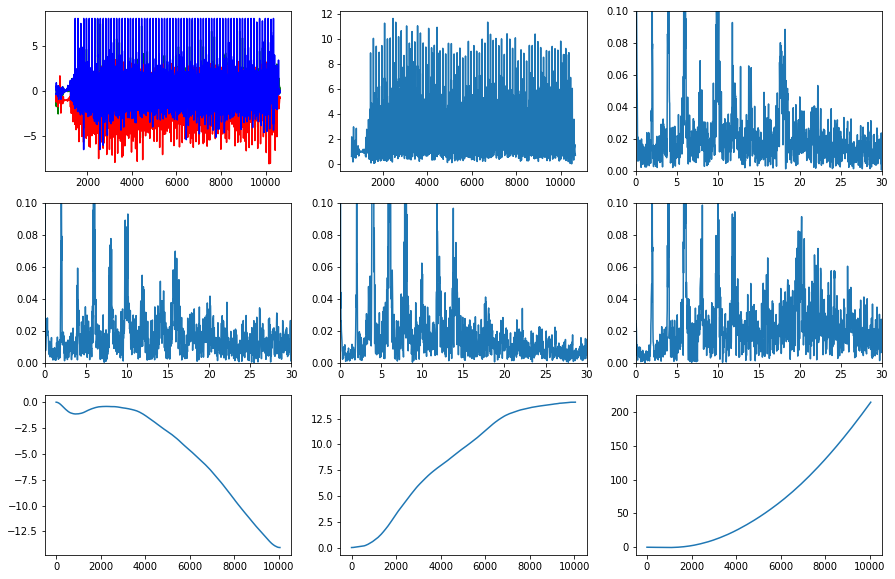

Ваня Беляев - 2021-07-0319.41.49_Беляев_бег.csv Амплитуда: 11.593076389943699
Ваня Беляев - 2021-07-0319.41.49_Беляев_бег.csv Среднее: 2.489367419140874
Ваня Беляев - 2021-07-0319.43.32_Беляев_бег.csv
Ваня Беляев - 2021-07-0319.43.32_Беляев_бег.csv
New means: 8.536756937446138e-18 2.0559356291016116e-16 1.3098735608684404


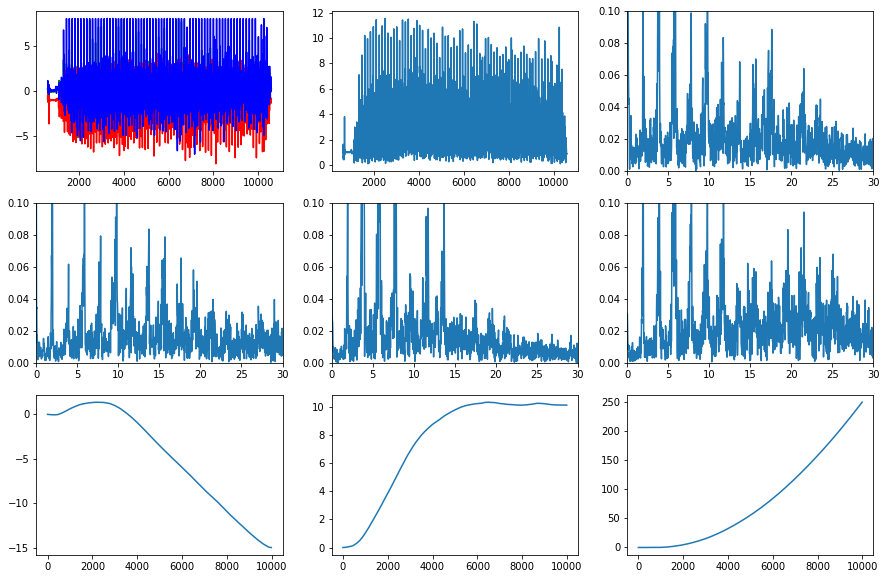

Ваня Беляев - 2021-07-0319.43.32_Беляев_бег.csv Амплитуда: 11.455281208489346
Ваня Беляев - 2021-07-0319.43.32_Беляев_бег.csv Среднее: 2.5785435397231553
Ваня Беляев - 2021-07-0319.45.24_Беляев_бег.csv
Ваня Беляев - 2021-07-0319.45.24_Беляев_бег.csv
New means: -5.7632990835250954e-18 -1.2751299222299273e-16 1.278841065373897


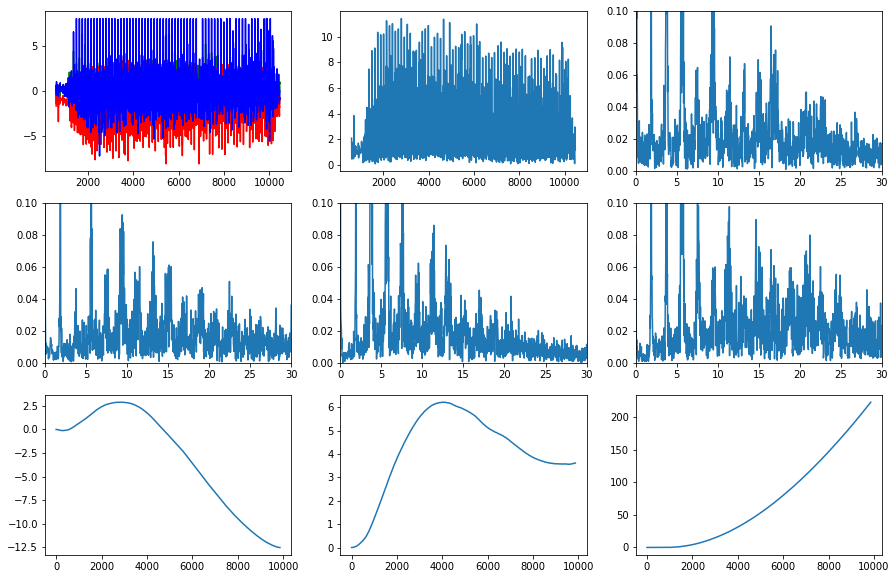

Ваня Беляев - 2021-07-0319.45.24_Беляев_бег.csv Амплитуда: 11.313718331121306
Ваня Беляев - 2021-07-0319.45.24_Беляев_бег.csv Среднее: 2.4706404507140016
Ваня Беляев - 2021-07-0319.47.20_Беляев_бег.csv
Ваня Беляев - 2021-07-0319.47.20_Беляев_бег.csv
New means: -1.6368672798960642e-17 -8.184336399480321e-17 1.271591656372579


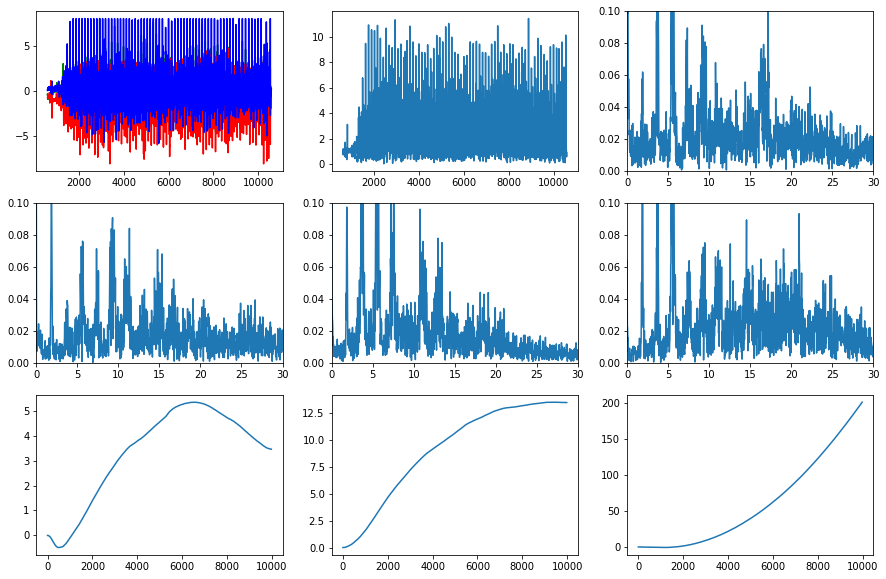

Ваня Беляев - 2021-07-0319.47.20_Беляев_бег.csv Амплитуда: 11.38653238008329
Ваня Беляев - 2021-07-0319.47.20_Беляев_бег.csv Среднее: 2.4813523502207238
Ваня Беляев - 2021-07-0409.47.03_Беляев_стояние.csv
Ваня Беляев - 2021-07-0409.47.03_Беляев_стояние.csv
New means: -8.781673123394554e-19 -9.519333665759698e-17 1.0065658119313572


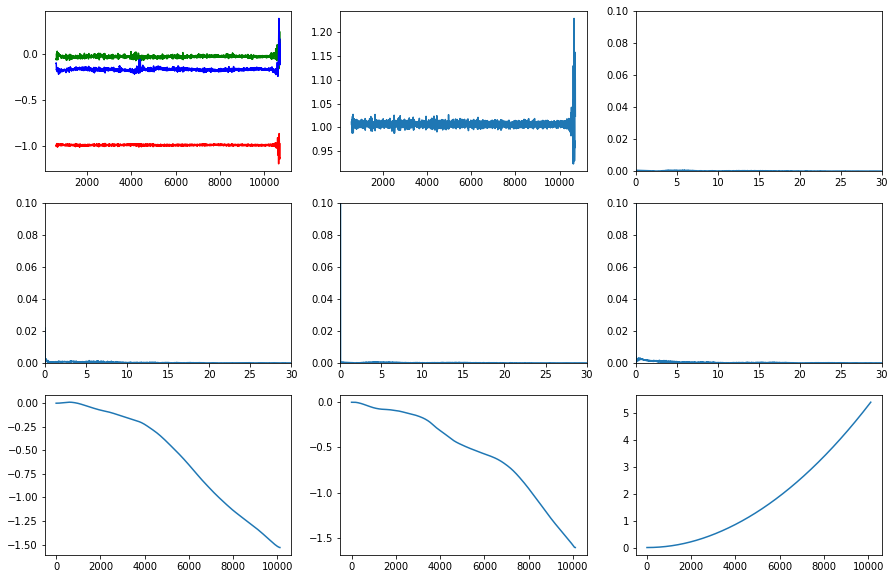

Ваня Беляев - 2021-07-0409.47.03_Беляев_стояние.csv Амплитуда: 0.30383830449797977
Ваня Беляев - 2021-07-0409.47.03_Беляев_стояние.csv Среднее: 1.0072419608089946
Ваня Беляев - 2021-07-0409.48.54_Беляев_стояние.csv
Ваня Беляев - 2021-07-0409.48.54_Беляев_стояние.csv
New means: -2.873964771135604e-17 -1.5745153531634002e-17 1.0071507729711844


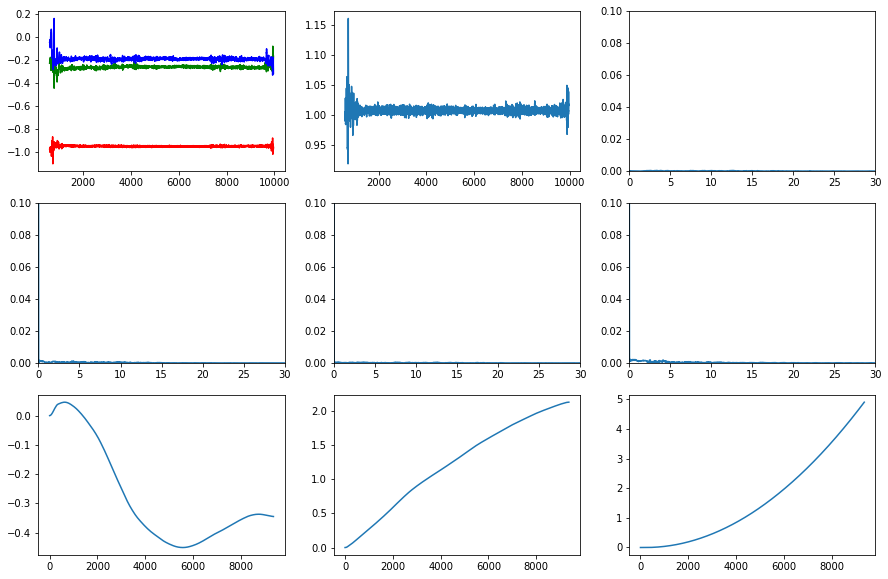

Ваня Беляев - 2021-07-0409.48.54_Беляев_стояние.csv Амплитуда: 0.24117350695848405
Ваня Беляев - 2021-07-0409.48.54_Беляев_стояние.csv Среднее: 1.007607526451835
Ваня Беляев - 2021-07-0409.50.41_Беляев_стояние.csv
Ваня Беляев - 2021-07-0409.50.41_Беляев_стояние.csv
New means: -5.589034145908468e-17 -1.4560904748551007e-16 1.0077690722864923


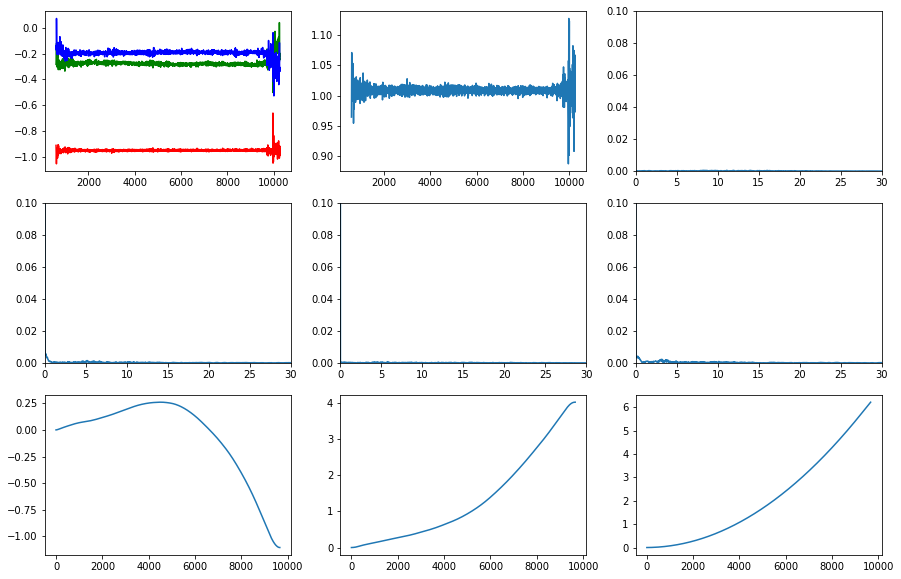

Ваня Беляев - 2021-07-0409.50.41_Беляев_стояние.csv Амплитуда: 0.23971298372547123
Ваня Беляев - 2021-07-0409.50.41_Беляев_стояние.csv Среднее: 1.008689846689992
Ваня Беляев - 2021-07-0409.52.25_Беляев_стояние.csv
Ваня Беляев - 2021-07-0409.52.25_Беляев_стояние.csv
New means: 5.462469780201461e-17 5.55830258336289e-17 1.0104937296841487


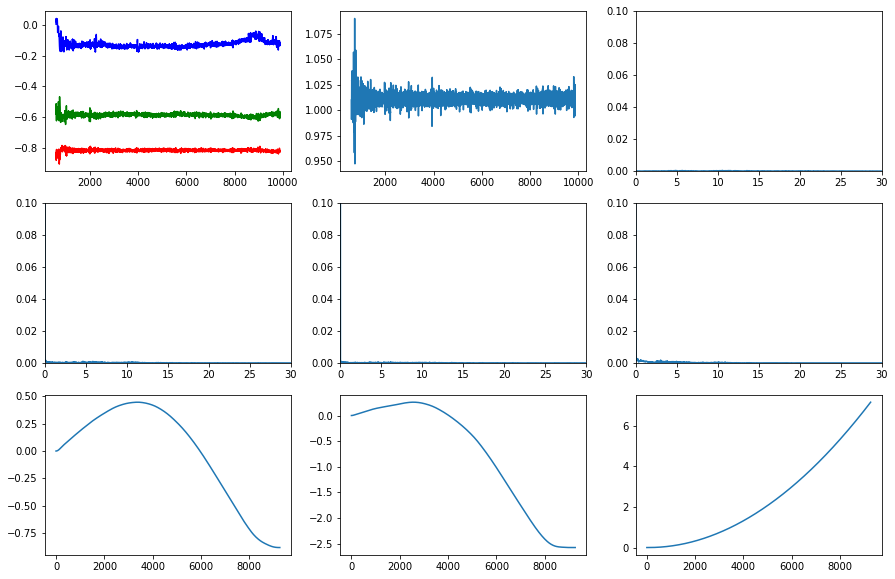

Ваня Беляев - 2021-07-0409.52.25_Беляев_стояние.csv Амплитуда: 0.14269280775105742
Ваня Беляев - 2021-07-0409.52.25_Беляев_стояние.csv Среднее: 1.010896551806585
Влада - 2021-07-0420.39.40 Белозерова стояние
Влада - 2021-07-0420.39.40 Белозерова стояние
New means: 9.650835120680478e-17 8.319685448862481e-19 0.9906094748124535


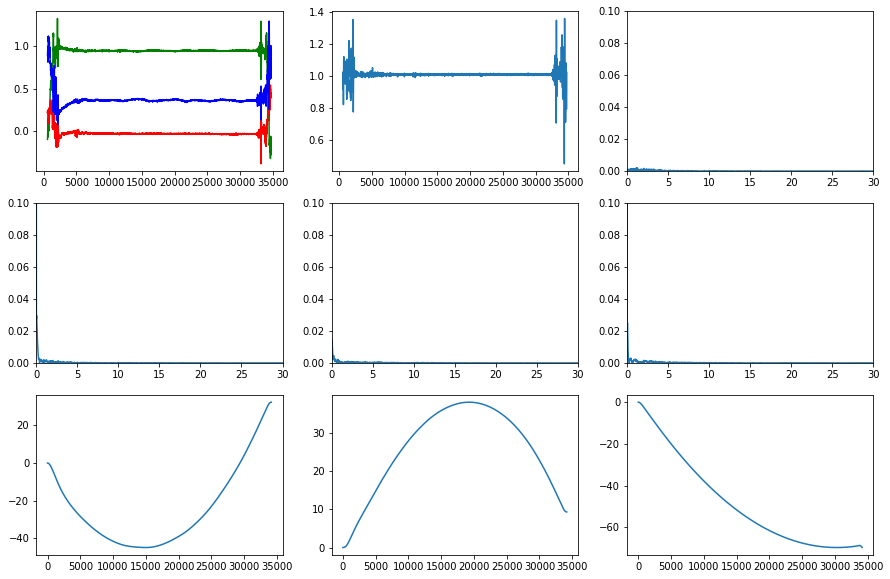

Влада - 2021-07-0420.39.40 Белозерова стояние Амплитуда: 0.9074471045572214
Влада - 2021-07-0420.39.40 Белозерова стояние Среднее: 1.0106840271060074
Влада Белозерова - 2021-07-0421.32.27 Белозерова стояние.csv
Влада Белозерова - 2021-07-0421.32.27 Белозерова стояние.csv
New means: 2.8550185264092426e-17 1.049639164121045e-18 1.00747384388047


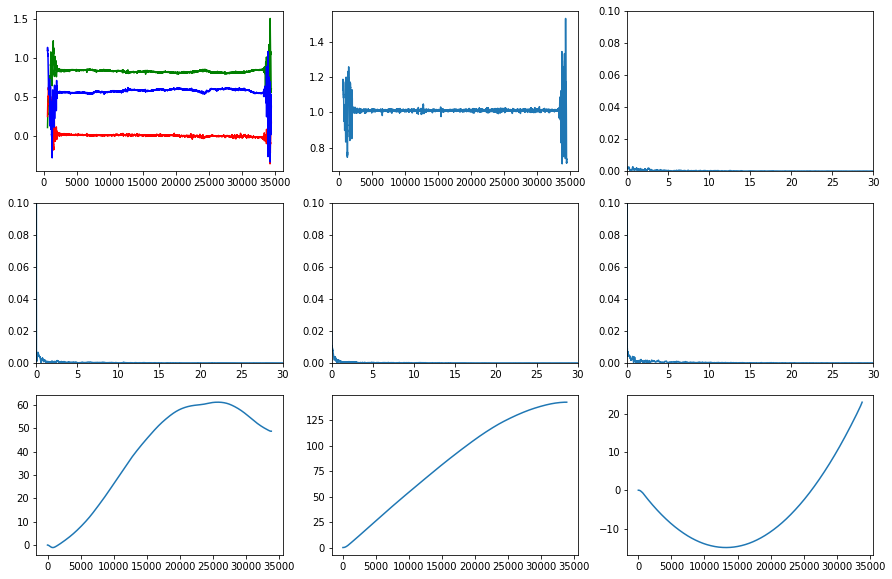

Влада Белозерова - 2021-07-0421.32.27 Белозерова стояние.csv Амплитуда: 0.820941151579207
Влада Белозерова - 2021-07-0421.32.27 Белозерова стояние.csv Среднее: 1.0140036939452537
Влада Белозерова - 2021-07-0421.33.31 Белозерова стояние.csv
Влада Белозерова - 2021-07-0421.33.31 Белозерова стояние.csv
New means: 1.1901816399924277e-16 -1.6327401559462905e-17 1.009163137938869


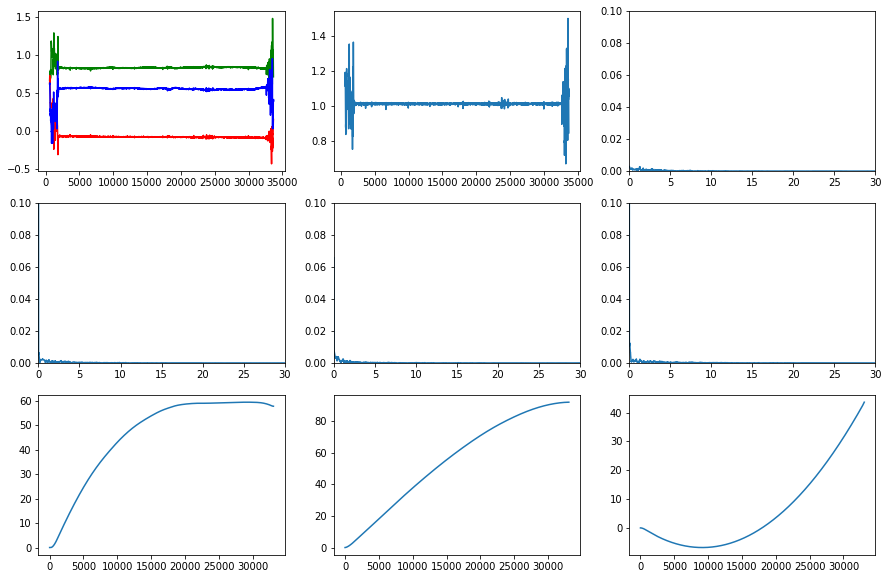

Влада Белозерова - 2021-07-0421.33.31 Белозерова стояние.csv Амплитуда: 0.8288260959907037
Влада Белозерова - 2021-07-0421.33.31 Белозерова стояние.csv Среднее: 1.0140034701610658
Влада Белозерова - 2021-07-0421.34.30 Белозерова стояние.csv
Влада Белозерова - 2021-07-0421.34.30 Белозерова стояние.csv
New means: 1.514209346318807e-18 -1.3627884116869264e-17 0.9998048363632762


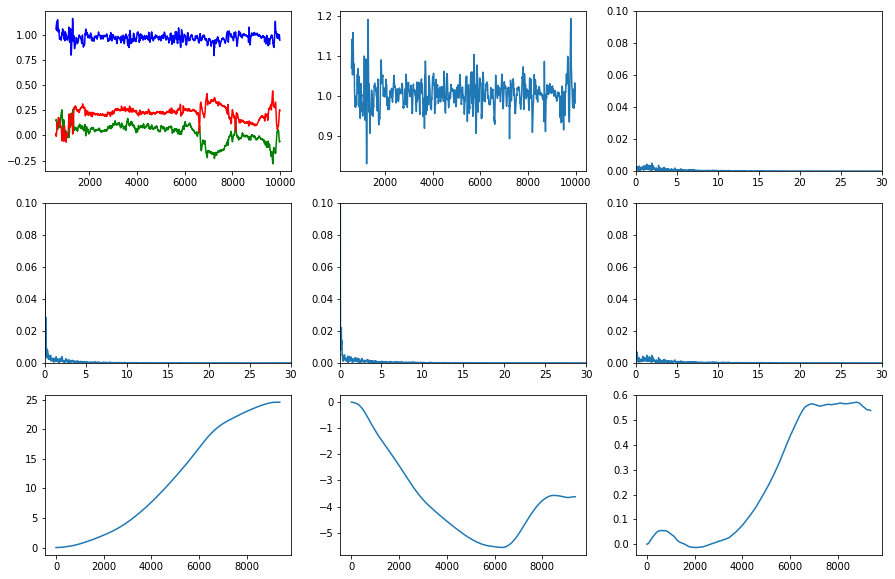

Влада Белозерова - 2021-07-0421.34.30 Белозерова стояние.csv Амплитуда: 0.36314288284094465
Влада Белозерова - 2021-07-0421.34.30 Белозерова стояние.csv Среднее: 1.0068519391853812
Влада Белозерова - 2021-07-0510.13.39 Белозерова стояние.csv
Влада Белозерова - 2021-07-0510.13.39 Белозерова стояние.csv
New means: 6.670526578687865e-17 1.0532410387401892e-17 1.0104323210961819


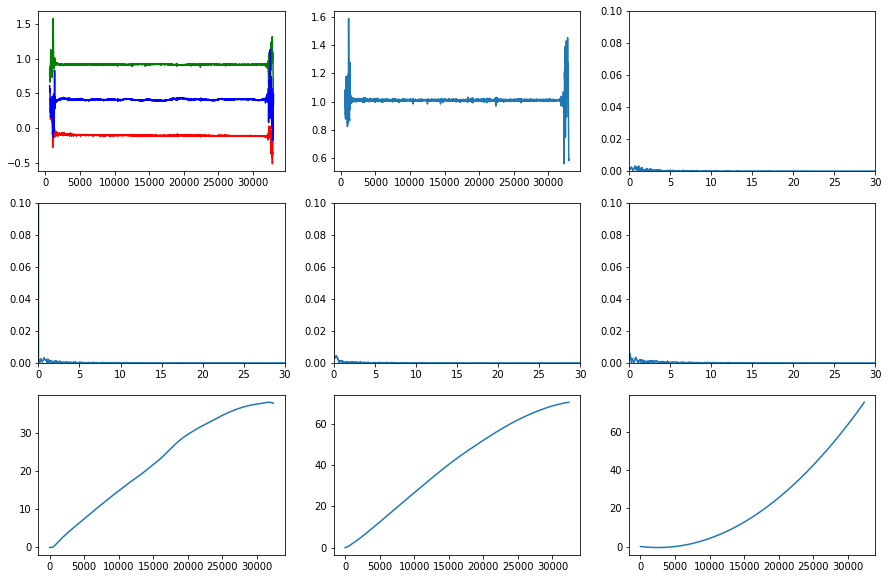

Влада Белозерова - 2021-07-0510.13.39 Белозерова стояние.csv Амплитуда: 1.0292794983894482
Влада Белозерова - 2021-07-0510.13.39 Белозерова стояние.csv Среднее: 1.0126726475788475
Влада Белозерова - 2021-07-0513.21.17 Белозерова ходьба.csv
Влада Белозерова - 2021-07-0513.21.17 Белозерова ходьба.csv
New means: -2.1557980196934015e-17 3.482442954889341e-17 0.9958098096477568


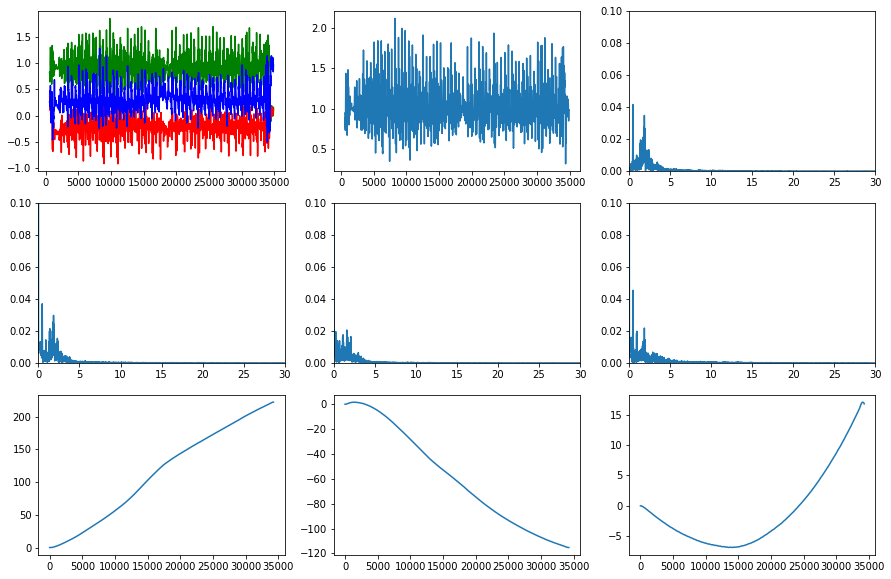

Влада Белозерова - 2021-07-0513.21.17 Белозерова ходьба.csv Амплитуда: 1.7978515716016514
Влада Белозерова - 2021-07-0513.21.17 Белозерова ходьба.csv Среднее: 1.0367718876671679
Влада Белозерова - 2021-07-0513.22.23 Белозерова ходьба.csv
Влада Белозерова - 2021-07-0513.22.23 Белозерова ходьба.csv
New means: -2.5040365754737492e-17 2.0121722481485483e-17 1.0062125645103663


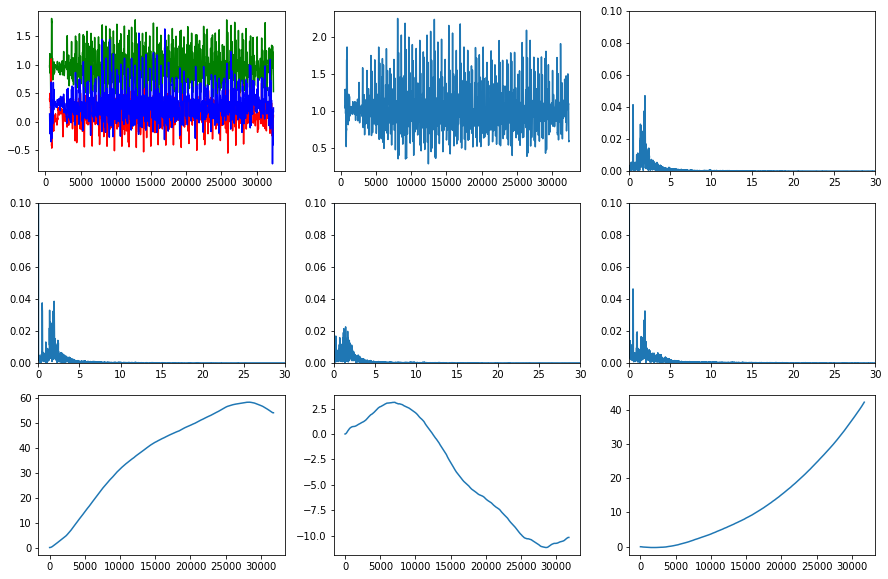

Влада Белозерова - 2021-07-0513.22.23 Белозерова ходьба.csv Амплитуда: 1.9527459148631416
Влада Белозерова - 2021-07-0513.22.23 Белозерова ходьба.csv Среднее: 1.0457664485432634
Влада Белозерова - 2021-07-0513.23.19 Белозерова ходьба.csv
Влада Белозерова - 2021-07-0513.23.19 Белозерова ходьба.csv
New means: 6.555770068637272e-17 4.452052807805909e-17 1.005517431593808


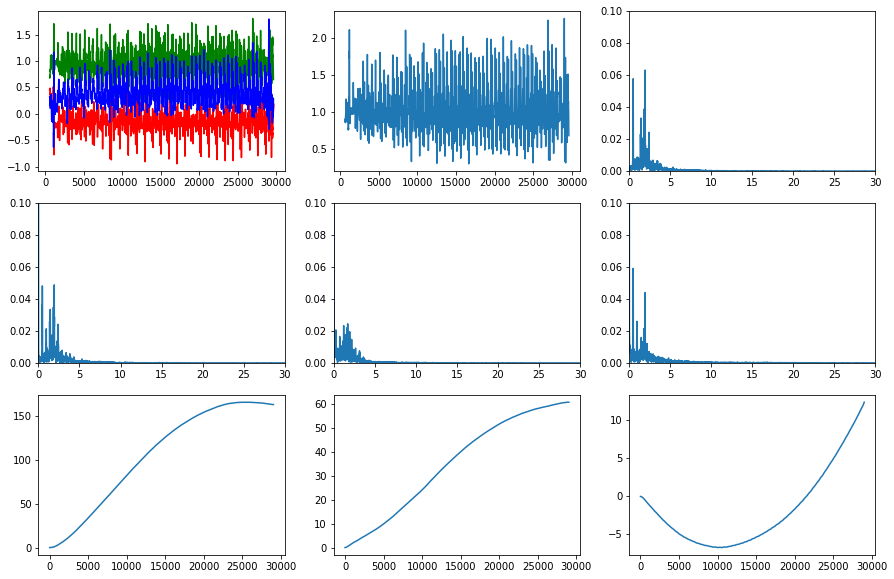

Влада Белозерова - 2021-07-0513.23.19 Белозерова ходьба.csv Амплитуда: 1.9576246346466615
Влада Белозерова - 2021-07-0513.23.19 Белозерова ходьба.csv Среднее: 1.0444787270247464
Влада Белозерова - 2021-07-0513.24.18 Белозерова ходьба.csv
Влада Белозерова - 2021-07-0513.24.18 Белозерова ходьба.csv
New means: -3.8134963728329494e-17 6.510847465812352e-18 1.0067454350452523


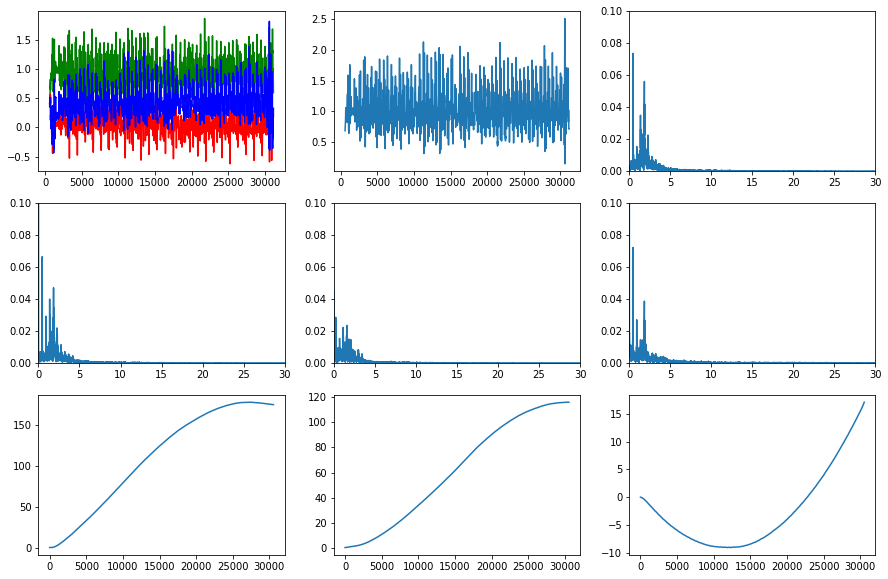

Влада Белозерова - 2021-07-0513.24.18 Белозерова ходьба.csv Амплитуда: 2.3545019182351585
Влада Белозерова - 2021-07-0513.24.18 Белозерова ходьба.csv Среднее: 1.0449069048518318
Влада Белозерова - 2021-07-0513.29.14 Белозерова бег.csv
Влада Белозерова - 2021-07-0513.29.14 Белозерова бег.csv
New means: -3.5835094632503085e-17 0.0 0.9915027414566038


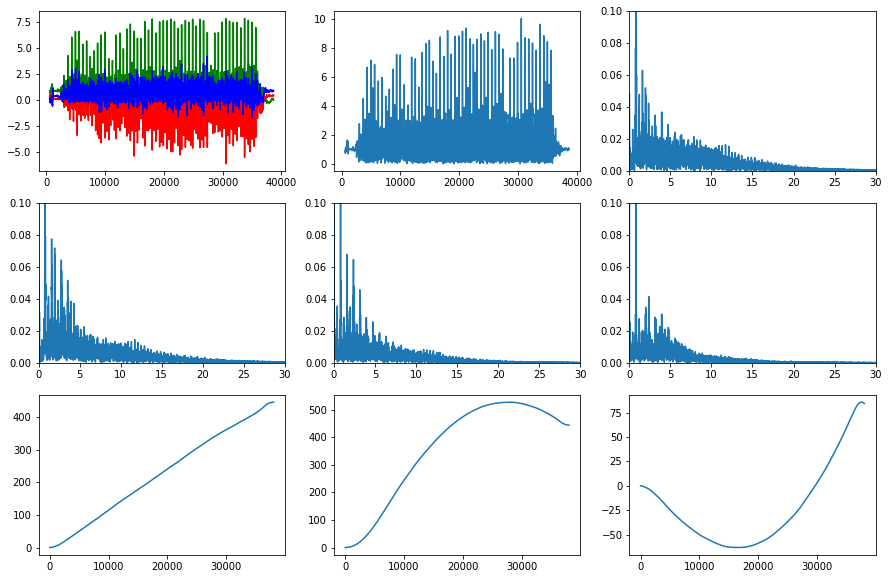

Влада Белозерова - 2021-07-0513.29.14 Белозерова бег.csv Амплитуда: 10.032331849598053
Влада Белозерова - 2021-07-0513.29.14 Белозерова бег.csv Среднее: 1.302993939654175
Влада Белозерова - 2021-07-0513.32.08 Белозерова бег.csv
Влада Белозерова - 2021-07-0513.32.08 Белозерова бег.csv
New means: -8.84456036682836e-17 1.9971587925096297e-17 1.0281269305351215


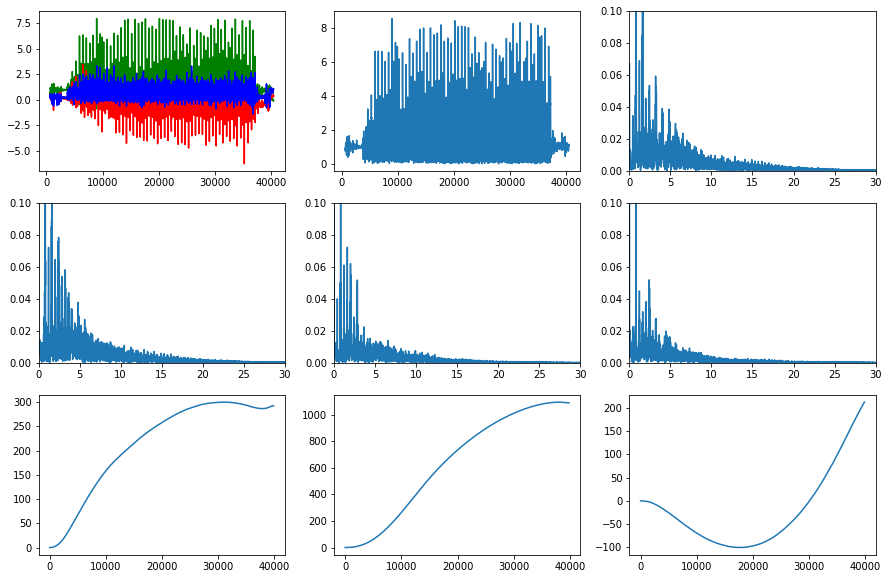

Влада Белозерова - 2021-07-0513.32.08 Белозерова бег.csv Амплитуда: 8.534033402859269
Влада Белозерова - 2021-07-0513.32.08 Белозерова бег.csv Среднее: 1.322712568563338
Влада Белозерова - 2021-07-0513.33.40 Белозерова бег.csv
Влада Белозерова - 2021-07-0513.33.40 Белозерова бег.csv
New means: 2.9261692121903353e-17 -4.3031900179269636e-17 1.0478841355269182


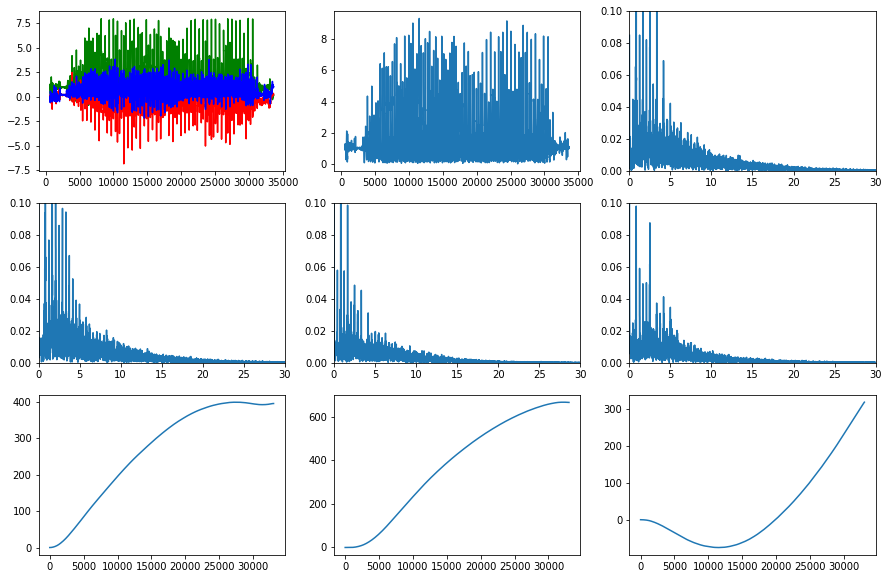

Влада Белозерова - 2021-07-0513.33.40 Белозерова бег.csv Амплитуда: 9.337798683871293
Влада Белозерова - 2021-07-0513.33.40 Белозерова бег.csv Среднее: 1.3784980792914945
Влада Белозерова - 2021-07-0513.34.51 Белозерова бег.csv
Влада Белозерова - 2021-07-0513.34.51 Белозерова бег.csv
New means: 9.841028166455495e-18 -2.2142313374524864e-17 1.0485455919272628


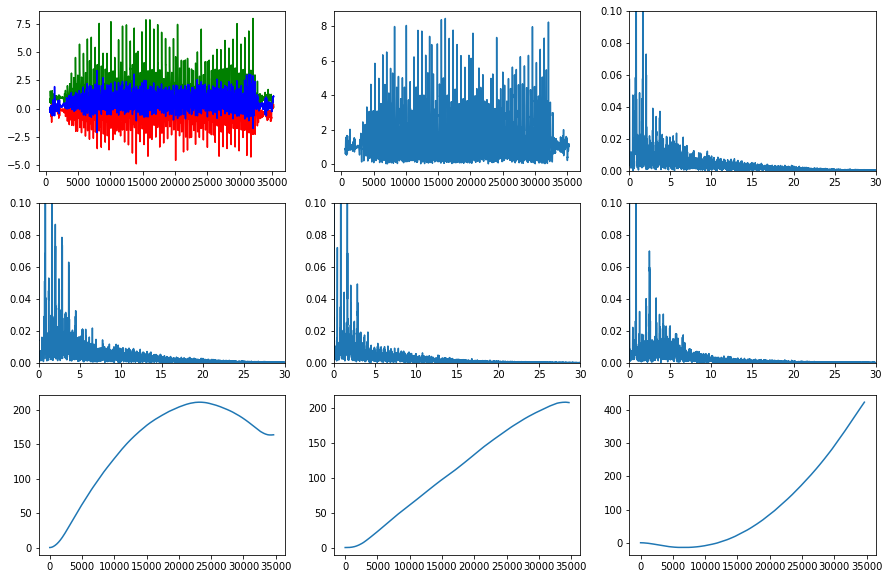

Влада Белозерова - 2021-07-0513.34.51 Белозерова бег.csv Амплитуда: 8.38992265664194
Влада Белозерова - 2021-07-0513.34.51 Белозерова бег.csv Среднее: 1.3429242927318443
Влада Белозерова - 2021-07-0517.02.16 Белозерова лестница.csv
Влада Белозерова - 2021-07-0517.02.16 Белозерова лестница.csv
New means: 1.1599006909361788e-16 0.0 0.9957086854688707


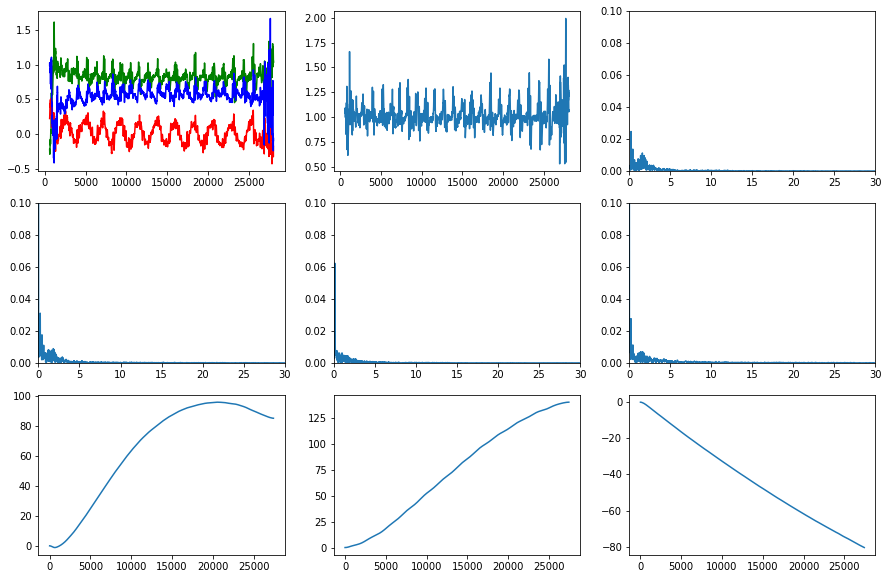

Влада Белозерова - 2021-07-0517.02.16 Белозерова лестница.csv Амплитуда: 1.462283999259364
Влада Белозерова - 2021-07-0517.02.16 Белозерова лестница.csv Среднее: 1.0167475580120604
Влада Белозерова - 2021-07-0517.04.32 Белозерова лестница.csv
Влада Белозерова - 2021-07-0517.04.32 Белозерова лестница.csv
New means: -6.01358570333859e-17 8.590836719055127e-18 0.9961677892018421


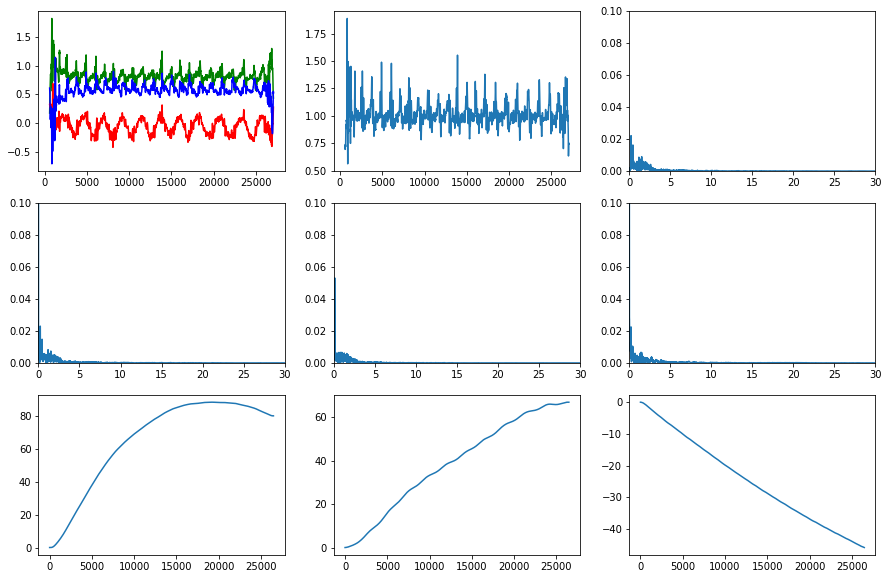

Влада Белозерова - 2021-07-0517.04.32 Белозерова лестница.csv Амплитуда: 1.3232120233170366
Влада Белозерова - 2021-07-0517.04.32 Белозерова лестница.csv Среднее: 1.014888900053157
Влада Белозерова - 2021-07-0517.07.00 Белозерова лестница.csv
Влада Белозерова - 2021-07-0517.07.00 Белозерова лестница.csv
New means: -2.7749071926896048e-17 -7.492249420261933e-18 0.9969405683939726


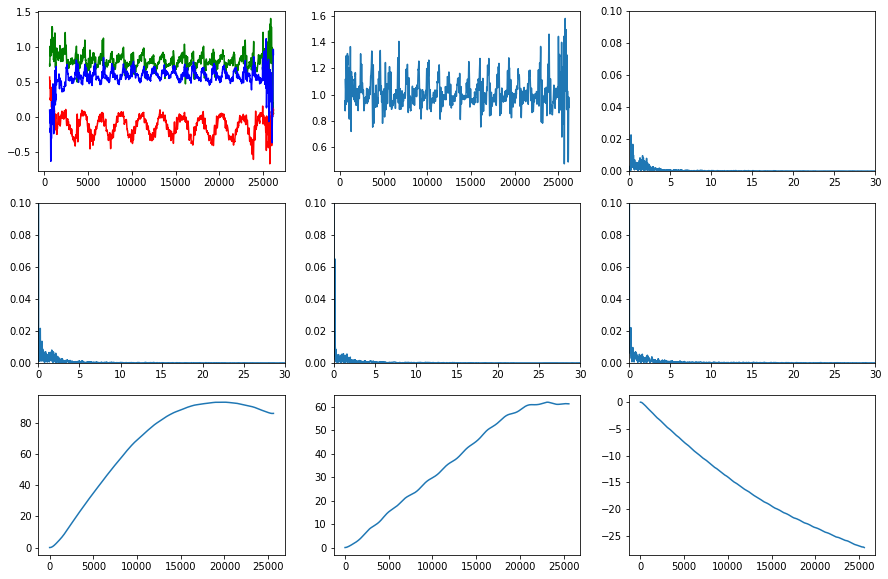

Влада Белозерова - 2021-07-0517.07.00 Белозерова лестница.csv Амплитуда: 1.110360723099947
Влада Белозерова - 2021-07-0517.07.00 Белозерова лестница.csv Среднее: 1.0159949937958235
Влада Белозерова - 2021-07-0517.08.03 Белозерова лестница.csv
Влада Белозерова - 2021-07-0517.08.03 Белозерова лестница.csv
New means: 9.231737281447425e-17 -1.5051745567577323e-17 1.0009850752036982


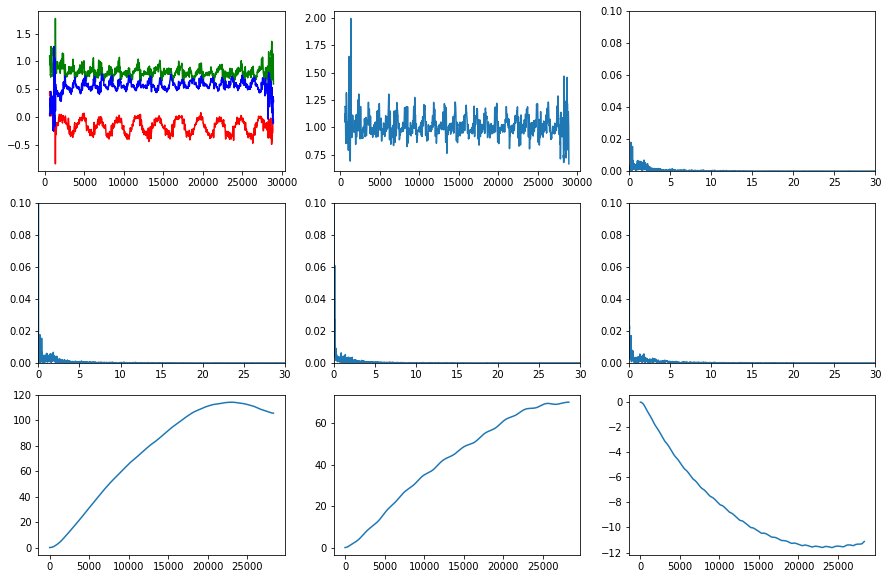

Влада Белозерова - 2021-07-0517.08.03 Белозерова лестница.csv Амплитуда: 1.3294868558839337
Влада Белозерова - 2021-07-0517.08.03 Белозерова лестница.csv Среднее: 1.0158657513544176
Дарья Шагалкина - Шагалкина_бег_1.csv
Дарья Шагалкина - Шагалкина_бег_1.csv
New means: 1.0129194499630783e-17 6.8878522597489325e-18 1.016226617063073


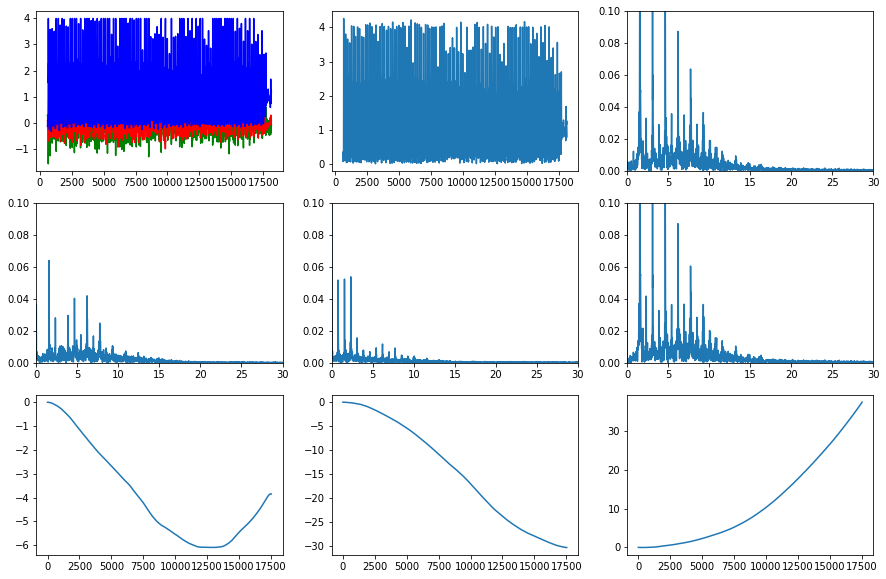

Дарья Шагалкина - Шагалкина_бег_1.csv Амплитуда: 4.26095764145463
Дарья Шагалкина - Шагалкина_бег_1.csv Среднее: 1.0950257437269226
Дарья Шагалкина - Шагалкина_бег_2.csv
Дарья Шагалкина - Шагалкина_бег_2.csv
New means: 2.0877438319330676e-18 -5.4281339630259757e-17 1.016193212485807


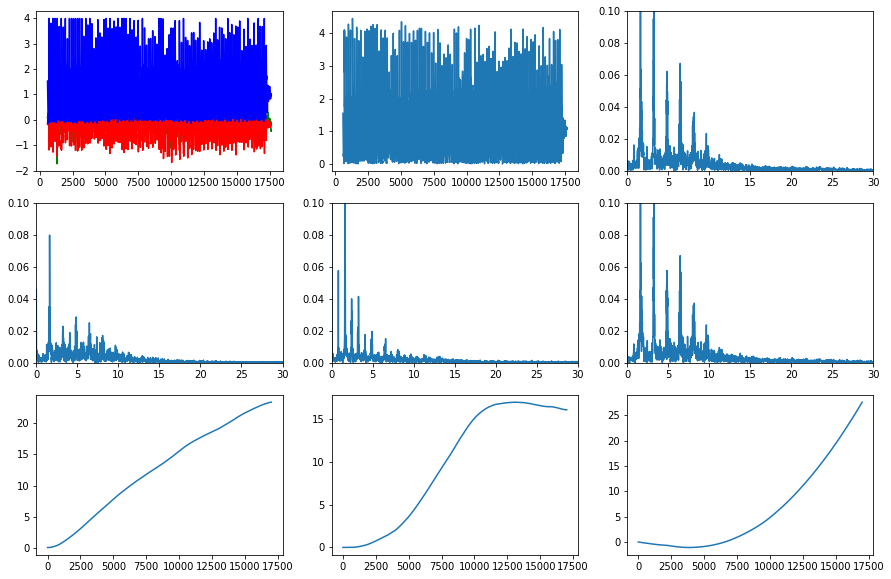

Дарья Шагалкина - Шагалкина_бег_2.csv Амплитуда: 4.446016710631592
Дарья Шагалкина - Шагалкина_бег_2.csv Среднее: 1.0813539271161798
Дарья Шагалкина - Шагалкина_бег_3.csv
Дарья Шагалкина - Шагалкина_бег_3.csv
New means: -3.176522640388748e-18 -3.630311589015712e-18 1.014482758530534


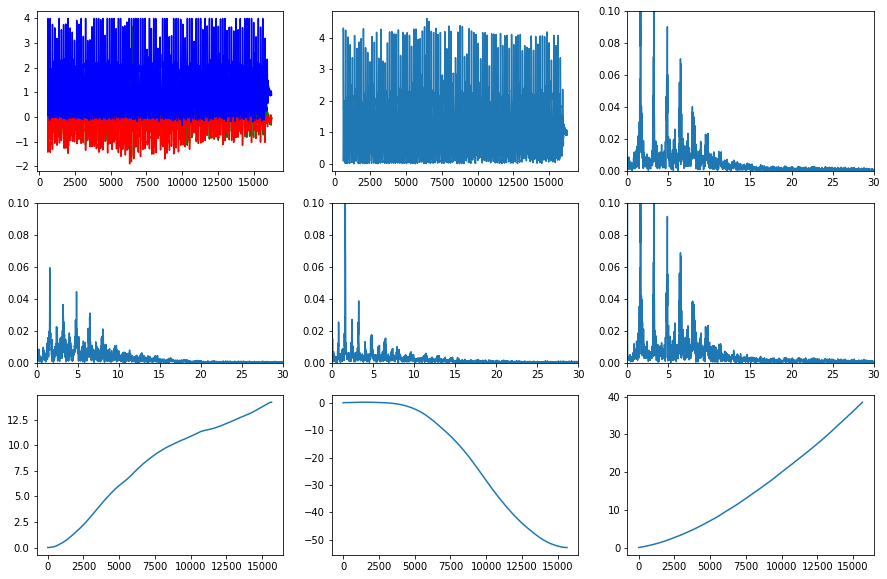

Дарья Шагалкина - Шагалкина_бег_3.csv Амплитуда: 4.607105085383815
Дарья Шагалкина - Шагалкина_бег_3.csv Среднее: 1.106775666941257
Дарья Шагалкина - Шагалкина_бег_4.csv
Дарья Шагалкина - Шагалкина_бег_4.csv
New means: 9.523485735870631e-18 1.9046971471741263e-17 1.0106475387485825


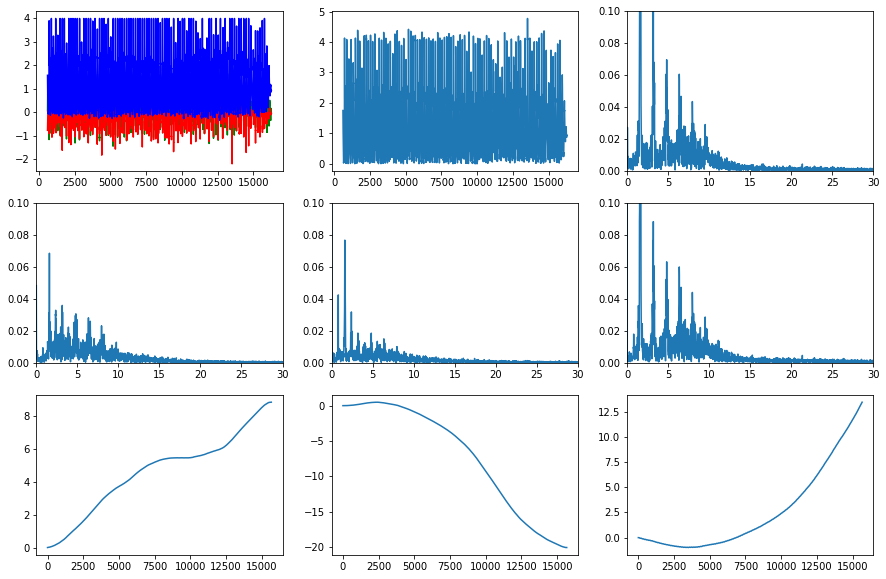

Дарья Шагалкина - Шагалкина_бег_4.csv Амплитуда: 4.77002564809945
Дарья Шагалкина - Шагалкина_бег_4.csv Среднее: 1.1391559709740648
Дарья Шагалкина - Шагалкина_лестница_1.csv
Дарья Шагалкина - Шагалкина_лестница_1.csv
New means: -1.562821345889739e-17 3.486293771600187e-17 0.9408324327636084


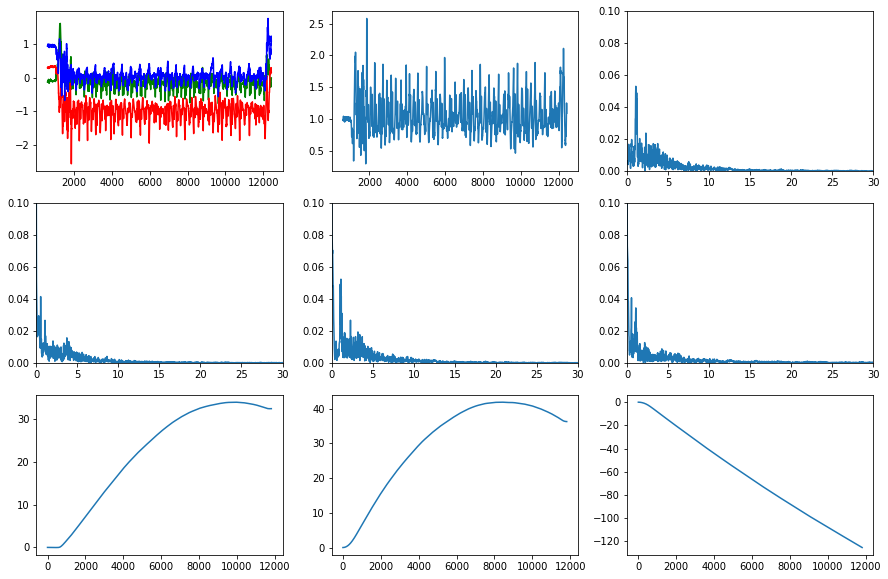

Дарья Шагалкина - Шагалкина_лестница_1.csv Амплитуда: 2.280293881983009
Дарья Шагалкина - Шагалкина_лестница_1.csv Среднее: 1.0534758332214051
Дарья Шагалкина - Шагалкина_лестница_2.csv
Дарья Шагалкина - Шагалкина_лестница_2.csv
New means: -6.694571915474186e-18 -8.416033265167549e-18 0.9765008752866168


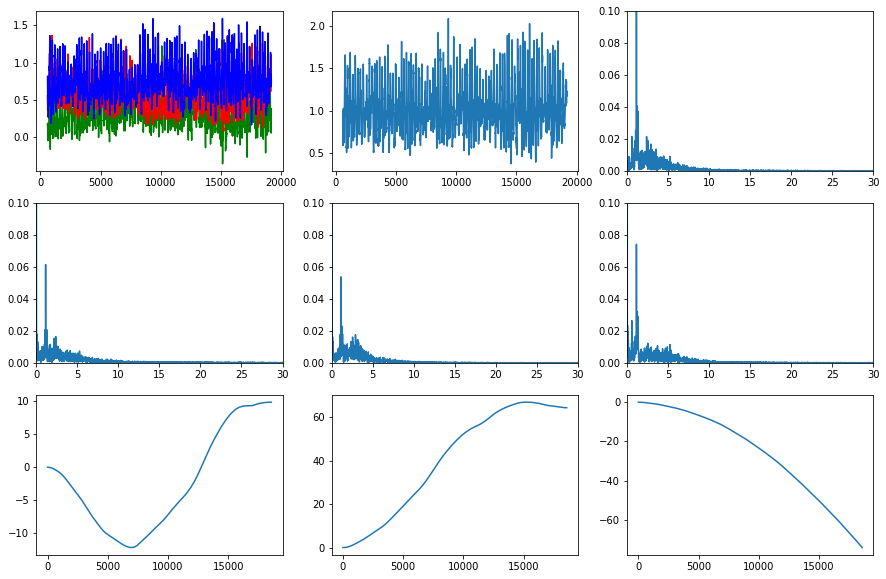

Дарья Шагалкина - Шагалкина_лестница_2.csv Амплитуда: 1.7252606610325871
Дарья Шагалкина - Шагалкина_лестница_2.csv Среднее: 1.0044586376270328
Дарья Шагалкина - Шагалкина_лестница_3.csv
Дарья Шагалкина - Шагалкина_лестница_3.csv
New means: -7.950437386802473e-17 1.3250728978004122e-17 0.9913210051914847


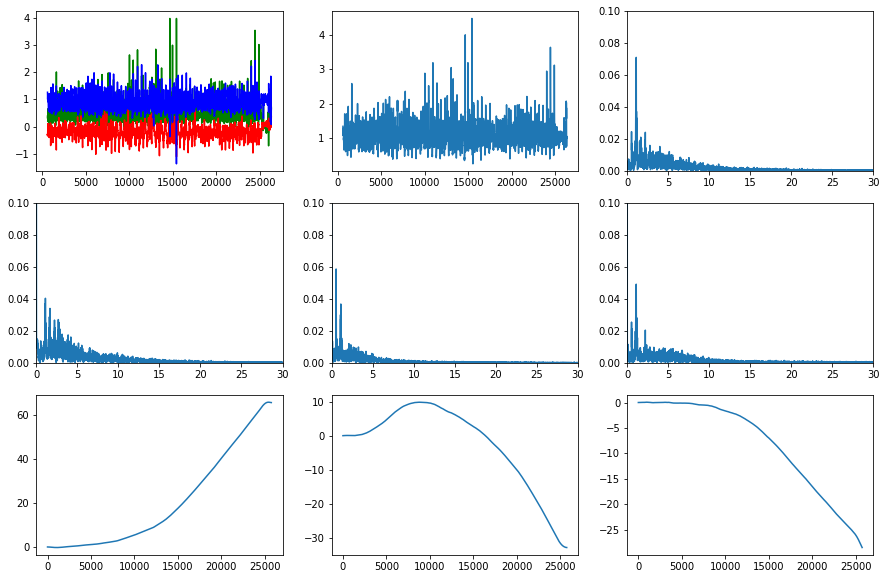

Дарья Шагалкина - Шагалкина_лестница_3.csv Амплитуда: 4.204158585124877
Дарья Шагалкина - Шагалкина_лестница_3.csv Среднее: 1.0508118047134494
Дарья Шагалкина - Шагалкина_лестница_4.csv
Дарья Шагалкина - Шагалкина_лестница_4.csv
New means: -6.359395094378724e-17 -6.1542533171407e-18 0.9906099851458543


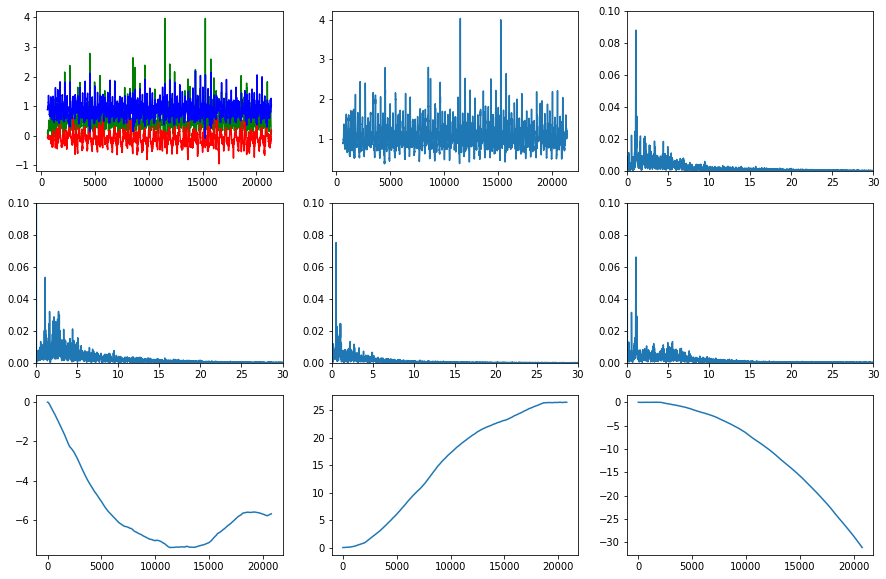

Дарья Шагалкина - Шагалкина_лестница_4.csv Амплитуда: 3.6504546920999497
Дарья Шагалкина - Шагалкина_лестница_4.csv Среднее: 1.0480234255939
Дарья Шагалкина - Шагалкина_стояние_1.csv
Дарья Шагалкина - Шагалкина_стояние_1.csv
New means: -2.63587017099085e-18 -4.0416675955193034e-17 0.9966525423627023


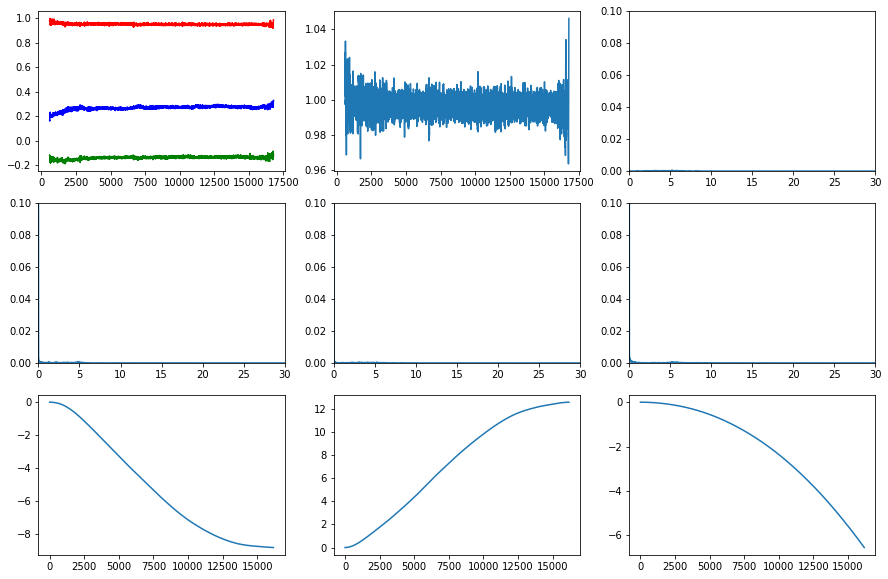

Дарья Шагалкина - Шагалкина_стояние_1.csv Амплитуда: 0.08248803829638596
Дарья Шагалкина - Шагалкина_стояние_1.csv Среднее: 0.9968423551245598
Дарья Шагалкина - Шагалкина_стояние_2.csv
Дарья Шагалкина - Шагалкина_стояние_2.csv
New means: 1.8614517778146336e-17 -4.077465799022531e-17 0.9803412540029908


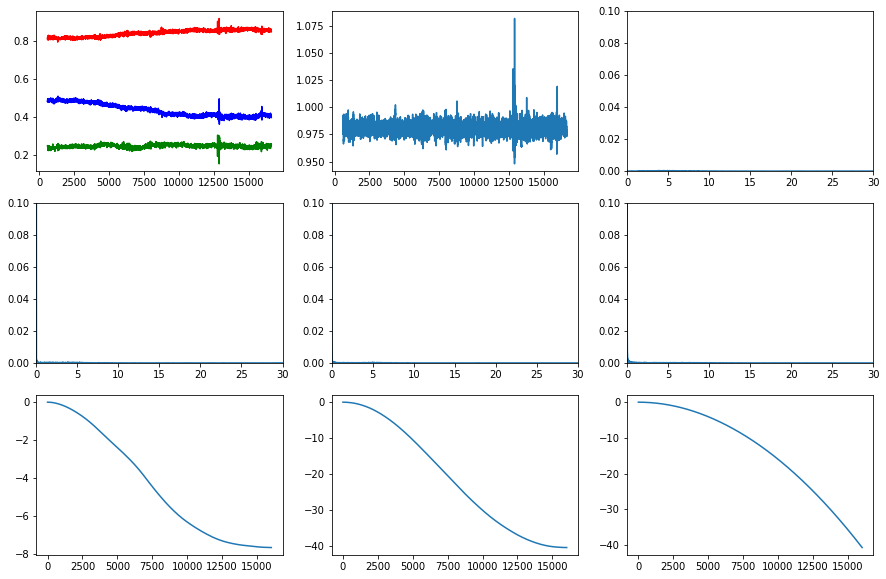

Дарья Шагалкина - Шагалкина_стояние_2.csv Амплитуда: 0.13432054278468097
Дарья Шагалкина - Шагалкина_стояние_2.csv Среднее: 0.981062329026015
Дарья Шагалкина - Шагалкина_стояние_3.csv
Дарья Шагалкина - Шагалкина_стояние_3.csv
New means: -6.7633080225525e-19 -1.1466408370542855e-16 0.9846247895292826


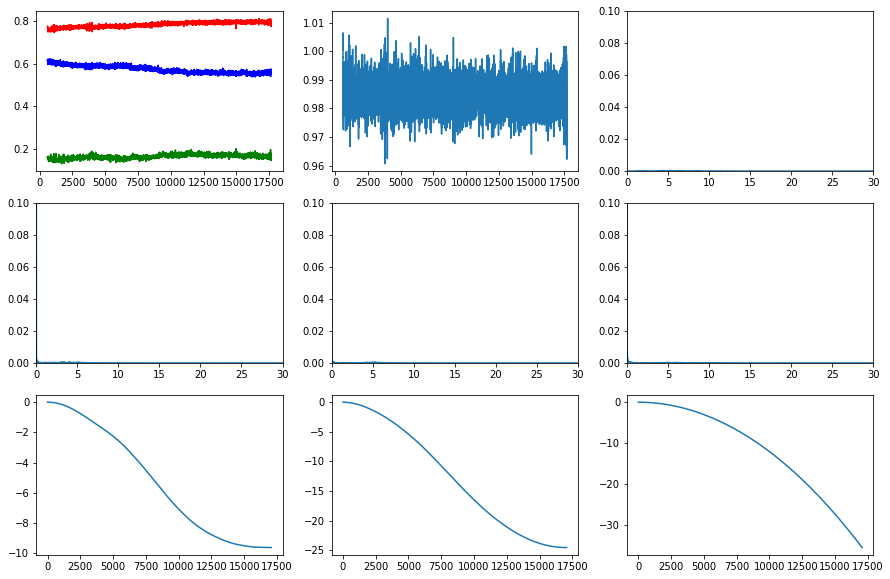

Дарья Шагалкина - Шагалкина_стояние_3.csv Амплитуда: 0.050871807491953636
Дарья Шагалкина - Шагалкина_стояние_3.csv Среднее: 0.984879406389025
Дарья Шагалкина - Шагалкина_стояние_4.csv
Дарья Шагалкина - Шагалкина_стояние_4.csv
New means: 2.1393696917394064e-17 2.2596765448201067e-17 0.9712579551611125


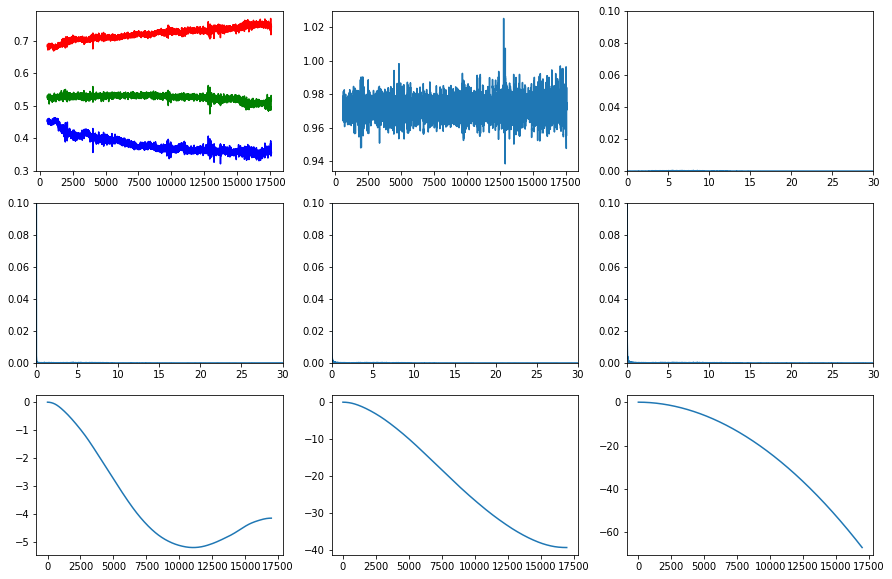

Дарья Шагалкина - Шагалкина_стояние_4.csv Амплитуда: 0.08673568889876138
Дарья Шагалкина - Шагалкина_стояние_4.csv Среднее: 0.9718172001400422
Дарья Шагалкина - Шагалкина_ходьба_1.csv
Дарья Шагалкина - Шагалкина_ходьба_1.csv
New means: -1.4667755292565416e-18 -5.573747011174859e-17 0.9841564804966865


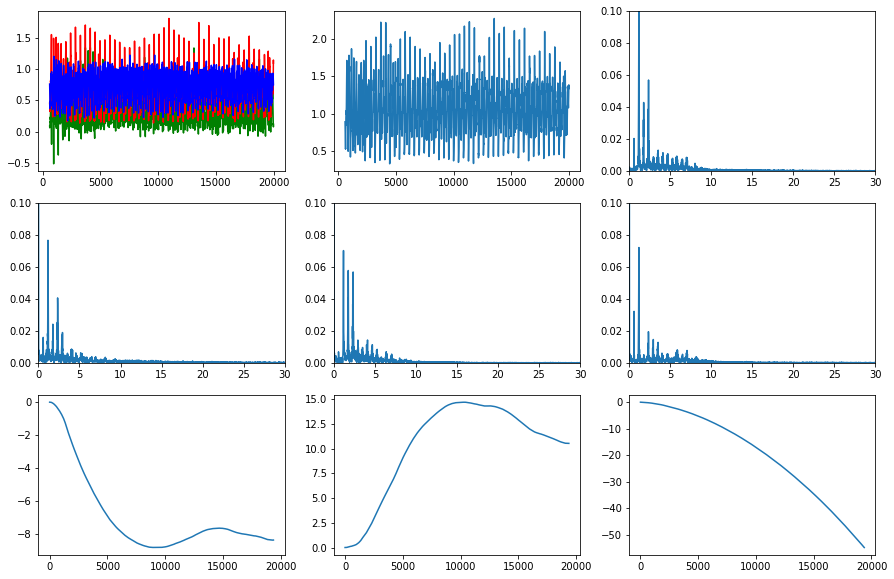

Дарья Шагалкина - Шагалкина_ходьба_1.csv Амплитуда: 1.9386702892094032
Дарья Шагалкина - Шагалкина_ходьба_1.csv Среднее: 1.0185543147811171
Дарья Шагалкина - Шагалкина_ходьба_2.csv
Дарья Шагалкина - Шагалкина_ходьба_2.csv
New means: 4.91036257436005e-17 1.293946894594878e-16 0.9830045729985697


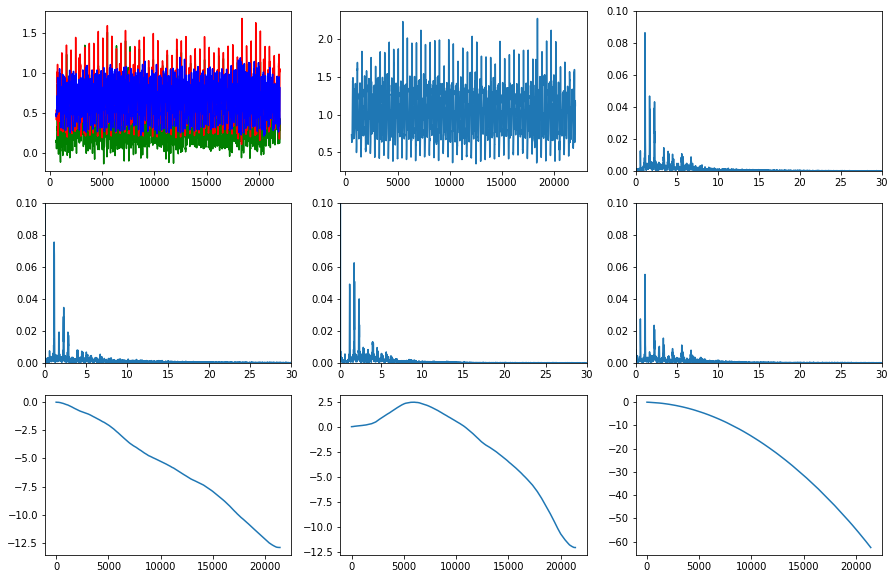

Дарья Шагалкина - Шагалкина_ходьба_2.csv Амплитуда: 1.9259107392421553
Дарья Шагалкина - Шагалкина_ходьба_2.csv Среднее: 1.014770645296662
Дарья Шагалкина - Шагалкина_ходьба_3.csv
Дарья Шагалкина - Шагалкина_ходьба_3.csv
New means: 1.5930729875951156e-17 -7.595257072170652e-17 0.9875930746897864


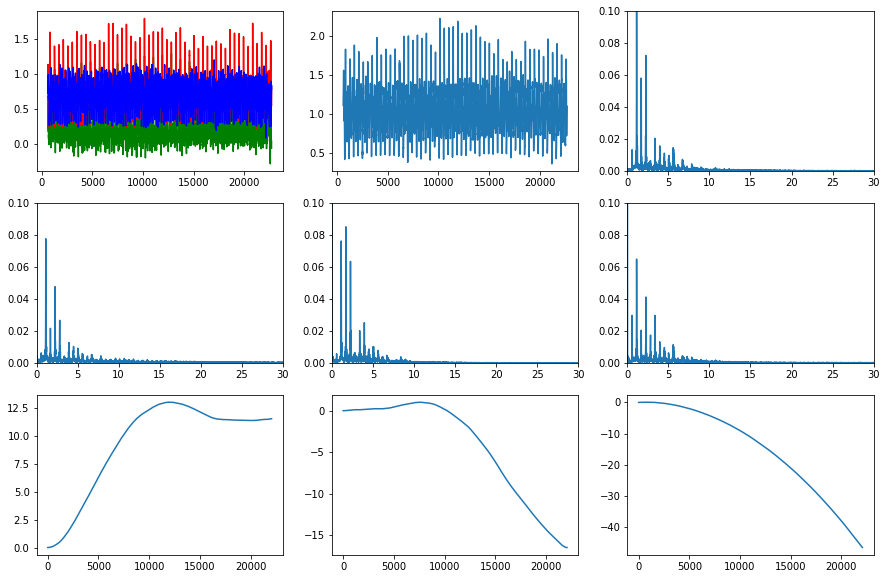

Дарья Шагалкина - Шагалкина_ходьба_3.csv Амплитуда: 1.8637075733336412
Дарья Шагалкина - Шагалкина_ходьба_3.csv Среднее: 1.0171583498603536
Дарья Шагалкина - Шагалкина_ходьба_4.csv
Дарья Шагалкина - Шагалкина_ходьба_4.csv
New means: 3.3933299971176996e-17 8.500463023082723e-17 0.9805251085257044


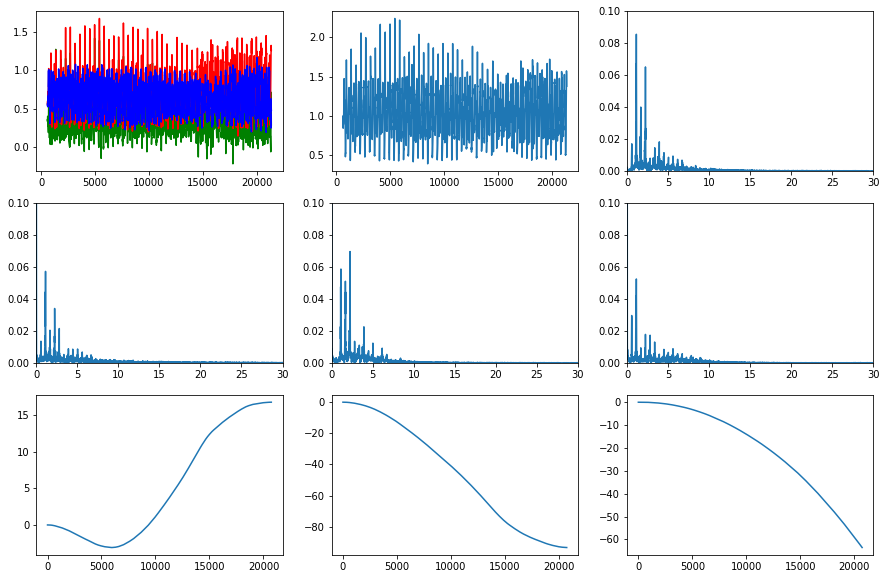

Дарья Шагалкина - Шагалкина_ходьба_4.csv Амплитуда: 1.855236231104529
Дарья Шагалкина - Шагалкина_ходьба_4.csv Среднее: 1.0121153684387014
Денис Осташов - Осташов_бег_1
Денис Осташов - Осташов_бег_1
New means: -5.615186432127234e-17 4.4330419201004484e-17 1.5048989807517448


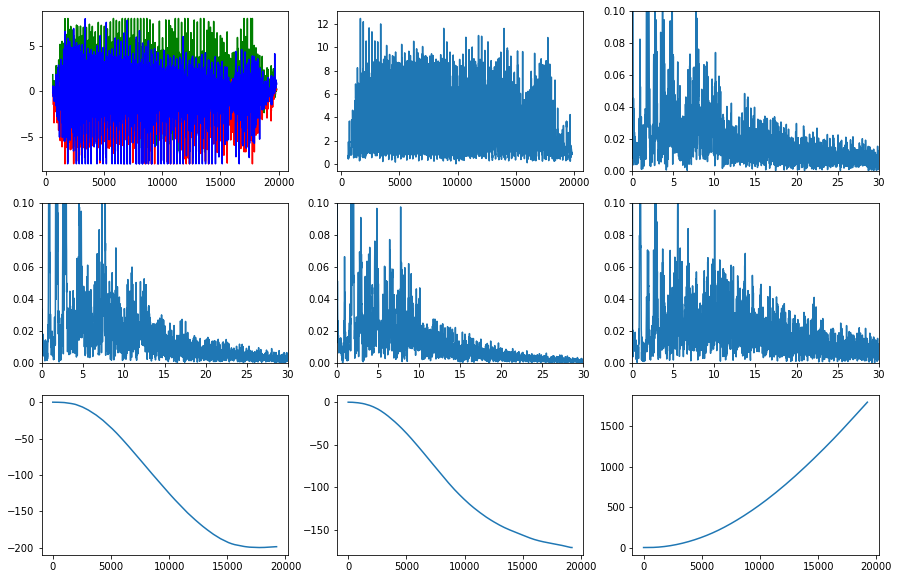

Денис Осташов - Осташов_бег_1 Амплитуда: 12.459103326762934
Денис Осташов - Осташов_бег_1 Среднее: 2.947906984462938
Денис Осташов - Осташов_бег_2
Денис Осташов - Осташов_бег_2
New means: 2.2802354253946955e-17 1.1401177126973478e-17 1.2838969979018793


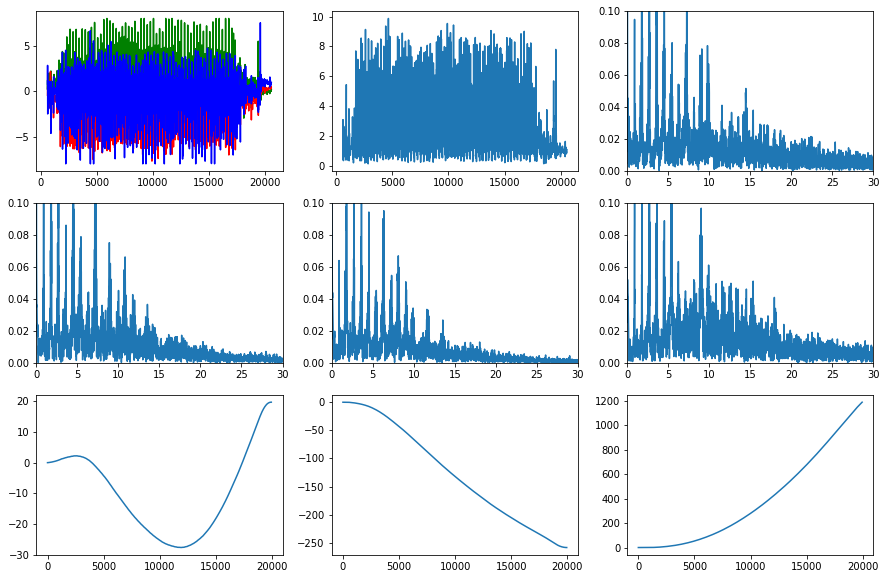

Денис Осташов - Осташов_бег_2 Амплитуда: 9.758101960315168
Денис Осташов - Осташов_бег_2 Среднее: 2.4899724771113916
Денис Осташов - Осташов_бег_3
Денис Осташов - Осташов_бег_3
New means: -1.4205527642336128e-17 -7.457902012226466e-17 1.350898306096241


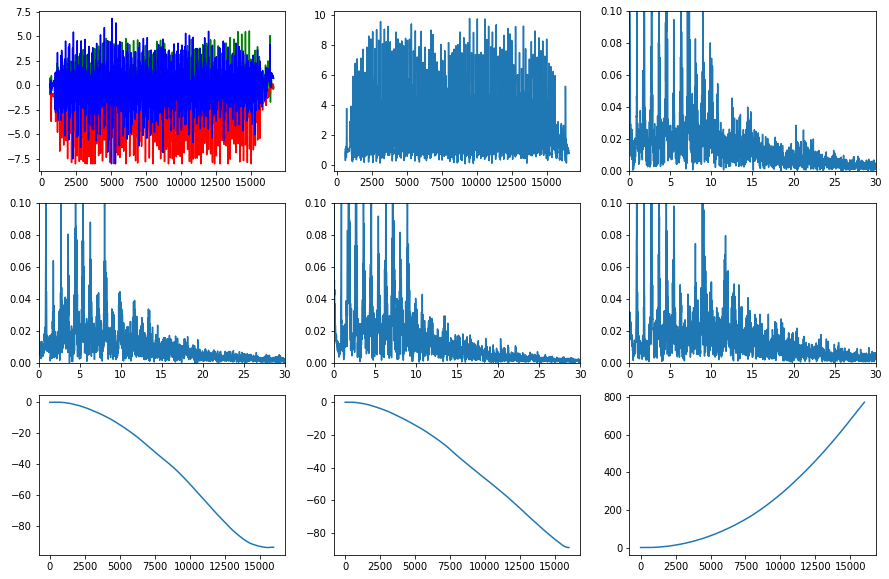

Денис Осташов - Осташов_бег_3 Амплитуда: 9.721117683944023
Денис Осташов - Осташов_бег_3 Среднее: 2.5332289057436403
Денис Осташов - Осташов_бег_4
Денис Осташов - Осташов_бег_4
New means: 4.585731612604081e-17 -8.843910967165013e-17 1.2811407546704603


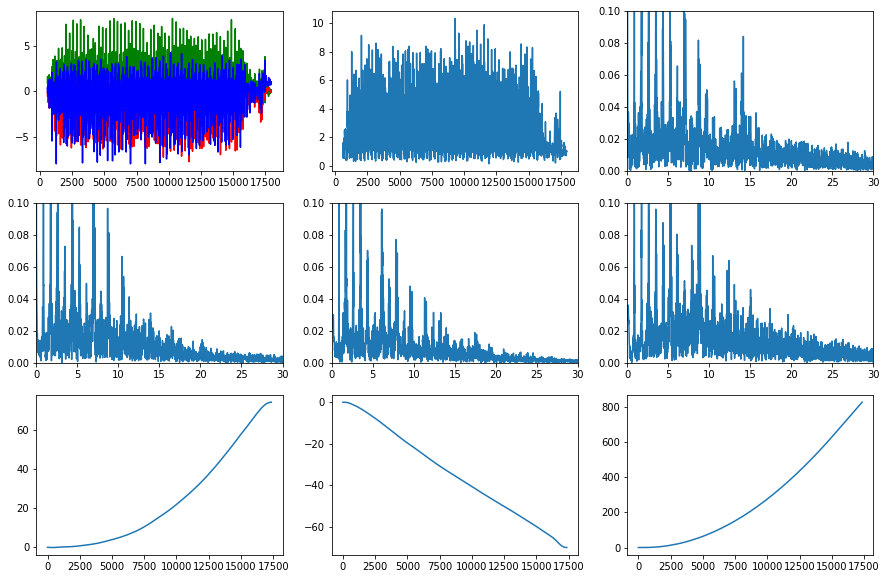

Денис Осташов - Осташов_бег_4 Амплитуда: 10.206174558422564
Денис Осташов - Осташов_бег_4 Среднее: 2.4185795583419845
Денис Осташов - Осташов_велосипед_1
Денис Осташов - Осташов_велосипед_1
New means: -1.1667596482034683e-16 5.41709836665896e-17 0.9423529235167006


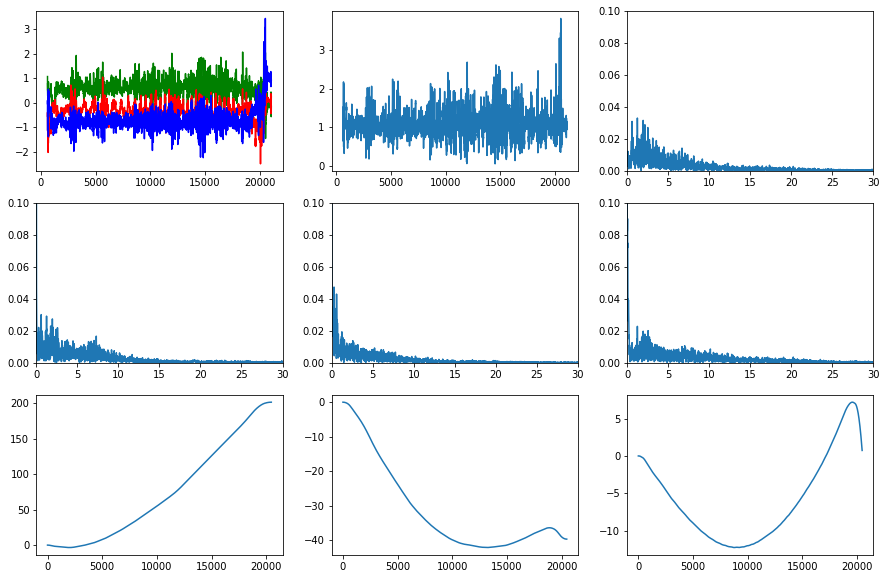

Денис Осташов - Осташов_велосипед_1 Амплитуда: 3.7468386600215515
Денис Осташов - Осташов_велосипед_1 Среднее: 1.0875635897260933
Денис Осташов - Осташов_велосипед_2
Денис Осташов - Осташов_велосипед_2
New means: 3.8712884581708067e-17 -1.693688700449728e-17 0.9650600277801914


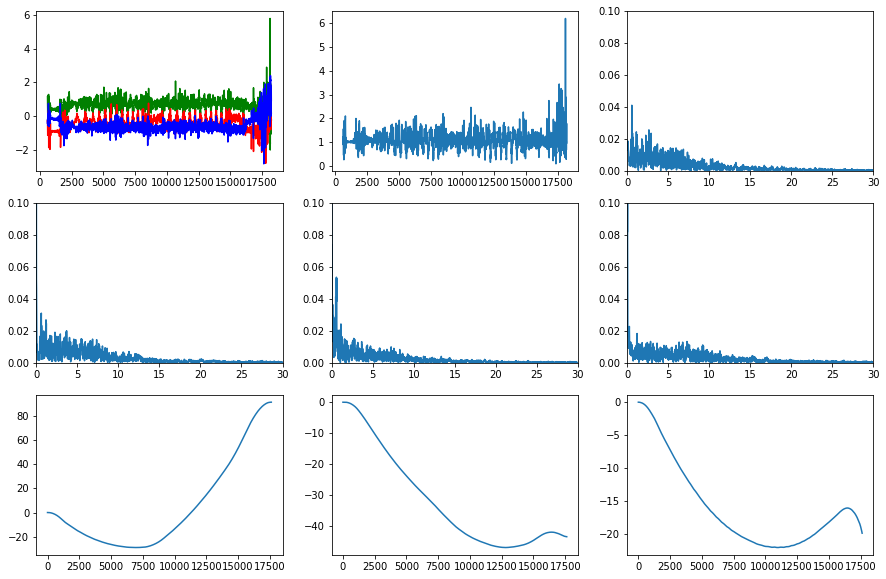

Денис Осташов - Осташов_велосипед_2 Амплитуда: 6.115989960276224
Денис Осташов - Осташов_велосипед_2 Среднее: 1.1011532897438654
Денис Осташов - Осташов_велосипед_3
Денис Осташов - Осташов_велосипед_3
New means: -2.948819930527824e-17 -3.931759907370432e-17 0.857231722571207


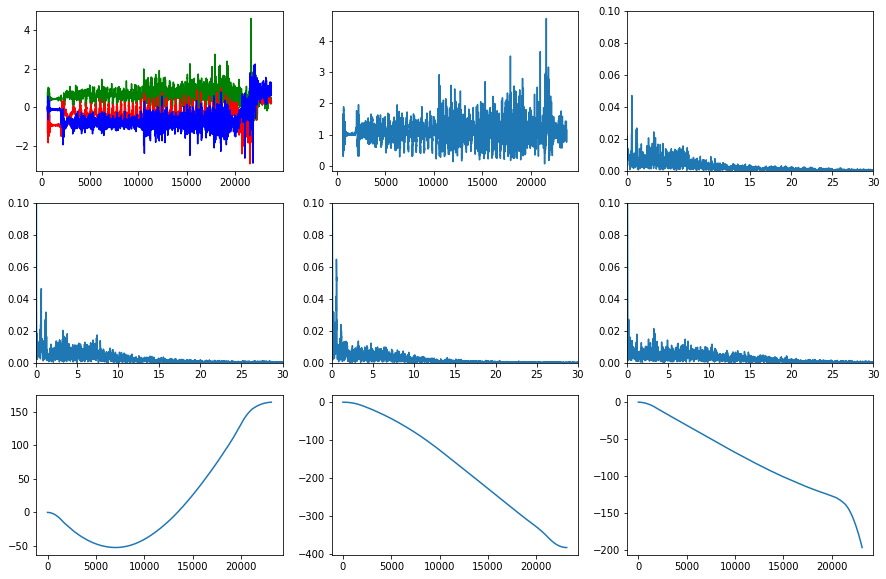

Денис Осташов - Осташов_велосипед_3 Амплитуда: 4.644639698243827
Денис Осташов - Осташов_велосипед_3 Среднее: 1.1026457449417202
Денис Осташов - Осташов_велосипед_4
Денис Осташов - Осташов_велосипед_4
New means: -5.3121932376021195e-17 5.902436930669022e-18 0.8775428904474348


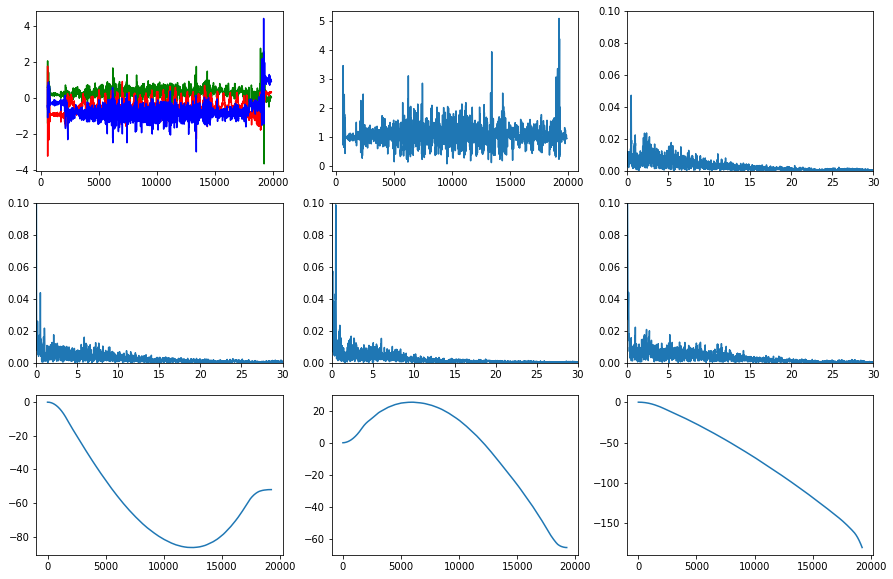

Денис Осташов - Осташов_велосипед_4 Амплитуда: 5.01790999329792
Денис Осташов - Осташов_велосипед_4 Среднее: 1.0665495884496232
Денис Осташов - Осташов_стояние_1
Денис Осташов - Осташов_стояние_1
New means: 1.147826292219213e-18 1.2243480450338273e-17 0.9637146441302726


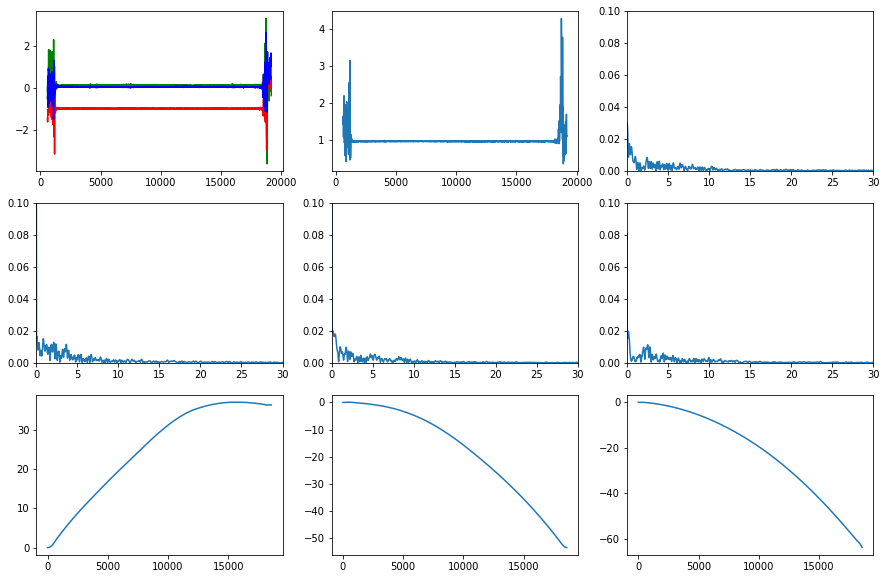

Денис Осташов - Осташов_стояние_1 Амплитуда: 3.898078471252785
Денис Осташов - Осташов_стояние_1 Среднее: 1.009675192808998
Денис Осташов - Осташов_стояние_2
Денис Осташов - Осташов_стояние_2
New means: 4.23599868389899e-17 -1.197130062841019e-16 1.0053941322023037


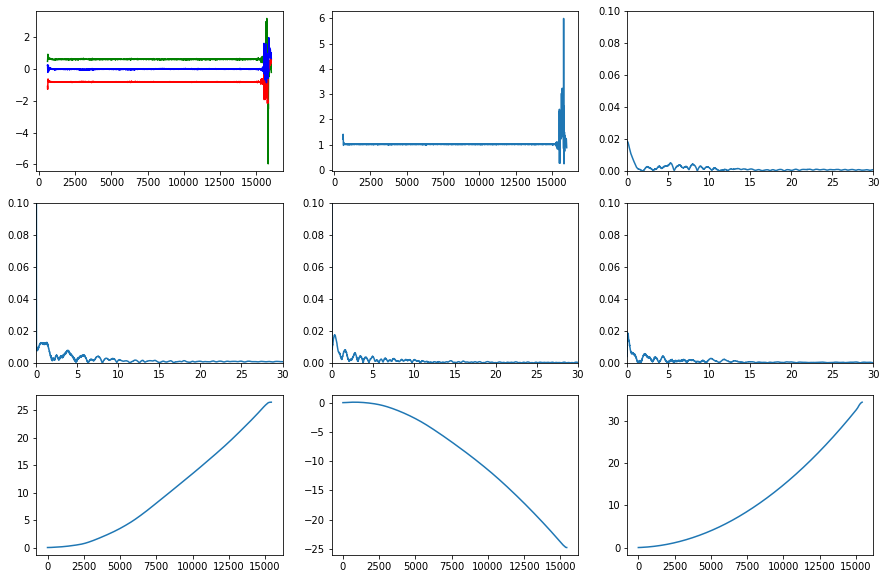

Денис Осташов - Осташов_стояние_2 Амплитуда: 5.753608781508856
Денис Осташов - Осташов_стояние_2 Среднее: 1.0360885376711522
Денис Осташов - Осташов_стояние_3
Денис Осташов - Осташов_стояние_3
New means: nan nan nan


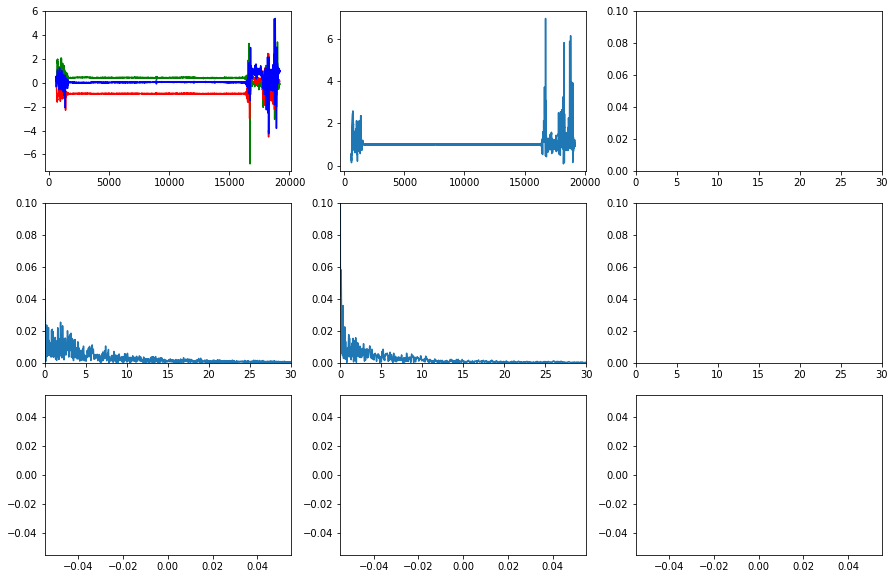

Денис Осташов - Осташов_стояние_3 Амплитуда: 6.900679901945982
Денис Осташов - Осташов_стояние_3 Среднее: 1.0681078065896181
Денис Осташов - Осташов_стояние_4
Денис Осташов - Осташов_стояние_4
New means: 4.5283457763055264e-18 5.615148762618853e-17 0.968892328760582


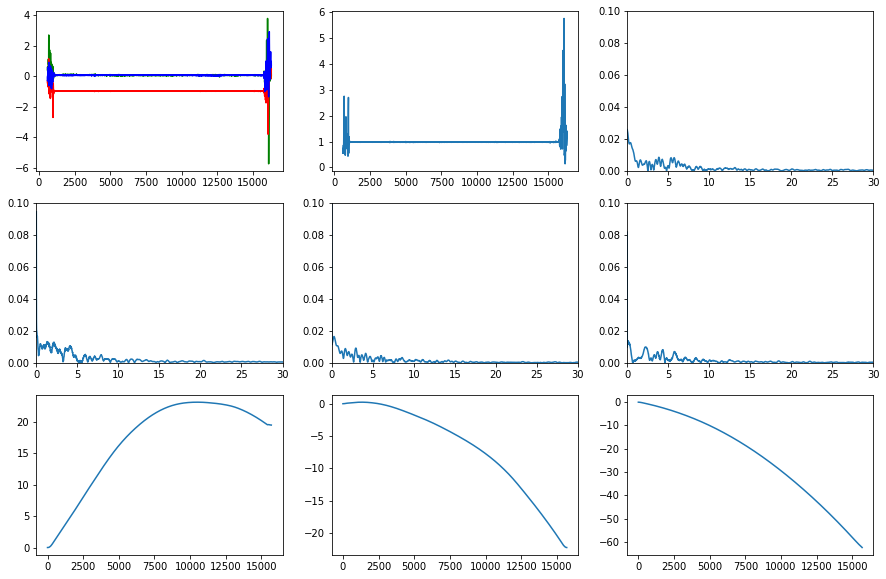

Денис Осташов - Осташов_стояние_4 Амплитуда: 5.621043056398093
Денис Осташов - Осташов_стояние_4 Среднее: 1.0033637381406648
Денис Осташов - Осташов_ходьба_1
Денис Осташов - Осташов_ходьба_1
New means: -6.486095337524844e-17 2.783615915687746e-16 1.0397823828263264


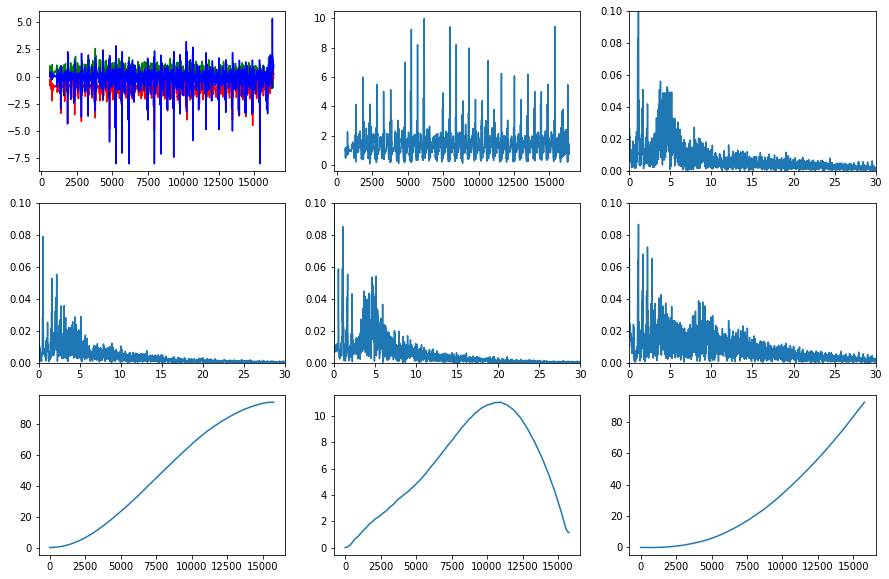

Денис Осташов - Осташов_ходьба_1 Амплитуда: 9.885328985596342
Денис Осташов - Осташов_ходьба_1 Среднее: 1.2917347593361739
Денис Осташов - Осташов_ходьба_2
Денис Осташов - Осташов_ходьба_2
New means: 1.8921122652426174e-16 -6.549619379685983e-17 1.066138751545284


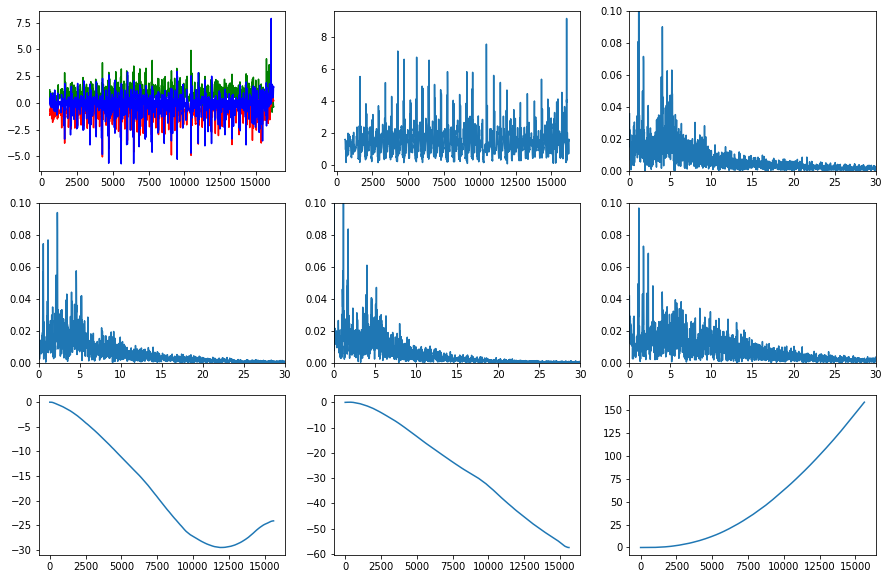

Денис Осташов - Осташов_ходьба_2 Амплитуда: 9.081448757212835
Денис Осташов - Осташов_ходьба_2 Среднее: 1.374689401426309
Денис Осташов - Осташов_ходьба_3
Денис Осташов - Осташов_ходьба_3
New means: 5.702750765745664e-17 1.1205405013394991e-16 0.9908824795626221


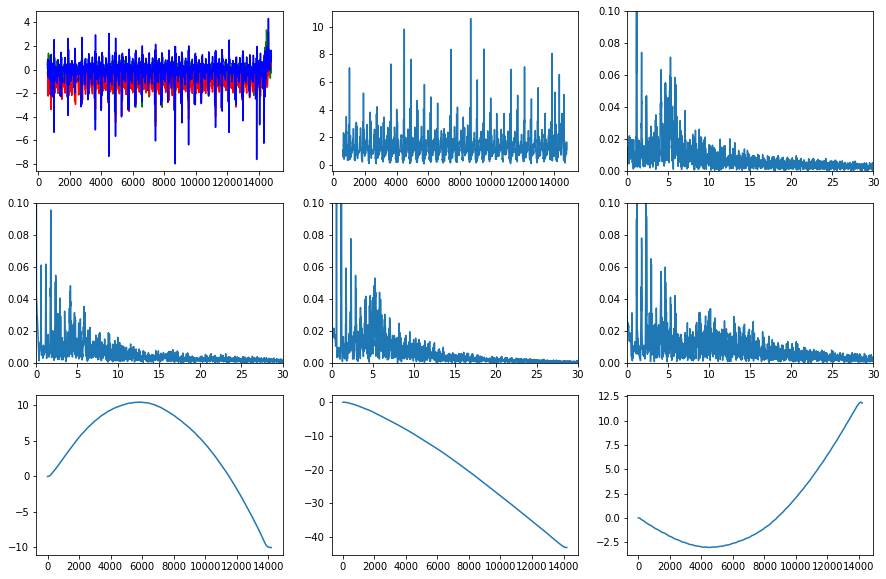

Денис Осташов - Осташов_ходьба_3 Амплитуда: 10.50220475754128
Денис Осташов - Осташов_ходьба_3 Среднее: 1.3249835526788118
Денис Осташов - Осташов_ходьба_4
Денис Осташов - Осташов_ходьба_4
New means: 7.335770552964074e-17 6.259857538529343e-17 0.9795884877866239


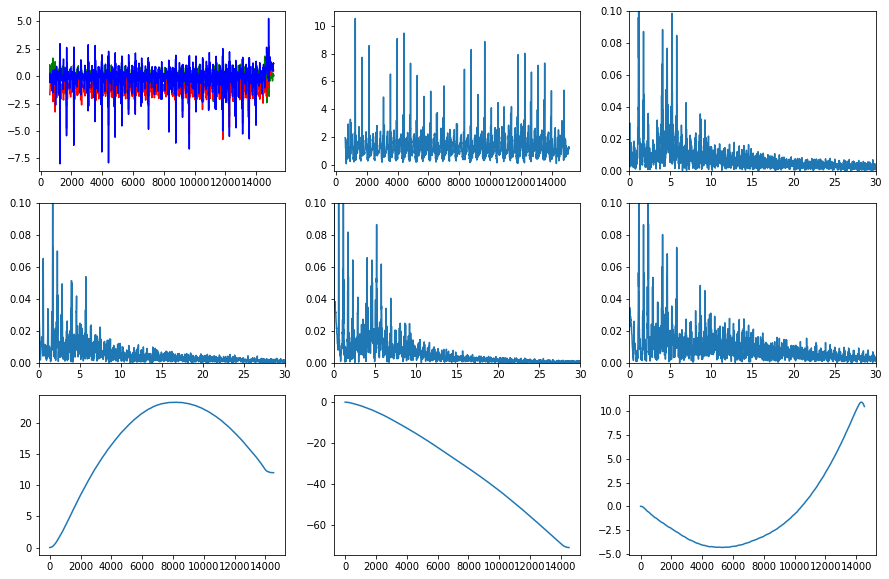

Денис Осташов - Осташов_ходьба_4 Амплитуда: 10.40816635829024
Денис Осташов - Осташов_ходьба_4 Среднее: 1.3182791476872604
Денис Селянин - Селянин_бег_1
Денис Селянин - Селянин_бег_1
New means: 7.724986914150002e-17 3.5893878591000007e-17 1.0202579760268382


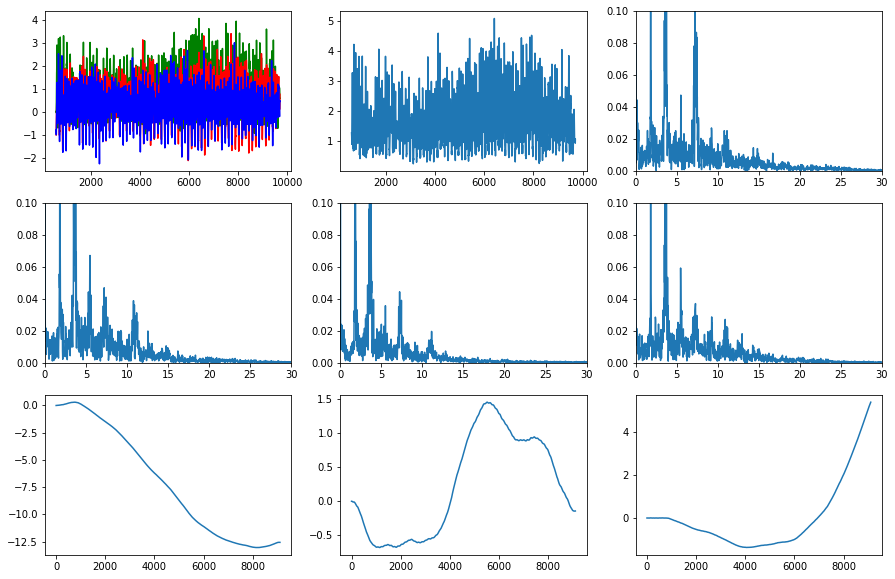

Денис Селянин - Селянин_бег_1 Амплитуда: 4.820829324214449
Денис Селянин - Селянин_бег_1 Среднее: 1.5901547050603335
Денис Селянин - Селянин_лестница_1
Денис Селянин - Селянин_лестница_1
New means: -4.167406074839297e-17 -1.1113082866238126e-16 0.9904406255024091


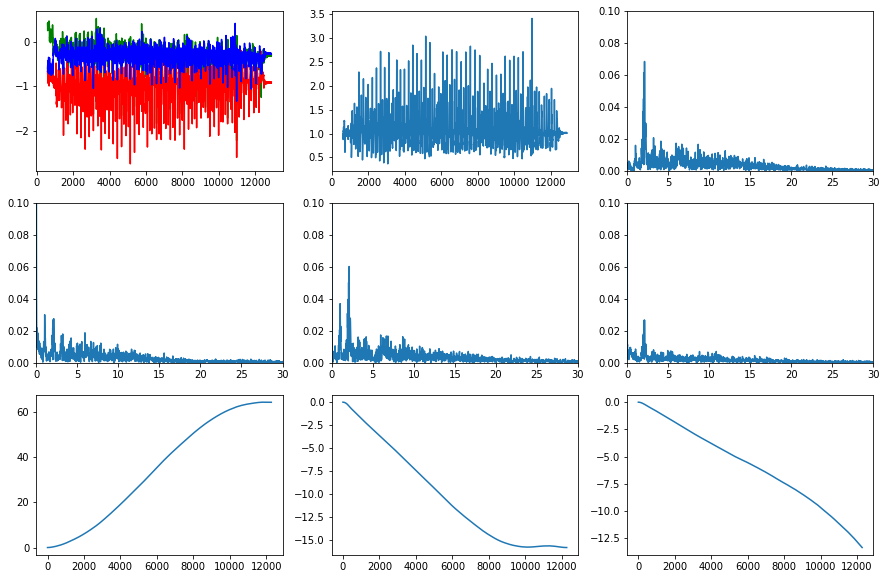

Денис Селянин - Селянин_лестница_1 Амплитуда: 3.0456884258304093
Денис Селянин - Селянин_лестница_1 Среднее: 1.0319270428694896
Денис Селянин - Селянин_стояние_1
Денис Селянин - Селянин_стояние_1
New means: 1.3336965901825262e-17 -7.367085926722526e-17 0.9813109137773329


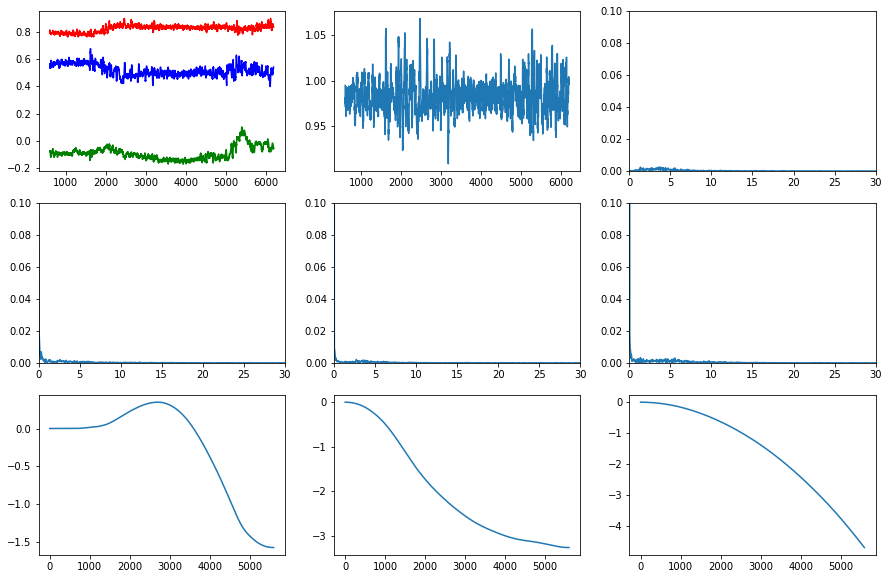

Денис Селянин - Селянин_стояние_1 Амплитуда: 0.15938193133148326
Денис Селянин - Селянин_стояние_1 Среднее: 0.9834869841119027
Денис Селянин - Селянин_ходьба_1
Денис Селянин - Селянин_ходьба_1
New means: 1.1360421647327183e-17 8.26212483441977e-18 0.958456466626065


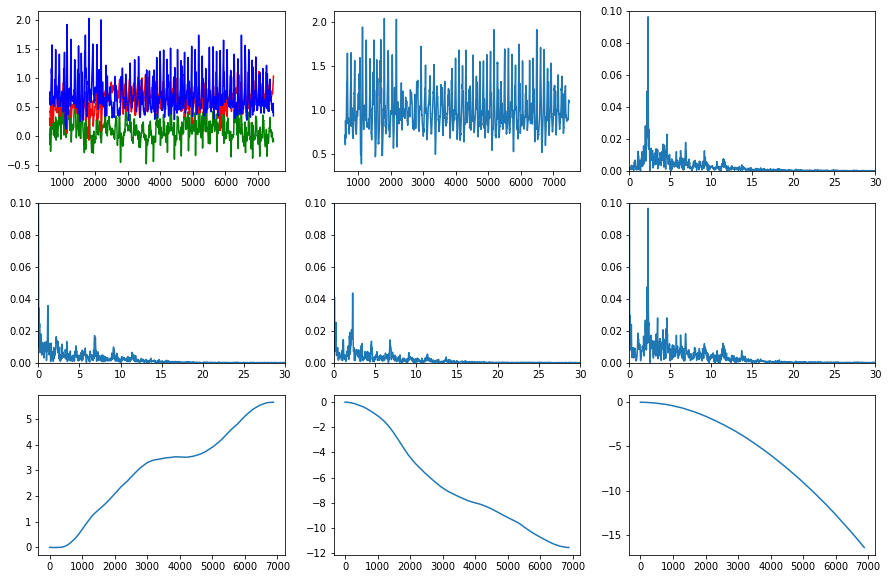

Денис Селянин - Селянин_ходьба_1 Амплитуда: 1.6445093431268674
Денис Селянин - Селянин_ходьба_1 Среднее: 1.0008293070526868
Евгений Измоденов - Измоденов ходьба 1.csv
Евгений Измоденов - Измоденов ходьба 1.csv


KeyError: 'gFx'

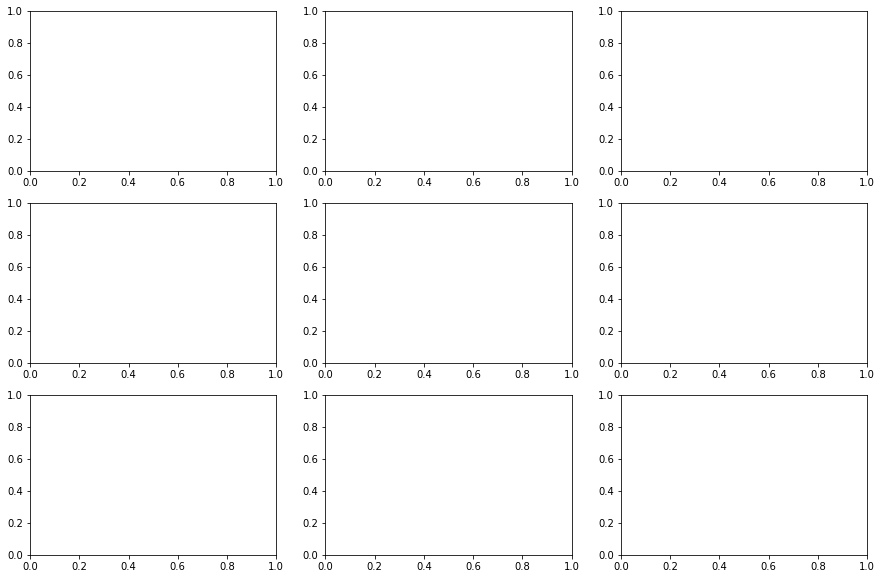

In [234]:
import pandas as pd
from matplotlib import pylab as plt
%pylab inline

def process_data(df,Ampl,place_max_freq,z_len,Means,max_freq, comma=True, cut=True, name = "", a=-1, b=-1):
    
    print(name)
    
    if a == -1:
        st = 600
    else:
        st = a
            
    if b == -1:
        end = -600
    else:
        end = b
        
    if cut == False:
        st = 0
        end = -1

    print(name)
    fig, ((ax1, ax2, ax3),(ax4, ax5, ax6),(ax7, ax8, ax9)) = plt.subplots(nrows=3, ncols=3, figsize=(15,10))
    
    if comma is True:
        df = df.applymap(lambda x: str(x).replace(',','.'))
        df['gFx'] = df['gFx'].astype(float)
        df['gFy'] = df['gFy'].astype(float)
        df['gFz'] = df['gFz'].astype(float)
    if cut:
        ax1.plot(df.iloc[st:end]['gFx'],c='g')
        ax1.plot(df.iloc[st:end]['gFy'],c='r')
        ax1.plot(df.iloc[st:end]['gFz'],c='b')
    else:
        ax1.plot(df['gFx'],c='g')
        ax1.plot(df['gFy'],c='r')
        ax1.plot(df['gFz'],c='b')
#        show()
########################################################################        
#integration

#вычисляем средний вектор ускорения по треку

    mx = df.iloc[st:end]['gFx'].values.mean() 
    my = df.iloc[st:end]['gFy'].values.mean() 
    mz = df.iloc[st:end]['gFz'].values.mean() 
    
#находим матрицу поворота этого вектора к вектору (0,0,1)

    Vec = [mx,my,mz]
    Point = [0, 0, 1]
    mat = rotation_matrix_from_vectors(Vec, Point)
    
#каждую точку трека поворачиваем на эту матрицу

    new_x, new_y, new_z = rotate(df.iloc[st:end]['gFx'].values, df.iloc[st:end]['gFy'].values, df.iloc[st:end]['gFz'].values, mat)

#проверяем, что новые средние равны примерно (0,0,1). Если это не так, значит, телефон часто поворачивался при движении, и нам не поможет это преобразование

    print('New means:', mean(new_x), mean(new_y), mean(new_z))

#делим на 250*250 (это нужно было еще при интегрировании)
    new_x = [elem / 62500 for elem in new_x]
    new_y = [elem / 62500 for elem in new_y]
#из ускорения по z вычитаем 1 (g), чтобы убрать влияние силы тяжести и оставить только ускорение по z
    new_z = [(elem-1)/62500 for elem in new_z]
    
#дважды интегрируем ускорение, чтобы получить перемещение вдоль каждой оси
    int_x = integrate(integrate(new_x))
    ax7.plot(int_x)
    
    int_y = integrate(integrate(new_y))
    ax8.plot(int_y)
    
    int_z = integrate(integrate(new_z))
    ax9.plot(int_z)
    if max(max(int_z),abs(min(int_z))) > max(max(int_x),abs(min(int_x))) and max(max(int_z),abs(min(int_z))) > max(max(int_y),abs(min(int_y))):
        z_len.append(1)
    else:
        z_len.append(0)
########################################################################        
#преобразование Фурье
########################################################################        

    Fs = 250 #частота сбора данных
    y = df.iloc[st:end]['gFx'].values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
    
    Min = 0
    
    ax4.plot(frq,yabs) # plotting the spectrum
    ax4.set_xlim([0,30]) #очень большие частоты нам не нужны
    ax4.set_ylim([Min,0.1]) #не смотрим на близкие к нулю величины частот
    
    y = df.iloc[st:end]['gFy'].values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
    
    ax5.plot(frq,yabs) # plotting the spectrum
    ax5.set_xlim([0,30])
    ax5.set_ylim([Min,0.1])


    y = df.iloc[st:end]['gFz'].values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
   
    ax6.plot(frq,yabs) # plotting the spectrum
    ax6.set_xlim([0,30])
    ax6.set_ylim([Min,0.1])


    Acc = (df.gFx[st:end] ** 2 + df.gFy[st:end] ** 2 + df.gFz[st:end] ** 2) ** 0.5

    y = Acc.values
    n = len(y) # length of the signal
    k = np.arange(n)
    T = n/Fs
    frq = k/T # two sides frequency range
    frq = frq[:len(frq)//2] # one side frequency range

    Y = np.fft.fft(y)/n # dft and normalization
    Y = Y[:n//2]
    
    yabs = abs(Y)
    yabs = np.delete(yabs, np.where(frq == 0.0), 0)
    frq = np.delete(frq, np.where(frq == 0.0), 0)
    place_max_freq.append(frq[numpy.argmax(yabs)])
    max_freq.append(max(yabs))
    ax3.plot(frq,yabs) # plotting the spectrum
    ax3.set_xlim([0,30])
    ax3.set_ylim([Min,0.1])
########################################################################        
    
    Acc = (df.gFx[st:end] ** 2 + df.gFy[st:end] ** 2 + df.gFz[st:end] ** 2) ** 0.5
    ax2.plot(Acc)
    plt.show()
    Ampl.append(Acc.max() - Acc.min())
    print(name + ' Амплитуда:', Acc.max()-Acc.min())
    print(name + ' Среднее:', Acc.mean())
    Means.append(Acc.mean())
    return df
Ampl = []
place_max_freq = []
max_freq = []
z_len = []
Means = []
for df, target in zip(Data,Target):
    process_data(df,Ampl,place_max_freq,z_len,Means,max_freq, name=target)

Напишем функцию для получения предсказания (здесь используется только амплитуда, но в вашем итоговом решении будет больше признаков)

In [242]:
print(Ampl)
print(place_max_freq)
print(Means)
print(z_len)
print(max_freq)

[2.818181101906656, 1.8902491704382125, 3.280368408464594, 0.17933940456643105, 0.47175809906545974, 1.6139320421283516, 1.8868575258702234, 2.766688928637509, 2.3080691474992303, 6.0167888110518275, 4.249916886889521, 4.387990988305893, 4.430338449559846, 5.751732840412117, 3.181490481404553, 2.252528332531336, 2.13142662713138, 2.727301195028242, 2.4916343665297083, 2.3438507736885423, 8.186838575172027, 10.170544445764026, 9.754425916784141, 8.788720056868748, 4.528103922919639, 6.884137229040698, 2.892329958753731, 2.1636555900942884, 2.845967631222139, 3.1274365890856917, 1.0119464442277548, 0.617773906125293, 1.043611419802445, 0.8892260849383883, 0.44531707136346477, 0.7055621128199762, 0.7793214161077002, 1.5610455684711169, 3.737197539946941, 0.9321026179833166, 1.3701706770460014, 1.5030481516897325, 2.2545095948071596, 4.758386767137484, 8.601454843955032, 9.342162601824318, 2.6070640107943164, 8.0204589986997, 2.7624870255900893, 2.5506951154862425, 2.303386476412098, 3.002

In [244]:
def get_prediction(values):
    if (values[0] < 1.1 or values[3] < 1.019):
        return 0 #стояние
    if (values[0] >  5 or values[3] > 1.4):
        return 2 #бег
    if (values[3] < 0.06):
        return 3
    if values[1] >0.84 and values[1] < 2.1:
        if values[2]  == 1:
            return 4
        else:
            return 1
    return 1

In [245]:
len(Data), len(Ampl), len(Target)

(488, 223, 488)

Некоторые амплитуды посчитаны некорректно, уберём соответствующие треки.

In [246]:
good_indices = [i for i in range(len(Ampl)) if not (math.isnan(Ampl[i]) or Ampl[i]==1)]

GoodData   = [Data[i] for i in good_indices]
GoodAmpl   = [Ampl[i] for i in good_indices]
Goodfreq   = [place_max_freq[i] for i in good_indices]
GoodMeans = [Means[i] for i in good_indices]
Goodmaxfreq = [max_freq[i] for i in good_indices]
Goodz = [z_len[i] for i in good_indices]
GoodTarget = [Target[i] for i in good_indices]

In [247]:
len(Data), len(GoodData)

(488, 223)

Создадим таблицу, содержащую номер трека, правильный ответ и предсказание.

In [248]:
prediction = [get_prediction(a) for a in zip(GoodAmpl,Goodfreq,Goodz,GoodMeans,Goodmaxfreq)]
answer = [get_action(target) for target in GoodTarget]

Res = pd.DataFrame({'track_num' : np.arange(len(GoodData)), 'answer' : answer, 'action' : prediction})
Res.head(100)

,track_num,answer,action
0,0,0,1
1,1,0,0
2,2,0,0
3,3,0,0
4,4,0,0
...,...,...,...
95,95,4,2
96,96,0,0
97,97,0,0
98,98,0,0


Проверим качество нашей модели на тренировочных данных (на данных из открытой папки)

In [249]:
from sklearn.metrics import accuracy_score

accuracy_score(Res['answer'], Res['action'])

0.547085201793722

В тренировочной папке количество треков разных типов несбалансировано, поэтому для корректной оценки качества нашей модели будем проверять качество модели на таком же распределении треков, как и в тестовой выборке:

* 18% - стояние
* 18 % - ходьба
* 18 % - бег
* 18 % - подъем по лестнице
* 18 % - велосипед
* 10% - другие типы движений

In [250]:
Res['answer'].value_counts(), len(Res)

( 1    63
  0    56
  2    38
  4    31
  3    19
 -1    12
  7     4
 Name: answer, dtype: int64,
 223)

In [229]:
import random

ind_0 = random.sample(Res[Res.answer == 0].index.tolist(), 19)
ind_1 = random.sample(Res[Res.answer == 1].index.tolist(), 19)
ind_2 = random.sample(Res[Res.answer == 2].index.tolist(), 19)
ind_3 = random.sample(Res[Res.answer == 3].index.tolist(), 19)
ind_4 = random.sample(Res[Res.answer == 4].index.tolist(), 19)
ind_5 = random.sample(Res[Res.answer == 5].index.tolist(), 0)
ind_6 = random.sample(Res[Res.answer == 6].index.tolist(), 0)
ind_7 = random.sample(Res[Res.answer == 7].index.tolist(), 0)

ind_balanced = ind_0 + ind_1 + ind_2 + ind_3 + ind_4 + ind_5 + ind_6 + ind_7 
len(ind_balanced)

95

In [230]:
Res_balanced = Res.iloc[ind_balanced]

In [231]:
accuracy_score(Res_balanced['answer'], Res_balanced['action'])

0.5578947368421052